# Effective Potential of a RxSM

In [1]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import matplotlib.lines as mlines
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize, LogNorm
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import AutoMinorLocator
from matplotlib.colors import TwoSlopeNorm
import matplotlib.patheffects as pe
from matplotlib.ticker import LogLocator, LogFormatterSciNotation

import pandas as pd

import multiprocessing as mp
from joblib import Parallel, delayed

from tqdm.notebook import tqdm

import os

from cosmoTransitions import transitionFinder
from cosmoTransitions import pathDeformation as pthd

from scipy.optimize import minimize, brentq
from scipy.optimize import minimize_scalar
from scipy.optimize import shgo

from time import perf_counter

import Higgs.predictions as HP
import Higgs.bounds as HB
import Higgs.signals as HS

pred = HP.Predictions()
bounds = HB.Bounds('/home/diegogt/hbdataset/')
signals = HS.Signals('/home/diegogt/hsdataset')

from RxSM_Model import RxSM

def physical_to_lagrangian(m1, m2, theta, v, lHS, lS, mu3):
    lH   = (m1**2 * np.cos(theta)**2 + m2**2 * np.sin(theta)**2)/(2 * v**2)
    muHS = np.sin(theta) * np.cos(theta) / v * (m1**2 - m2**2)
    muS2 = 0.5 * lHS * v**2 - (m1**2 * np.sin(theta)**2 + m2**2 * np.cos(theta)**2)
    muH2 = lH * v**2
    mu13 = - 0.5 * v**2 * muHS

    return dict(muH2=muH2, lH=lH, mu13=mu13, muHS=muHS, lHS=lHS, mu3=mu3, lS=lS, muS2=muS2)

## Plot The Potential

In [51]:
m1  = 125
m2  = 54.2857
th  = 0.0
v0  = 246.22
lHS = 0.1842
lS  = 0.0810
mu3 = 0.0

params = physical_to_lagrangian(
    m1    = m1,
    m2    = m2,
    theta = th,
    v     = v0,
    lHS   = lHS,
    lS    = lS,
    mu3   = mu3
)

lH   = params["lH"]
lHS  = params["lHS"]
muHS = params["muHS"]
lS   = params["lS"]
mu3  = params["mu3"]
muH2 = params["muH2"]
muS2 = params["muS2"]
mu13 = params["mu13"]

for i in params.keys():
    print(f"{i} -> {params[i]}")

model = RxSM(**{k: params[k] for k in ['lH','lHS','muHS','lS','mu3', 'muS2']})
model.Tmax = 250
v = model.v_os
w = model.w_os

muH2 -> 7812.5
lH -> 0.12886749199352251
mu13 -> -0.0
muHS -> 0.0
lHS -> 0.1842
mu3 -> 0.0
lS -> 0.081
muS2 -> 2636.5597371499994


### Tree-Level Potential

In [37]:
# --- Symmetric Extrema ---
coeffs = [lS,-mu3,-muS2, mu13]
roots = np.roots(coeffs)
real_roots = roots[np.abs(roots.imag) < 1e-8].real
d2V0 = -muS2 - 2.0 * mu3 * real_roots + 3.0 * lS * real_roots**2
minima_roots = real_roots[d2V0 > 0]

print("="*50)
print("    Symmetric Vaccua")
print("="*50)
print(f"The symmetric extrema are: {np.round(real_roots, 4)}")
print(f"The symmetric minima are: {np.round(minima_roots, 4)}")
print(f"The false vacuum is at s={w:.4f} GeV")
print()

# --- Non Symmetric Extrema ---
sp = (-muHS+(2*lHS*muH2+muHS**2)**0.5)/(lHS)
sm = (-muHS-(2*lHS*muH2+muHS**2)**0.5)/(lHS)

a = (lS - lHS**2/(4*lH))
b = -(mu3 + 3*lHS*muHS/(4*lH))
c = (lHS*muH2 - muHS**2 - 2*lH*muS2)/(2*lH)
d = (muH2*muHS)/(2*lH) + mu13
X = np.roots([a, b, c, d])
realX = X[np.abs(X.imag) < 1e-8].real
validX = realX[(sm < realX) & (realX < sp)]
d2V = (lHS*muH2 - muHS**2 - 2*lH*muS2)/(2*lH) - (mu3 + 3*lHS*muHS/(2*lH)) * validX + (lS - lHS**2/(4*lH)) * validX**2
minimaX = validX[d2V > 0]
root_hp  =  np.sqrt(-validX**2 * lHS + 2*muH2 - 2*validX*muHS) / (np.sqrt(2) * np.sqrt(lH))

print("="*50)
print("    Non-Symmetric Vaccua")
print("="*50)
print(f"The validity range of the Non-symmetric solutions is: [{sm:.4f},{sp:.4f}]")
print(f"The Non-Symmetric, valid, extrema are: {np.round(validX, 4)}, h-> {np.round(root_hp, 4)}")
print(f"The Non-Symmetric, valid, minima are: {np.round(minimaX, 4)}")
print()

print("="*50)
print("    Stability of the Potential")
print("="*50)
Vv = model.Vtot(np.array([[v, 0.0]]), 0.0)
Vw = model.Vtot(np.array([[0.0, w]]), 0.0)
print(f"V(v, 0) = {Vv[0]:.0f}")
print(f"V(0, w) = {Vw[0]:.0f}")

if Vv[0] < Vw[0]:
    print(f"The EW vaccum is stable")

if Vv[0] > Vw[0]:
    print(f"The EW vaccum is meta-stable")

    Symmetric Vaccua
The symmetric extrema are: [ 344.8973 -344.8973    0.    ]
The symmetric minima are: [ 344.8973 -344.8973]
The false vacuum is at s=344.8973 GeV

    Non-Symmetric Vaccua
The validity range of the Non-symmetric solutions is: [-335.3968,335.3968]
The Non-Symmetric, valid, extrema are: [-332.1959  332.1959    0.    ], h-> [ 33.9356  33.9356 246.22  ]
The Non-Symmetric, valid, minima are: [-332.1959    0.    ]

    Stability of the Potential
V(v, 0) = -118406813
V(0, w) = -32898959
The EW vaccum is stable


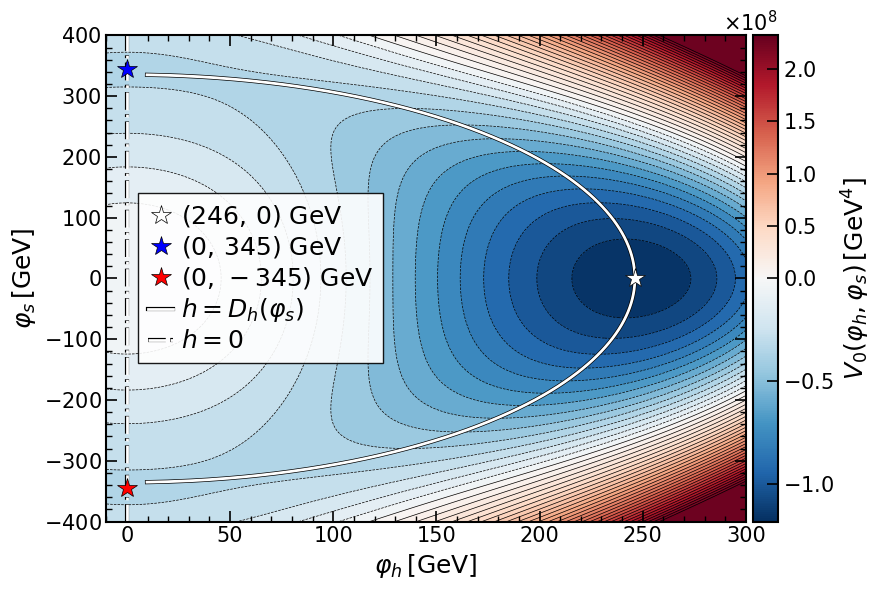

In [40]:
# Set the values of h & s 
hmin, hmax = (-10, 300)
smin, smax = (-400, 400)

# Create the Paths 
s_path  = np.linspace(smin, smax, 1000)
h_zeros = np.zeros_like(s_path)
h_plus  = np.full_like(s_path, np.nan)
h_minus = np.full_like(s_path, np.nan)

radicand = -s_path**2 * lHS + 2*muH2 - 2*s_path*muHS
valid = radicand >= 0
h_plus[valid]  =  np.sqrt(radicand[valid]) / (np.sqrt(2) * np.sqrt(lH))
h_minus[valid] = -np.sqrt(radicand[valid]) / (np.sqrt(2) * np.sqrt(lH))

# Potential Grid 
h_vals = np.linspace(hmin, hmax, 1000)
s_vals = np.linspace(smin, smax, 1000)
H, S   = np.meshgrid(h_vals, s_vals)
X_grid = np.column_stack([H.ravel(), S.ravel()])
V_grid = model.V0(X_grid).reshape(H.shape)
V_plot = np.clip(V_grid, np.percentile(V_grid, 0), np.percentile(V_grid, 99))
V_shifted = V_plot - model.V0(np.array([[0.0, 0.0]]))

# Normalize the cmap
norm = TwoSlopeNorm(vcenter=0, vmin=V_shifted.min(), vmax=V_shifted.max()) # Normalize(vmin=V_shifted.min(), vmax=V_shifted.max())
sm   = ScalarMappable(cmap='RdBu_r', norm=norm)

# Create the Figure
fig, ax = plt.subplots(figsize=(9, 6))

cp = ax.contourf(H, S, V_shifted, levels=50, cmap='RdBu_r', norm=norm)
ax.contour(H, S, V_shifted, levels=50, colors='k', linewidths=0.5, alpha=1)
ax.plot(root_hp[-1], validX[-1], 'w*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'$({root_hp[-1]:.0f},\,{validX[-1]:.0f})$ GeV')
ax.plot(0, minima_roots[0], 'b*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'$({0},\,{minima_roots[0]:.0f})$ GeV')
ax.plot(0, minima_roots[1], 'r*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'$({0},\,{minima_roots[1]:.0f})$ GeV')
ax.plot(h_plus, s_path, label=r'$h=D_h(\varphi_s)$', color='w', lw=2, ls='-', path_effects=[pe.Stroke(linewidth=3, foreground='black'), pe.Normal()])
ax.plot(h_zeros, s_path, label=r'$h=0$', color='w', lw=2, ls='-.', path_effects=[pe.Stroke(linewidth=3, foreground='black'), pe.Normal()])

# Make it Pretty
ax.set_xlabel(r'$\varphi_h \, [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\varphi_s \, [\mathrm{GeV}]$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1,   labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$V_{0}(\varphi_h,\varphi_s) \, [\mathrm{GeV^4}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)
cbar.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
cbar.ax.yaxis.get_offset_text().set_fontsize(15)
plt.ticklabel_format(style='sci', axis='y', scilimits=(-2,3))
for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

ax.legend(fontsize=18, frameon=True, fancybox=False, loc = "center left", bbox_to_anchor=(0.03, 0.5),ncol = 1, edgecolor="black", framealpha=0.9, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

#plt.title(r"Tree Level at T=0", loc='left', fontsize=20, fontweight='bold')
plt.tight_layout()
plt.savefig(f"Figures/TL/{m2:.4f}_{th:.4f}_{lHS:.4f}_{lS:.4f}_{mu3:.4f}.pdf", format="pdf", bbox_inches="tight")
plt.show()

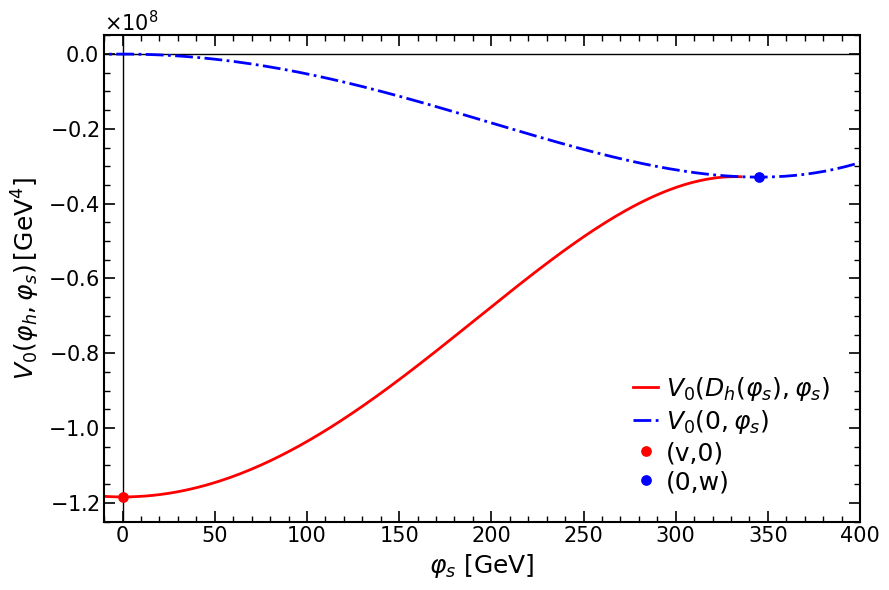

In [50]:
# Potential allong paths
sp = (-muHS+(2*lHS*muH2+muHS**2)**0.5)/(lHS)
sm = (-muHS-(2*lHS*muH2+muHS**2)**0.5)/(lHS)
SPath = np.linspace(sm,sp,500)
SPath0 = np.linspace(smin-500,smax+500,1000)

Vs0 = mu13*SPath0-0.5*muS2*SPath0**2-mu3/3*SPath0**3+lS/4*SPath0**4

Vs = (-(muH2**2)/(4*lH)
      + SPath*((muH2*muHS)/(2*lH) + mu13)
      - SPath**2*(-12*lHS*muH2 + 12*muHS**2 + 24*lH*muS2)/(48*lH)
      - SPath**3*(16*lH*mu3 + 12*lHS*muHS)/(48*lH)        
      - SPath**4*(3*lHS**2 - 12*lH*lS)/(48*lH))

# Create the plot
fig, ax = plt.subplots(figsize=(9, 6))
ax.axhline(0, color='k', lw=1, ls='-')
ax.axvline(0, color='k', lw=1, ls='-')

ax.plot(SPath, Vs, label=r'$V_{0}\left(D_h(\varphi_s),\varphi_s\right)$', color='r', lw=2, ls='-')
ax.plot(SPath0, Vs0, label=r'$V_{0}\left(0,\varphi_s\right)$', color='b', lw=2, ls='-.')
ax.plot(0, model.V0(np.array([[v, 0.0]])), ls='', marker='o', color='r', ms=6.7, label=r'(v,0)')
ax.plot(w, model.V0(np.array([[0.0, w]])), ls='', marker='o', color='b', ms=6.7, label=r'(0,w)')


ax.set_xlim(-10, 400)
ax.set_ylim(-1.25e8, 0.05e8)

ax.set_xlabel(r'$\varphi_s$ $\left[\mathrm{GeV}\right]$', fontsize=18)
ax.set_ylabel(r'$V_{0}(\varphi_h,\varphi_s) \, [\mathrm{GeV^4}]$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.spines['top'].set_linewidth(1.5)
ax.spines['right'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in', length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()
#ax.tick_params(axis='x', which='major', pad=6.7)

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig(f"Figures/TL_Path/{m2:.4f}_{th:.4f}_{lHS:.4f}_{lS:.4f}_{mu3:.4f}.pdf", format="pdf", bbox_inches="tight")
plt.show()

### Coleman-Weinberg Potential

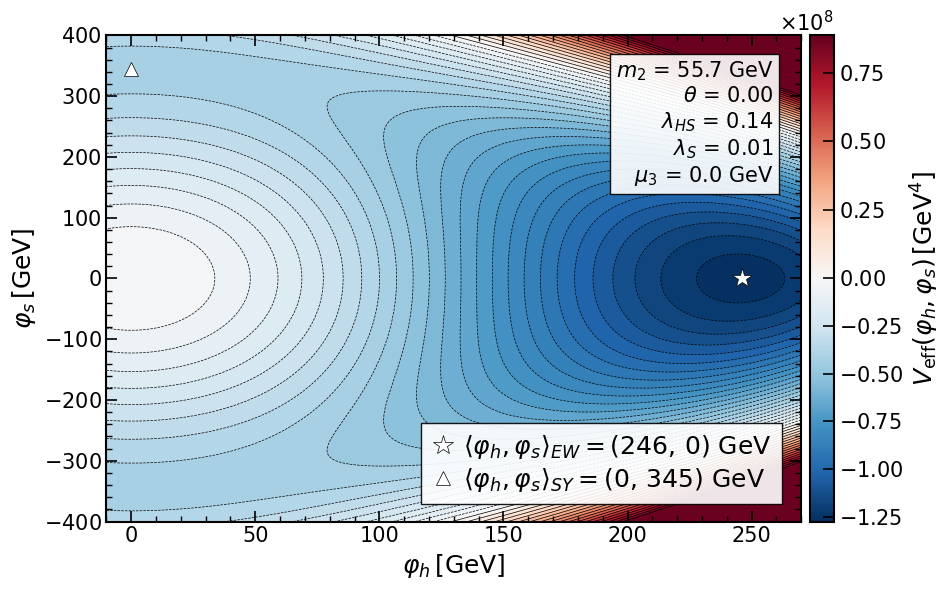

In [96]:
# Grid in (h, s)
h_vals = np.linspace(-10, 270, 500)
s_vals = np.linspace(-400, 400, 500)
H, S   = np.meshgrid(h_vals, s_vals)
X_grid = np.column_stack([H.ravel(), S.ravel()])
V_grid = model.Vtot(X_grid, 0.0).reshape(H.shape)
V_plot = np.clip(V_grid, np.percentile(V_grid, 0), np.percentile(V_grid, 97))
V_shifted = V_plot - model.Vtot(np.array([[0.0, 0.0]]), 0.0)

norm = TwoSlopeNorm(vcenter=0, vmin=V_shifted.min(), vmax=V_shifted.max()) # Normalize(vmin=V_shifted.min(), vmax=V_shifted.max())
sm   = ScalarMappable(cmap='RdBu_r', norm=norm)

fig, ax = plt.subplots(figsize=(9.71, 6))

cp = ax.contourf(H, S, V_shifted, levels=50, cmap='RdBu_r', norm=norm)
ax.contour(H, S, V_shifted, levels=50, colors='k', linewidths=0.5, alpha=1)
ax.plot(v, 0, 'w*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'$\langle\varphi_h, \varphi_s\rangle_{{EW}} = ({v:.0f},\,{0:.0f})$ GeV')
ax.plot(0, -w, 'w^', markersize=10, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'$\langle\varphi_h, \varphi_s\rangle_{{SY}} = ({0:.0f},\,{-w:.0f})$ GeV')

ax.set_xlabel(r'$\varphi_h \, [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\varphi_s \, [\mathrm{GeV}]$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1,   labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$V_\mathrm{eff}(\varphi_h,\varphi_s) \, [\mathrm{GeV^4}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)
cbar.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
cbar.ax.yaxis.get_offset_text().set_fontsize(15)
plt.ticklabel_format(style='sci', axis='y', scilimits=(-2,3))
for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

ax.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0.9, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

annotation = rf'$m_2$ = {m2:.1f} GeV' '\n' rf'$\theta$ = {th:.2f}' '\n' rf'$\lambda_{{HS}}$ = {lHS:.2f}' '\n' rf'$\lambda_{{S}}$ = {lS:.2f}' '\n' rf'$\mu_3$ = {mu3:.1f} GeV'
ax.text(0.96, 0.95, annotation, transform=ax.transAxes, fontsize=15,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(facecolor='white', edgecolor='black', alpha=0.9))

plt.tight_layout()
plt.savefig(f"Figures/CW/{m2:.4f}_{th:.4f}_{lHS:.4f}_{lS:.4f}_{mu3:.4f}.pdf", format="pdf", bbox_inches="tight")
plt.show()

### Phase Transitions

In [52]:
trans = model.calcTcTrans()
Tc   = trans[0]['Tcrit']
high = trans[0]['high_vev']
low  = trans[0]['low_vev']
xi_c = abs(low[0] - high[0]) / Tc
print(f"Tc = {Tc:.4f} GeV  |  xi_c = {xi_c:.2f}")

Tracing phase starting at x = [ 2.46219999e+02 -5.93637410e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................................................................
Tracing phase starting at x = [167.1761498   38.57374985] ; t = 128.76767818995384
Tracing minimum down
traceMinimum t0 = 128.768
.................................................................................................................................
Tracing minimum up
traceMinimum t0 = 128.768
.............................................................................................................................
Tracing phase starting at x = [-1.35661795e-05  1.67083117e+02] ; t = 129.70807749985983
Tracing minimum down
traceMinimum t0 = 129.708
.........................
Tracing minimum up
traceMinimum t0 = 129.708
......................................
Tc = 129.2945 GeV  |  xi_c = 1.02


In [53]:
# Compute the rest
trans = model.findAllTransitions()
print()
print("The Model has",len(model.TnTrans),"transition(s)")

if len(model.TnTrans) != 0:
    Trans = model.TnTrans[0]

    Tc    = Trans['crit_trans']['Tcrit']
    highc = Trans['crit_trans']['high_vev']
    lowc  = Trans['crit_trans']['low_vev']
    xic   = abs(lowc[0] - highc[0]) / Tc
    Tn    = Trans['Tnuc']
    highn = Trans['high_vev']
    lown  = Trans['low_vev']
    xin   = abs(lown[0] - highn[0]) / Tc

    print(f"Tc = {Tc:.4f} GeV  |  xi_c = {xi_c:.2f}")

Tunneling from phase 2 to phase 0 at T=128.1268
high_vev = [-2.13981270e-03  1.67351689e+02]
low_vev = [1.72997240e+02 1.30265313e-05]
Path deformation converged. 47 steps. fRatio = 1.24491e-02
Path deformation converged. 19 steps. fRatio = 1.61070e-02
Path deformation converged. 1 steps. fRatio = 6.04308e-02
Tunneling from phase 2 to phase 0 at T=128.1273
high_vev = [-2.10947299e-03  1.67351610e+02]
low_vev = [ 1.72996156e+02 -2.03607208e-05]
Path deformation converged. 47 steps. fRatio = 1.24483e-02
Path deformation converged. 19 steps. fRatio = 1.63794e-02
Path deformation converged. 1 steps. fRatio = 6.06798e-02
Tunneling from phase 2 to phase 1 at T=128.7927
high_vev = [-1.52070327e-05  1.67239876e+02]
low_vev = [165.88625195  43.54414265]
Path deformation converged. 24 steps. fRatio = 1.97533e-02
Path deformation converged. 17 steps. fRatio = 1.30625e-02
Path deformation converged. 4 steps. fRatio = 1.82300e-02
Path deformation converged. 1 steps. fRatio = 2.42917e-03
Tunneling f

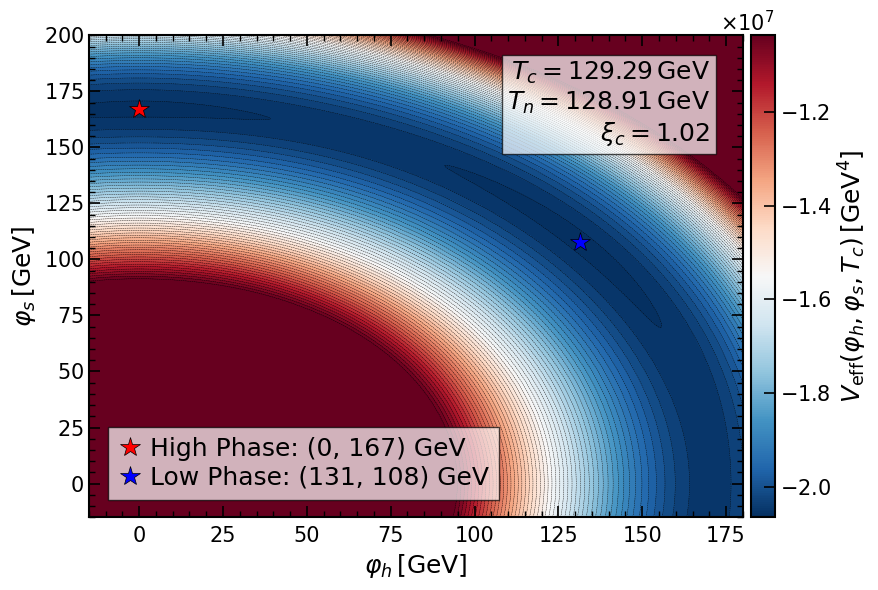

In [58]:
# Grid in (h, s)
h_vals = np.linspace(-15, 180, 500)
s_vals = np.linspace(-15, 200, 500)
H, S   = np.meshgrid(h_vals, s_vals)
X_grid = np.column_stack([H.ravel(), S.ravel()])
V_grid = model.Vtot(X_grid, Tc).reshape(H.shape)
V_plot = np.clip(V_grid, np.percentile(V_grid, 0), np.percentile(V_grid, 70))
V_shifted = V_plot - model.Vtot(np.array([[0.0, 0.0]]), Tc)

norm = Normalize(vmin=V_shifted.min(), vmax=V_shifted.max())
sm   = ScalarMappable(cmap='RdBu_r', norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))

cp = ax.contourf(H, S, V_shifted, levels=55, cmap='RdBu_r', norm=norm)
ax.contour(H, S, V_shifted, levels=55, colors='k', linewidths=0.3, alpha=1)

ax.plot(high[0], high[1], 'r*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'High Phase: ({-high[0]:.0f}, {high[1]:.0f}) GeV')
ax.plot(low[0], low[1], 'b*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'Low Phase: ({low[0]:.0f}, {low[1]:.0f}) GeV')

ax.set_xlabel(r'$\varphi_h \, [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\varphi_s \, [\mathrm{GeV}]$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1,   labelsize=15, top=True, right=True)
ax.minorticks_on()
ax.tick_params(axis='x', which='major', pad=6.7)

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$V_\mathrm{eff}(\varphi_h,\varphi_s,T_c) \, [\mathrm{GeV^4}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)
cbar.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
cbar.ax.yaxis.get_offset_text().set_fontsize(15)
plt.ticklabel_format(style='sci', axis='y', scilimits=(-2,3))
for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

ax.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower left", bbox_to_anchor=(0.01, 0.01), 
          ncol = 1, edgecolor="black", framealpha=0.7, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

annotation = (rf"$T_c = {Tc:.2f} \, \mathrm{{GeV}}$"
              "\n"rf"$T_n = {Tn:.2f} \, \mathrm{{GeV}}$"
              "\n"rf"$\xi_c = {xi_c:.2f}$")
ax.text(0.95, 0.95, annotation,transform=ax.transAxes,fontsize=18,verticalalignment='top',horizontalalignment='right',
       bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

plt.tight_layout()
plt.savefig(f"Figures/PT/{m2:.4f}_{th:.4f}_{lHS:.4f}_{lS:.4f}_{mu3:.4f}.pdf", format="pdf", bbox_inches="tight")
plt.show()

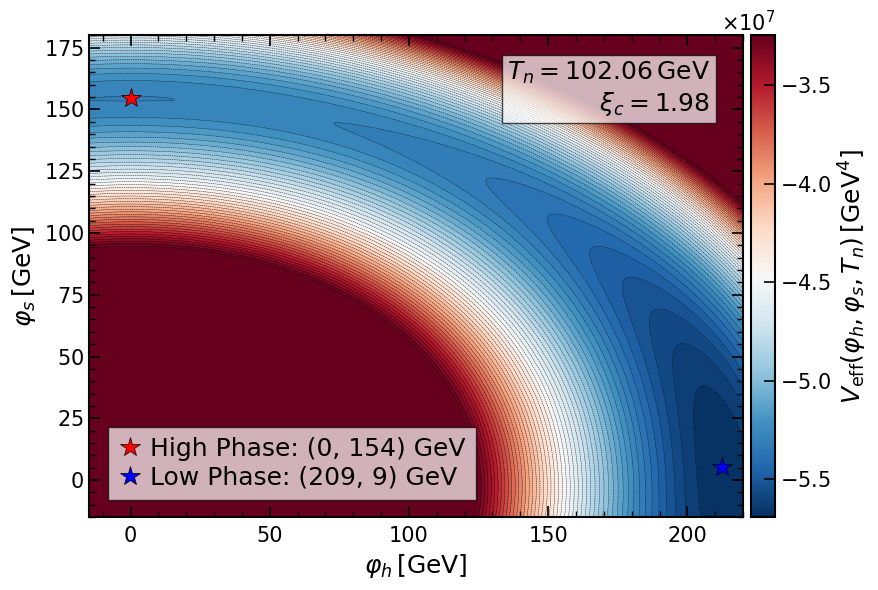

In [35]:
# Grid in (h, s)
h_vals = np.linspace(-15, 220, 500)
s_vals = np.linspace(-15, 180, 500)
H, S   = np.meshgrid(h_vals, s_vals)
X_grid = np.column_stack([H.ravel(), S.ravel()])
V_grid = model.Vtot(X_grid, Tn).reshape(H.shape)
V_plot = np.clip(V_grid, np.percentile(V_grid, 0), np.percentile(V_grid, 65))
V_shifted = V_plot - model.Vtot(np.array([[0.0, 0.0]]), Tn)

norm = Normalize(vmin=V_shifted.min(), vmax=V_shifted.max())
sm   = ScalarMappable(cmap='RdBu_r', norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))

cp = ax.contourf(H, S, V_shifted, levels=55, cmap='RdBu_r', norm=norm)
ax.contour(H, S, V_shifted, levels=55, colors='k', linewidths=0.3, alpha=1)

ax.plot(highn[0], highn[1], 'r*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'High Phase: ({high[0]:.0f}, {high[1]:.0f}) GeV')
ax.plot(lown[0], lown[1], 'b*', markersize=15, zorder=5, markeredgecolor='k', markeredgewidth=0.5,
        label=rf'Low Phase: ({low[0]:.0f}, {low[1]:.0f}) GeV')

ax.set_xlabel(r'$\varphi_h \, [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\varphi_s \, [\mathrm{GeV}]$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1,   labelsize=15, top=True, right=True)
ax.minorticks_on()
ax.tick_params(axis='x', which='major', pad=6.7)

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$V_\mathrm{eff}(\varphi_h,\varphi_s,T_n) \, [\mathrm{GeV^4}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)
cbar.ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
cbar.ax.yaxis.get_offset_text().set_fontsize(15)
plt.ticklabel_format(style='sci', axis='y', scilimits=(-2,3))
for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

ax.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower left", bbox_to_anchor=(0.01, 0.01), 
          ncol = 1, edgecolor="black", framealpha=0.7, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

annotation = (rf"$T_n = {Tn:.2f}\, \mathrm{{GeV}}$"
              "\n"rf"$\xi_c = {xi_c:.2f}$")
ax.text(0.95, 0.95, annotation,transform=ax.transAxes,fontsize=18,verticalalignment='top',horizontalalignment='right',
       bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

plt.tight_layout()
plt.savefig(f"Figures/PT/Tn_{m2:.4f}_{th:.4f}_{lHS:.4f}_{lS:.4f}_{mu3:.4f}.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [79]:
phases = model.getPhases()

Tracing phase starting at x = [2.46220000e+02 1.54197219e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................................................................................................................................................................
Tracing phase starting at x = [ 1.89571529e-06 -3.09079336e+02] ; t = 145.8746285965406
Tracing minimum down
traceMinimum t0 = 145.875
.........................................................................................................
Tracing minimum up
traceMinimum t0 = 145.875
..........................................................................................
Tracing phase starting at x = [ 2.50022891e-06 -3.45304699e+02] ; t = 17.01110996894388
Tracing minimum down
traceMinimum t0 = 17.0111
....................................
Tracing minimum up
traceMinimum t0 = 17.0111
.....................................................................................................

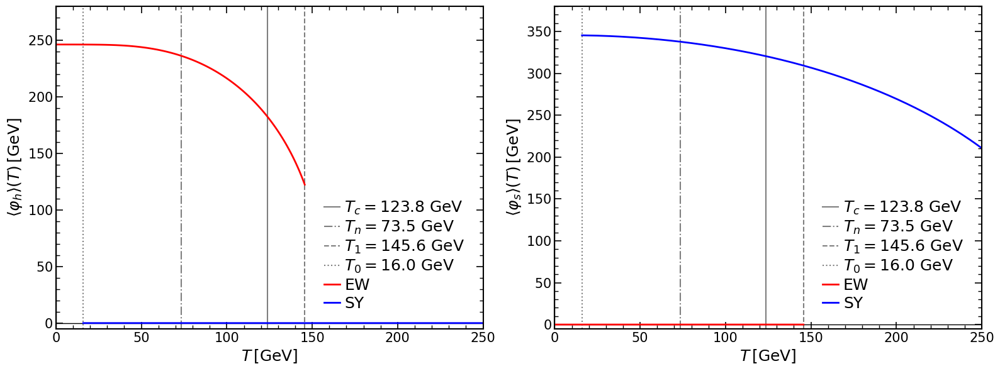

In [94]:
T_sym = phases[2].T
X_sym = phases[2].X

T_brk = phases[0].T
X_brk = phases[0].X

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

vevs = [r'\langle\varphi_h\rangle',r'\langle\varphi_s\rangle']

for i in range(len(ax)):
    ax[i].axhline(0, color='k', lw=1, ls='-')
    ax[i].axvline(0, color='k', lw=1, ls='-')

    ax[i].axvline(Tc, label=rf'$T_c={Tc:.1f}$ GeV', color='k', lw=1.5, ls='-', alpha=0.5)
    ax[i].axvline(Tn, label=rf'$T_n={Tn:.1f}$ GeV', color='k', lw=1.5, ls='-.', alpha=0.5)
    ax[i].axvline(T_brk[-1], label=rf'$T_1={T_brk[-1]:.1f}$ GeV', color='k', lw=1.5, ls='--', alpha=0.5)
    ax[i].axvline(T_sym[0], label=rf'$T_0={T_sym[0]:.1f}$ GeV', color='k', lw=1.5, ls=':', alpha=0.5)

    ax[i].set_xlabel(r'$T \, [\mathrm{GeV}]$', fontsize=18)
    ax[i].set_ylabel(rf'${vevs[i]}(T) \, [\mathrm{{GeV}}] $', fontsize=18)
    ax[i].yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax[i].ticklabel_format(style='sci', axis='y', scilimits=(-2, 3))
    ax[i].yaxis.get_offset_text().set_fontsize(15)
    ax[i].spines['top'].set_linewidth(1.5)
    ax[i].spines['right'].set_linewidth(1.5)
    ax[i].spines['bottom'].set_linewidth(1.5)
    ax[i].spines['left'].set_linewidth(1.5)

    ax[i].tick_params(axis='both', which='major', direction='in', length=8, width=1.2, labelsize=15, top=True, right=True)
    ax[i].tick_params(axis='both', which='minor', direction='in', length=4, width=1, labelsize=15, top=True, right=True)
    ax[i].minorticks_on()

ax[0].plot(T_brk, X_brk[:, 0], label=rf'EW', color='r', lw=2, ls='-')
ax[0].plot(T_sym, X_sym[:, 0], label=rf'SY', color='b', lw=2, ls='-')

ax[1].plot(T_brk, X_brk[:, 1], label=rf'EW', color='r', lw=2, ls='-')
ax[1].plot(T_sym, -X_sym[:, 1], label=rf'SY', color='b', lw=2, ls='-')

ax[0].set_xlim(0, 250)
ax[1].set_xlim(0, 250)
ax[0].set_ylim(-5, 280)
ax[1].set_ylim(-5, 380)

ax[0].legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
            ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)
    
ax[1].legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
                ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig(f"Figures/TVEVS/{m2:.4f}_{th:.4f}_{lHS:.4f}_{lS:.4f}_{mu3:.4f}.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Parameter Scan: $Z_2$ model

### Perform the Scan

In [36]:
FIXED = dict(m1=125, th=0.0, v0=246.22, mu3=0.0)

def build_grid_Z2(n_m2=6, n_lHS=6, n_lS=6, floor=1e-8):
    m2_vals  = np.linspace(5,  10, n_m2)
    lHS_vals = np.geomspace(1e-3, 1e-2, n_lHS)

    points = []
    for m2 in m2_vals:
        for lHS in lHS_vals:
            lSmin = (lHS*FIXED['v0']**2 - 2*m2**2)**2 / (2*FIXED['v0']**2*FIXED['m1']**2)
            lSmin = max(lSmin, floor) # If lSmin is to small set it to floor

            if lSmin >= 1:
                continue # Skip this

            lS_vals = np.geomspace(lSmin, 1, n_lS)
            for lS in lS_vals:
                points.append((m2, lHS, lS))

    return points

In [25]:
def scan_point_Z2(params):
    m2, lHS, lS = params
    m1, th, v0, mu3 = FIXED['m1'], FIXED['th'], FIXED['v0'], FIXED['mu3']

    result = {
        'm1': m1, 'm2': m2, 'th': th, 'v0': v0, 'lHS': lHS, 'lS': lS, 'mu3': mu3,
        'Tc': np.nan, 'xi_c': np.nan,
        'status': 'unknown', 'error_msg': ''
    }

    try:
        LParams = physical_to_lagrangian(m1=m1, m2=m2, theta=th, v=v0, lHS=lHS, lS=lS, mu3=mu3)
        model = RxSM(**{k: LParams[k] for k in ['lH','lHS','muHS','lS','mu3','muS2']})
        v, w = model.v_os, model.w_os

        Vv = model.Vtot(np.array([[v, 0.0]]), 0.0)
        Vw = model.Vtot(np.array([[0.0, w]]), 0.0)
        if Vv[0] >= Vw[0]:
            result['status'] = 'meta_stable'
            return result

        model.Tmax = 250
        trans = model.calcTcTrans()
        if len(trans) == 0:
            result['status'] = 'no_transition'
            return result

        Tc   = trans[0]['Tcrit']
        high = trans[0]['high_vev']
        low  = trans[0]['low_vev']
        result['Tc']     = Tc
        result['xi_c']   = abs(low[0] - high[0]) / Tc
        result['status'] = 'success'
        return result

    except Exception as e:
        result['status']    = 'error'
        result['error_msg'] = f"{type(e).__name__}: {e}"
        return result

In [26]:
import signal

class TimeoutException(Exception):
    pass

def _timeout_handler(signum, frame):
    raise TimeoutException("Computation exceeded time limit")

def scan_point_Z2(params, timeout=100):
    m2, lHS, lS = params
    m1, th, v0, mu3 = FIXED['m1'], FIXED['th'], FIXED['v0'], FIXED['mu3']

    result = {
        'm1': m1, 'm2': m2, 'th': th, 'v0': v0, 'lHS': lHS, 'lS': lS, 'mu3': mu3,
        'Tc': np.nan, 'xi_c': np.nan,
        'status': 'unknown', 'error_msg': ''
    }

    # set the alarm
    old_handler = signal.signal(signal.SIGALRM, _timeout_handler)
    signal.alarm(timeout)

    try:
        LParams = physical_to_lagrangian(m1=m1, m2=m2, theta=th, v=v0, lHS=lHS, lS=lS, mu3=mu3)
        model = RxSM(**{k: LParams[k] for k in ['lH','lHS','muHS','lS','mu3','muS2']})
        v, w = model.v_os, model.w_os

        Vv = model.Vtot(np.array([[v, 0.0]]), 0.0)
        Vw = model.Vtot(np.array([[0.0, w]]), 0.0)
        if Vv[0] >= Vw[0]:
            result['status'] = 'meta_stable'
            return result

        model.Tmax = 250
        trans = model.calcTcTrans()
        if len(trans) == 0:
            result['status'] = 'no_transition'
            return result

        Tc   = trans[0]['Tcrit']
        high = trans[0]['high_vev']
        low  = trans[0]['low_vev']
        result['Tc']     = Tc
        result['xi_c']   = abs(low[0] - high[0]) / Tc
        result['status'] = 'success'
        return result

    except TimeoutException as e:
        result['status']    = 'timeout'
        result['error_msg'] = str(e)
        return result

    except Exception as e:
        result['status']    = 'error'
        result['error_msg'] = f"{type(e).__name__}: {e}"
        return result

    finally:
        # always cancel the alarm and restore the previous handler
        signal.alarm(0)
        signal.signal(signal.SIGALRM, old_handler)

In [27]:
def run_scan(points, output_csv='Z2_scan.csv', n_workers=-1, checkpoint_every=50):
    if os.path.exists(output_csv):
        existing = pd.read_csv(output_csv)
        done = set(zip(existing['m2'].round(8), existing['lHS'].round(8), existing['lS'].round(8)))
        before = len(points)
        points = [p for p in points if (round(p[0],8), round(p[1],8), round(p[2],8)) not in done]
        print(f"Resuming: {before - len(points)} points already done, {len(points)} remaining.")

    write_header = not os.path.exists(output_csv)
    buffer = []

    parallel = Parallel(n_jobs=n_workers, return_as="generator")
    results_gen = parallel(delayed(scan_point_Z2)(p) for p in points)

    for res in tqdm(results_gen, total=len(points)):
        buffer.append(res)
        if len(buffer) >= checkpoint_every:
            pd.DataFrame(buffer).to_csv(output_csv, mode='a', header=write_header, index=False)
            write_header = False
            buffer = []

    if buffer:
        pd.DataFrame(buffer).to_csv(output_csv, mode='a', header=write_header, index=False)

    return pd.read_csv(output_csv)

In [37]:
points = build_grid_Z2(n_m2=5, n_lHS=15, n_lS=15)
df = run_scan(points, output_csv='Z2_Scan.csv', checkpoint_every=100)
df['status'].value_counts()

Resuming: 285 points already done, 840 remaining.


  0%|          | 0/840 [00:00<?, ?it/s]

Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x =. [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
.Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum upTracing phase starting at x = 
traceMinimum t0 = 0
[ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Tracing phase starting at x = [ 2.46220000e+02 -1.36158431e-05] ; t = 0.0
Tracing

status
success          17564
no_transition      971
meta_stable        483
error              387
timeout             35
Name: count, dtype: int64

### Plot the Results

In [4]:
Data = pd.read_csv('Z2_Scan.csv')

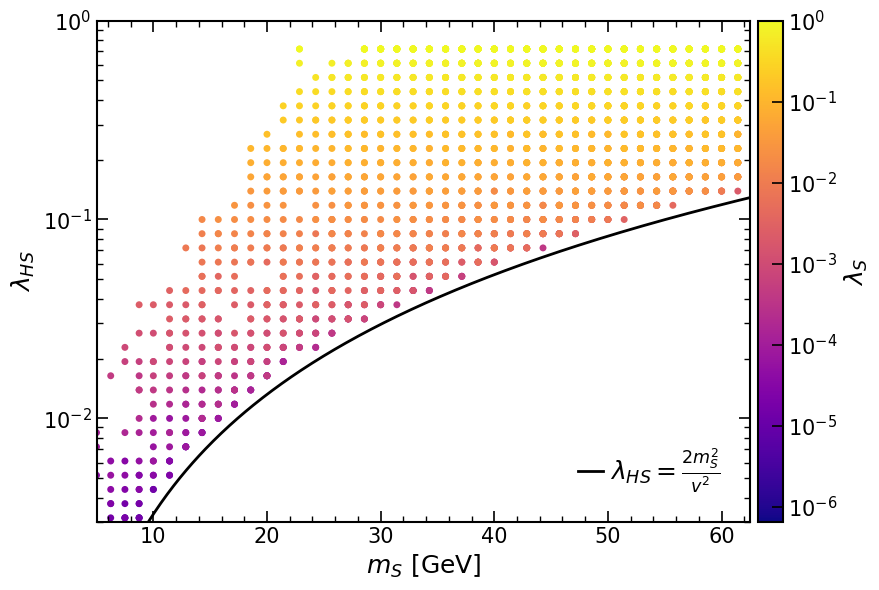

In [39]:
df = Data[(Data.xi_c > 1)&(Data.m2 < 125/2)]

# lHS curve
mS = np.linspace(0,70, 500)
a2 = 2*mS**2/246.22**2

cmap = plt.cm.plasma
norm = LogNorm(vmin=df['lS'].min(), vmax=df['lS'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))

ax.scatter(df['m2'], df['lHS'], c=df['lS'], cmap=cmap, norm=norm,
                 s=25, alpha=1, edgecolors='None')
ax.plot(mS, a2, label=r'$\lambda_{HS}=\frac{2m_S^2}{v^2}$', ls='-', c='k', lw=2)

ax.set_xlabel(r'$m_S \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$\lambda_S$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

# Log-scale colorbar ticks
cbar.ax.yaxis.set_major_locator(LogLocator(base=10))
cbar.ax.yaxis.set_major_formatter(LogFormatterSciNotation())
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10, subs=np.arange(2, 10)*0.1))

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)
cbar.ax.minorticks_off()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Scan_m2-lHS.pdf", format="pdf", bbox_inches="tight")
plt.show()

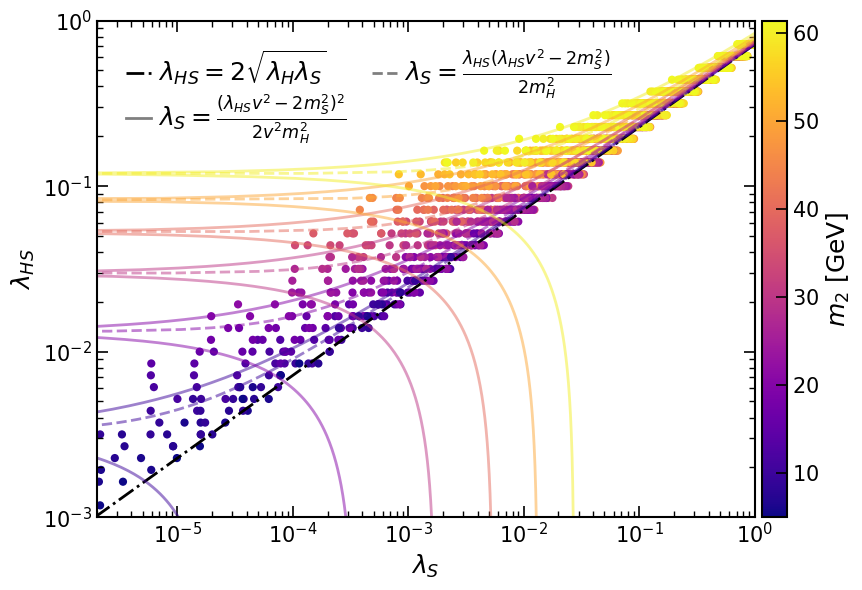

In [40]:
df = Data[(Data.xi_c > 1)&(Data.m2 < 125/2)]

cmap = plt.cm.plasma
norm = Normalize(vmin=df['m2'].min(), vmax=df['m2'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))


# SM values (adjust if you're using different fixed values)
m1 = 125.20  # GeV
v0 = 246.22   # GeV
lH = 0.5*m1**2/v0**2

def lS_min(lHS, m2):
    return (lHS * v0**2 - 2 * m2**2)**2 / (2 * v0**2 * m1**2)

def lS_JM(lHS, m2):
    return (lHS * (lHS*v0**2 - 2 * m2**2)) / (2 * m1**2)

lHS_vals = np.geomspace(1e-3, 1e0, 300)
LSCrit   = lHS_vals**2/(4*lH)
ax.plot(LSCrit, lHS_vals, c='k', lw=2, ls='-.')

m2_lines = [10, 20, 30, 40, 50, 60]

for m2_i in m2_lines:
    lS_curve = lS_min(lHS_vals, m2_i)
    lSJM_curve = lS_JM(lHS_vals, m2_i)
    ax.plot(lS_curve, lHS_vals, color=cmap(norm(m2_i)), alpha=0.5, linewidth=2)
    ax.plot(lSJM_curve, lHS_vals, color=cmap(norm(m2_i)), alpha=0.5, linewidth=2, ls='--')

sc = ax.scatter(df['lS'], df['lHS'], c=df['m2'], cmap=cmap, norm=norm,
                 s=35, alpha=1, edgecolors='None')

ax.set_xlabel(r'$\lambda_S$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_xlim(2e-6, 1e0)
ax.set_ylim(1e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$m_2\ [\mathrm{GeV}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((-2, 3))
cbar.ax.yaxis.set_major_formatter(fmt)
cbar.ax.yaxis.get_offset_text().set_fontsize(15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

handles_list = [mlines.Line2D([], [], color='k', linestyle='-.', linewidth=2, alpha=1, label=r"$\lambda_{HS}=2\sqrt{\lambda_H \lambda_S}$"),
                mlines.Line2D([], [], color='k', linestyle='-', linewidth=2, alpha=0.5, label=r"$\lambda_S=\frac{(\lambda_{HS}v^2 - 2m_S^2)^2}{2v^2m_H^2}$"),
                mlines.Line2D([], [], color='k', linestyle='--', linewidth=2, alpha=0.5, label=r"$\lambda_S=\frac{\lambda_{HS}(\lambda_{HS}v^2 - 2m_S^2)}{2m_H^2}$")]

plt.legend(handles=handles_list, fontsize=18, frameon=True, fancybox=False, loc = "upper left", bbox_to_anchor=(0.01, 0.99),
               ncol = 2, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Scan_lS-lHS.pdf", format="pdf", bbox_inches="tight")
plt.show()

### Compute $T_n$

In [41]:
Data = pd.read_csv('Z2_Scan.csv')
Data.columns

Index(['m1', 'm2', 'th', 'v0', 'lHS', 'lS', 'mu3', 'Tc', 'xi_c', 'status',
       'error_msg'],
      dtype='object')

In [42]:
candidates = Data[(Data.xi_c>0.9)]
candidates['status'].value_counts()

status
success    2861
Name: count, dtype: int64

In [43]:
def get_candidates(DF):
    candidates = Data[(Data.xi_c>0.9)]
    points = []

    for i in range(len(candidates)):

        candidate = candidates.iloc[i]
        m1  = candidate['m1']
        m2  = candidate['m2']
        th  = candidate['th']
        v0  = candidate['v0']
        lHS = candidate['lHS']
        lS  = candidate['lS']
        mu3 = candidate['mu3']

        points.append((m1, m2, th, v0, lHS, lS, mu3))
    
    return points

In [47]:
def scan_point_nucleation_old(params):
    m1, m2, th, v0, lHS, lS, mu3 = params

    result = {
        'm1': m1, 'm2': m2, 'th': th, 'v0': v0, 'lHS': lHS, 'lS': lS, 'mu3': mu3,
        'Tc': np.nan, 'xic': np.nan,
        'Tc_Test' : np.nan, 'xic_Test' : np.nan, 'Tn' : np.nan,
        'status': 'unknown', 'error_msg': ''
    }

    LParams = physical_to_lagrangian(m1=m1, m2=m2, theta=th, v=v0, lHS=lHS, lS=lS, mu3=mu3)
    model = RxSM(**{k: LParams[k] for k in ['lH','lHS','muHS','lS','mu3','muS2']})
    model.Tmax = 250

    v, w = model.v_os, model.w_os
    Vv = model.Vtot(np.array([[v, 0.0]]), 0.0)
    Vw = model.Vtot(np.array([[0.0, w]]), 0.0)
    if Vv[0] >= Vw[0]:
        result['status'] = 'meta_stable'
        return result
    
    try:
        trans = model.calcTcTrans()
        if len(trans) == 0:
            result['status'] = 'no_transition'
            return result

        high = trans[0]['high_vev']
        low  = trans[0]['low_vev']
        result['Tc']     = trans[0]['Tcrit']
        result['xic']   = abs(low[0] - high[0]) / (result['Tc'])
        result['status'] = 'FOPT'

        if result['xic'] > 0.9:
            model.findAllTransitions()
            if len(model.TnTrans)==0:
                result['status'] = 'Trapped_FOPT'
                return result
            
            Trans = model.TnTrans[0]

            Tc    = Trans['crit_trans']['Tcrit']
            highc = Trans['crit_trans']['high_vev']
            lowc  = Trans['crit_trans']['low_vev']
            xic   = abs(lowc[0] - highc[0]) / Tc
            Tn    = Trans['Tnuc']

            result['Tc_Test']  = Tc
            result['xic_Test'] = xic
            result['Tn']       = Tn
            result['status']   = 'Nucleation_FOPT'
            return result
        
        else:
            return result

    except Exception as e:
        result['status']    = 'error'
        result['error_msg'] = f"{type(e).__name__}: {e}"
        return result

In [48]:
import signal

class TimeoutError_(Exception):
    pass

def _timeout_handler(signum, frame):
    raise TimeoutError_("point timed out")

def scan_point_nucleation(params, timeout=30):
    m1, m2, th, v0, lHS, lS, mu3 = params

    result = {
        'm1': m1, 'm2': m2, 'th': th, 'v0': v0, 'lHS': lHS, 'lS': lS, 'mu3': mu3,
        'Tc': np.nan, 'xic': np.nan,
        'Tc_Test': np.nan, 'xic_Test': np.nan, 'Tn': np.nan,
        'status': 'unknown', 'error_msg': ''
    }

    old_handler = signal.signal(signal.SIGALRM, _timeout_handler)
    signal.alarm(timeout)

    try:
        LParams = physical_to_lagrangian(m1=m1, m2=m2, theta=th, v=v0, lHS=lHS, lS=lS, mu3=mu3)
        model = RxSM(**{k: LParams[k] for k in ['lH','lHS','muHS','lS','mu3','muS2']})
        model.Tmax = 250

        v, w = model.v_os, model.w_os
        Vv = model.Vtot(np.array([[v, 0.0]]), 0.0)
        Vw = model.Vtot(np.array([[0.0, w]]), 0.0)
        if Vv[0] >= Vw[0]:
            result['status'] = 'meta_stable'
            return result

        trans = model.calcTcTrans()
        if len(trans) == 0:
            result['status'] = 'no_transition'
            return result

        high = trans[0]['high_vev']
        low  = trans[0]['low_vev']
        result['Tc']   = trans[0]['Tcrit']
        result['xic']  = abs(low[0] - high[0]) / result['Tc']
        result['status'] = 'FOPT'

        if result['xic'] > 0.9:
            model.findAllTransitions()
            if len(model.TnTrans) == 0:
                result['status'] = 'Trapped_FOPT'
                return result

            Trans = model.TnTrans[0]
            Tc    = Trans['crit_trans']['Tcrit']
            highc = Trans['crit_trans']['high_vev']
            lowc  = Trans['crit_trans']['low_vev']

            result['Tc_Test']  = Tc
            result['xic_Test'] = abs(lowc[0] - highc[0]) / Tc
            result['Tn']       = Trans['Tnuc']
            result['status']   = 'Nucleation_FOPT'
            return result

        return result

    except TimeoutError_:
        result['status'] = 'timeout'
        result['error_msg'] = f"exceeded {timeout}s"
        return result

    except Exception as e:
        result['status'] = 'error'
        result['error_msg'] = f"{type(e).__name__}: {e}"
        return result

    finally:
        signal.alarm(0)
        signal.signal(signal.SIGALRM, old_handler)

In [49]:
def run_scan(points, output_csv='Z2_scan.csv', n_workers=-1, checkpoint_every=50):
    if os.path.exists(output_csv):
        existing = pd.read_csv(output_csv)
        key_cols = ['m1', 'm2', 'th', 'v0', 'lHS', 'lS', 'mu3']
        done = set(zip(*[existing[c].round(8) for c in key_cols]))
        before = len(points)
        points = [p for p in points if tuple(round(x, 8) for x in p) not in done]
        print(f"Resuming: {before - len(points)} points already done, {len(points)} remaining.")

    write_header = not os.path.exists(output_csv)
    buffer = []

    parallel = Parallel(n_jobs=n_workers, return_as="generator")
    results_gen = parallel(delayed(scan_point_nucleation)(p) for p in points)

    for res in tqdm(results_gen, total=len(points)):
        buffer.append(res)
        if len(buffer) >= checkpoint_every:
            pd.DataFrame(buffer).to_csv(output_csv, mode='a', header=write_header, index=False)
            write_header = False
            buffer = []

    if buffer:
        pd.DataFrame(buffer).to_csv(output_csv, mode='a', header=write_header, index=False)

    return pd.read_csv(output_csv)

In [50]:
points = get_candidates(Data)
df = run_scan(points, output_csv='Z2_Scan_Tn.csv', checkpoint_every=100)
df['status'].value_counts()

  0%|          | 0/2861 [00:00<?, ?it/s]

Tracing phase starting at x = [2.46220001e+02 2.45745799e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -9.36424195e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -2.47608608e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tracing phase starting at x = [ 2.46220000e+02 -2.47608608e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -5.97460083e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [ 2.46220000e+02 -5.25803781e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tracing phase starting at x = [2.46219999e+02 1.28639134e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tracing phase starting at x = [2.46220000e+02 1.91696151e-06] ; t = 0.0
Tracing minimum up
.traceMinimum t0 = 0
....Tracing phase starting at x = .[ 2.46220000e+02 -5.63153945e-06] ; t = 0.0
Tracing minimum

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 18 steps. fRatio = 9.62412e-03
.......Tunneling from phase 1 to phase 0 at T=91.56521
high_vev = [3.96689317e-06 2.63312640e+02]
low_vev = [2.23910006e+02 1.07404690e-05]
..Path deformation converged. 41 steps. fRatio = 1.66600e-02
.Path deformation converged. 15 steps. fRatio = 1.02164e-02
....Path deformation converged. 9 steps. fRatio = 1.25598e-02
...Tracing phase starting at x = [ 2.46220000e+02 -1.06736524e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 41 steps. fRatio = 1.80995e-02
.........Path deformation converged. 42 steps. fRatio = 1.46381e-02
..Path deformation converged. 15 steps. fRatio = 1.80591e-02
.Path deformation converged. 1 steps. fRatio = 9.38128e-03
Path deformation converged. 9 steps. fRatio = 9.97536e-03
...............Path deformation converged. 44 steps. fRatio = 1.85132e-02
....Path deformation converged. 16 steps. fRatio = 1.66350e-02
....Path deformation converged. 47 steps. fRatio = 1.86411e-02
...Tunneling from phase 2 to phase 0 at T=49.75561
high_vev = [5.17557612e-04 3.29217280e+02]
low_vev = [ 2.43896205e+02 -2.23710930e-05]
.......Path deformation converged. 8 steps. fRatio = 1.82802e-02
.....Path deformation converged. 15 steps. fRatio = 1.04952e-02
...Path deformation converged. 4 steps. fRatio = 7.73940e-04
...........Path deformation converged. 1 steps. fRatio = 2.10889e-02
...Path deformation converged. 17 steps. fRatio = 8.79160e-03
.....Path deformation converged. 1

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Path deformation converged. 1 steps. fRatio = 3.08460e-03
.....Tunneling from phase 2 to phase 0 at T=53.31915
high_vev = [-1.20152631e-03 -2.55115410e+02]
low_vev = [ 2.43083272e+02 -1.24491785e-05]
.......Path deformation converged. 1 steps. fRatio = 1.00765e-02
...Tunneling from phase 1 to phase 0 at T=97.67328
high_vev = .[2.69205314e-06 3.04755736e+02]
low_vev = [2.18576256e+02 1.77272434e-05]
Tunneling from phase 1 to phase 0 at T=78.6895
high_vev = [1.04382094e-04 2.15762525e+02]
low_vev = [ 2.32816939e+02 -1.17731977e-06]
............Tunneling from phase 1 to phase 0 at T=100.4303
high_vev = [-4.41979467e-06  3.29847458e+02]
low_vev = [ 2.15887463e+02 -8.27679377e-05]


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 14 steps. fRatio = 1.96407e-02
...Tracing phase starting at x = [ 2.46219999e+02 -3.42992570e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......................Path deformation converged. 9 steps. fRatio = 1.68010e-02
...................................Path deformation converged. 1 steps. fRatio = 1.28594e-02
...............Path deformation converged. 43 steps. fRatio = 1.88167e-02
..................

......Tunneling from phase 2 to phase 0 at T=44.77808
high_vev = [5.03942784e-04 3.61200370e+02]
low_vev = [ 2.44707366e+02 -2.31460593e-06]
........Tracing minimum up
traceMinimum t0 = 80.3024
...............Tracing phase starting at x = [-3.88871564e-06  2.00410361e+02] ; t = 76.5254398407472
Tracing minimum down
traceMinimum t0 = 76.5254
.....Path deformation converged. 40 steps. fRatio = 1.78005e-02
......................Path deformation converged. 18 steps. fRatio = 9.62236e-03
...................................................Path deformation co

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 1 to phase 0 at T=74.29494
high_vev = [-3.59498546e-04  2.02538997e+02]
low_vev = [2.35189826e+02 1.34944348e-05]
..Tracing phase starting at x =. [2.46219999e+02 6.45779605e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tunneling from phase 2 to phase 0 at T=51.87811
high_vev = [-9.94108131e-07  3.29085363e+02]
low_vev = [ 2.43480756e+02 -1.94147802e-05]
Tunneling from phase 1 to phase 0 at T=79.29694
high_vev = [1.22469249e-05 2.15716964e+02]
low_vev = [ 2.32444931e+02 -1.07695947e-05]
..Path deformation converged. 41 steps. fRatio = 1.73439e-02
........
................Tracing phase starting at x = [1.02370035e-05 1.78530246e+02] ; t = 73.8777151485751
Tracing minimum down
traceMinimum t0 = 73.8777
..........................................Path deformation converged. 18 steps. fRatio = 1.26205e-02
....................Path deformation converged. 41 steps. fRatio = 1.90997e-02
..........Path deformation converged. 5 steps. fRatio = 1.84474e-02
......Pa

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing phase starting at x = [ 2.46220000e+02 -5.95697253e-06] Path deformation converged. 8 steps. fRatio = 6.53878e-03
; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 42 steps. fRatio = 1.30047e-02
......Path deformation converged. 12 steps. fRatio = 1.26148e-02
......Path deformation converged. 1 steps. fRatio = 6.22503e-03
...............Path deformation converged. 1 steps. fRatio = 2.66677e-03
..Tunneling from phase 2 to phase 0 at T=47.51639
high_vev = [6.73920367e-05 3.61030149e+02]
low_vev = [ 2.44300228e+02 -7.29564621e-06].
..............
..Tunneling from phase 1 to phase 0 at T=93.01947
high_vev = [-1.46758415e-05  3.30880977e+02]
low_vev = [ 2.22997468e+02 -1.36610371e-05]
Path deformation converged. 10 steps. fRatio = 1.34656e-02
.Path deformation converged. 17 steps. fRatio = 1.46236e-02
....Path deformation converged. 17 steps. fRatio = 1.78684e-02
.Tracing minimum up
traceMinimum t0 = 74.3553
.....Path deformation converged. 15 steps. fR

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 14 steps. fRatio = 9.81831e-03
.....................................Path deformation converged. 10 steps. fRatio = 1.64754e-02
...................................
.Path deformation converged. 1 steps. fRatio = 1.44550e-03
.....Path deformation converged. 8 steps. fRatio = 1.82401e-02
..........
.....Tracing minimum up
traceMinimum t0 = 40.0573
........
Path deformation converged. 20 steps. fRatio = 1.74784e-02
.Tunneling from phase 1 to phase 0 at T=74.80636
high_vev = [-1.38945451e-05  2.02505572e+02]
low_vev = [2.34914539e+02 3.49272660e-05]
............Tracing phase starting at x = [3.81503427e-05 1.61369959e+02] ; t = 35.22276606911086
Tracing minimum down
traceMinimum t0 = 35.2228
.........Path deformation converged. 1 steps. fRatio = 6.19724e-03.
..Path deformation converged. 26 steps. fRatio = 1.96749e-02
........Tracing minimum up
traceMinimum t0 = 44.7362
.......................Path deformation converged. 1 steps. fRatio = 2.30317e-02
...........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 2.38532e-03
..Tracing phase starting at x = [2.46219998e+02 2.34948814e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tracing phase starting at x = [-2.07082473e-07  1.48543083e+02] ; t = 70.44277574200277
Tracing minimum down
traceMinimum t0 = 70.4428
..Tunneling from phase 2 to phase 3 at T=34.98918
high_vev = .[5.59067136e-05 1.61372960e+02]
low_vev = [ 35.41523933 159.61606051]
...Path deformation converged. 1 steps. fRatio = 1.87612e-03
............Tunneling from phase 2 to phase 1 at T=75.61782
high_vev = [1.12548020e-04 1.71252138e+02]
low_vev = [ 95.1550851  156.69731293]
...........................Tunneling from phase 2 to phase 1 at T=74.40981
high_vev = [-6.20653129e-05  1.58597574e+02]
low_vev = [ 78.70804407 149.6328298 ]
.......Path deformation converged. 17 steps. fRatio = 1.10581e-02
...................Tunneling from phase 1 to phase 2 at T=58.96316
high_vev = [5.37445853e-05 1.53632173e+02].
low_vev = [ 98.73645027 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 44 steps. fRatio = 1.73412e-02
Tracing phase starting at x = [ 2.46220001e+02 -6.38626813e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......
Path deformation converged. 23 steps. fRatio = 8.77493e-03
......Path deformation converged. 23 steps. fRatio = 9.60919e-03
.....................Path deformation converged. 9 steps. fRatio = 9.82838e-03
..
......................Path deformation converged. 18 steps. fRatio = 1.78871e-03
...Path deformation converged. 1 steps. fRatio = 1.02717e-03Tracing phase starting at x =. 
[8.05908758e-05 1.48178897e+02]. ; t = 37.36648957560548
Tracing minimum down
traceMinimum t0 = 37.3665
.......Path deformation converged. 7 steps. fRatio = 1.87355e-02
..Path deformation converged. 9 steps. fRatio = 8.67028e-03
........................Tunneling from phase 2 to phase 1 at T=74.31754
high_vev = [-6.11551613e-05  1.58602357e+02]
low_vev = [ 84.86854467 148.12688406]
....Path deformation converged. 1 steps. fRatio = 1.318

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................Path deformation converged. 11 steps. fRatio = 1.93655e-02

..................Tunneling from phase 1 to phase 0 at T=73.56441
high_vev = [183.43287484 107.58545085]
low_vev = [2.35321113e+02 1.85676393e-05]
...................Tunneling from phase 1 to phase 2 at T=64.5445
high_vev = [2.76949824e-05 1.51093040e+02]
low_vev = [102.61235894 136.52854545]
.Path deformation converged. 17 steps. fRatio = 3.61666e-03
...........Tracing minimum up
traceMinimum t0 = 41.0203
.Tracing phase starting at x = [2.46220000e+02 6.66083703e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Path deformation converged. 1 steps. fRatio = 1.32481e-02
................................................Path deformation converged. 10 steps. fRatio = 4.58844e-03
.
...Tunneling from phase 1 to phase 0 at T=54.90986
high_vev = [6.66134869e-05 1.68606964e+02]
low_vev = [ 2.42464873e+02 -2.78548182e-05]
....Path deformation converged. 23 steps. fRatio = 1.46854e-02
.................
..........Tracing minimum up
traceMinimum t0 = 65.3008
............................Path deformation converged. 1 steps. fRatio = 9.43289e-04
................................Path deformation converged. 5 steps. fRatio = 1.72713e-02
.............Tunneling from phase 1 to phase 0 at T=70.80726
high_vev = [210.79062939  72.45551826]
low_vev = [ 2.36613200e+02 -1.14062371e-04]
.................................Path deformation converged. 1 steps. fRatio = 8.21522e-03
........
Path deformation converged. 23 steps. fRatio = 8.52838e-03
..................
..........Tunneling from phase 2 to phase 1 a

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 1 to phase 0 at T=56.60442
high_vev = [6.17641084e-05 1.68552867e+02]
low_vev = [ 2.42007306e+02 -2.06274625e-05]
...........Path deformation converged. 51 steps. fRatio = 1.90063e-02
................Tunneling from phase 2 to phase 3 at T=35.20073
high_vev = [-4.72589439e-04  1.48628266e+02]
low_vev = [ 33.20620833 147.22355315]
.......
..Path deformation converged. 15 steps. fRatio = 4.45749e-03
..........
.Tracing minimum up
traceMinimum t0 = 38.8974
........Tracing minimum up
traceMinimum t0 = 36.9826
.............................Tunneling from phase 2 to phase 3 at T=33.0293
high_vev = [-5.12498746e-04  1.49076737e+02]
low_vev = [ 28.85107108 148.01465128]
....................................................Path deformation converged. 10 steps. fRatio = 1.43292e-02
.................................................Path deformation converged. 19 steps. fRatio = 1.83596e-02
.....Path deformation converged. 20 steps. fRatio = 9.36762e-04
..Path deformation conver

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Path deformation converged. 10 steps. fRatio = 1.73492e-02
........Path deformation converged. 20 steps. fRatio = 1.84563e-02
........Path deformation converged. 14 steps. fRatio = 1.62491e-02
..................Path deformation converged. 1 steps. fRatio = 4.70906e-03
.................Path deformation converged. 11 steps. fRatio = 8.25612e-03
......Tunneling from phase 1 to phase 2 at T=64.93034
high_vev = [1.46371183e-04 1.51078906e+02]
low_vev = [ 82.57760426 141.8213613 ]
..................Path deformation converged. 1 steps. fRatio = 3.36193e-04
.....Tunneling from phase 2 to phase 3 at T=42.67956
high_vev = [1.84550679e-04 1.46845673e+02]
low_vev = [ 50.93764733 143.55470813]
.......................
....Tunneling from phase 1 to phase 0 at T=66.69565
high_vev = [197.3183864   83.65366895]
low_vev = [2.38409324e+02 1.68002571e-05]
.Tracing minimum up
traceMinimum t0 = 44.0768
...................
.............Tracing phase starting at x = .[-2.48694943e-07  1.44620742

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................Path deformation converged. 15 steps. fRatio = 4.35822e-03
Tunneling from phase 2 to phase 3 at T=45.89009
high_vev = .[9.27010747e-04 1.45956617e+02]
low_vev = [ 59.92899443 141.40572682]
........Path deformation converged. 20 steps. fRatio = 1.20458e-02
....................Path deformation converged. 16 steps. fRatio = 2.68245e-03
.......Path deformation converged. 7 steps. fRatio = 1.75561e-02
...............Path deformation converged. 8 steps. fRatio = 6.43066e-03
.......Path deformation converged. 17 steps. fRatio = 2.09922e-03
Path deformation converged. 1 steps. fRatio = 1.08323e-02
.......Path deformation converged. 1 steps. fRatio = 4.31252e-02Path deformation converged. 1 steps. fRatio = 9.96370e-04

...Tunneling from phase 1 to phase 0 at T=66.72923
high_vev = [191.5733873   88.73887137]
low_vev = [2.38394920e+02 2.05696761e-05]
.......Tunneling from phase 1 to phase 2 at T=47.63266
high_vev = [4.21456146e-06 1.45507806e+02]
low_vev =. [ 54.31166118 141.7912

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 16 steps. fRatio = 7.46716e-03
.....Tunneling from phase 1 to phase 2 at T=47.63316
high_vev = [4.61478031e-06 1.45507796e+02]
low_vev = [ 54.28623411 141.79481002]
............
.Path deformation converged. 1 steps. fRatio = 7.52849e-02
..Tracing minimum up
traceMinimum t0 = 65.5491
......Tunneling from phase 1 to phase 0 at T=66.78824
high_vev = [187.03122904  92.45359415]
low_vev = [2.38369562e+02 2.10901365e-05]
........................Path deformation converged. 18 steps. fRatio = 5.48286e-03.
..............Path deformation converged. 16 steps. fRatio = 2.79835e-03
.................Path deformation converged. 7 steps. fRatio = 1.33674e-02
...........

Path deformation converged. 8 steps. fRatio = 5.92251e-03
Path deformation converged. 1 steps. fRatio = 1.37923e-03
Tracing phase starting at x = [ 73.69137913 137.74174572] ; t = 50.210144912522274
Tracing minimum down
traceMinimum t0 = 50.2101
.Tracing phase starting at x = [1.32040125e-07 1.43789974e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................Tracing phase starting at x = [ 77.64641434 136.53926561] ; t = 51.5543968090289
Tracing minimum down
traceMinimum t0 = 51.5544
.....................Maximum number of deformation iterations reached.
Path deformation converged. 25 steps. fRatio = 1.09309e-02
..............Path deformation converged. 18 steps. fRatio = 3.09836e-03.
.Tracing phase starting at x =. [2.46220000e+02 1.24908262e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................Path deformation converged. 7 steps. fRatio = 1.26791e-02
.......................Path deformation converged. 20 steps. fRatio = 7.65248e-03
........Path deformation converged. 1 steps. fRatio = 1.25490e-03
....................Path deformation converged. 1 steps. fRatio = 7.69215e-02
......
....Tracing minimum up
traceMinimum t0 = 50.2101
...........Tunneling from phase 1 to phase 2 at T=49.07526
high_vev = [-1.51193692e-05  1.45063552e+02]
low_vev = [ 58.92084051 140.6910804 ]
.Tunneling f

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..............Tunneling from phase 1 to phase 2 at T=50.46019
high_vev = [4.47815241e-04 1.44619872e+02]
low_vev = [ 63.54391531 139.53504602]
........Path deformation converged. 25 steps. fRatio = 1.26403e-02
..................................................................................Maximum number of deformation iterations reached.
Path deformation converged. 20 steps. fRatio = 7.44204e-03
.......................
.Path deformation converged. 1 steps. fRatio = 7.86827e-02
....Path deformation converged. 21 steps. fRatio = 9.32529e-03
.......Tracing minimum up
traceMinimum t0 = 88.3561
......Tracing phase starting at x = [ 2.46219999e+02 -9.19217441e-09] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..
........................Path deformation converged. 8 steps. fRatio = 1.51860e-02
...................Maximum number of deformation iterations reached.
...............Path deformation converged. 1 steps. fRatio = 1.82123e-03
.......................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 1 to phase 0 at T=88.7711
high_vev = [8.10798430e-06 3.09487805e+02]
low_vev = [2.26427101e+02 1.17500325e-05]
.Tracing phase starting at x = [2.4622000e+02 1.6120892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............Tunneling from phase 2 to phase 0 at T=35.72495
high_vev = [-1.81714325e-04 -3.66914552e+02]
low_vev = [ 2.45618134e+02 -4.97715572e-06]
................Path deformation converged. 16 steps. fRatio = 7.76238e-03
..................Maximum number of deformation iterations reached.
............Path deformation converged. 11 steps. fRatio = 6.57541e-03
.Tracing phase starting at x = [2.4622000e+02 1.6120892e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......
............Path deformation converged. 1 steps. fRatio = 6.60488e-05
..Tracing phase starting at x = [-5.78008813e-05  2.79010290e+02] ; t = 114.20620919678922
Tracing minimum down
traceMinimum t0 = 114.206
................Tunneling from phase 1 to phase 0 at T=52.65237.
hi

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....................................................
.............Path deformation converged. 43 steps. fRatio = 1.86523e-02
.Path deformation converged. 18 steps. fRatio = 7.95542e-03
....................Tracing minimum up
traceMinimum t0 = 114.206
Path deformation converged. 18 steps. fRatio = 1.80156e-02
......................
Path deformation converged. 6 steps. fRatio = 9.34370e-04
................Path deformation converged. 1 steps. fRatio = 6.94210e-02
......Path deformation converged. 1 steps. fRatio = 6.22862e-04
Tracing phase starting at x = [2.08817266e-07 3.27152928e+02] ; t = 102.79236628667161
Tracing minimum down
traceMinimum t0 = 102.792
...............Tunneling from phase 2 to phase 0 at T=88.35851
high_vev = [ 1.64276433e-04 -3.36451811e+02]
low_vev = [2.26825977e+02 2.05610959e-05]
..........Path deformation converged. 17 steps. fRatio = 1.72203e-02
......Tunneling from phase 1 to phase 0 at T=98.08067
high_vev = [2.51090732e-06 3.08300940e+02]
low_vev = [ 2.18186423

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................Tracing phase starting at x = [ 2.46220001e+02 -2.51493276e-06] ; t = 0.0.
Tracing minimum up
traceMinimum t0 = 0
.....Maximum number of deformation iterations reached.
....................Path deformation converged. 10 steps. fRatio = 1.40948e-03
..............Maximum number of deformation iterations reached.
.................................Path deformation converged. 1 steps. fRatio = 7.27439e-03
.
...............................Tunneling from phase 2 to phase 0 at T=35.72545
high_vev = [-8.30479706e-05 -3.66914529e+02]
low_vev = [ 2.45618099e+02 -4.92045133e-06]
..............
.............Maximum number of deformation iterations reached.
....
......Tracing minimum up
traceMinimum t0 = 102.792
...Tracing phase starting at x = [-2.17852390e-06  2.84440165e+02] ; t = 102.66996086280263
Tracing minimum down
traceMinimum t0 = 102.67
............Tunneling from phase 2 to phase 1 at T=112.7132
high_vev = [5.36214288e-04 2.79221412e+02]
low_vev = [182.18388672 119.679765

/home/diegogt/.local/lib/python3.10/site-packages/scipy/optimize/_optimize.py:851: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):


..........Path deformation converged. 16 steps. fRatio = 1.75838e-02
.......Tunneling from phase 1 to phase 0 at T=84.16901
high_vev = [-4.92045662e-04  2.47785974e+02]
low_vev = [ 2.29517888e+02 -3.10428768e-05]
......Path deformation converged. 1 steps. fRatio = 4.73654e-02
.
Path deformation converged. 18 steps. fRatio = 1.44586e-02
Tracing minimum up
traceMinimum t0 = 50.2495
..Tunneling from phase 2 to phase 0 at T=36.41418
high_vev = [ 1.72763229e-05 -3.66881887e+02]
low_vev = [ 2.45569308e+02 -4.22065815e-06]
..Path deformation converged. 45 steps. fRatio = 1.78686e-02
.............Path deformation converged. 11 steps. fRatio = 1.18913e-02
.........Tracing phase starting at x = [2.46219999e+02 1.73164481e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 41 steps. fRatio = 1.95598e-02
...Path deformation converged. 1 steps. fRatio = 5.01741e-02
Path deformation converged. 17 steps. fRatio = 6.48010e-03
............Path deformation converged. 45 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 1 steps. fRatio = 8.53280e-04
.Tunneling from phase 2 to phase 1 at T=113.4472
high_vev = [-2.74856050e-05  2.79118814e+02]
low_vev = .[148.46078777 189.05134696]
....................Tunneling from phase 1 to phase 0 at T=84.16951
high_vev = [5.54835321e-05 2.47785932e+02]
low_vev = [ 2.29517537e+02 -3.28704241e-05]
.....Path deformation converged. 47 steps. fRatio = 1.85061e-02
..........Path deformation converged. 17 steps. fRatio = 1.60190e-02
...........................
................Tracing phase starting at x = [-3.85013775e-06  2.53908955e+02] ; t = 89.34807516624475
Tracing minimum down
traceMinimum t0 = 89.3481
.....Path deformation converged. 10 steps. fRatio = 1.27289e-02
..Path deformation converged. 17 steps. fRatio = 1.42298e-02
..Path deformation converged. 23 steps. fRatio = 1.85559e-02
......Path deformation converged. 37 steps. fRatio = 1.59404e-02
.............Path deformation converged. 1 steps. fRatio = 1.68237e-02
................Tu

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tracing phase starting at x = [-1.99929283e-06  1.86426643e+02] ; t = 75.18023042142538
Tracing minimum down
traceMinimum t0 = 75.1802
....Path deformation converged. 14 steps. fRatio = 1.28731e-02
........Path deformation converged. 8 steps. fRatio = 1.09817e-02
.....Tracing phase starting at x = [2.46219999e+02 2.81958668e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................Path deformation converged. 1 steps. fRatio = 3.71791e-03
................................Tunneling from phase 2 to phase 1 at T=82.50268
high_vev = [-1.94807040e-06  1.79912201e+02]
low_vev = [120.42448994 153.94527763]
.......Tunneling from phase 1 to phase 0 at T=81.99695
high_vev = [2.75924815e-05 2.31456630e+02]
low_vev = [2.30869554e+02 3.11824681e-06]
.......Path deformation converged. 27 steps. fRatio = 1.95140e-02
..............Path deformation converged. 42 steps. fRatio = 1.71659e-02
.......................Path deformation converged. 6 steps. fRatio = 1.72148e-02
............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................Path deformation converged. 15 steps. fRatio = 1.47959e-02
.............Path deformation converged. 8 steps. fRatio = 1.99642e-03
.......Path deformation converged. 18 steps. fRatio = 1.91925e-02
..
Path deformation converged. 41 steps. fRatio = 1.34951e-02
.......................Path deformation converged. 11 steps. fRatio = 1.60552e-02
..........
.Path deformation converged. 1 steps. fRatio = 9.45264e-04
......Tracing phase starting at x = [2.77939668e-09 1.79425560e+02] ; t = 7.439783758912294
Tracing minimum down
traceMinimum t0 = 7.43978
....Path deformation converged. 6 steps. fRatio = 1.74168e-02
.................Tunneling from phase 1 to phase 0 at T=78.31622
high_vev = [-8.36038626e-05 -2.16734183e+02]
low_vev = [2.33058642e+02 7.68331674e-06]
.Path deformation converged. 12 steps. fRatio = 1.48301e-02
....Tracing minimum up
traceMinimum t0 = 72.5087
....Path deformation converged. 1 steps. fRatio = 1.06842e-02
..............Path deformation converged. 1 s

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................Path deformation converged. 14 steps. fRatio = 1.24360e-02
.........Path deformation converged. 1 steps. fRatio = 4.59589e-03
....Path deformation converged. 39 steps. fRatio = 1.93734e-02
..Path deformation converged. 18 steps. fRatio = 1.33020e-02
........................Tunneling from phase 1 to phase 0 at T=65.1285
high_vev = [3.80436592e-05 1.79444696e+02]
low_vev = [ 2.39226624e+02 -3.54180774e-05]
.........Path deformation converged. 11 steps. fRatio = 1.97272e-02
...........................Path deformation converged. 43 steps. fRatio = 1.75823e-02
Tracing phase starting at x = [ 2.46220000e+02 -1.88343122e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 1 steps. fRatio = 9.65048e-03
................Path deformation converged. 9 steps. fRatio = 8.22190e-03
..............Tunneling from phase 2 to phase 1 at T=83.01335
high_vev = [-1.59903946e-04  1.79875650e+02]
low_vev = [ 96.03783789 163.84430307]
.............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 41 steps. fRatio = 1.89809e-02
......Path deformation converged. 18 steps. fRatio = 1.10005e-02
........................Path deformation converged. 1 steps. fRatio = 3.13182e-03
..............
.............Tunneling from phase 2 to phase 0 at T=46.45671
high_vev = [-3.03231464e-05  2.02617236e+02]
low_vev = [ 2.44313200e+02 -2.07299607e-05]
.............Path deformation converged. 8 steps. fRatio = 2.96187e-03
.
....Tracing phase starting at x = [ 39.90150345 159.49458847] ; t = 33.09771794599972
Tracing minimum down
traceMinimum t0 = 33.0977..
.....
.Path deformation converged. 18 steps. fRatio = 1.63199e-02
.....Path deformation converged. 14 steps. fRatio = 1.07183e-02
........Path deformation converged. 18 steps. fRatio = 1.07714e-02
..Path deformation converged. 1 steps. fRatio = 9.22570e-04
.Tracing phase starting at x = [-1.75737265e-05  1.58787849e+02] ; t = 74.54213645842341
Tracing minimum down
traceMinimum t0 = 74.5421
..........Tracing phase star

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..
..........Tracing phase starting at x = .[ 2.46220000e+02 -4.72063493e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tunneling from phase 1 to phase 0 at T=68.53523
high_vev = .[-5.98180679e-06  1.90972794e+02]
low_vev = [2.37898655e+02 2.08153598e-05]
.....................................................Tracing phase starting at x = .[-2.38264607e-05  1.59085099e+02] ; t = 43.75775111314201
Tracing minimum down
traceMinimum t0 = 43.7578
...................................................................................................................Tunneling from phase 2 to phase 3 at T=38.65481
high_vev = [3.21410057e-04 1.74207024e+02]
.low_vev = [ 54.08621509 169.66742947]
.......................................................Path deformation converged. 37 steps. fRatio = 1.86162e-02
.........................................
..........................
....
.................................Path deformation converged. 18 steps. fRatio = 1.34374e-02
......................


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tunneling from phase 2 to phase 3 at T=38.65531
high_vev = [2.56480866e-04 1.74207017e+02]
low_vev = [ 54.06741737 169.67061717]
........Tunneling from phase 2 to phase 3 at T=33.34775
high_vev = [-9.94052726e-06  1.61740801e+02]
low_vev = [ 32.86559852 160.21837117]
....Path deformation converged. 1 steps. fRatio = 3.54451e-03
..............................Tunneling from phase 2 to phase 0 at T=46.46236
high_vev = [-2.92759920e-05  2.02617064e+02]
low_vev = [ 2.44312292e+02 -2.02064835e-05]
.Tunneling from phase 2 to phase 1 at T=73.52264
high_vev = .[1.26706784e-03 1.58840603e+02]
low_vev = [116.10718319 138.42129593]
..........................Path deformation converged. 18 steps. fRatio = 1.01428e-02
........................................................................Path deformation converged. 6 steps. fRatio = 9.43322e-03
.......Path deformation converged. 15 steps. fRatio = 1.95159e-02
................................Path deformation converged. 19 steps. fRatio = 5.60080e-03

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Path deformation converged. 18 steps. fRatio = 1.63707e-02
..Path deformation converged. 18 steps. fRatio = 1.33233e-02
.......Path deformation converged. 1 steps. fRatio = 4.78931e-03
...
....Path deformation converged. 25 steps. fRatio = 1.62401e-02
.......................Path deformation converged. 7 steps. fRatio = 6.22797e-03
Tracing phase starting at x = [4.89319277e-05 1.47778567e+02] ; t = 39.05697358383032
Tracing minimum down
traceMinimum t0 = 39.057
..............Path deformation converged. 10 steps. fRatio = 8.18710e-03
........Tunneling from phase 2 to phase 3 at T=43.67777
high_vev = [-1.37566165e-04  1.59086577e+02]
low_vev = [ 64.17229379 153.28685183]
...............................Path deformation converged. 1 steps. fRatio = 1.26853e-03.
.Path deformation converged. 1 steps. fRatio = 1.67694e-03
..
.............Tunneling from phase 2 to phase 1 at T=73.9969
high_vev = [1.84471508e-04 1.58816265e+02]
low_vev = [ 92.23602403 146.26905456]
.....Path defo

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Tunneling from phase 2 to phase 3 at T=43.79284
high_vev = [-3.81330850e-05  1.59084449e+02]
low_vev = [ 59.36034668 154.13556403]
......Path deformation converged. 14 steps. fRatio = 1.23684e-02
.Path deformation converged. 20 steps. fRatio = 1.27888e-02
.................Path deformation converged. 1 steps. fRatio = 7.42758e-03
............Tunneling from phase 2 to phase 0 at T=52.08558
high_vev = [ 76.34407221 148.27651101]
low_vev = [2.43121219e+02 2.52888868e-05]
.................Path deformation converged. 21 steps. fRatio = 1.98900e-02
..............Path deformation converged. 19 steps. fRatio = 1.83429e-02
.....Path deformation converged. 1 steps. fRatio = 8.57307e-02
......
..Tunneling from phase 1 to phase 0 at T=71.84583
high_vev = [187.30862942  96.95536668]
low_vev = [ 2.36112098e+02 -8.53082967e-05]
...Tracing phase starting at x = [-1.66733189e-06  1.45724494e+02] ; t = 66.88333258174882
Tracing minimum down
traceMinimum t0 = 66.8833
.Path deformation converged. 1

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..
..Tracing phase starting at x = [ 2.46219999e+02 -3.34416536e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Tracing phase starting at x = .[-2.77242898e-06 -3.37213757e+02] ; t = 116.13932038399776
Tracing minimum down
traceMinimum t0 = 116.139
..Tunneling from phase 1 to phase 2 at T=52.77861
high_vev = [2.78806822e-04 1.43846072e+02]
low_vev = [ 74.41293227 136.82662989]
....................Tunneling from phase 1 to phase 2 at T=51.32686
high_vev = [3.15577336e-04 1.44335989e+02]
low_vev = .[ 69.70010139 138.17871424]
............................................................Path deformation converged. 20 steps. fRatio = 7.70219e-03
..............Path deformation converged. 16 steps. fRatio = 1.37952e-02
...
......Tracing minimum up
traceMinimum t0 = 116.139
.......Path deformation converged. 15 steps. fRatio = 1.97830e-03
......Path deformation converged. 8 steps. fRatio = 8.53887e-03
..................Path deformation converged. 9 steps. fRatio = 1.09410e-02
..

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

...Tracing phase starting at x = [2.46220000e+02 2.95887916e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Tracing phase starting at x = [2.46220000e+02 2.77676355e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................Tracing phase starting at x = [ 2.46220000e+02 -3.81442144e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................
....................Path deformation converged. 16 steps. fRatio = 1.38036e-02
...............
..Tracing minimum up
traceMinimum t0 = 23.6334
..........................Path deformation converged. 5 steps. fRatio = 4.36161e-04
...Tracing minimum up
traceMinimum t0 = 86.0735
.......................................Path deformation converged. 1 steps. fRatio = 3.95735e-04
..........................................................Tunneling from phase 1 to phase 0 at T=111.4927
high_vev = [ 6.86085425e-05 -2.82901027e+02].
low_vev = [ 2.02531216e+02 -2.48973138e-05]
...............................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tracing phase starting at x = [ 2.46220000e+02 -9.61734699e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................Path deformation converged. 9 steps. fRatio = 1.62486e-02
............Path deformation converged. 14 steps. fRatio = 1.39990e-02
.........................Path deformation converged. 44 steps. fRatio = 1.85430e-02
.......Path deformation converged. 17 steps. fRatio = 1.67489e-02
....Path deformation converged. 1 steps. fRatio = 8.70906e-03
....Path deformation converged. 42 steps. fRatio = 1.83706e-02
..........
....Path deformation converged. 9 steps. fRatio = 1.77011e-02
....Tracing minimum up
traceMinimum t0 = 91.5927
............Tunneling from phase 1 to phase 0 at T=112.433
high_vev = [ 3.44787157e-05 -2.82766429e+02]
low_vev = [2.01215173e+02 4.60721878e-06]
.......Path deformation converged. 41 steps. fRatio = 1.82293e-02.
..........Path deformation converged. 1 steps. fRatio = 2.32521e-03
.....Path deformation converged. 9 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................Tracing minimum up
traceMinimum t0 = 47.4867
.......................
....Path deformation converged. 41 steps. fRatio = 1.72436e-02
.Path deformation converged. 22 steps. fRatio = 1.66891e-02
...Tracing minimum up
traceMinimum t0 = 87.5568
.......................................
.......Path deformation converged. 42 steps. fRatio = 1.83722e-02
..Path deformation converged. 40 steps. fRatio = 1.82015e-02
..........Path deformation converged. 9 steps. fRatio = 1.93629e-02
...........Tracing minimum up
traceMinimum t0 = 111.574
..................Path deformation converged. 14 steps. fRatio = 1.39965e-02
.........Path deformation converged. 1 steps. fRatio = 9.97586e-03
...................Path deformation converged. 12 steps. fRatio = 1.49325e-02
....
.Tunneling from phase 1 to phase 0 at T=112.4545
high_vev = .[-4.19036381e-05 -2.82763293e+02]
low_vev = [ 2.01184616e+02 -3.06410529e-05]
.Path deformation converged. 37 steps. fRatio = 1.92788e-02
Path deformatio

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 45 steps. fRatio = 1.93515e-02
Tunneling from phase 2 to phase 3 at T=36.82507
high_vev = [-9.22073279e-04  1.74707571e+02]
low_vev = [ 51.1879087  170.61183686]
.......Tracing phase starting at x = [ 36.94287271 160.19096807] ; t = 31.262680894459287
Tracing minimum down
traceMinimum t0 = 31.2627
.Path deformation converged. 7 steps. fRatio = 1.87343e-02
.......Path deformation converged. 18 steps. fRatio = 1.30943e-02.
..................Path deformation converged. 14 steps. fRatio = 1.50585e-02
......Path deformation converged. 1 steps. fRatio = 1.31753e-02
...........Tunneling from phase 2 to phase 0 at T=44.13762
high_vev = [-3.43924777e-06  2.03466998e+02]
low_vev = [2.44667177e+02 6.20683438e-06]
.Path deformation converged. 9 steps. fRatio = 1.49009e-02
.............Path deformation converged. 10 steps. fRatio = 1.86335e-02
..........Path deformation converged. 1 steps. fRatio = 4.37863e-03
..Path deformation converged. 25 steps. fRatio = 1.86677

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................................Path deformation converged. 18 steps. fRatio = 1.13810e-02
................Path deformation converged. 19 steps. fRatio = 1.54447e-02
.....................................Path deformation converged. 8 steps. fRatio = 6.78354e-03
.....Path deformation converged. 9 steps. fRatio = 8.68369e-03
...Tunneling from phase 1 to phase 2 at T=73.15841.
high_vev = [-9.53615192e-04  1.59067538e+02]
low_vev = [132.27144913 131.71986604]
..........Path deformation converged. 42 steps. fRatio = 1.81784e-02
.......Path deformation converged. 1 steps. fRatio = 1.17744e-03
..Path deformation converged. 1 steps. fRatio = 1.93823e-03
....
.....Tracing minimum up
traceMinimum t0 = 71.03
Tunneling from phase 1 to phase 0 at T=72.89739
high_vev = [-9.87805360e-05  2.04150128e+02]
low_vev = [2.35948756e+02 4.24032581e-05]
........Tunneling from phase 2 to phase 1 at T=88.96597
high_vev = [ 5.14732514e-05 -1.89319075e+02]
low_vev = [  99.11373376 -170.68626115]
Path deformation c

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 23 steps. fRatio = 1.72069e-02
...................................Tunneling from phase 1 to phase 2 at T=69.31801
high_vev = [-1.64019869e-05 -1.48687928e+02]
low_vev = [ 116.70518337 -129.57563129]
................Path deformation converged. 10 steps. fRatio = 4.63604e-03
.....
.................Tracing minimum up
traceMinimum t0 = 31.2995
.......
...Path deformation converged. 1 steps. fRatio = 1.45682e-03
...............Tracing minimum up.
traceMinimum t0 = 34.0259
.Tunneling from phase 1 to phase 0 at T=51.46775
high_vev = ..[2.12722643e-05 1.56682218e+02]
low_vev = [2.43269256e+02 1.32018386e-05]
Path deformation converged. 22 steps. fRatio = 1.63979e-02
..........................Path deformation converged. 27 steps. fRatio = 1.04666e-02
..............................Path deformation converged. 22 steps. fRatio = 1.83942e-02
........Path deformation converged. 5 steps. fRatio = 1.52559e-02
.....Maximum number of deformation iterations reached.
.......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing phase starting at x = [2.0523202e-05 1.4728498e+02] ; t = 41.036576068926536
Tracing minimum down
traceMinimum t0 = 41.0366
...Path deformation converged. 23 steps. fRatio = 1.44245e-02
......Tracing phase starting at x = [2.46219999e+02 5.20121639e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................Path deformation converged. 10 steps. fRatio = 1.90623e-02
.........................Path deformation converged. 1 steps. fRatio = 1.57527e-02
................Tunneling from phase 1 to phase 0 at T=58.70139.
high_vev = [-7.81074723e-05  1.53975530e+02]
low_vev = [ 2.41362587e+02 -1.77076689e-05]
.........
.............Tracing minimum up
traceMinimum t0 = 41.0366
...................................Tracing phase starting at x = [2.46219999e+02 5.20121639e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............Path deformation converged. 41 steps. fRatio = 1.75130e-02
........................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........................................Path deformation converged. 1 steps. fRatio = 8.01527e-03
..............Path deformation converged. 24 steps. fRatio = 1.34511e-02
...............................................Tunneling from phase 1 to phase 2 at T=53.7826
high_vev = [3.49491511e-05 1.43498677e+02]
low_vev = [ 83.10658649 134.66314059]
.....Maximum number of deformation iterations reached.
............Path deformation converged. 9 steps. fRatio = 1.68115e-02
........................
.............Path deformation converged. 1 steps. fRatio = 1.53297e-03
......................Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.20919093e-05 4.23732574e+02]
low_vev = [2.46219998e+02 5.30411914e-06]
...................Path deformation converged. 15 steps. fRatio = 4.23430e-03
...Tunneling from phase 1 to phase 2 at T=52.22047
high_vev = [4.69410055e-05 1.44037583e+02]
low_vev = [ 77.59998734 136.34172922]
Tracing phase starting at x = [ 2.46220000e+02 -1.80518315e-06] ; t = 0.0
T

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

..............Path deformation converged. 1 steps. fRatio = 7.90697e-03
....Tracing phase starting at x = [2.46219999e+02 3.07394723e-06] .; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Tracing phase starting at x = [1.54754357e-06 2.85666667e+02] ; t = 118.36045233262125
Tracing minimum down
traceMinimum t0 = 118.36
............Path deformation converged. 41 steps. fRatio = 1.72067e-02
.........Tunneling from phase 1 to phase 0 at T=55.61425
high_vev =. [-2.08450172e-07  1.43454658e+02]
low_vev = [2.42226666e+02 2.80100564e-05]
.......
................Tracing minimum up
traceMinimum t0 = 113.844
.................Tracing phase starting at x = [2.46219999e+02 3.07394723e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................
.........................................
......Tracing phase starting at x = [9.11507403e-06 3.13931158e+02] ; t = 113.46189410729312
Tracing minimum down
traceMinimum t0 = 113.462
............Path deforma

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..............Path deformation converged. 14 steps. fRatio = 1.23708e-02
..........................................Path deformation converged. 1 steps. fRatio = 5.28295e-02
...Path deformation converged. 9 steps. fRatio = 1.45535e-02
................................................Path deformation converged. 1 steps. fRatio = 4.47494e-03

........Tunneling from phase 1 to phase 0 at T=40.42401
high_vev = [2.16779399e-06 3.78799486e+02]
low_vev = [ 2.45226681e+02 -5.15070899e-06]
.......Tracing minimum up
traceMinimum t0 = 108.091
.........
.....................................Tracing minimum up
traceMinimum t0 = 112.878
......Tunneling from phase 1 to phase 0 at T=110.109
high_vev = [-1.73850513e-05  2.86997567e+02]
low_vev = [2.04428346e+02 8.20613020e-06]
.......................
........
.....................Tracing phase starting at x = [-4.35977419e-06  3.42879878e+02] ; t = 25.876437047881698
Tracing minimum down
traceMinimum t0 = 25.8764
..Path deformation converged. 46 steps. fR

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....
.
.Path deformation converged. 14 steps. fRatio = 1.91625e-02
.Tracing minimum up
traceMinimum t0 = 98.4377
......Tracing minimum up
traceMinimum t0 = 103.025
..............................Path deformation converged. 1 steps. fRatio = 7.55129e-02
..Tracing minimum up
traceMinimum t0 = 108.675
......................Path deformation converged. 17 steps. fRatio = 7.20742e-03
...............Tunneling from phase 2 to phase 0 at T=85.68304
high_vev = .[3.90610990e-07 3.48561438e+02]
low_vev = [ 2.2882499e+02 -1.2649337e-05]
...................................................Path deformation converged. 17 steps. fRatio = 1.56264e-02
...............Path deformation converged. 9 steps. fRatio = 1.77074e-02
...........................
...........Path deformation converged. 1 steps. fRatio = 1.47411e-02
......Path deformation converged. 1 steps. fRatio = 3.40593e-02
.........
.....Path deformation converged. 45 steps. fRatio = 1.95118e-02
.....Tracing phase starting at x = [5.12591698e-07 2

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tunneling from phase 1 to phase 0 at T=81.72045
high_vev = [-1.01985267e-05  2.51520002e+02]
low_vev = [ 2.31196941e+02 -3.54997190e-05]
..Path deformation converged. 1 steps. fRatio = 6.67460e-03
.Tunneling from phase 2 to phase 0 at T=43.87962
high_vev = [-1.31283666e-04  2.39880274e+02]
low_vev = [2.44754843e+02 4.46575955e-06]
...Path deformation converged. 8 steps. fRatio = 9.34679e-03
.....Path deformation converged. 14 steps. fRatio = 1.35085e-02
..Path deformation converged. 19 steps. fRatio = 1.05585e-02
.Path deformation converged. 19 steps. fRatio = 1.15084e-02
...Tunneling from phase 1 to phase 0 at T=75.2996
high_vev = [1.32566947e-05 2.19033440e+02]
low_vev = [ 2.34810554e+02 -3.42711336e-05]
......Path deformation converged. 1 steps. fRatio = 6.06088e-03
.Path deformation converged. 15 steps. fRatio = 1.12181e-02
...Path deformation converged. 1 steps. fRatio = 3.42077e-02
Path deformation converged. 21 steps. fRatio = 1.59294e-02
....Tunneling from phase 2 to phase 0

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 41 steps. fRatio = 1.72788e-02
........Path deformation converged. 40 steps. fRatio = 1.98742e-02
....Path deformation converged. 9 steps. fRatio = 8.31822e-03
......Path deformation converged. 11 steps. fRatio = 1.29736e-02
.......Path deformation converged. 40 steps. fRatio = 1.75079e-02
...Tunneling from phase 2 to phase 0 at T=38.71867
high_vev = Path deformation converged. 1 steps. fRatio = 6.32844e-04
[-7.85382197e-05  1.89117054e+02]
low_vev = [ 2.45285311e+02 -5.63777104e-06]
.........Path deformation converged. 1 steps. fRatio = 7.07170e-03.
..........Path deformation converged. 37 steps. fRatio = 1.86665e-02
........Tunneling from phase 2 to phase 1 at T=88.33759
high_vev = .[-1.68981677e-04  1.89974919e+02]
low_vev = [122.88466714 159.97611385]
.....Path deformation converged. 15 steps. fRatio = 1.10169e-02
Tracing phase starting at x = [2.46220000e+02 1.50622734e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Path deformation conve

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=63.57379
high_vev = [-9.53869714e-05  1.64514095e+02]
low_vev = [ 2.39772651e+02 -8.53514496e-06]
.Path deformation converged. 1 steps. fRatio = 5.37243e-03
..Tracing phase starting at x = [ 2.46219999e+02 -1.53023692e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............Tunneling from phase 1 to phase 0 at T=59.80736
high_vev = [1.57000134e-04 1.80667286e+02]
low_vev = [ 2.41145534e+02 -9.57288287e-06]
Tracing phase starting at x = [-4.29091452e-07  1.61375162e+02] ; t = 72.32862461864893
Tracing minimum down
traceMinimum t0 = 72.3286
........................Path deformation converged. 41 steps. fRatio = 1.83633e-02
..........................Path deformation converged. 42 steps. fRatio = 1.72517e-02
..............Tunneling from phase 2 to phase 1 at T=84.00303
high_vev = .[-1.13254465e-03  1.64571423e+02]
low_vev = [115.12839952 142.96299162]
....................Path deformation converged. 45 steps. fRatio = 1.90246e-02
.............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.
Path deformation converged. 16 steps. fRatio = 1.87246e-02
................................Tracing phase starting at x = [ 33.51625188 160.93098975] ; t = 29.198615659003853
Tracing minimum down
traceMinimum t0 = 29.1986
.....................Path deformation converged. 40 steps. fRatio = 1.94326e-02
......Path deformation converged. 8 steps. fRatio = 2.78526e-03
.................................Path deformation converged. 16 steps. fRatio = 1.41163e-02
...............Path deformation converged. 1 steps. fRatio = 7.66293e-04
........
......Path deformation converged. 19 steps. fRatio = 1.53325e-02
......Tunneling from phase 1 to phase 0 at T=66.57708
high_vev = [-1.24291899e-04  1.92339977e+02]
low_vev = [ 2.38761536e+02 -6.75580031e-06]
..............Path deformation converged. 30 steps. fRatio = 1.17431e-02
......Tracing minimum up
traceMinimum t0 = 81.4946

...........Path deformation converged. 18 steps. fRatio = 1.56608e-02
............Path deformation converged. 1 steps. fRatio 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tunneling from phase 2 to phase 1 at T=84.52917
high_vev = .[-5.79651213e-05  1.64534642e+02]
low_vev = [ 90.22779799 151.63504407]
...........................Path deformation converged. 1 steps. fRatio = 1.00156e-02
..Tracing phase starting at x = [2.33854491e-06 1.56147452e+02] ; t = 72.80409220911815
Tracing minimum down
traceMinimum t0 = 72.8041
........................
....Path deformation converged. 19 steps. fRatio = 9.46736e-03
.Tunneling from phase 2 to phase 0 at T=38.98876
high_vev = [-8.77210134e-06  1.89111536e+02]
low_vev = [ 2.45259045e+02 -6.00581648e-06]
.............
........................Tracing phase starting at x = [-5.75086894e-06  1.53580676e+02] ; t = 73.04805677296723
Tracing minimum down
traceMinimum t0 = 73.0481
........Path deformation converged. 6 steps. fRatio = 4.02414e-03
..................................Path deformation converged. 42 steps. fRatio = 1.72507e-02
.........Path deformation converged. 23 steps. fRatio = 3.85310e-03
.....Path deformat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tracing phase starting at x = [2.46219999e+02 2.46441876e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................Path deformation converged. 42 steps. fRatio = 1.51195e-02
Path deformation converged. 1 steps. fRatio = 2.23025e-03
...........................Tunneling from phase 2 to phase 1 at T=80.96878
high_vev = [8.57119725e-06 1.54198392e+02].
low_vev = [ 88.46579213 142.8200258 ]
.........Path deformation converged. 20 steps. fRatio = 6.05275e-03
..................................................
...Tracing minimum up
traceMinimum t0 = 69.4502
...Path deformation converged. 11 steps. fRatio = 1.62161e-02
.....Path deformation converged. 18 steps. fRatio = 1.61716e-02
.....................Path deformation converged. 1 steps. fRatio = 2.08560e-04
....
.......................Path deformation converged. 21 steps. fRatio = 1.37701e-02
...Maximum number of deformation iterations reached.
Tracing phase starting at x = [-3.45602287e-05  1.46026049e+02] ; t = 75

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...................Path deformation converged. 1 steps. fRatio = 3.70557e-02
...............................Path deformation converged. 11 steps. fRatio = 1.70473e-02
...............Tunneling from phase 1 to phase 0 at T=64.97448
high_vev = [-4.38212257e-06  1.51407263e+02]
low_vev = [ 2.39158564e+02 -8.36304902e-07]
.................................
............Path deformation converged. 1 steps. fRatio = 1.30624e-04
..Tracing minimum up
traceMinimum t0 = 69.5103.
.......
..............................................Tunneling from phase 1 to phase 2 at T=69.21758
high_vev = [-5.58174395e-04  1.48744701e+02]
low_vev = [133.90000539 122.77760518]
...........Tracing phase starting at x = .[-1.46346240e-05  1.50271641e+02] ; t = 26.71865663774346
Tracing minimum down
traceMinimum t0 = 26.7187
......................................................................................................
..
.......
...Tracing minimum up
traceMinimum t0 = 21.7117
.............
Tracing minimum up
tr

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


.Path deformation converged. 15 steps. fRatio = 1.65883e-02
............
.Path deformation converged. 8 steps. fRatio = 1.63992e-03
.....Tunneling from phase 1 to phase 2 at T=69.6631
high_vev = [-1.96119940e-04  1.48725875e+02]
low_vev =. [103.90582698 133.71306903]
..Tracing minimum up
traceMinimum t0 = 32.7084
............
..Path deformation converged. 1 steps. fRatio = 1.31112e-02
............................Tunneling from phase 1 to phase 0 at T=63.92821
high_vev = [-1.49221564e-05  1.51446058e+02]
low_vev = [ 2.39569166e+02 -4.77588174e-07].
.......Path deformation converged. 1 steps. fRatio = 6.51825e-04
................................Tunneling from phase 2 to phase 1 at T=74.47152
high_vev = [-1.21523387e-04  1.46054711e+02]
low_vev = [ 93.69823783 134.15649101]
.....
......Tracing minimum up
traceMinimum t0 = 40.6568
.......................................Path deformation converged. 18 steps. fRatio = 4.64147e-03
............................Tunneling from phase 2 to phase 3 a

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....................Path deformation converged. 24 steps. fRatio = 1.26394e-02
..........................................Path deformation converged. 9 steps. fRatio = 1.73319e-02
.....Path deformation converged. 20 steps. fRatio = 8.65317e-03
...................Path deformation converged. 1 steps. fRatio = 2.35836e-03
....................Tunneling from phase 1 to phase 0 at T=72.17273
high_vev = [196.98417111  80.72020227]
low_vev = [2.35883398e+02 4.82110311e-06]
.........
.Tracing phase starting at x = [ 2.46219999e+02 -2.19113997e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................Tracing phase starting at x = .[ 79.06402377 137.96564776] ; t = 45.09513617032096
Tracing minimum down
traceMinimum t0 = 45.0951
...................................................................Path deformation converged. 50 steps. fRatio = 1.84077e-02
..........Path deformation converged. 20 steps. fRatio = 1.17245e-02
............................
......Tracing minimum up
traceMinimum

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = [ 2.46219999e+02 -3.09953912e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................
....................
.........Tracing phase starting at x = [-2.51655391e-07 -2.89340302e+02] ; t = 121.39746838247143
Tracing minimum down
traceMinimum t0 = 121.397
............Tunneling from phase 1 to phase 2 at T=53.13709
high_vev = [8.27368389e-05 1.43724532e+02]
low_vev = [ 88.9642794  133.48481137]
.........Tunneling from phase 2 to phase 0 at T=76.37836
high_vev = [-2.29531652e-04 -3.56790529e+02]
low_vev = [ 2.34665831e+02 -8.34663151e-07]
..Maximum number of deformation iterations reached.
Tunneling from phase 1 to phase 2 at T=54.8103
high_vev = [2.65647839e-04 1.43134316e+02]
low_vev = [ 95.84609452 131.21558332]
....Maximum number of deformation iterations reached.
...............................Tracing phase starting at x = [ 2.46219999e+02 -3.09953912e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Path deformation c

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

.................Tracing phase starting at x = [ 2.46220000e+02 -2.65118525e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................Tracing phase starting at x = [ 2.46220000e+02 -2.65118525e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........
......
................
.....Tracing minimum up
traceMinimum t0 = 115.696
..Tracing minimum up
traceMinimum t0 = 116.348
......Tracing phase starting at x = [-8.50381595e-07  3.38649089e+02] ; t =.. 111.0036039072499
Tracing minimum down
traceMinimum t0 = 111.004
...................................Path deformation converged. 15 steps. fRatio = 1.77935e-02
.......................................
...................................Path deformation converged. 1 steps. fRatio = 4.45295e-02
....................Path deformation converged. 40 steps. fRatio = 1.77250e-02
.Tracing phase starting at x = [-8.36523833e-06  2.52291289e+02] ; t = 110.39930221079938
Tracing minimum down
traceMinimum t0 = 110.399
......Tunneling from p

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 11 steps. fRatio = 1.87966e-02
...Path deformation converged. 12 steps. fRatio = 4.12778e-03
..Path deformation converged. 12 steps. fRatio = 1.36890e-02
.....................
....Path deformation converged. 1 steps. fRatio = 7.94157e-02
.Path deformation converged. 7 steps. fRatio = 8.71633e-03
.Path deformation converged. 1 steps. fRatio = 1.77790e-02
.............Tunneling from phase 2 to phase 1 at T=101.3124
high_vev = [-9.19652218e-06 -2.23825268e+02]
low_vev = [ 169.23844029 -138.20893432]
..Path deformation converged. 7 steps. fRatio = 1.14091e-02
Tunneling from phase 2 to phase 1 at T=97.78916
high_vev = [ 6.00309147e-05 -2.11652413e+02]
low_vev = [ 130.4797779  -170.21761637].
..Path deformation converged. 9 steps. fRatio = 1.97208e-02
....Path deformation converged. 1 steps. fRatio = 1.35738e-03
Tracing phase starting at x = [-1.74867350e-06  2.02977826e+02] ; t = 83.87587673511436
Tracing minimum down
traceMinimum t0 = 83.8759
...............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........
...Tracing phase starting at x = [-5.51124037e-07  1.69123237e+02] ; t = 77.35802817293137
Tracing minimum down
traceMinimum t0 = 77.358
Tunneling from phase 1 to phase 0 at T=72.82252
high_vev = [4.68780845e-05 1.72906818e+02]
low_vev = [ 2.35784355e+02 -1.08608446e-05]
.Tracing minimum up
traceMinimum t0 = 76.996
......Tunneling from phase 1 to phase 0 at T=80.71364
high_vev = [-1.00533457e-05  1.81479675e+02]
low_vev = [2.31320929e+02 5.67408899e-05]
....Tunneling from phase 2 to phase 0 at T=36.28586
high_vev = [1.75753354e-04 1.89838487e+02]
low_vev = [ 2.45502939e+02 -5.25551012e-06]
.......................Path deformation converged. 17 steps. fRatio = 1.81021e-02
...........................................Path deformation converged. 42 steps. fRatio = 1.97001e-02
......Path deformation converged. 6 steps. fRatio = 4.67038e-03
..........Path deformation converged. 34 steps. fRatio = 1.71292e-02
..................Path deformation converged. 1 steps. fRatio = 2.10405e-0

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........................Path deformation converged. 24 steps. fRatio = 1.96518e-02
....Path deformation converged. 7 steps. fRatio = 1.54333e-02
.................Path deformation converged. 40 steps. fRatio = 1.81324e-02
............Path deformation converged. 1 steps. fRatio = 6.65404e-03
.....Path deformation converged. 42 steps. fRatio = 1.93769e-02
.......Path deformation converged. 15 steps. fRatio = 1.27226e-02
.......Tracing phase starting at x = [ 2.46220000e+02 -2.65271451e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................Path deformation converged. 1 steps. fRatio = 4.96556e-03
.Path deformation converged. 19 steps. fRatio = 1.22250e-02
.
............Path deformation converged. 15 steps. fRatio = 1.70310e-02
..........................
.........Path deformation converged. 19 steps. fRatio = 1.97153e-02
..Tracing minimum up
traceMinimum t0 = 27.7257
..Tunneling from phase 5 to phase 4 at T=92.49875
high_vev = [-1.30743770e-04 -2.00745194e+02].
low_vev

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 7.09018e-03
....................Path deformation converged. 24 steps. fRatio = 1.54813e-02
...Tunneling from phase 1 to phase 0 at T=57.19845
high_vev = [-3.0949599e-05  1.5439247e+02]
low_vev = [2.41836696e+02 1.93582629e-05]
........Path deformation converged. 46 steps. fRatio = 1.62999e-02
Path deformation converged. 18 steps. fRatio = 1.00199e-02
............Path deformation converged. 6 steps. fRatio = 5.00673e-03..
...
.Path deformation converged. 44 steps. fRatio = 1.93698e-02
............Path deformation converged. 10 steps. fRatio = 1.28544e-02
..........Path deformation converged. 49 steps. fRatio = 1.79742e-02
.....Path deformation converged. 1 steps. fRatio = 5.17367e-03
..........Tunneling from phase 2 to phase 1 at T=80.77169
high_vev = [1.64851585e-04 1.54352513e+02]
low_vev = [ 97.00412023 140.44401329]
.Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 27 steps. fRatio = 1.23116e-02Tracing phase starting at x = [ 2.4622000e+02 -1.0448434e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0

.........Path deformation converged. 1 steps. fRatio = 2.25770e-03
.......Path deformation converged. 22 steps. fRatio = 1.17699e-02
.......Path deformation converged. 1 steps. fRatio = 2.40026e-02
....................................
.Tunneling from phase 1 to phase 2 at T=74.06488
high_vev = [2.99728858e-04 1.46064875e+02]
low_vev = [125.52044485 123.72971016]
..........Tunneling from phase 1 to phase 0 at T=69.11369
high_vev = [4.90417326e-04 1.48804245e+02]
low_vev = [ 2.37393070e+02 -3.78315116e-05]
...Path deformation converged. 23 steps. fRatio = 1.56121e-02
...Tracing minimum up
traceMinimum t0 = 24.9614
..Path deformation converged. 13 steps. fRatio = 1.94661e-02

.................Tracing minimum up
traceMinimum t0 = 20.1239
..Path deformation converged. 1 steps. fRatio = 6.64921e-02
............Path d

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/

...Path deformation converged. 48 steps. fRatio = 1.95006e-02
...........Tracing phase starting at x = [ 2.4622000e+02 -1.0448434e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Path deformation converged. 15 steps. fRatio = 1.39816e-02
.............Tracing phase starting at x = [ 2.4622000e+02 -1.0448434e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................
........
............Path deformation converged. 10 steps. fRatio = 1.93180e-02
...................Tracing phase starting at x = [2.22621878e-05 1.43309912e+02] ; t = 79.56278900912822
Tracing minimum down
traceMinimum t0 = 79.5628
......Tracing phase starting at x = [1.12099571e-06 1.48922291e+02] ; t = 70.95562130755695
Tracing minimum down
traceMinimum t0 = 70.9556
.........Path deformation converged. 1 steps. fRatio = 3.24123e-03
....................Path deformation converged. 21 steps. fRatio = 1.57128e-02
.............................................Tunneling from

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........
............Tracing minimum up
traceMinimum t0 = 71.0225
.................
........Tracing minimum up
traceMinimum t0 = 71.0876
....................
..........................................Maximum number of deformation iterations reached.
...........................................................Path deformation converged. 18 steps. fRatio = 4.36597e-03
..................................Path deformation converged. 48 steps. fRatio = 1.95007e-02.
.................................................Tunneling from phase 2 to phase 1 at T=78.57274
high_vev = [4.10842094e-04 1.43363154e+02]
low_vev = [108.24793288 127.37753093]
.Path deformation converged. 7 steps. fRatio = 1.88964e-02
............................................................
.Path deformation converged. 1 steps. fRatio = 3.99917e-03
........Maximum number of deformation iterations reached.
..
.............Path deformation converged. 21 steps. fRatio = 1.57119e-02
......Tracing phase starting at x = [-4.273826

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tracing phase starting at x = [ 55.98229488 143.85126541] ; t = 37.957735731758305
Tracing minimum down
traceMinimum t0 = 37.9577
.
.........Tracing minimum up
traceMinimum t0 = 28.2375
.....................................
.............................Tracing phase starting at x = [ 65.86138789 141.62296192] ; t = 40.640680919896695
Tracing minimum down
traceMinimum t0 = 40.6407
..............................Path deformation converged. 21 steps. fRatio = 4.07986e-03
.....Path deformation converged. 26 steps. fRatio = 1.95089e-02
................................................................Path deformation converged. 11 steps. fRatio = 7.48115e-03
................Path deformation converged. 16 steps. fRatio = 1.85096e-02
.......
.......
....Path deformation converged. 1 steps. fRatio = 1.40535e-04
....Path deformation converged. 1 steps. fRatio = 1.29071e-02
........Tracing phase starting at x = [3.64382545e-07 1.45845922e+02] ; t = 71.29151474735117
Tracing minimum down
traceMi

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................Path deformation converged. 9 steps. fRatio = 9.38025e-03
............................................Path deformation converged. 1 steps. fRatio = 1.18269e-03
.....................................
.Tunneling from phase 2 to phase 1 at T=79.04574
high_vev = [4.69894816e-05 1.43337912e+02]
low_vev = [ 86.054588   133.46566036]
.....................
......Tracing phase starting at x = .[3.02964068e-06 1.45237798e+02] ; t = 71.35634941658807
Tracing minimum down
traceMinimum t0 = 71.3563
..................Tracing phase starting at x = [-1.66299426e-05  1.46636332e+02] ; t = 43.499140062575876
Tracing minimum down
traceMinimum t0 = 43.4991
...........................................................................................................
.Path deformation converged. 19 steps. fRatio = 1.81492e-02
..
..........
...Tracing minimum up
traceMinimum t0 = 43.4991
........................Tracing phase starting at x = [1.03079396e-06 1.44630659e+02] ; t = 71.425

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing minimum up
traceMinimum t0 = 45.4648
........................
....
...................Tracing phase starting at x = [1.85297384e-03 1.44693492e+02] ; t = 50.00849877350799
Tracing minimum down
traceMinimum t0 = 50.0085
.....Maximum number of deformation iterations reached.
........Maximum number of deformation iterations reached.
.....................................................................Maximum number of deformation iterations reached.
..............
.....Tracing minimum up
traceMinimum t0 = 47.6626
..Maximum number of deformation iterations reached.
.................Tunneling from phase 2 to phase 3 at T=43.38334
high_vev = [3.85086244e-04 1.46638192e+02]
low_vev = [ 67.27801615 140.74476104]
...............
........
......Tracing phase starting at x = [-3.84246183e-06  1.43421506e+02] ; t = 71.56248369456293
Tracing minimum down
traceMinimum t0 = 71.5625
.......Tracing minimum up
traceMinimum t0 = 50.0085
............................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


....Path deformation converged. 1 steps. fRatio = 2.72375e-03
.........Path deformation converged. 22 steps. fRatio = 1.91556e-02
.Tunneling from phase 1 to phase 0 at T=54.07798
high_vev = [-4.25429677e-05  1.43396599e+02]
low_vev = [ 2.42651430e+02 -4.26939924e-06]
.........................Path deformation converged. 11 steps. fRatio = 1.72210e-02
....Maximum number of deformation iterations reached.
..........Path deformation converged. 1 steps. fRatio = 2.25691e-02
.........Tunneling from phase 2 to phase 3 at T=43.52054
high_vev = [-3.26755320e-05  1.46635987e+02]
low_vev = [ 61.2223808 141.7736489]
.................................Path deformation converged. 18 steps. fRatio = 7.29234e-03
..........Path deformation converged. 48 steps. fRatio = 1.84194e-02
...Path deformation converged. 8 steps. fRatio = 4.00598e-03
.........Path deformation converged. 1 steps. fRatio = 1.23095e-03
..Tunneling from phase 2 to phase 0 at T=44.01893
high_vev = [-1.47371273e-05  1.46627867e+02]
low_

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.1

.....Tracing phase starting at x = [2.46219999e+02 7.37919195e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Path deformation converged. 13 steps. fRatio = 1.14650e-02.

...Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
.....Path deformation converged. 1 steps. fRatio = 2.10206e-02
.Path deformation converged. 23 steps. fRatio = 1.42378e-02
....Maximum number of deformation iterations reached.
.Tunneling from phase 1 to phase 0 at T=0
high_vev = Tracing phase starting at x =[4.03961541e-06 4.45427148e+02] 
low_vev = [2.46219999e+02 7.37919195e-07][2.46219999e+02 7.37919195e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0

......Tunneling from phase 2 to phase 3 at T=43.56213
high_vev = [-1.02594647e-04  1.46635316e+02]
low_vev = [ 59.17827028 142.09749267]
...Path deformation converged. 6 steps. fRatio = 1.86994e-02
..................Maxi

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tracing minimum up
traceMinimum t0 = 94.4123
.............Path deformation converged. 1 steps. fRatio = 3.32851e-03
....Path deformation converged. 43 steps. fRatio = 1.72928e-02
..........Path deformation converged. 41 steps. fRatio = 1.82494e-02
.Tunneling from phase 2 to phase 0 at T=35.7056
high_vev = .[1.08281824e-04 2.43226898e+02]
low_vev = [ 2.45586369e+02 -4.47571515e-06]
.Path deformation converged. 27 steps. fRatio = 1.73340e-02
.....
........Tunneling from phase 1 to phase 0 at T=100.551
high_vev = [1.35425976e-04 2.25345414e+02]
low_vev = [2.15209306e+02 1.64378983e-05]
.........Path deformation converged. 40 steps. fRatio = 1.98669e-02
...Tracing minimum up
traceMinimum t0 = 68.3298
...Tunneling from phase 2 to phase 0 at T=72.23672
high_vev = [1.54682875e-03 2.21604727e+02]
low_vev = [2.36419085e+02 3.85766075e-05]
..................................................Path deformation converged. 18 steps. fRatio = 1.73236e-02
......Path deformation converged. 13 steps. fRa

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................Path deformation converged. 24 steps. fRatio = 1.89145e-02
.........
Tracing phase starting at x = [150.04724109 125.35712588] ; t = 83.34075400646073
Tracing minimum down
traceMinimum t0 = 83.3408
...Path deformation converged. 20 steps. fRatio = 1.10126e-02
...Path deformation converged. 16 steps. fRatio = 9.20248e-03
......Path deformation converged. 19 steps. fRatio = 1.85971e-02
.........................Tracing phase starting at x =. [-1.05760742e-05  1.72681878e+02] ; t = 82.87798977826853
Tracing minimum down
traceMinimum t0 = 82.878
.................Path deformation converged. 6 steps. fRatio = 6.22443e-03
......Path deformation converged. 5 steps. fRatio = 1.66103e-02
...
........Path deformation converged. 8 steps. fRatio = 2.61320e-03
........Path deformation converged. 14 steps. fRatio = 1.76724e-02
........Path deformation converged. 1 steps. fRatio = 7.62271e-03
Tracing minimum up
traceMinimum t0 = 34.109
....................Path deformation converged. 1

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Tracing phase starting at x = [2.46219999e+02 3.02343565e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 46 steps. fRatio = 1.51100e-02
..Path deformation converged. 1 steps. fRatio = 3.84006e-03
.........Path deformation converged. 21 steps. fRatio = 1.92235e-02
.............
Tunneling from phase 2 to phase 3 at T=38.65922
high_vev = [-8.65221962e-04  1.60460153e+02]
low_vev = [ 66.64273494 154.00243209]
.Tunneling from phase 1 to phase 0 at T=72.75381
high_vev = [5.71835002e-05 1.73336695e+02]
low_vev = [2.35836755e+02 3.84380826e-05]
...........Path deformation converged. 19 steps. fRatio = 1.52514e-02
......Tracing phase starting at x = [-9.80443002e-06  1.53803543e+02] ; t = 76.06124632107094
Tracing minimum down
traceMinimum t0 = 76.0612
...........
Path deformation converged. 12 steps. fRatio = 1.78828e-02
.....Tracing minimum up
traceMinimum t0 = 75.8158
...Path deformation converged. 18 steps. fRatio = 1.11714e-02.
..................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tunneling from phase 2 to phase 3 at T=38.84757
high_vev = [-1.57481905e-05  1.60457224e+02].
low_vev = [ 57.13143092 155.73784292]
.......Path deformation converged. 1 steps. fRatio = 3.20184e-03
............Tunneling from phase 1 to phase 0 at T=69.00354
high_vev = [-7.96487950e-05  1.48866725e+02]
low_vev = [ 2.37460832e+02 -3.18105837e-05]
......Tunneling from phase 1 to phase 0 at T=61.46883
high_vev = [-4.83441786e-07  1.54451735e+02]
low_vev = [2.40489018e+02 3.74975268e-06]
...Path deformation converged. 13 steps. fRatio = 1.38795e-02.
..............................Path deformation converged. 1 steps. fRatio = 3.72606e-03
......................Tunneling from phase 1 to phase 0 at T=72.50625
high_vev = [3.85891299e-06 1.59793534e+02]
low_vev = [2.35846636e+02 4.72146204e-06]
.....Path deformation converged. 26 steps. fRatio = 1.78774e-02
.Path deformation converged. 19 steps. fRatio = 1.86327e-02
..................Path deformation converged. 1 steps. fRatio = 9.80993e-02
....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing phase starting at x = [2.46220001e+02 3.35633637e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 7 steps. fRatio = 7.73345e-03
......................
......Path deformation converged. 1 steps. fRatio = 9.05489e-03
.........Path deformation converged. 1 steps. fRatio = 1.89061e-04
..............Tunneling from phase 1 to phase 0 at T=79.33035
high_vev = [176.73789361 100.50407725]
low_vev = [2.31913815e+02 2.55815310e-06]
......Tracing phase starting at x = [170.55186438  98.52481204] ; t = 77.08342658443198
Tracing minimum down
traceMinimum t0 = 77.0834
..........
....Tracing phase starting at x = [2.462200e+02 1.144016e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................Tunneling from phase 2 to phase 0 at T=39.0778
high_vev = [-3.86739273e-05  1.60453611e+02]
low_vev = [2.4523291e+02 3.1800186e-06]
Tracing phase starting at x = [3.12257856e-06 1.51123482e+02] ; t = 72.17465574432305
Tracing minimum down
traceMinimum t0 =

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 47 steps. fRatio = 1.99137e-02
.......Path deformation converged. 49 steps. fRatio = 1.91177e-02
............................................................Path deformation converged. 45 steps. fRatio = 1.99574e-02

.................................Tracing phase starting at x = [3.36117673e-07 1.50436038e+02] ; t = 72.2436337613314
Tracing minimum down
traceMinimum t0 = 72.2436
..............
..................................Tracing phase starting at x = [-1.71141694e-07  1.49751864e+02] ; t = 72.31225450526662
Tracing minimum down
traceMinimum t0 = 72.3123
.....................Path deformation converged. 27 steps. fRatio = 9.29004e-03
.....
....Tracing minimum up
traceMinimum t0 = 72.1747
..........................Path deformation converged. 1 steps. fRatio = 1.38359e-02.
..Path deformation converged. 26 steps. fRatio = 1.56586e-02
......Path deformation converged. 26 steps. fRatio = 1.59252e-02
........................................Tunneling from

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........................Path deformation converged. 8 steps. fRatio = 8.99938e-03
.......................Path deformation converged. 13 steps. fRatio = 1.40066e-02
.....Path deformation converged. 24 steps. fRatio = 1.32455e-02
...........................Path deformation converged. 1 steps. fRatio = 2.14726e-03
............Path deformation converged. 1 steps. fRatio = 3.72773e-03
............................
.....Tunneling from phase 2 to phase 3 at T=38.95283
high_vev = .[-3.87107747e-05  1.60455575e+02]
low_vev = [ 50.58688109 156.76775802]
.......Path deformation converged. 8 steps. fRatio = 5.41479e-03
Tracing phase starting at x = .[2.462200e+02 1.144016e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..
.................
.........Tracing phase starting at x = [4.41717848e-05 1.50120782e+02] ; t = 27.646540242929483
Tracing minimum down
traceMinimum t0 = 27.6465
.....Path deformation converged. 1 steps. fRatio = 7.38888e-04
.....Tracing phase starting at x = [1.91277647e-03

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Maximum number of deformation iterations reached.
.......Tracing phase starting at x = [2.46220000e+02 2.87706915e-06]. ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................
..............Tracing phase starting at x = [2.46220000e+02 2.87706915e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................
...Tracing phase starting at x = [-8.60593038e-06  1.48696875e+02] ; t = 35.07490773401046
Tracing minimum down
traceMinimum t0 = 35.0749
............
..Path deformation converged. 15 steps. fRatio = 1.85477e-02
......Tracing minimum up
traceMinimum t0 = 31.5944
....Tracing minimum up
traceMinimum t0 = 26.8154
........................Path deformation converged. 19 steps. fRatio = 1.01174e-02
.............................Path deformation converged. 4 steps. fRatio = 1.02942e-02.
........................Path deformation converged. 7 steps. fRatio = 1.38534e-02
.........................Path deformation converged. 1 steps. fRatio = 2.6249

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........................................Path deformation converged. 38 steps. fRatio = 1.98868e-02

...........................................Tracing phase starting at x = [1.00821593e-07 1.42433894e+02] ; t = 73.10501176108892
Tracing minimum down
traceMinimum t0 = 73.105
.
............................................Tracing phase starting at x = [1.17963237e-06 1.41782939e+02] ; t = 73.17677692207563
Tracing minimum down
traceMinimum t0 = 73.1768
...................................................................................................
............Path deformation converged. 24 steps. fRatio = 1.23116e-02
...........................Maximum number of deformation iterations reached.
..............
.......Path deformation converged. 4 steps. fRatio = 3.00151e-03
....................Tracing minimum up
traceMinimum t0 = 73.105
......Path deformation converged. 1 steps. fRatio = 4.20882e-03
.........Tunneling from phase 1 to phase 0 at T=53.05263
high_vev = [-2.59906579e-04  1.43

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................................................................................................................................
..................Tracing phase starting at x = [ 2.46219999e+02 -1.54662990e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Tracing minimum up
traceMinimum t0 = 73.1768
.................................................................................................Maximum number of deformation iterations reached.
.................................Path deformation converged. 49 steps. fRatio = 1.89456e-02
.............................
...........................................................................
.........Tracing phase starting at x = .[1.71527582e+02 8.13986731e-04] ; t = 129.23563675846265
Tracing minimum down
traceMinimum t0 = 129.236
...Tunneling from phase 1 to phase 0 at T=55.03908
high_vev = [4.39475082e-04 1.43053656e+02]
low_vev = .[2.42414531e+02 1.22470437e-05]
..........................Path deformation converged. 24

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


....Path deformation converged. 48 steps. fRatio = 1.93514e-02
Path deformation converged. 8 steps. fRatio = 1.41934e-02
...................Path deformation converged. 43 steps. fRatio = 1.83598e-02
...Path deformation converged. 1 steps. fRatio = 7.05993e-03
...........Tunneling from phase 1 to phase 0 at T=123.6088
high_vev = [-2.11474581e-05 -2.45797734e+02]
low_vev = [1.83025602e+02 4.25743491e-06]
...................Path deformation converged. 11 steps. fRatio = 1.94468e-02
..........Path deformation converged. 23 steps. fRatio = 1.91311e-02
...........Path deformation converged. 6 steps. fRatio = 6.51046e-03
....................Path deformation converged. 1 steps. fRatio = 1.88618e-03
..Path deformation converged. 8 steps. fRatio = 1.95428e-02
.................Path deformation converged. 1 steps. fRatio = 9.90971e-03
.Tunneling from phase 2 to phase 0 at T=70.50959
high_vev = .[-1.63261938e-03  3.36467090e+02]
low_vev = [2.37546472e+02 1.16169938e-05]
Path deformation converged. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 17 steps. fRatio = 1.67584e-02
...Path deformation converged. 48 steps. fRatio = 1.93724e-02
.Maximum number of deformation iterations reached.
.............Path deformation converged. 22 steps. fRatio = 1.89675e-02
.....Path deformation converged. 44 steps. fRatio = 1.91317e-02
.......Path deformation converged. 10 steps. fRatio = 1.40428e-02
..........
...Path deformation converged. 1 steps. fRatio = 5.29473e-03
..Path deformation converged. 9 steps. fRatio = 1.19166e-02
Tracing phase starting at x = [ 2.46220000e+02 -3.21122185e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............Path deformation converged. 14 steps. fRatio = 1.54770e-02
..Tunneling from phase 1 to phase 0 at T=0
high_vev = [ 1.49946305e-05 -3.59453418e+02]
low_vev = [ 2.46220000e+02 -3.25136213e-06]
....Path deformation converged. 1 steps. fRatio = 5.34552e-03
..Tunneling from phase 1 to phase 0 at T=104.4885
high_vev = [-4.83247421e-05 -2.78358614e+02]
low_vev = [2.1134

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 13 steps. fRatio = 1.30135e-02
.....Path deformation converged. 1 steps. fRatio = 5.55782e-03
...................Path deformation converged. 9 steps. fRatio = 1.89971e-02.
.......Tunneling from phase 1 to phase 0 at T=98.7865
high_vev = [-3.98419037e-05  2.27085047e+02]
low_vev = [ 2.17089763e+02 -4.45275392e-06]
....Path deformation converged. 13 steps. fRatio = 8.68703e-03.
.......Path deformation converged. 7 steps. fRatio = 1.91447e-02
.Path deformation converged. 14 steps. fRatio = 1.21642e-02
.......
..Path deformation converged. 36 steps. fRatio = 1.88304e-02
.Path deformation converged. 46 steps. fRatio = 1.42764e-02
.Path deformation converged. 1 steps. fRatio = 1.18466e-02
......Path deformation converged. 50 steps. fRatio = 1.75416e-02
..Tracing minimum up
traceMinimum t0 = 100.752
...Path deformation converged. 9 steps. fRatio = 2.89212e-03
..Path deformation converged. 1 steps. fRatio = 7.11223e-02
....Path deformation converged. 1 steps. fR

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing phase starting at x = [ 2.46219999e+02 -4.07344622e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....
......Path deformation converged. 8 steps. fRatio = 1.77743e-02
................................Path deformation converged. 1 steps. fRatio = 7.35506e-03
.................Path deformation converged. 37 steps. fRatio = 1.61286e-02
..Tunneling from phase 2 to phase 0 at T=62.83974.
high_vev = [1.56432186e-05 2.43685751e+02]
low_vev = [2.40353673e+02 3.67230876e-07]
........Path deformation converged. 13 steps. fRatio = 1.68400e-02.
.Path deformation converged. 18 steps. fRatio = 1.43382e-02
....................Tunneling from phase 1 to phase 0 at T=85.73117
high_vev = [-4.46589916e-05  1.92222898e+02].
low_vev = [ 2.28028101e+02 -6.70039976e-06]
..............Path deformation converged. 4 steps. fRatio = 1.20899e-02
..........Path deformation converged. 8 steps. fRatio = 1.99638e-02
...Path deformation converged. 36 steps. fRatio = 1.54030e-02
...........................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 19 steps. fRatio = 1.61876e-02
Path deformation converged. 11 steps. fRatio = 1.90374e-02
Path deformation converged. 18 steps. fRatio = 1.66984e-02
.Path deformation converged. 5 steps. fRatio = 3.04948e-03
..Path deformation converged. 39 steps. fRatio = 1.94162e-02
.......Tunneling from phase 1 to phase 0 at T=82.82335
high_vev = [9.40135243e-05 1.65541803e+02]
low_vev = [2.29762311e+02 6.12060147e-05]
.Path deformation converged. 5 steps. fRatio = 3.71545e-03
Path deformation converged. 1 steps. fRatio = 6.97156e-03
.Path deformation converged. 1 steps. fRatio = 3.03465e-03
.Path deformation converged. 7 steps. fRatio = 1.27582e-02
..Path deformation converged. 20 steps. fRatio = 1.00119e-02
.Tunneling from phase 2 to phase 0 at T=32.7352
high_vev = [-3.02242462e-05  2.25093283e+02]
low_vev = [ 2.45768288e+02 -5.27942940e-06]
..Path deformation converged. 12 steps. fRatio = 3.17902e-03
.Path deformation converged. 1 steps. fRatio = 1.04271e-03
.Tunnelin

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..
Tracing phase starting at x = [2.46220000e+02 4.84873934e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 19 steps. fRatio = 1.87805e-02
..Path deformation converged. 11 steps. fRatio = 1.60093e-02
Path deformation converged. 19 steps. fRatio = 1.61734e-02
.....Path deformation converged. 12 steps. fRatio = 3.72608e-03
...Path deformation converged. 15 steps. fRatio = 7.95037e-03
.Path deformation converged. 18 steps. fRatio = 1.97576e-02
.Path deformation converged. 1 steps. fRatio = 5.49449e-03
.Tracing phase starting at x = [2.10173218e-06 1.75127759e+02] ; t = 80.1441547676003
Tracing minimum down
traceMinimum t0 = 80.1442
....Path deformation converged. 5 steps. fRatio = 3.79190e-03
..Path deformation converged. 10 steps. fRatio = 1.11486e-02
.....Tunneling from phase 2 to phase 0 at T=32.7347
high_vev = [-3.05569397e-05  2.25093294e+02]
low_vev = [ 2.45768316e+02 -5.34470079e-06]
.........Path deformation converged. 7 steps. fRatio = 6.98250

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r



.Tracing phase starting at x = [3.47979887e-06 1.62382825e+02] ; t = 76.81115837152247
Tracing minimum down
traceMinimum t0 = 76.8112
...............Tunneling from phase 1 to phase 0 at T=79.78924
high_vev = [-6.60082225e-04  1.54718085e+02]
low_vev = [2.31640253e+02 9.87942569e-05]
....Tunneling from phase 2 to phase 0 at T=61.18237
high_vev = [8.64170915e-04 1.65631982e+02]
low_vev = [ 2.40664575e+02 -1.24197160e-05]
.Tracing phase starting at x = [ 2.46220000e+02 -1.93209718e-07] ; t = 0.0
.Tracing minimum up
traceMinimum t0 = 0
.....
........Tracing minimum up
traceMinimum t0 = 19.7596
................Path deformation converged. 19 steps. fRatio = 1.15633e-02
...............Path deformation converged. 19 steps. fRatio = 1.27131e-02
.......Path deformation converged. 43 steps. fRatio = 1.79401e-02
Path deformation converged. 48 steps. fRatio = 1.82384e-02
.................................
.....Tracing minimum up
traceMinimum t0 = 76.8112
..Path deformation converged. 9 steps. fRati

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 8 steps. fRatio = 1.74963e-02
...
.........Tracing phase starting at x = [ 2.46219999e+02 -5.26303185e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................Path deformation converged. 10 steps. fRatio = 1.24058e-02
...............Tracing phase starting at x = [1.22587153e-03 1.54839333e+02] ; t = 55.89913868065651
Tracing minimum down
traceMinimum t0 = 55.8991
..........Path deformation converged. 9 steps. fRatio = 1.86134e-02.
............Path deformation converged. 1 steps. fRatio = 8.90227e-03
...............Path deformation converged. 1 steps. fRatio = 1.51018e-02
..Tunneling from phase 2 to phase 0 at T=68.02885
high_vev = [5.17956729e-06 1.65335911e+02].
low_vev = [ 2.37996350e+02 -1.78478301e-05]
........Path deformation converged. 1 steps. fRatio = 1.35095e-02
............
Tunneling from phase 2 to phase 0 at T=30.65959
high_vev = [-4.11455265e-05  1.91391487e+02]
low_vev = [2.45859735e+02 2.19633400e-06]
...

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tracing phase starting at x = [ 2.46219999e+02 -5.26303185e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 27 steps. fRatio = 1.33080e-02
Tunneling from phase 1 to phase 0 at T=72.07874
high_vev = .[4.19578964e-06 1.73822647e+02]
low_vev = [2.36196814e+02 2.83269316e-06]
.........................Tracing phase starting at x = [-3.00957973e-06 -1.51183448e+02] ; t = 77.79367208424574
Tracing minimum down
traceMinimum t0 = 77.7937
.............................................
...
......................Path deformation converged. 46 steps. fRatio = 1.80324e-02
Tracing minimum up
traceMinimum t0 = 37.477
.....
Path deformation converged. 9 steps. fRatio = 1.96776e-02
....................Tracing phase starting at x = [ 20.01464283 163.29524711] ; t = 20.914837879997663
Tracing minimum down
traceMinimum t0 = 20.9148
.Tracing minimum up
traceMinimum t0 = 47.7665
.............................................................Path deformation converged. 1 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = [2.46220000e+02 1.75293225e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................
.....Path deformation converged. 45 steps. fRatio = 1.79901e-02
.Path deformation converged. 45 steps. fRatio = 1.90324e-02
...............Tracing phase starting at x = [9.39537256e-06 1.43136780e+02] ; t = 79.9134888693313
Tracing minimum down
traceMinimum t0 = 79.9135
..................................Path deformation converged. 44 steps. fRatio = 1.89277e-02
.................................Path deformation converged. 40 steps. fRatio = 1.88803e-02
................Path deformation converged. 27 steps. fRatio = 1.89765e-02
..Path deformation converged. 24 steps. fRatio = 1.18096e-02
................Path deformation converged. 1 steps. fRatio = 9.78528e-02
...............Tunneling from phase 2 to phase 0 at T=54.98137
high_vev = [-2.31743009e-06 -1.57650103e+02]
low_vev = [ 2.42463805e+02 -3.72348293e-06]

.Path deformation converged. 27 steps. fRa

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................................Path deformation converged. 48 steps. fRatio = 1.93218e-02
................................Path deformation converged. 48 steps. fRatio = 1.83987e-02
......Tunneling from phase 2 to phase 1 at T=78.83024
high_vev = [-9.78761198e-04  1.43196134e+02]
low_vev = [126.84465946 120.39079375]
..............................................................Path deformation converged. 48 steps. fRatio = 1.94077e-02
Path deformation converged. 40 steps. fRatio = 1.88778e-02
....Path deformation converged. 21 steps. fRatio = 1.92307e-02
.........................Path deformation converged. 15 steps. fRatio = 1.18578e-02
..Path deformation converged. 22 steps. fRatio = 1.92877e-02
.
......

Path deformation converged. 41 steps. fRatio = 1.93482e-02
Tracing phase starting at x = [4.41148472e-06 1.49966500e+02] ; t = 73.71848326450402
Tracing minimum down
traceMinimum t0 = 73.7185
....Path deformation converged. 10 steps. fRatio = 7.34817e-03
.Path deformatio

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............Tracing phase starting at x = [2.46220001e+02 1.01457464e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................Path deformation converged. 26 steps. fRatio = 1.72676e-02
...Path deformation converged. 24 steps. fRatio = 1.09037e-02
......................................................Path deformation converged. 11 steps. fRatio = 1.91772e-02
......Path deformation converged. 12 steps. fRatio = 6.90589e-03
........................Path deformation converged. 1 steps. fRatio = 1.21863e-02.
.......Path deformation converged. 1 steps. fRatio = 2.14839e-03
............Tunneling from phase 1 to phase 0 at T=63.38202
high_vev = [-1.54885433e-05 -1.51848599e+02]
low_vev = [ 2.39817770e+02 -2.03707006e-05]
.....Tunneling from phase 2 to phase 0 at T=48.05668
high_vev = [ 3.61588416e-05 -1.57829026e+02]
low_vev = [ 2.43989506e+02 -6.06509591e-06]
........................................................................
....
......Trac

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..............Tracing phase starting at x = [1.49612248e-04 1.44223340e+02] ; t = 51.44750538090306
Tracing minimum down
traceMinimum t0 = 51.4475
............
....................Tracing minimum up
traceMinimum t0 = 74.5625
...................Tunneling from phase 2 to phase 0 at T=46.49723
.high_vev = [1.12623393e-03 1.45753235e+02]
low_vev = [ 2.44246933e+02 -6.77128853e-09]
......................................................
..................
................Tracing minimum up
traceMinimum t0 = 51.4475
............................
..................Tunneling from phase 2 to phase 0 at T=49.02908
high_vev = [-1.29002501e-03  1.44988111e+02]
low_vev = [ 2.43791017e+02 -2.38265884e-06]
....Tracing phase starting at x = [5.81706574e-06 1.41327425e+02] ; t = 74.64223937282382
Tracing minimum down
traceMinimum t0 = 74.6422
....................................................................................................................
....................................Tunneling f

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tunneling from phase 1 to phase 0 at T=58.03298
high_vev = [-2.56351648e-04  1.41937124e+02]
low_vev = [ 2.41581183e+02 -2.03171496e-05]
.........Path deformation converged. 22 steps. fRatio = 1.70415e-02
.......Maximum number of deformation iterations reached.
.........Path deformation converged. 7 steps. fRatio = 3.98587e-03
....Tracing phase starting at x = [2.46220000e+02 1.08501124e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............Path deformation converged. 1 steps. fRatio = 2.65086e-03
...........Tunneling from phase 1 to phase 0 at T=60.59593
high_vev = [5.33222999e-05 1.42567702e+02]
low_vev = [2.40758414e+02 3.35505918e-06]
............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tracing phase starting at x = [2.46220000e+02 1.08501124e-06] ; t = .0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................Path deformation converged. 41 steps. fRatio = 1.93545e-02
.....................................................................Maximum number of deformation iterations reached.
..........................Path deformation converged. 23 steps. fRatio = 1.86911e-02
..........................Path deformation converged. 1 steps. fRatio = 1.96212e-02
...................Tunneling from phase 1 to phase 0 at T=62.1226
high_vev = [1.49630835e-06 1.41816537e+02].
low_vev = [2.40228599e+02 2.28136560e-05]
............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Tracing phase starting at x = [2.46220001e+02 1.45145254e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................
..............................................Maximum number of deformation iterations reached.
......Tracing phase starting at x = [3.45153582e-06 4.50718691e+02] ; t = 132.34754093597653
Tracing minimum down
traceMinimum t0 = 132.348
..Maximum number of deformation iterations reached.
......................................Tracing phase starting at x = [2.46220001e+02 1.45145254e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........................................................Maximum number of deformation iterations reached.
............................................
..................................Tracing phase starting at x = [-7.26596032e-06  3.02984753e+02] ; t = 130.46577882589335
Tracing minimum down
traceMinimum t0 = 130.466
.........................................
....Tracing minimum up
traceMinimum t0 = 132.348
...................................Tracing phase starting at x =Maximum number of deformation iterations reached.
 [2.46220001e+02 1.45145254e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Maximum number of deformation iterations reached.
........................................................
...............
..........Tracing minimum up
traceMinimum t0 = 130.466
..........................Tracing phase starting at x = [-1.70448304e-05 -2.48339465e+02] ; t = 128.84765409524093
Tracing minimum down
traceMinimum t0 = 128.848
......................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 4 steps. fRatio = 1.78153e-02
....Tunneling from phase 1 to phase 0 at T=97.69619
high_vev = [-1.15582550e-04  2.28860959e+02]
low_vev = [ 2.18215152e+02 -4.73183392e-06]
..Path deformation converged. 40 steps. fRatio = 1.75114e-02
..............................Path deformation converged. 1 steps. fRatio = 5.48906e-04
..............
................Tunneling from phase 1 to phase 0 at T=121.7469
high_vev = [-3.75234586e-05  2.33880271e+02]
low_vev = [1.86230500e+02 2.33900555e-05]
........Path deformation converged. 13 steps. fRatio = 1.40753e-02
.....Tracing phase starting at x = .[ 14.02645306 269.71860072] ; t = 10.397365406653302
Tracing minimum down
traceMinimum t0 = 10.3974
............................Path deformation converged. 52 steps. fRatio = 1.90688e-02
.....Path deformation converged. 42 steps. fRatio = 1.94177e-02
......Path deformation converged. 11 steps. fRatio = 1.82531e-02
.................................Path deformation converged. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 7 steps. fRatio = 1.05499e-02
.....Path deformation converged. 6 steps. fRatio = 5.15681e-03
.....Path deformation converged. 15 steps. fRatio = 9.36313e-03
........Path deformation converged. 44 steps. fRatio = 1.84335e-02
.Path deformation converged. 1 steps. fRatio = 2.09215e-03
Path deformation converged. 45 steps. fRatio = 1.96872e-02
......Path deformation converged. 1 steps. fRatio = 1.43855e-03
.Tunneling from phase 1 to phase 0 at T=90.13204
high_vev = [1.13011621e-05 2.03713678e+02]
low_vev = [ 2.24759721e+02 -8.57825694e-06]
.Tunneling from phase 1 to phase 0 at T=123.5831
high_vev = [ 1.68398752e-05 -2.49314321e+02]
low_vev = [1.83095995e+02 4.67641849e-06]
...Path deformation converged. 5 steps. fRatio = 1.17127e-02
......Tunneling from phase 1 to phase 0 at T=101.1664
high_vev = [2.44087808e-05 2.43927285e+02]
low_vev = [2.14781292e+02 1.54317229e-05]
....Path deformation converged. 11 steps. fRatio = 1.38622e-02
..Path deformation con

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 1 steps. fRatio = 1.39716e-03
..Path deformation converged. 43 steps. fRatio = 1.64996e-02
.......Tunneling from phase 1 to phase 0 at T=101.8117
high_vev = [1.04827016e-04 2.43845007e+02]
low_vev = [2.14076102e+02 7.66736357e-05]
.Tracing minimum up
traceMinimum t0 = 28.1165
.....Tunneling from phase 1 to phase 0 at T=98.91757
high_vev = [-7.98308242e-05  2.28719556e+02]
low_vev = [ 2.16974965e+02 -1.57862082e-05]
............................Path deformation converged. 20 steps. fRatio = 1.76620e-02
........................Path deformation converged. 13 steps. fRatio = 1.66152e-02
.........................Path deformation converged. 5 steps. fRatio = 1.71851e-02
Path deformation converged. 42 steps. fRatio = 1.97711e-02.
.................Path deformation converged. 1 steps. fRatio = 8.85221e-02
...........Path deformation converged. 1 steps. fRatio = 4.12100e-03
.........Tunneling from phase 2 to phase 0 at T=76.59318
high_vev = [ 2.04000830e-06 -2.83300

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 12 steps. fRatio = 1.43570e-02
.........................
........Path deformation converged. 1 steps. fRatio = 2.34431e-03
..Tracing minimum up
traceMinimum t0 = 85.7311
.....................Path deformation converged. 6 steps. fRatio = 1.16663e-02
..........Tunneling from phase 1 to phase 0 at T=87.16782
high_vev = [-9.88476638e-05  1.92855747e+02]
low_vev = .[2.26954255e+02 1.13608395e-05]
.....................Path deformation converged. 43 steps. fRatio = 1.80337e-02
....Path deformation converged. 32 steps. fRatio = 1.66154e-02
.....Path deformation converged. 1 steps. fRatio = 3.73412e-03
.......................
....Tunneling from phase 2 to phase 0 at T=27.36992
high_vev = [3.08713202e-05 2.26552427e+02]
low_vev = [2.45999732e+02 4.10950795e-06]
...Tracing minimum up
traceMinimum t0 = 85.3202
.................................................Path deformation converged. 11 steps. fRatio = 1.61757e-02
...................Path deformation converged. 21

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......
.........Tracing minimum up
traceMinimum t0 = 35.1622
............................
...........Path deformation converged. 20 steps. fRatio = 8.82116e-03
............................Tracing phase starting at x = [1.57783317e-06 1.51233607e+02] ; t = 79.25924881549798
Tracing minimum down
traceMinimum t0 = 79.2592
..............................Path deformation converged. 49 steps. fRatio = 1.78985e-02
..........Path deformation converged. 41 steps. fRatio = 1.94905e-02
...Path deformation converged. 10 steps. fRatio = 1.28497e-02

.................................Path deformation converged. 1 steps. fRatio = 5.63689e-03
.......Tracing phase starting at x = [4.18097493e-05 1.55074747e+02] ; t = 55.32325874858124
Tracing minimum down
traceMinimum t0 = 55.3233
................................
........
...Tunneling from phase 2 to phase 1 at T=86.72624
high_vev = [-1.31159233e-03  1.49564501e+02]
low_vev = [121.12521648 127.23460203]
.................Path deformation converged. 47 st

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 1.38967e-02
.........................Tunneling from phase 1 to phase 0 at T=68.80547
high_vev = [-3.16196824e-05  1.48998957e+02]
low_vev = .[2.37584631e+02 5.46584486e-06]
.....................Path deformation converged. 25 steps. fRatio = 1.89646e-02
................................................Maximum number of deformation iterations reached.
............................Tracing phase starting at x = [2.46219999e+02 9.93779483e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................Path deformation converged. 12 steps. fRatio = 1.39652e-02
.............................................................Path deformation converged. 1 steps. fRatio = 1.40027e-02
..................Path deformation converged. 49 steps. fRatio = 1.80445e-02
...Tunneling from phase 1 to phase 0 at T=62.72254.
high_vev = [-2.54437544e-04  1.52012279e+02]
low_vev = [ 2.40074849e+02 -1.56087839e-05]
....
........................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............
.Path deformation converged. 48 steps. fRatio = 1.96125e-02
.......Tracing phase starting at x = [5.58312048e-06 1.43912226e+02] ; t = 75.75727357651381
Tracing minimum down
traceMinimum t0 = 75.7573
...................................Tracing phase starting at x = .[ 2.4622000e+02 -8.2508533e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........
..........Path deformation converged. 24 steps. fRatio = 1.44133e-02
.................Tracing phase starting at x = [8.07379121e-07 1.44684661e+02] ; t = 75.67485775146918
Tracing minimum down
traceMinimum t0 = 75.6749
......................Path deformation converged. 26 steps. fRatio = 1.54856e-02
..Path deformation converged. 5 steps. fRatio = 3.94317e-03
...........................................................................Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.


....Path deformati

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........................................Path deformation converged. 24 steps. fRatio = 8.83433e-03
....Path deformation converged. 46 steps. fRatio = 1.89982e-02
.....Path deformation converged. 49 steps. fRatio = 1.99146e-02
...............Path deformation converged. 3 steps. fRatio = 8.98207e-03.
...................Path deformation converged. 1 steps. fRatio = 4.17403e-03
....Path deformation converged. 50 steps. fRatio = 1.81359e-02
................Tunneling from phase 1 to phase 0 at T=59.15073
high_vev = [-7.87012472e-05  1.41502580e+02]
low_vev = [ 2.41247914e+02 -3.94793332e-06]
........
..Path deformation converged. 26 steps. fRatio = 1.96810e-02
..Path deformation converged. 27 steps. fRatio = 1.67851e-02
......Path deformation converged. 4 steps. fRatio = 7.08301e-04
..Tunneling from phase 1 to phase 0 at T=0
high_vev = [-5.71790985e-07  4.91150648e+02]
low_vev = [2.46219999e+02 3.82202940e-06]
Maximum number of deformation iterations reached.
....Path deformation converged.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing phase starting at x = [2.46219998e+02 2.82231949e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....
....Tracing minimum up
traceMinimum t0 = 133.453
...........Maximum number of deformation iterations reached.
....Path deformation converged. 46 steps. fRatio = 1.89964e-02
......
Path deformation converged. 50 steps. fRatio = 1.81459e-02
................Tracing phase starting at x = [ 2.46220001e+02 -8.27773638e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................Path deformation converged. 26 steps. fRatio = 1.95594e-02
...............
....Path deformation converged. 1 steps. fRatio = 4.38226e-02
.............Tracing minimum up
traceMinimum t0 = 31.721
.......Tunneling from phase 2 to phase 0 at T=48.21861
high_vev = [-1.95560779e-06  1.45601842e+02]
low_vev = [ 2.43952122e+02 -6.28367576e-06]
Path deformation converged. 26 steps. fRatio = 1.75550e-02
.................Path deformation converged. 27 steps. fRatio = 1.67426e-02
......Path d

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............
...........Tracing minimum up
traceMinimum t0 = 95.179
...Path deformation converged. 1 steps. fRatio = 8.60605e-02
...........Path deformation converged. 16 steps. fRatio = 1.28552e-02
Path deformation converged. 1 steps. fRatio = 2.95991e-02
...................Path deformation converged. 41 steps. fRatio = 1.89781e-02
........Tracing phase starting at x = [2.46220000e+02 4.07459572e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Tunneling from phase 2 to phase 1 at T=116.2808
high_vev = [ 5.40701247e-06 -2.11762675e+02]
low_vev = [ 134.22140298 -155.47837776]
....................Path deformation converged. 42 steps. fRatio = 1.61012e-02
.....................Path deformation converged. 7 steps. fRatio = 1.42177e-02
...................Maximum number of deformation iterations reached.
Path deformation converged. 10 steps. fRatio = 1.99958e-02
............................Path deformation converged. 1 steps. fRatio = 3.39302e-03
..................Tracing phase sta

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=77.75105.
high_vev = [-2.85261409e-05  1.84007773e+02]
low_vev = [2.33248570e+02 3.85418452e-05]
........................................................Path deformation converged. 39 steps. fRatio = 1.92188e-02
Path deformation converged. 27 steps. fRatio = 1.86444e-02
Path deformation converged. 42 steps. fRatio = 1.86211e-02
............................................................................................
.....Path deformation converged. 12 steps. fRatio = 1.61018e-02
...Path deformation converged. 19 steps. fRatio = 1.76584e-02
....Path deformation converged. 42 steps. fRatio = 1.72218e-02
......Path deformation converged. 12 steps. fRatio = 4.17722e-03
.............Path deformation converged. 1 steps. fRatio = 1.55479e-02
.............Tunneling from phase 1 to phase 0 at T=0
high_vev = [3.26136604e-06 2.02040321e+02]
low_vev = [2.46220001e+02 4.56017407e-07]
..............Path deformation converged. 1 steps. fRatio = 4.12069e-02
..

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Tracing phase starting at x = .[1.61120954e-05 1.78454509e+02] ; t = 99.18628338861619
Tracing minimum down
traceMinimum t0 = 99.1863
.......Path deformation converged. 42 steps. fRatio = 1.74200e-02
.
..
Path deformation converged. 1 steps. fRatio = 8.78400e-02
..
.....Tracing minimum up
traceMinimum t0 = 21.9586
........Path deformation converged. 15 steps. fRatio = 1.77560e-02
.......Tracing phase starting at x =Path deformation converged. 8 steps. fRatio = 1.46267e-02
 [-2.88543269e-07  1.81885278e+02] ; t = 87.3557184117844
Tracing minimum down
traceMinimum t0 = 87.3557
...Tracing phase starting at x = [4.44742222e-06 1.90397791e+02] ; t = 86.9523202551645
Tracing minimum down
traceMinimum t0 = 86.9523.
..Tunneling from phase 2 to phase 0 at T=58.80588
high_vev = [1.53586338e-03 1.96558916e+02]
low_vev = [2.41565747e+02 5.44915524e-06]
...............................Path deformation converged. 1 steps. fRatio = 7.86667e-03
...............Path deformation converged. 7 steps

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 1.88459e-03
.............
....Tracing minimum up
traceMinimum t0 = 52.9456
Path deformation converged. 42 steps. fRatio = 1.39039e-02
.........Path deformation converged. 7 steps. fRatio = 1.92054e-02
....Tracing phase starting at x = [2.46220000e+02 2.69465117e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............Path deformation converged. 17 steps. fRatio = 3.82810e-03
.....................Path deformation converged. 1 steps. fRatio = 4.79033e-03
.......Path deformation converged. 17 steps. fRatio = 5.91242e-03
..Path deformation converged. 37 steps. fRatio = 1.72676e-02
.........Tunneling from phase 2 to phase 0 at T=19.67036
high_vev = [8.20761592e-05 2.28086400e+02]
low_vev = [2.46156388e+02 3.79587478e-06]
............Path deformation converged. 10 steps. fRatio = 1.54946e-02.
................Path deformation converged. 7 steps. fRatio = 1.79416e-02
.........Path deformation converged. 18 steps. fRatio = 1.85628e-02


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 10 steps. fRatio = 1.10285e-02.
..............................Path deformation converged. 1 steps. fRatio = 1.42534e-03
.................Tunneling from phase 1 to phase 0 at T=69.16347
high_vev = [1.17911263e-05 1.49049581e+02]
low_vev = [2.37435542e+02 3.59529750e-05]
..................................Maximum number of deformation iterations reached.
.....................
.......
........Tracing minimum up
traceMinimum t0 = 37.4386
........................Tracing phase starting at x = [1.24067865e-06 1.45320137e+02] ; t = 76.99347956739366
Tracing minimum down
traceMinimum t0 = 76.9935
...................................
......................Tracing minimum up
traceMinimum t0 = 41.1057
..Path deformation converged. 38 steps. fRatio = 1.40589e-02
.....
.............................................Tracing phase starting at x = [-1.57285829e-09  1.43652872e+02] ; t = 77.16956439168311
Tracing minimum down
traceMinimum t0 = 77.1696
.................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = [ 2.46220001e+02 -1.27786773e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................................

..Tracing minimum up
traceMinimum t0 = 97.3662
........Tracing minimum up
traceMinimum t0 = 98.1106
...........Path deformation converged. 44 steps. fRatio = 1.78773e-02
Path deformation converged. 14 steps. fRatio = 3.92580e-03
...............................................Path deformation converged. 5 steps. fRatio = 1.55431e-02
...................
...Path deformation converged. 11 steps. fRatio = 1.87145e-02
................Path deformation converged. 44 steps. fRatio = 1.84150e-02
Path deformation converged. 45 steps. fRatio = 1.81649e-02
..Path deformation converged. 1 steps. fRatio = 9.51273e-03
...Path deformation converged. 41 steps. fRatio = 1.95818e-02
........Tracing minimum up
traceMinimum t0 = 109.328
.............Path deformation converged. 3 steps. fRatio = 4.11851e-03
...Tunneling from phase 2 to phase 0 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........................Path deformation converged. 1 steps. fRatio = 6.31289e-03
Path deformation converged. 1 steps. fRatio = 2.72383e-03
.........................
....Tunneling from phase 1 to phase 0 at T=97.29675
high_vev = [-7.22820842e-05  2.32583090e+02]
low_vev = [2.18647452e+02 4.10672501e-05]
....Tunneling from phase 1 to phase 0 at T=99.9954.
high_vev = [-4.52472298e-06  2.49052030e+02]
low_vev = .[2.16063339e+02 3.32694566e-06]
........
........................Tracing minimum up
traceMinimum t0 = 61.6656
...........
...............................
....Tracing phase starting at x = [7.64190522e-07 2.07145565e+02] ; t = 92.65041409136211
Tracing minimum down
traceMinimum t0 = 92.6504
.......................Path deformation converged. 42 steps. fRatio = 1.77000e-02
......................Tunneling from phase 2 to phase 1 at T=107.9345
high_vev = [-1.33577991e-05 -1.94292409e+02]
low_vev = [ 172.18205575 -108.64629751]
...............................Tunneling from phase 1 to p

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 17 steps. fRatio = 1.81878e-02
...Path deformation converged. 1 steps. fRatio = 9.93182e-02
...Path deformation converged. 44 steps. fRatio = 1.98745e-02
...Path deformation converged. 20 steps. fRatio = 8.22945e-03
...Path deformation converged. 43 steps. fRatio = 1.95593e-02
..Tunneling from phase 2 to phase 0 at T=58.19573
high_vev = [-1.93727011e-05  1.97482845e+02]
low_vev = [2.41754650e+02 7.05974492e-06]
.......Path deformation converged. 8 steps. fRatio = 1.54365e-02
..........Path deformation converged. 44 steps. fRatio = 1.93139e-02
..Path deformation converged. 1 steps. fRatio = 1.91906e-02
....Path deformation converged. 14 steps. fRatio = 1.39789e-02
........Tunneling from phase 2 to phase 1 at T=103.8891
high_vev = [2.85481072e-05 1.86262908e+02]
low_vev = [140.4258656  140.11471055]
.....Path deformation converged. 19 steps. fRatio = 1.66873e-02
...Path deformation converged. 1 steps. fRatio = 5.63659e-02
.....Path deformation converged. 27 st

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 15 steps. fRatio = 1.11625e-02
......Path deformation converged. 1 steps. fRatio = 5.92856e-02
....Path deformation converged. 1 steps. fRatio = 5.76688e-02
....Path deformation converged. 46 steps. fRatio = 1.74747e-02
...................Path deformation converged. 6 steps. fRatio = 1.45711e-02
.....Tunneling from phase 1 to phase 0 at T=81.47753
high_vev = [-6.51434546e-05 -1.66665008e+02]
low_vev = [2.30757890e+02 2.97824006e-06]
....Tracing phase starting at x = [2.4622000e+02 1.2470961e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................Path deformation converged. 1 steps. fRatio = 5.26283e-04
.................Path deformation converged. 40 steps. fRatio = 1.61896e-02
....Path deformation converged. 19 steps. fRatio = 1.29043e-02
.....Tunneling from phase 1 to phase 0 at T=84.39551
high_vev = [1.60077181e-05 1.94732669e+02]
low_vev = [ 2.29064395e+02 -5.37523493e-07]
..................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 1.46849e-02
.Tracing phase starting at x = [ 2.46220000e+02 -2.16634764e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 10 steps. fRatio = 7.47719e-03.
Path deformation converged. 1 steps. fRatio = 1.00978e-03
............Tunneling from phase 2 to phase 0 at T=42.94418.
high_vev = [ 1.03818676e-04 -1.72927947e+02]
low_vev = [ 2.44825189e+02 -6.84503153e-06]
Tracing phase starting at x =. [ 2.46220000e+02 -2.16634764e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 1 steps. fRatio = 2.58072e-03
.Path deformation converged. 43 steps. fRatio = 1.79134e-02
..Path deformation converged. 47 steps. fRatio = 1.76055e-02
...................Tracing phase starting at x = [ 2.46219999e+02 -7.56393863e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................Path deformation converged. 43 steps. fRatio = 1.93174e-02
....Path deformation converged. 18 steps. fRatio = 1.391

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


.....Tracing phase starting at x = [3.65669245e-02 1.55295001e+02] ; t = 78.77792624967488
Tracing minimum down
traceMinimum t0 = 78.7779
....Path deformation converged. 19 steps. fRatio = 1.00491e-02
.............Path deformation converged. 6 steps. fRatio = 1.03029e-02
........................Path deformation converged. 22 steps. fRatio = 1.31872e-02
...Path deformation converged. 9 steps. fRatio = 9.18366e-03
...............................Path deformation converged. 1 steps. fRatio = 2.49832e-03
...............
...Path deformation converged. 24 steps. fRatio = 1.09042e-02
..Path deformation converged. 9 steps. fRatio = 1.88869e-02
Tunneling from phase 2 to phase 1 at T=91.85328
high_vev = [1.52954619e-04 1.58197142e+02]
low_vev = [121.78217218 133.06324053]
......
...Tracing minimum up
Maximum number of deformation iterations reached.
traceMinimum t0 = 81.1474
.Tracing minimum up
traceMinimum t0 = 78.7779
..........Path deformation converged. 1 steps. fRatio = 1.25623e-02
.........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


.Tunneling from phase 1 to phase 0 at T=61.98349
high_vev = [-1.97383410e-06  1.52337449e+02]
low_vev = [2.40365494e+02 1.18063577e-05]
Tracing phase starting at x = [-6.91898807e-06  1.48411901e+02] ; t = 82.41014746790123
Tracing minimum down
traceMinimum t0 = 82.4101
....Tunneling from phase 2 to phase 1 at T=87.05828
high_vev = [-3.53939604e-05  1.49685319e+02]
low_vev =. .[127.99789199 123.97529284]
.....Path deformation converged. 46 steps. fRatio = 1.97427e-02
...Path deformation converged. 20 steps. fRatio = 1.37583e-02
.................................Path deformation converged. 11 steps. fRatio = 1.09097e-02
........Path deformation converged. 45 steps. fRatio = 1.72039e-02
......Path deformation converged. 1 steps. fRatio = 3.58590e-04
Path deformation converged. 22 steps. fRatio = 1.43666e-02
...Path deformation converged. 20 steps. fRatio = 1.87405e-02
...............Tunneling from phase 2 to phase 0 at T=43.52797
high_vev = [-4.88549095e-05 -1.72914911e+02]
low_vev = [ 2.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tracing phase starting at x = [1.98997740e-05 1.45531675e+02] ; t = 82.67657378803777
Tracing minimum down
traceMinimum t0 = 82.6766
.......Tunneling from phase 1 to phase 0 at T=70.73968
high_vev = [-1.14501742e-04  1.60976038e+02]
low_vev = [2.36797638e+02 4.78887033e-06]
...........Path deformation converged. 24 steps. fRatio = 1.92036e-02
.Path deformation converged. 20 steps. fRatio = 4.18545e-03
.....................................Path deformation converged. 41 steps. fRatio = 1.96221e-02
.......
..Path deformation converged. 6 steps. fRatio = 1.74360e-02
.............Path deformation converged. 12 steps. fRatio = 1.00451e-02
...........Path deformation converged. 1 steps. fRatio = 1.12086e-02
.....Path deformation converged. 1 steps. fRatio = 3.31614e-03
........Tracing phase starting at x = [182.50899004  93.04130368] ; t = 68.25903135692128
Tracing minimum down
traceMinimum t0 = 68.259
.....Tunneling from phase 2 to phase 1 at T=87.11371
high_vev = [-4.12211067e-07  1.4

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tunneling from phase 2 to phase 1 at T=83.86259
high_vev = [-1.83329849e-04  1.39878288e+02]
low_vev = [135.16368931 113.49363658]
......Path deformation converged. 27 steps. fRatio = 1.54537e-02
.................................Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.00891598e-06 1.53032304e+02]
low_vev = [2.46219998e+02 2.67662008e-06]
.....................
......Path deformation converged. 10 steps. fRatio = 1.13927e-02
....Tracing minimum up
traceMinimum t0 = 77.9224
....................
...Path deformation converged. 1 steps. fRatio = 1.52478e-03
.............Tunneling from phase 1 to phase 0 at T=79.67849
high_vev = [-3.31173344e-06  1.55240293e+02]
low_vev = [2.31779924e+02 1.55832309e-06]
..Path deformation converged. 24 steps. fRatio = 1.67604e-02
..Tracing phase starting at x = [2.08245317e-05 1.52102122e+02] ; t = 10.019626732197194
Tracing minimum down
traceMinimum t0 = 10.0196
................Path deformation converged. 40 steps. fRatio = 1.91811e-02.
.....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Tracing phase starting at x = [2.61547681e-05 1.51143901e+02] ; t = 20.64221368525392
Tracing minimum down
traceMinimum t0 = 20.6422
..Path deformation converged. 12 steps. fRatio = 1.29463e-02
...........Tracing phase starting at x = [1.82999220e-06 1.48813653e+02] ; t = 78.01096476343558
Tracing minimum down
traceMinimum t0 = 78.011
......Path deformation converged. 10 steps. fRatio = 1.18783e-02
.................................Path deformation converged. 1 steps. fRatio = 9.10466e-03
.........Path deformation converged. 12 steps. fRatio = 1.37487e-02
....Path deformation converged. 1 steps. fRatio = 4.18191e-03
............Tunneling from phase 1 to phase 0 at T=74.2832.
high_vev = [-4.18206453e-05  1.46001161e+02]
low_vev = [2.34869301e+02 1.45908137e-06]
................Tunneling from phase 2 to phase 1 at T=84.3066
high_vev = [1.66760249e-04 1.39850867e+02]
low_vev = [112.90937237 122.06707213]
.............Path deformation converged. 1 steps. fRatio = 1.35115e-02
.......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 1 steps. fRatio = 3.37405e-02
.Tunneling from phase 1 to phase 0 at T=74.78942
high_vev = [4.45472765e-06 1.45975917e+02]
low_vev = [ 2.34587907e+02 -1.41948575e-06]
...........
.Tracing phase starting at x = [ 2.4622000e+02 -1.2102208e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............Tracing phase starting at x = [-1.61603257e-05  1.44395638e+02] ; t = 50.94342704226006
Tracing minimum down
traceMinimum t0 = 50.9434
..................Tunneling from phase 2 to phase 0 at T=47.77704
high_vev = [-9.11970883e-04  1.45357974e+02]
low_vev = [2.44049712e+02 1.19914903e-05]
...................................................
..............Tracing minimum up
traceMinimum t0 = 50.9434
..............Path deformation converged. 49 steps. fRatio = 1.85079e-02
...........................................................
...................Path deformation converged. 46 steps. fRatio = 1.95950e-02
...Path deformation converged. 24 steps. fRatio = 1.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 4.22946e-02
..Path deformation converged. 1 steps. fRatio = 1.76594e-03
Path deformation converged. 43 steps. fRatio = 1.93229e-02
...........Path deformation converged. 44 steps. fRatio = 1.97325e-02
..Tunneling from phase 1 to phase 0 at T=118.0562
high_vev = [-3.48253883e-05 -2.27788053e+02]
low_vev = [ 1.9239178e+02 -6.4069883e-06]
.Path deformation converged. 13 steps. fRatio = 1.79847e-02
....Tunneling from phase 2 to phase 0 at T=61.9825
high_vev = [-6.05510111e-04  2.29597327e+02]
low_vev = [2.40679749e+02 1.69720198e-05]
......Path deformation converged. 15 steps. fRatio = 7.09953e-03
..
.Path deformation converged. 12 steps. fRatio = 1.42485e-02
..Path deformation converged. 1 steps. fRatio = 4.75951e-02
...Path deformation converged. 13 steps. fRatio = 7.31413e-03
.Tracing minimum up
traceMinimum t0 = 99.8828
..Path deformation converged. 40 steps. fRatio = 1.74898e-02
....Tunneling from phase 2 to phase 0 at T=66.84696
high_vev

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 8 steps. fRatio = 9.39439e-03
...
.Path deformation converged. 1 steps. fRatio = 6.63270e-04
.Path deformation converged. 46 steps. fRatio = 1.49266e-02
......Path deformation converged. 1 steps. fRatio = 2.21307e-03
.Tunneling from phase 1 to phase 0 at T=97.77702
high_vev = [ 7.04600821e-06 -1.79745166e+02]
low_vev = [ 2.17520579e+02 -2.62949656e-05]
.Path deformation converged. 13 steps. fRatio = 1.65964e-02
.......Tunneling from phase 2 to phase 0 at T=65.33154
high_vev = [-1.34342734e-05  2.29378628e+02]
low_vev = [2.39476635e+02 2.10601966e-05]
....Path deformation converged. 41 steps. fRatio = 1.78806e-02
...Tracing phase starting at x = [225.73146916  60.1868103 ] ; t = 80.72523534071082
Tracing minimum down
traceMinimum t0 = 80.7252
...........
..Path deformation converged. 39 steps. fRatio = 1.88411e-02
..Path deformation converged. 16 steps. fRatio = 1.44994e-02
...Path deformation converged. 9 steps. fRatio = 1.80768e-02
...Tracing minimum u

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x =. [2.4622000e+02 1.0527259e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......Path deformation converged. 1 steps. fRatio = 9.43623e-04
......................................Tunneling from phase 1 to phase 0 at T=81.83859
high_vev = [-5.00964092e-06  1.67016758e+02]
low_vev = [ 2.30534418e+02 -2.79836946e-06]
....................Path deformation converged. 5 steps. fRatio = 1.10448e-02
.........................................
...........Tracing minimum up
traceMinimum t0 = 83.3119
...................Path deformation converged. 19 steps. fRatio = 1.88873e-02.
.......Path deformation converged. 1 steps. fRatio = 1.53250e-02
.........................Path deformation converged. 45 steps. fRatio = 1.71862e-02
............Tunneling from phase 2 to phase 0 at T=58.06665
high_vev = [6.41172913e-05 1.67361411e+02]
low_vev = [ 2.41696899e+02 -3.18953024e-06]
....................................................

.......Tracing minimum up
traceMinimum t0 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 20 steps. fRatio = 1.09749e-02
.....Path deformation converged. 11 steps. fRatio = 1.90932e-02
.Path deformation converged. 1 steps. fRatio = 9.41986e-02
...Tunneling from phase 2 to phase 0 at T=61.35809
high_vev = [5.82790374e-05 1.52518933e+02]
low_vev = [2.40595602e+02 1.47584172e-05]
Tunneling from phase 1 to phase 0 at T=74.25096
high_vev = [3.77237309e-04 1.45990624e+02]
low_vev = [2.34905961e+02 3.95555022e-05]
..Path deformation converged. 23 steps. fRatio = 1.66678e-02
..Path deformation converged. 41 steps. fRatio = 1.97176e-02
.Path deformation converged. 1 steps. fRatio = 1.20398e-02
..Path deformation converged. 47 steps. fRatio = 1.92904e-02
Tunneling from phase 2 to phase 0 at T=53.25935
high_vev = [6.76721286e-04 1.55849867e+02]
low_vev = [ 2.42936537e+02 -1.15992056e-05]
......Tracing phase starting at x = [2.46220000e+02 1.26343995e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 47 steps. fRatio = 1.9411

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Path deformation converged. 1 steps. fRatio = 1.11903e-02
.Path deformation converged. 15 steps. fRatio = 1.54451e-02
.............Tunneling from phase 1 to phase 0 at T=74.35857
high_vev = [1.74827572e-04 1.45985258e+02]
low_vev = [2.34846679e+02 3.86322267e-05]
.......Path deformation converged. 8 steps. fRatio = 1.94491e-02
...Path deformation converged. 8 steps. fRatio = 1.39097e-02
..Path deformation converged. 23 steps. fRatio = 1.64930e-02
.....Path deformation converged. 1 steps. fRatio = 1.07285e-02
............Tunneling from phase 1 to phase 0 at T=79.53297
high_vev = [4.60216740e-05 1.42807918e+02]
low_vev = [ 2.31757458e+02 -4.66341639e-05]
.......Path deformation converged. 1 steps. fRatio = 1.95954e-02
...Path deformation converged. 41 steps. fRatio = 1.97174e-02
...Path deformation converged. 1 steps. fRatio = 2.31077e-02
Path deformation converged. 48 steps. fRatio = 1.99727e-02
.......Path deformation converged. 8 steps. fRatio = 1.10584e-02
.......Tunneling fro

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 48 steps. fRatio = 1.91966e-02
......
............Path deformation converged. 1 steps. fRatio = 1.48876e-02
......................................Tunneling from phase 2 to phase 0 at T=36.4335
high_vev = [6.80077965e-05 1.48311506e+02]
low_vev = [2.45497933e+02 6.98615208e-07]
............................................Tunneling from phase 2 to phase 0 at T=57.28616
high_vev = [1.32621773e-03 1.42132606e+02]
low_vev = [2.41847346e+02 1.83831724e-05]
...Path deformation converged. 48 steps. fRatio = 1.88260e-02
..........................................
..Path deformation converged. 25 steps. fRatio = 1.02079e-02
.
..................Tracing phase starting at x = [-1.76164872e-06  1.40257202e+02] ; t = 80.25330157625723
Tracing minimum down
traceMinimum t0 = 80.2533
....Path deformation converged. 4 steps. fRatio = 2.84965e-03
............................Path deformation converged. 1 steps. fRatio = 4.56153e-03

......Path deformation converged. 25 s

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

....Path deformation converged. 1 steps. fRatio = 3.85604e-03
......Path deformation converged. 1 steps. fRatio = 5.47429e-03
...Tracing phase starting at x = [2.46220000e+02 1.68652933e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 1 steps. fRatio = 5.86855e-02
.........Tunneling from phase 2 to phase 0 at T=82.37089
high_vev =Tunneling from phase 1 to phase 0 at T=106.9339
high_vev =  [-3.03787050e-04  1.96412803e+02][-5.30575175e-06  2.29667210e+02]
low_vev = 
low_vev =[ 2.30636114e+02 -2.35599655e-06]
 [ 2.07660862e+02 -8.44736748e-06]
.....Path deformation converged. 13 steps. fRatio = 1.88508e-02
..Path deformation converged. 14 steps. fRatio = 1.67434e-02
Path deformation converged. 13 steps. fRatio = 1.86205e-02
.....Tunneling from phase 2 to phase 0 at T=64.85476
high_vev = [ 3.58692866e-06 -2.73510171e+02]
low_vev = [2.39765926e+02 1.58015288e-05]
.......
.....Path deformation converged. 47 steps. fRatio = 1.58870e-02
...Path deformation 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................................Path deformation converged. 15 steps. fRatio = 1.72303e-02
..................Path deformation converged. 5 steps. fRatio = 1.24285e-02
...
...........................................Path deformation converged. 1 steps. fRatio = 1.54958e-04
...................Path deformation converged. 7 steps. fRatio = 8.47412e-03
.............................................Path deformation converged. 1 steps. fRatio = 1.02806e-03
...........Tunneling from phase 1 to phase 0 at T=80.44716
high_vev = [7.09878962e-05 1.67508920e+02]
low_vev = [ 2.31480828e+02 -6.66082111e-06]
......Tunneling from phase 2 to phase 0 at T=47.03732
high_vev = [2.77970564e-04 1.86278610e+02]
low_vev = [ 2.44254076e+02 -1.56636003e-06]
Path deformation converged. 38 steps. fRatio = 1.82322e-02
.................Tunneling from phase 1 to phase 0 at T=82.84699
high_vev = [4.93988252e-06 1.96694254e+02].
low_vev = [2.30183445e+02 7.82104575e-06]
...........................Path deformation converg

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 1.60801e-04
.........Tracing phase starting at x = [2.46220000e+02 2.08893388e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 8 steps. fRatio = 1.30114e-02
........
...............Tracing minimum up
traceMinimum t0 = 88.4283
..Path deformation converged. 1 steps. fRatio = 1.03485e-03
.............Path deformation converged. 1 steps. fRatio = 4.31095e-03
....Path deformation converged. 92 steps. fRatio = 1.97124e-02
Path deformation converged. 38 steps. fRatio = 1.82343e-02
.....Tunneling from phase 1 to phase 0 at T=80.44766
high_vev = [2.27146827e-05 1.67508887e+02]
low_vev = .[2.31480499e+02 1.22112019e-06]
.............Tunneling from phase 1 to phase 0 at T=82.84749
high_vev = [5.74977293e-07 1.96694211e+02]
low_vev = [2.30183103e+02 8.27719882e-06]
.
..................Path deformation converged. 44 steps. fRatio = 1.81892e-02
..
...Tunneling from phase 2 to phase 0 at T=47.03782
high_vev = [2.63

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tracing phase starting at x = [2.46219999e+02 1.26991123e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Tunneling from phase 1 to phase 0 at T=68.91352
high_vev = .[-2.66908669e-05  1.61692852e+02].
low_vev = [2.37683133e+02 2.18412247e-05]
....Tracing phase starting at x = [-1.05489677e-06  1.54948399e+02] ; t = 89.17143298071892
Tracing minimum down
traceMinimum t0 = 89.1714
............................
............................Path deformation converged. 19 steps. fRatio = 1.42976e-02
.......Path deformation converged. 40 steps. fRatio = 1.67558e-02
..Path deformation converged. 18 steps. fRatio = 1.79027e-02
......Path deformation converged. 41 steps. fRatio = 1.77636e-02
.............Path deformation converged. 38 steps. fRatio = 1.82332e-02
...................Path deformation converged. 9 steps. fRatio = 1.29907e-02
...............Path deformation converged. 8 steps. fRatio = 1.96660e-02
.......................Path deformation converged. 1 steps. fRatio = 5

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing minimum up
traceMinimum t0 = 80.804
..............Tracing phase starting at x = [ 2.46219999e+02 -1.72472490e-06] ; t = .0.0
Tracing minimum up
traceMinimum t0 = 0
................Path deformation converged. 23 steps. fRatio = 1.28176e-02
....................
...Path deformation converged. 12 steps. fRatio = 6.56625e-03
.................................................Path deformation converged. 8 steps. fRatio = 4.41330e-03
Path deformation converged. 49 steps. fRatio = 1.90214e-02
...........Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.94107837e-05  1.52794015e+02]
low_vev = [ 2.46220000e+02 -1.73232531e-06]
.Path deformation converged. 1 steps. fRatio = 7.47065e-03
............................Tunneling from phase 1 to phase 0 at T=79.73891
high_vev = [-3.97209684e-05  1.42699421e+02]
low_vev = [ 2.31646267e+02 -1.48000754e-05]
.Path deformation converged. 1 steps. fRatio = 9.26195e-04
........................Tunneling from phase 1 to phase 0 at T=79.22654
high_ve

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tunneling from phase 2 to phase 0 at T=52.98251
high_vev = [1.32182680e-06 3.07208981e+02]
low_vev = [ 2.43265239e+02 -4.28771448e-06]
Tracing phase starting at x = [2.46220000e+02 4.12052541e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 15 steps. fRatio = 1.76305e-02
...Path deformation converged. 1 steps. fRatio = 9.09460e-04
Tunneling from phase 1 to phase 0 at T=115.348
high_vev = [2.56636609e-05 2.18997047e+02]
low_vev = [1.96482114e+02 2.35234844e-05]
.......Path deformation converged. 42 steps. fRatio = 1.80845e-02
..Tunneling from phase 2 to phase 1 at T=128.7678
high_vev = [-1.75956594e-05  1.93585112e+02]
low_vev = [146.16584993 103.97193519]
...Path deformation converged. 34 steps. fRatio = 1.42867e-02
......Path deformation converged. 13 steps. fRatio = 1.90117e-02
Path deformation converged. 8 steps. fRatio = 1.66405e-02
.................Path deformation converged. 1 steps. fRatio = 7.21913e-02
.....
.Path deformation converged. 1 steps.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


....Path deformation converged. 13 steps. fRatio = 1.60729e-02
..............Path deformation converged. 38 steps. fRatio = 1.40967e-02
Path deformation converged. 1 steps. fRatio = 2.76440e-02
............................Path deformation converged. 4 steps. fRatio = 4.69274e-03
......Path deformation converged. 12 steps. fRatio = 1.42696e-02
.........Tracing phase starting at x = [2.46220000e+02 6.50237366e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................Path deformation converged. 1 steps. fRatio = 9.97676e-04
......................Path deformation converged. 1 steps. fRatio = 4.58389e-02
......Path deformation converged. 16 steps. fRatio = 1.91008e-02
.......Path deformation converged. 33 steps. fRatio = 1.80386e-02
.....Tunneling from phase 2 to phase 1 at T=128.5407
high_vev = [-1.21000967e-04  1.93623132e+02]
low_vev = Path deformation converged. 44 steps. fRatio = 1.95289e-02
[160.26010414  73.49044066]
...........Tunneling from phase 2 to phase 0 at 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 16 steps. fRatio = 1.94678e-02
.Tracing phase starting at x = [ 2.4622000e+02 -2.2174809e-07]. ; t = 0.0.
Tracing minimum up
traceMinimum t0 = 0
......
.....Path deformation converged. 6 steps. fRatio = 3.55116e-03
Path deformation converged. 42 steps. fRatio = 1.88459e-02
..Path deformation converged. 36 steps. fRatio = 1.49969e-02
..................Path deformation converged. 3 steps. fRatio = 4.66710e-03
.Path deformation converged. 1 steps. fRatio = 5.79589e-02
.....Path deformation converged. 7 steps. fRatio = 1.08979e-02
Tracing minimum up
traceMinimum t0 = 108.097
....Path deformation converged. 1 steps. fRatio = 1.55053e-03
................Tunneling from phase 2 to phase 0 at T=60.74207
high_vev = [1.51580155e-06 2.77412157e+02]
low_vev = [ 2.41179535e+02 -6.12096080e-06]
.............Tunneling from phase 1 to phase 0 at T=110.8424
high_vev = [-2.24038951e-05  2.07475346e+02]
low_vev = [ 2.02791333e+02 -6.79261486e-06]
Path deformation con

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt


[2.46219998e+02 2.04511295e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 13 steps. fRatio = 1.39698e-02
Path deformation converged. 38 steps. fRatio = 1.89350e-02
..........Path deformation converged. 1 steps. fRatio = 3.47626e-03
.............Tunneling from phase 1 to phase 0 at T=97.69205
high_vev = [-9.39651496e-05  1.81026707e+02]
low_vev = [ 2.17666321e+02 -1.75848721e-05]
....Path deformation converged. 8 steps. fRatio = 6.79120e-03
......Path deformation converged. 14 steps. fRatio = 1.74309e-02
.Path deformation converged. 38 steps. fRatio = 1.88099e-02
..........Path deformation converged. 1 steps. fRatio = 1.09776e-03.
..Path deformation converged. 14 steps. fRatio = 6.92835e-03
..........Path deformation converged. 8 steps. fRatio = 1.79200e-02
.Tunneling from phase 2 to phase 0 at T=67.49846.
high_vev = [-6.1834635e-06  2.1532646e+02]
low_vev = [2.38560187e+02 8.10853122e-06]
.....Path deformation converged. 1 steps. fRatio = 7.01705e-02


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...................Tracing phase starting at x = [ 2.46220000e+02 -2.07244182e-06]. ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 1 steps. fRatio = 8.28113e-04
.Tunneling from phase 2 to phase 1 at T=100.4794
high_vev = [-2.36361649e-06  1.62239344e+02]
low_vev = [142.33246578 122.2506357 ]
........Path deformation converged. 18 steps. fRatio = 1.92561e-02
........................Tunneling from phase 1 to phase 0 at T=79.88462
high_vev = .[-7.29505351e-06  1.67961874e+02]
low_vev = [ 2.31862848e+02 -3.48276020e-06]

....Path deformation converged. 38 steps. fRatio = 1.93590e-02
..............Path deformation converged. 8 steps. fRatio = 1.95365e-02
.................Tracing phase starting at x = [-2.24439496e-05  1.68378383e+02] ; t = 55.407443627978786
Tracing minimum down
traceMinimum t0 = 55.4074
...........................
Path deformation converged. 1 steps. fRatio = 1.23637e-02
........Path deformation converged. 43 steps. fRatio = 1.92128e-02
..

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...................Path deformation converged. 14 steps. fRatio = 1.34335e-02
................Path deformation converged. 40 steps. fRatio = 1.76825e-02
.....Path deformation converged. 20 steps. fRatio = 1.17278e-02
...................................Path deformation converged. 1 steps. fRatio = 7.36485e-03
..............................................Path deformation converged. 8 steps. fRatio = 1.31430e-02
......Path deformation converged. 19 steps. fRatio = 1.89644e-02
...........Tunneling from phase 1 to phase 0 at T=86.23054
high_vev = [-3.46736040e-05 -1.49985436e+02]
low_vev = [ 2.27212193e+02 -1.82720105e-06]
..................Path deformation converged. 16 steps. fRatio = 1.58290e-02
.......Path deformation converged. 1 steps. fRatio = 4.06887e-04
........
Path deformation converged. 5 steps. fRatio = 4.57636e-03
.............Path deformation converged. 1 steps. fRatio = 9.41004e-02
...Tunneling from phase 1 to phase 0 at T=81.16546
high_vev = [5.48833739e-06 1.67872132e+02]

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tracing phase starting at x = [2.46220001e+02 3.16048386e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tracing minimum up
traceMinimum t0 = 99.7511
..........
.Path deformation converged. 12 steps. fRatio = 1.42142e-02
....Path deformation converged. 13 steps. fRatio = 1.19248e-02
....Path deformation converged. 11 steps. fRatio = 1.80324e-02
........Path deformation converged. 33 steps. fRatio = 1.86735e-02
....Tracing phase starting at x = [4.81033462e-04 1.88029461e+02] ; t = 72.44491276897878
Tracing minimum down
traceMinimum t0 = 72.4449
............Path deformation converged. 1 steps. fRatio = 8.64572e-02
................Path deformation converged. 7 steps. fRatio = 7.34799e-03
....Tunneling from phase 2 to phase 0 at T=95.33107
high_vev = [-1.13801088e-05  2.24925470e+02]
low_vev = [2.20437780e+02 2.42912828e-05]
Path deformation converged. 33 steps. fRatio = 1.51834e-02
..............................Path deformation converged. 1 steps. fRatio = 4.58734e-02
.....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.26235343e-11 1.97941073e+02]
low_vev = [2.4622000e+02 1.5201644e-06]
.Tracing phase starting at x = [2.46220000e+02 1.51072239e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Path deformation converged. 1 steps. fRatio = 8.19373e-02
................Tunneling from phase 1 to phase 0 at T=37.2769
high_vev = [4.62437589e-07 3.54747347e+02]
low_vev = [ 2.45515522e+02 -6.06537907e-07]
....Path deformation converged. 8 steps. fRatio = 8.94589e-03
.Path deformation converged. 19 steps. fRatio = 1.17143e-02
....Path deformation converged. 37 steps. fRatio = 1.67780e-02
Path deformation converged. 41 steps. fRatio = 1.34666e-02
...
...Path deformation converged. 37 steps. fRatio = 1.78550e-02
Tracing minimum up
traceMinimum t0 = 100.904
............Path deformation converged. 1 steps. fRatio = 1.09524e-03
.Path deformation converged. 10 steps. fRatio = 1.06111e-02.
.......Tunneling from phase 2 to phase 0 at T=65.66162
hig

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 21 steps. fRatio = 1.56013e-02
...Tracing phase starting at x = [ 2.46220000e+02 -1.73087513e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Tunneling from phase 2 to phase 0 at T=33.75036
high_vev = [5.10357350e-04 1.75493526e+02]
low_vev = [2.45708470e+02 1.61761629e-06]
...Tracing phase starting at x =. [ 2.46220000e+02 -1.61894998e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 12 steps. fRatio = 1.08427e-02
....Tracing phase starting at x = .[2.46220000e+02 7.35779847e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................Path deformation converged. 19 steps. fRatio = 1.49074e-02
...................Path deformation converged. 17 steps. fRatio = 1.11874e-02
.....................Path deformation converged. 9 steps. fRatio = 1.40876e-02
.........Path deformation converged. 1 steps. fRatio = 5.53405e-02
.......Tunneling from phase 2 to phase 0 at T=53.93396
high_vev = [3.65438030e-04 1.6

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................................Tunneling from phase 1 to phase 0 at T=77.82195
high_vev = [-1.76262492e-04  1.56156342e+02]
low_vev = [2.33022968e+02 2.29377425e-05]
.........................................................................................................................................................
..
.
............Path deformation converged. 44 steps. fRatio = 1.77048e-02
........Path deformation converged. 37 steps. fRatio = 1.71128e-02
.Tracing phase starting at x = [-1.62150259e-05 -1.50492282e+02] ; t = 100.13816560402208
Tracing minimum down
traceMinimum t0 = 100.138
........Path deformation converged. 44 steps. fRatio = 1.83645e-02
.Tracing phase starting at x = [3.32104672e-09 1.49584282e+02] ; t = 92.47832146363747
Tracing minimum down
traceMinimum t0 = 92.4783
...............Tracing phase starting at x = [184.53421467  80.71556044] ; t = 92.87535298319075
Tracing minimum down
traceMinimum t0 = 92.8754
............Path deformation converged. 44 steps. fRa

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......................Path deformation converged. 36 steps. fRatio = 1.94604e-02
..Path deformation converged. 39 steps. fRatio = 1.91491e-02
............Path deformation converged. 44 steps. fRatio = 1.83637e-02
...........Path deformation converged. 17 steps. fRatio = 1.46844e-02
..........................Path deformation converged. 44 steps. fRatio = 1.88827e-02
......Path deformation converged. 15 steps. fRatio = 1.67940e-02
Path deformation converged. 9 steps. fRatio = 3.57862e-03.
.......Path deformation converged. 45 steps. fRatio = 1.69986e-02
...............Path deformation converged. 1 steps. fRatio = 8.62130e-04
Path deformation converged. 19 steps. fRatio = 1.64303e-02
.............Tunneling from phase 2 to phase 1 at T=99.40023.
high_vev = [ 3.94892933e-05 -1.50564868e+02]
low_vev = [ 121.96895728 -125.0593231 ]
.Path deformation converged. 1 steps. fRatio = 9.02038e-02
......Path deformation converged. 10 steps. fRatio = 1.67170e-02
....Tunneling from phase 2 to phase 0 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = [2.46220000e+02 1.83375425e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Path deformation converged. 1 steps. fRatio = 2.56233e-03
...Tunneling from phase 2 to phase 1 at T=93.69178
high_vev = [-2.03955931e-04  1.44168749e+02]
low_vev = [134.54575434 115.02202177]
.Tunneling from phase 2 to phase 0 at T=60.07497
high_vev = [1.23399389e-03 1.53083231e+02]
low_vev = [2.41058900e+02 1.57102481e-05]
..Tunneling from phase 1 to phase 0 at T=74.36436
high_vev = [-9.23657775e-06  1.45945122e+02]
low_vev = [ 2.34898721e+02 -2.27953369e-05]
....Path deformation converged. 1 steps. fRatio = 5.61124e-03
..Path deformation converged. 24 steps. fRatio = 1.87697e-02
.........Tunneling from phase 2 to phase 0 at T=38.8578
high_vev = [-4.28789282e-04  1.60395264e+02]
low_vev = [2.45298437e+02 4.74005488e-07]
Tunneling from phase 2 to phase 0 at T=43.67547
high_vev = [-1.27476747e-05  1.88001424e+02]
low_vev = [2.44768802e+02 2.46672673e-06]
......Path def

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing phase starting at x = [2.46219999e+02 4.65348633e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......Path deformation converged. 14 steps. fRatio = 2.04721e-03
Path deformation converged. 1 steps. fRatio = 9.61692e-03
....Path deformation converged. 9 steps. fRatio = 3.53820e-03
......Path deformation converged. 10 steps. fRatio = 1.51022e-02
....Path deformation converged. 10 steps. fRatio = 1.88005e-02
........Tracing phase starting at x = [ 2.46220000e+02 -1.75716279e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Path deformation converged. 6 steps. fRatio = 9.24736e-04
.....Path deformation converged. 1 steps. fRatio = 2.89703e-04
...Path deformation converged. 1 steps. fRatio = 2.34117e-02
....Path deformation converged. 1 steps. fRatio = 3.17283e-02
...........Path deformation converged. 35 steps. fRatio = 1.87081e-02
....Tunneling from phase 1 to phase 0 at T=131.2588
high_vev = [ 2.36273321e-05 -2.08136974e+02]
low_vev = [1.66882618e+02 1.923

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 38 steps. fRatio = 1.57122e-02
....Path deformation converged. 13 steps. fRatio = 1.54164e-02
.....Tracing phase starting at x = [ 2.46220001e+02 -1.27786773e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Path deformation converged. 40 steps. fRatio = 1.91563e-02
........
Tunneling from phase 2 to phase 0 at T=121.3702
high_vev = [-1.31513275e-04  1.81672984e+02]
low_vev = [ 1.86161072e+02 -3.76613306e-06]
.........
..Path deformation converged. 1 steps. fRatio = 6.28292e-02
................Tracing phase starting at x = [191.67425133 -25.59059047] ; t = 116.79048491603123
Tracing minimum down
traceMinimum t0 = 116.79
....................Path deformation converged. 38 steps. fRatio = 1.96598e-02
..Path deformation converged. 15 steps. fRatio = 1.58962e-02
...Tracing phase starting at x = [ 2.46220001e+02 -1.27786773e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........Path deformation converged. 12 steps. fRatio = 9.02998e-0

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......................Path deformation converged. 22 steps. fRatio = 1.26167e-02
....................Path deformation converged. 1 steps. fRatio = 7.31877e-02
.......................Path deformation converged. 10 steps. fRatio = 5.43199e-03
..Path deformation converged. 47 steps. fRatio = 1.51721e-02
...Tunneling from phase 2 to phase 0 at T=53.47561
high_vev = .[-3.53573724e-08 -2.59649567e+02]
low_vev = [2.43117746e+02 3.64776630e-06]
........................
...............Path deformation converged. 11 steps. fRatio = 9.39480e-03
...Path deformation converged. 1 steps. fRatio = 4.57464e-03
..............Path deformation converged. 30 steps. fRatio = 1.99294e-02
..........Tunneling from phase 2 to phase 1 at T=113.3155
high_vev = [ 2.10394205e-05 -1.70934726e+02]
low_vev = [ 140.24637077 -122.5403086 ]
.........Path deformation converged. 1 steps. fRatio = 1.38816e-02
............Path deformation converged. 41 steps. fRatio = 1.75122e-02.
...........Tunneling from phase 2 to phase 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tunneling from phase 2 to phase 1 at T=107.4033
high_vev = [1.82953799e-05 1.66681876e+02]
low_vev = [177.5293744   86.03115739]
....
.......Tracing minimum up
traceMinimum t0 = 92.1284
............Path deformation converged. 41 steps. fRatio = 1.64130e-02
................................Tunneling from phase 2 to phase 0 at T=39.28073
high_vev = [3.50964755e-05 1.88982213e+02]
low_vev = [ 2.45281013e+02 -2.90394613e-07]
..................
..Path deformation converged. 17 steps. fRatio = 6.38316e-03
.......Path deformation converged. 12 steps. fRatio = 1.12405e-02
..........
...Path deformation converged. 1 steps. fRatio = 8.11188e-02
.Tracing minimum up
traceMinimum t0 = 92.4518
.....Path deformation converged. 17 steps. fRatio = 1.95125e-02
........................Tunneling from phase 1 to phase 0 at T=89.89947
high_vev = [2.64343079e-04 1.59585121e+02]
low_vev = [ 2.24498125e+02 -2.37157055e-05]
....Path deformation converged. 8 steps. fRatio = 3.90031e-03
....Tunneling from phas

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............Path deformation converged. 36 steps. fRatio = 1.78679e-02
..Path deformation converged. 1 steps. fRatio = 3.47635e-02
.....Path deformation converged. 1 steps. fRatio = 1.38404e-03
..................
.Tunneling from phase 2 to phase 1 at T=107.494
high_vev = [1.48211417e-05 1.66670874e+02]
low_vev = [170.39657037  94.94648626]
.....Tracing phase starting at x = [ 2.46219998e+02 -6.43828958e-07] ; t = 0.0
Tracing minimum up.
traceMinimum t0 = 0
...............................................Path deformation converged. 13 steps. fRatio = 1.25469e-02
.......
............Tunneling from phase 2 to phase 0 at T=52.57747
high_vev = [1.43766088e-03 1.69480111e+02]
low_vev = [ 2.43162352e+02 -1.06511891e-07]
..Tracing phase starting at x = [4.98511490e-06 1.50585901e+02] ; t = 100.18308552672636
Tracing minimum down
traceMinimum t0 = 100.183
.Path deformation converged. 18 steps. fRatio = 1.49032e-02
Path deformation converged. 45 steps. fRatio = 1.79868e-02
.......................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........Tracing phase starting at x = Path deformation converged. 16 steps. fRatio = 1.14482e-02
[ 2.4622000e+02 -2.2221371e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 43 steps. fRatio = 1.91693e-02
Tunneling from phase 2 to phase 0 at T=62.57221
high_vev = .[-2.20075189e-06  1.69094001e+02]
low_vev = [2.40272558e+02 4.47171481e-06]
......
.Path deformation converged. 44 steps. fRatio = 1.94103e-02
.........Tracing minimum up
traceMinimum t0 = 94.3118
..........................................Path deformation converged. 12 steps. fRatio = 1.09816e-02
.Path deformation converged. 17 steps. fRatio = 1.01870e-02
......Path deformation converged. 15 steps. fRatio = 1.63930e-02
.
....Path deformation converged. 12 steps. fRatio = 1.71628e-02
...Tracing minimum up
traceMinimum t0 = 88.0928
.............Path deformation converged. 1 steps. fRatio = 5.27175e-03
........................Path deformation converged. 1 steps. fRatio = 4.76675e-03
..........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 41 steps. fRatio = 1.89661e-02
..................Path deformation converged. 10 steps. fRatio = 1.34139e-02
........Tunneling from phase 2 to phase 0 at T=37.15841
high_vev = [2.57191128e-04 1.60825339e+02]
low_vev = [ 2.45457698e+02 -1.50946900e-06]
.....................Path deformation converged. 1 steps. fRatio = 6.68450e-03
.........................
...Tracing phase starting at x = [ 2.46220000e+02 -8.61427033e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tunneling from phase 2 to phase 3 at T=14.39149
high_vev = [6.45504615e-05 1.64623098e+02]
low_vev = [  8.09329186 164.52129461]
.Path deformation converged. 16 steps. fRatio = 6.36272e-03
Tracing minimum up
traceMinimum t0 = 89.1326
..................Path deformation converged. 45 steps. fRatio = 1.69595e-02
..Path deformation converged. 1 steps. fRatio = 9.48335e-02
.
......................Tracing minimum up
traceMinimum t0 = 88.8626
..........Tunneling from phase 2 to phase 0 at T=66.6316

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 1 steps. fRatio = 7.46527e-02
.Tracing phase starting at x = [2.46220000e+02 4.07170594e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Path deformation converged. 1 steps. fRatio = 7.80047e-02.
...Tunneling from phase 2 to phase 0 at T=35.69261
high_vev = [-4.11905094e-06  1.48609389e+02]
low_vev = [2.45574572e+02 1.94549559e-07]
......
.........Tunneling from phase 2 to phase 0 at T=41.47477
high_vev = [1.47959414e-05 1.47258508e+02]
low_vev = [ 2.45017366e+02 -2.99053770e-06]
.....Tracing phase starting at x =. Tracing phase starting at x =[-3.99505913e-06  1.37001663e+02]  ; t = [ 2.46220000e+02 -5.95697253e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
85.86261007620197
Tracing minimum down
traceMinimum t0 = 85.8626
......................Path deformation converged. 21 steps. fRatio = 6.34062e-03
.........Path deformation converged. 53 steps. fRatio = 1.91434e-02
.....................Path deformation converged. 1 steps. fRa

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 4.80221e-03
.....Tracing minimum up
traceMinimum t0 = 141.494
.........Path deformation converged. 11 steps. fRatio = 1.77902e-02
............Tracing phase starting at x = [ 2.46220000e+02 -3.20779338e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 8 steps. fRatio = 1.72687e-02
..Tunneling from phase 1 to phase 0 at T=112.3779
high_vev = .[2.32606605e-06 4.42074578e+02]
low_vev = .[ 2.01703161e+02 -1.05436836e-05]
......................................Path deformation converged. 15 steps. fRatio = 1.23760e-02
........Path deformation converged. 1 steps. fRatio = 1.27899e-02
...................
..Path deformation converged. 1 steps. fRatio = 1.46073e-02
.........Tracing minimum up.
traceMinimum t0 = 136.439
...Path deformation converged. 42 steps. fRatio = 1.90015e-02
.......................Tunneling from phase 1 to phase 0 at T=126.1738
high_vev = [3.91889017e-05 2.58849678e+02]
low_vev = [1.78235229e+02

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........................................Path deformation converged. 23 steps. fRatio = 1.35302e-02
.........
............Tracing minimum up
traceMinimum t0 = 146.668
........................................................................................................................Path deformation converged. 13 steps. fRatio = 1.23252e-02.
....................................................Path deformation converged. 45 steps. fRatio = 1.90789e-02.
.......Path deformation converged. 47 steps. fRatio = 1.96390e-02
...........................Path deformation converged. 8 steps. fRatio = 8.59265e-03.
...................................................Path deformation converged. 1 steps. fRatio = 7.48782e-04
.....................................
...Path deformation converged. 11 steps. fRatio = 1.67993e-02
...Tunneling from phase 2 to phase 0 at T=88.25584.
high_vev = [5.954602e-07 4.207199e+02]
low_vev = [ 2.26998816e+02 -3.40616525e-05]
.........Tracing minimum up
traceMinimum t0 = 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing phase starting at x =. [2.46220000e+02 2.60050368e-09] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................Tunneling from phase 1 to phase 0 at T=40.86045
high_vev = [ 6.35895857e-07 -5.03201185e+02]
low_vev = [ 2.45206198e+02 -2.28625001e-06]
Path deformation converged. 39 steps. fRatio = 1.54398e-02
.........Path deformation converged. 1 steps. fRatio = 2.86797e-02
.......................................Tunneling from phase 1 to phase 0 at T=126.2437
high_vev = [ 9.85746867e-07 -2.96190940e+02]
low_vev = [ 1.78316854e+02 -1.74488526e-06]
.............................................................................Path deformation converged. 16 steps. fRatio = 1.90877e-02
.................................
.............Path deformation converged. 1 steps. fRatio = 1.86526e-02
.....................Tracing phase starting at x =. [ 1.03641571e-05 -2.99272950e+02] ; t = 146.15516462299007
Tracing minimum down
traceMinimum t0 = 146.155
Path deformation converg

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................................Path deformation converged. 16 steps. fRatio = 9.73129e-03
............Path deformation converged. 39 steps. fRatio = 1.96930e-02
.Path deformation converged. 14 steps. fRatio = 1.04485e-02
...............................................Path deformation converged. 1 steps. fRatio = 3.93918e-02
...Path deformation converged. 39 steps. fRatio = 1.98314e-02
..............Path deformation converged. 9 steps. fRatio = 1.06143e-02
...............................Tracing phase starting at x = [ 2.46220000e+02 -6.97950343e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Path deformation converged. 1 steps. fRatio = 4.42134e-03
Path deformation converged. 18 steps. fRatio = 1.89903e-02.
...Path deformation converged. 34 steps. fRatio = 1.84687e-02
.....................Path deformation converged. 13 steps. fRatio = 1.22118e-02
.....................................................Tunneling from phase 1 to phase 0 at T=89.29664
high_vev = [ 3.86503828e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tracing minimum up
traceMinimum t0 = 125.162
.....
..Tracing phase starting at x = [ 2.46219999e+02 -6.79821861e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Path deformation converged. 36 steps. fRatio = 1.97916e-02
...........Tracing minimum up
traceMinimum t0 = 88.5743
........Tracing phase starting at x = .[2.46219999e+02 9.13454337e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................................Path deformation converged. 48 steps. fRatio = 1.74349e-02
.................
................Tracing phase starting at x = [1.95098221e+02 1.27217246e-03] ; t = 117.12009094933073
Tracing minimum down
traceMinimum t0 = 117.12
...Path deformation converged. 13 steps. fRatio = 8.95045e-03
........................................................................Path deformation converged. 1 steps. fRatio = 8.54733e-02
...............Path deformation converged. 16 steps. fRatio = 1.00832e-0

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................................
.....................Path deformation converged. 1 steps. fRatio = 9.47004e-03
..............................................Tunneling from phase 1 to phase 0 at T=90.63021
high_vev = .[-3.98815152e-06 -9.71236864e+02]
low_vev = [ 2.25409386e+02 -3.52353176e-05]
........Tracing phase starting at x = [2.46219999e+02 2.89245917e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................Tracing minimum up
traceMinimum t0 = 95.7568
..................
..............................
.............................Tracing phase starting at x = [ 183.65492416 -369.9552231 ] ; t = 91.30820248723012
Tracing minimum down
traceMinimum t0 = 91.3082
.............................................................................................................................................................................................................................Tracing phase starting at x =. [2.46219999e+02 4.73988323e-07] ; t = 0.0
Tracing 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tracing phase starting at x = [ 2.46219999e+02 -5.48846167e-06] ; t = 0.0
Tracing minimum up
.traceMinimum t0 = 0
..........................................Path deformation converged. 1 steps. fRatio = 1.90018e-02
.......................................Tunneling from phase 1 to phase 0 at T=90.32849
high_vev = .[ 1.60654930e-04 -9.71310605e+02]
low_vev = [2.25651199e+02 3.61549732e-05]
............................Path deformation converged. 10 steps. fRatio = 1.42970e-02
.......................................................
.......Path deformation converged. 1 steps. fRatio = 9.48793e-03
......................................Tunneling from phase 1 to phase 0 at T=92.69639
high_vev = [2.10881538e-06 6.96715133e+02]
low_vev = [2.23635657e+02 8.59730851e-06]
.................................Tracing minimum up
.traceMinimum t0 = 94.8776
............................
.........................................................Tracing phase starting at x = [3.52074555e-07 1.07905998e+03] ;

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Path deformation converged. 3 steps. fRatio = 1.70150e-02
................Path deformation converged. 34 steps. fRatio = 1.73802e-02
.......Path deformation converged. 51 steps. fRatio = 1.87049e-02
..Tunneling from phase 1 to phase 0 at T=0
high_vev = [-7.64325691e-06  1.29133683e+03]
low_vev = [2.46220000e+02 2.82014768e-06]
...............................................................................Path deformation converged. 17 steps. fRatio = 7.26462e-03
........................Path deformation converged. 2 steps. fRatio = 1.85109e-02
.............Path deformation converged. 22 steps. fRatio = 1.88933e-02
.............Path deformation converged. 1 steps. fRatio = 7.45202e-02
...........................
........Tunneling from phase 2 to phase 1 at T=93.72876
high_vev = [-4.50616609e-04  6.80839855e+02]
low_vev = [127.67981572 563.46510565]
.Tracing minimum up
.traceMinimum t0 = 87.1732
.........Path deformation converged. 9 steps. fRatio = 1.17554e-02
.........Pat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 59 steps. fRatio = 1.85525e-02
......Tracing phase starting at x = [2.46220000e+02 4.79177886e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Path deformation converged. 50 steps. fRatio = 1.93794e-02
..............Path deformation converged. 53 steps. fRatio = 1.98426e-02
.....Path deformation converged. 13 steps. fRatio = 1.79970e-02
.............................Path deformation converged. 17 steps. fRatio = 1.61465e-02
...............Path deformation converged. 17 steps. fRatio = 6.31296e-03
............Path deformation converged. 13 steps. fRatio = 1.67946e-02
.................Path deformation converged. 26 steps. fRatio = 5.94204e-03
............
...Path deformation converged. 1 steps. fRatio = 3.74642e-02
..Path deformation converged. 10 steps. fRatio = 1.16266e-02
..Path deformation converged. 13 steps. fRatio = 7.44140e-03
Path deformation converged. 56 steps. fRatio = 1.99584e-02
....Path deformation converged. 57 steps. fRatio =

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.46807e-02
....Tunneling from phase 1 to phase 0 at T=87.15679
high_vev = [-6.49165776e-04  6.00829237e+02]
low_vev = [ 2.27981282e+02 -6.76598294e-06]
..Path deformation converged. 56 steps. fRatio = 1.66309e-02
......Path deformation converged. 53 steps. fRatio = 1.89774e-02
....Path deformation converged. 29 steps. fRatio = 9.44969e-03
....Tunneling from phase 2 to phase 1 at T=90.47985
high_vev = [-3.84696218e-05  5.89404876e+02]
low_vev = [140.36967422 464.95859292]
.............Path deformation converged. 59 steps. fRatio = 1.79377e-02
........Path deformation converged. 51 steps. fRatio = 1.56842e-02
Path deformation converged. 7 steps. fRatio = 1.30667e-02.
....Path deformation converged. 16 steps. fRatio = 1.54308e-02
Path deformation converged. 18 steps. fRatio = 1.81045e-02
................Path deformation converged. 1 steps. fRatio = 4.37932e-03
..Path deformation converged. 1 steps. fRatio = 3.97731e-02
Path deformation conver

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 24 steps. fRatio = 1.65640e-02
.......Path deformation converged. 1 steps. fRatio = 4.36126e-02
..Tunneling from phase 2 to phase 1 at T=90.98036
high_vev = [6.43907218e-05 5.89334362e+02]
low_vev = [118.81312783 503.43311119]
..........Tracing phase starting at x = [2.46219999e+02 1.47574105e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............Tunneling from phase 1 to phase 0 at T=72.2154
high_vev = [1.86758397e-05 9.79077286e+02]
low_vev = [2.36966013e+02 7.86498836e-06]
............Path deformation converged. 11 steps. fRatio = 1.12566e-02
....Path deformation converged. 26 steps. fRatio = 1.14256e-02
.................................Path deformation converged. 1 steps. fRatio = 6.98657e-03
...........Path deformation converged. 55 steps. fRatio = 1.76756e-02
.........Path deformation converged. 10 steps. fRatio = 1.12206e-02
Tunneling from phase 1 to phase 0 at T=90.5845
high_vev = [1.17514618e-04 6.97082836e+02]
low_vev = [ 2.25385344e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 1 steps. fRatio = 7.08162e-02
Path deformation converged. 62 steps. fRatio = 1.91214e-02
..........Path deformation converged. 1 steps. fRatio = 4.84603e-02
...............Tunneling from phase 2 to phase 1 at T=91.03292
high_vev = [2.50192252e-05 5.89326893e+02]
low_vev = [115.99248715 507.79688409]
...........Path deformation converged. 10 steps. fRatio = 1.05967e-02
.....Tunneling from phase 1 to phase 0 at T=58.83214
high_vev = [4.00155289e-06 1.11164377e+03]
low_vev = .[ 2.41933607e+02 -2.51799256e-06]
.........................Path deformation converged. 22 steps. fRatio = 1.81876e-02
.....Path deformation converged. 18 steps. fRatio = 1.70332e-02
.........Path deformation converged. 56 steps. fRatio = 1.69571e-02
........Path deformation converged. 1 steps. fRatio = 6.45351e-02
.....Path deformation converged. 1 steps. fRatio = 5.05205e-03
.....Path deformation converged. 1 steps. fRatio = 7.43332e-02.
..........Tunneling from phase 1 to phase 0

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 7 steps. fRatio = 1.89008e-02
..Path deformation converged. 10 steps. fRatio = 1.85073e-02
.........Tracing phase starting at x = [ 2.46220000e+02 -5.04057229e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........
................
....Path deformation converged. 58 steps. fRatio = 1.84362e-02
..........Path deformation converged. 1 steps. fRatio = 3.03260e-02
...Path deformation converged. 1 steps. fRatio = 3.45939e-02
.....Tracing minimum up
traceMinimum t0 = 88.5045
......Tracing minimum up
traceMinimum t0 = 115.532
..........................................................Path deformation converged. 13 steps. fRatio = 1.98582e-02
...............Path deformation converged. 58 steps. fRatio = 1.99716e-02
......................................
....Tracing phase starting at x = [2.4622000e+02 1.4942172e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tunneling from phase 1 to phase 0 at T=110.353
high_vev = [-2.93559180e-04 -8.31393298e+02]


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 23 steps. fRatio = 1.59391e-02
..Tunneling from phase 1 to phase 0 at T=112.0134
high_vev = [-3.27699651e-05 -8.30814490e+02]
low_vev = [ 2.02585833e+02 -2.81189530e-05]
...Path deformation converged. 19 steps. fRatio = 1.04317e-02
....Path deformation converged. 22 steps. fRatio = 1.95600e-02
................Path deformation converged. 15 steps. fRatio = 1.89707e-02
....Path deformation converged. 1 steps. fRatio = 9.63107e-02Path deformation converged. 43 steps. fRatio = 1.07335e-02

.Path deformation converged. 13 steps. fRatio = 9.06699e-03
..........Path deformation converged. 1 steps. fRatio = 4.09155e-02
..Path deformation converged. 10 steps. fRatio = 1.89378e-02
..Tracing phase starting at x = [2.46219999e+02 7.97349654e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............Tunneling from phase 1 to phase 0 at T=64.65719
high_vev = [3.71088137e-06 9.26995902e+02]
low_vev = [2.40071180e+02 5.20071471e-05]
......Path deformation conver

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Path deformation converged. 25 steps. fRatio = 1.42977e-02
.....................Path deformation converged. 22 steps. fRatio = 1.49787e-02
...................................Path deformation converged. 9 steps. fRatio = 1.28857e-02
...Path deformation converged. 10 steps. fRatio = 1.34385e-02
.......Path deformation converged. 19 steps. fRatio = 1.88618e-02
..................Path deformation converged. 8 steps. fRatio = 1.38290e-02
................Path deformation converged. 1 steps. fRatio = 5.73621e-02
.Path deformation converged. 1 steps. fRatio = 3.22257e-03
......Path deformation converged. 1 steps. fRatio = 7.41226e-03.
......Path deformation converged. 1 steps. fRatio = 6.09944e-03
......
..Tunneling from phase 1 to phase 0 at T=87.25945.
high_vev = [ 3.25568687e-06 -5.16855506e+02]
low_vev = [2.27845497e+02 2.56171533e-05]
...............Tracing phase starting at x = .[ 2.46220001e+02 -8.94936751e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tunneling f

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................................................................................
.....................Path deformation converged. 51 steps. fRatio = 1.48507e-02
................................Tracing phase starting at x = [-6.73603403e-06 -7.27103561e+02] ; t = 146.52841361857068
Tracing minimum down
traceMinimum t0 = 146.528
.........................................................................................Path deformation converged. 17 steps. fRatio = 1.67425e-02
........................................Path deformation converged. 1 steps. fRatio = 8.79359e-02
.........................................Tunneling from phase 1 to phase 0 at T=78.97195
high_vev = [-3.03997552e-05  7.42819117e+02]
.low_vev = [ 2.33399153e+02 -6.06849795e-05]
.............................................................................
.......................................................Path deformation converged. 56 steps. fRatio = 1.30337e-02
..Path deformation converged. 53 steps. fRatio = 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tunneling from phase 1 to phase 0 at T=60.3055
high_vev = [-8.03011038e-07 -1.21659903e+03]
low_vev = [2.41510843e+02 9.96194648e-06]
....................Tunneling from phase 1 to phase 0 at T=108.7366
high_vev = [-4.07067835e-06 -7.94572335e+02]
low_vev = [2.06895848e+02 2.44764274e-05]
.Path deformation converged. 1 steps. fRatio = 3.90926e-03
........Path deformation converged. 51 steps. fRatio = 1.87381e-02
Path deformation converged. 14 steps. fRatio = 1.98165e-02
.................Tunneling from phase 1 to phase 0 at T=84.54816
high_vev = .[-1.05528826e-04 -5.25917723e+02]
low_vev = [2.29784191e+02 9.84390215e-06].
...........Path deformation converged. 1 steps. fRatio = 7.54699e-02
.................Tunneling from phase 1 to phase 0 at T=68.78818
high_vev = [3.68550479e-05 7.75165674e+02]
low_vev = [ 2.38459458e+02 -4.35661991e-05]
......Path deformation converged. 17 steps. fRatio = 6.73855e-03
...
........Path deformation converged. 52 steps. fRatio = 1.63009e-02
..............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........Path deformation converged. 1 steps. fRatio = 5.99486e-03
.Tracing phase starting at x = [2.46220000e+02 1.60422229e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Path deformation converged. 16 steps. fRatio = 1.72025e-02
...
..............Tunneling from phase 1 to phase 0 at T=113.1358
high_vev = [1.57265157e-04 7.00606632e+02]
low_vev = [2.00976430e+02 1.04548588e-05]
...Path deformation converged. 51 steps. fRatio = 1.76986e-02
.......Path deformation converged. 61 steps. fRatio = 1.93101e-02
...Path deformation converged. 52 steps. fRatio = 1.87096e-02
...Path deformation converged. 1 steps. fRatio = 6.93163e-02
...Tracing phase starting at x = [224.68803743 101.79360492] ; t = 76.29119147504358
Tracing minimum down
traceMinimum t0 = 76.2912

............Tunneling from phase 1 to phase 0 at T=25.18743
high_vev = .[-2.08038605e-05  1.00036187e+03]
low_vev = [2.46078580e+02 1.13896711e-05]
............Tracing phase starting at x =. [ 187.90007968 -224.7350267

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Tunneling from phase 2 to phase 1 at T=80.91633
.high_vev = .[-2.73230946e-07 -3.79874324e+02]
low_vev = [ 117.60094689 -328.05323266]
...Tracing phase starting at x = [2.46220001e+02 9.94152785e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................
..........
...................
......................Path deformation converged. 17 steps. fRatio = 1.89073e-02
...Tracing phase starting at x = [-4.94638902e-06  7.39847861e+02] ; t = 135.12057360157254
Tracing minimum down
traceMinimum t0 = 135.121
............................................Tracing phase starting at x = [-2.82969506e-06 -8.97432048e+02] ; t = 130.09482504728828
Tracing minimum down
traceMinimum t0 = 130.095
....................Tunneling from phase 1 to phase 0 at T=89.92613
high_vev = [-1.56760365e-03 -8.93530097e+02]
low_vev = [2.25965485e+02 2.48362491e-05]
..............Path deformation converged. 11 steps. fRatio = 3.25072e-03
..
....Path deformation converged. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 17 steps. fRatio = 1.81458e-02
...................Path deformation converged. 51 steps. fRatio = 1.58901e-02
............................................Path deformation converged. 52 steps. fRatio = 1.84702e-02
.....Path deformation converged. 16 steps. fRatio = 8.00645e-03

..Path deformation converged. 9 steps. fRatio = 1.63625e-02.
.........Tracing minimum up
traceMinimum t0 = 153.543
................................Path deformation converged. 1 steps. fRatio = 1.45617e-02
.........Path deformation converged. 1 steps. fRatio = 5.68447e-03
..............Tunneling from phase 1 to phase 0 at T=79.00235
high_vev = [-1.06433467e-04 -4.91379834e+02]
low_vev = [2.33278338e+02 6.37582967e-05]
...Path deformation converged. 16 steps. fRatio = 1.59233e-02
.......Tunneling from phase 1 to phase 0 at T=78.45736
high_vev = [-9.70116045e-05  3.83483973e+02]
low_vev = [2.33471168e+02 3.78516519e-05]
.................Path deformation converged. 20 steps. fRatio = 1.00

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 10 steps. fRatio = 1.32208e-02
.........................Path deformation converged. 51 steps. fRatio = 1.70968e-02
.......Path deformation converged. 22 steps. fRatio = 1.48876e-02
...............Path deformation converged. 1 steps. fRatio = 7.05250e-03
.......................Path deformation converged. 27 steps. fRatio = 8.92235e-03.
..............................Path deformation converged. 1 steps. fRatio = 9.56484e-02
.........Tunneling from phase 1 to phase 0 at T=126.9903
high_vev = .[3.79501749e-04 5.71161860e+02]
low_vev = [ 1.77499033e+02 -5.10520638e-06]
..........................................Path deformation converged. 8 steps. fRatio = 8.02009e-03.
........Path deformation converged. 51 steps. fRatio = 1.58924e-02
.............Tracing phase starting at x = [ 2.46220000e+02 -2.86543089e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Path deformation converged. 28 steps. fRatio = 1.56986e-02
...............................Pat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-p

........Tunneling from phase 1 to phase 0 at T=76.96556
high_vev = [-7.77230797e-06  3.87410940e+02]
low_vev = [2.34324452e+02 5.50418370e-06]
......
......Tracing phase starting at x = [ 2.46220000e+02 -1.36605073e-06] ; t =. 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................
....Path deformation converged. 9 steps. fRatio = 1.96086e-02
....................................................Path deformation converged. 1 steps. fRatio = 1.75596e-02
...............Tracing phase starting at x = .[ 1.38503529e-05 -4.78906666e+02] ; t = 130.98747764027482
Tracing minimum down
traceMinimum t0 = 130.987
................Tunneling from phase 1 to phase 0 at T=125.3905..Tunneling from phase 1 to phase 0 at T=76.28651
high_vev = [ 1.32465315e-05 -4.58143957e+02]
low_vev = [ 2.34776832e+02 -1.07652656e-05]
..
high_vev = [1.76069266e-04 5.40303194e+02]
low_vev = [1.80627484e+02 4.06603949e-06]
.............................................Path deformation converged. 45 steps. fRatio 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tracing phase starting at x = [ 2.46219999e+02 -6.07468327e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 1 steps. fRatio = 2.80204e-03Path deformation converged. 11 steps. fRatio = 2.44557e-03

....................Tracing phase starting at x = [-2.14683227e-06  5.25414141e+02] ; t = 120.8691515871202
Tracing minimum down
traceMinimum t0 = 120.869
Path deformation converged. 9 steps. fRatio = 9.85614e-03
....................................Path deformation converged. 1 steps. fRatio = 5.82870e-03
...................Tunneling from phase 1 to phase 0 at T=102.9856
high_vev = [ 1.97756489e-04 -5.88467236e+02]
low_vev = [ 2.13610478e+02 -1.60845768e-05]
......Path deformation converged. 23 steps. fRatio = 5.03700e-03
.Path deformation converged. 1 steps. fRatio = 3.56983e-04
...Tunneling from phase 1 to phase 0 at T=128.6402
high_vev = .[6.10986709e-06 5.39309996e+02]
low_vev = [ 1.74038346e+02 -6.08349981e-05]
..................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 53 steps. fRatio = 1.94215e-02
.......Tracing phase starting at x = [2.46219999e+02 4.37577597e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tracing phase starting at x = [2.46219999e+02 1.87670960e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......Path deformation converged. 12 steps. fRatio = 9.92267e-03
Path deformation converged. 1 steps. fRatio = 1.17026e-02
...........................................Tunneling from phase 1 to phase 0 at T=128.3313
high_vev = [ 8.01114099e-06 -4.79534417e+02]
low_vev = [1.7463368e+02 9.8232528e-05]
...........Path deformation converged. 1 steps. fRatio = 1.75985e-02.
Path deformation converged. 17 steps. fRatio = 4.73072e-03
.......Path deformation converged. 12 steps. fRatio = 1.40515e-02
............................................Path deformation converged. 1 steps. fRatio = 9.79035e-02
......Path deformation converged. 54 steps. fRatio = 1.80341e-02
...........Path deformation converged. 1

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............Path deformation converged. 12 steps. fRatio = 1.00057e-02
............................Path deformation converged. 17 steps. fRatio = 1.92509e-02
...................Path deformation converged. 1 steps. fRatio = 1.18485e-02
......Path deformation converged. 1 steps. fRatio = 1.76427e-02
...............Path deformation converged. 17 steps. fRatio = 1.90862e-02
.................Path deformation converged. 9 steps. fRatio = 1.37173e-02
.Tunneling from phase 1 to phase 0 at T=85.15887
high_vev = [3.44820412e-06 6.22961373e+02]
low_vev = [ 2.29401832e+02 -6.97284723e-05]
.............Tunneling from phase 1 to phase 0 at T=128.3318
high_vev = [-4.29128722e-05 -4.79534311e+02]
low_vev = [ 1.74632632e+02 -2.42322694e-05]
....................Path deformation converged. 1 steps. fRatio = 3.49663e-02
...............Path deformation converged. 1 steps. fRatio = 5.78100e-03
....................................Tracing phase starting at x = [2.46219999e+02 4.37577597e-06] ; t = 0.0
Tracin

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = .[ 2.46220000e+02 -3.82894236e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........Path deformation converged. 1 steps. fRatio = 1.07067e-02
................Path deformation converged. 7 steps. fRatio = 8.60537e-03
..............Path deformation converged. 1 steps. fRatio = 5.31893e-03
.....Tunneling from phase 2 to phase 0 at T=108.4614
high_vev = [5.02606388e-05 4.41336913e+02]
low_vev = [2.06978573e+02 4.92320476e-05]
..................Path deformation converged. 1 steps. fRatio = 1.55937e-03.
...........Tunneling from phase 1 to phase 0 at T=107.276
high_vev = [-2.51080045e-05 -4.51682689e+02]
low_vev = [ 2.08469010e+02 -1.83881128e-05]
...............Tunneling from phase 1 to phase 0 at T=106.2014
high_vev = [-3.17989937e-05 -4.14973430e+02]
low_vev = [ 2.09706065e+02 -9.02446281e-06]
......................Path deformation converged. 52 steps. fRatio = 1.97311e-02
........Path deformation converged. 55 steps. fRatio = 1.96461e-02
....Pat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tracing phase starting at x = [ 2.46219999e+02 -2.22020211e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tracing minimum up
traceMinimum t0 = 141.411
.............Tracing phase starting at x = [ 2.46219999e+02 -2.22020211e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................Path deformation converged. 21 steps. fRatio = 1.88780e-02
.........................................................Path deformation converged. 1 steps. fRatio = 5.24095e-02
....Path deformation converged. 28 steps. fRatio = 1.82086e-02
.........................................Tunneling from phase 2 to phase 0 at T=67.25502.
high_vev = [-9.06849395e-06 -4.75151442e+02]
low_vev = [2.38999982e+02 8.57546143e-06]
.............................................Path deformation converged. 14 steps. fRatio = 1.75019e-02
..
.................................Tracing minimum up
traceMinimum t0 = 147.703
.........Path defor

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing minimum up
traceMinimum t0 = 133.746
......Tracing phase starting at x = [2.46220000e+02 2.95227569e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 1 steps. fRatio = 1.29230e-02.
..............................Tunneling from phase 1 to phase 0 at T=71.40228
high_vev = [-3.07782669e-05 -3.64814294e+02]
low_vev = [2.37119111e+02 6.45686377e-05]
......................Path deformation converged. 15 steps. fRatio = 1.90120e-02
.............Tunneling from phase 1 to phase 0 at T=122.7104
high_vev = [ 1.35748016e-03 -4.77548904e+02]
low_vev = [ 1.85547707e+02 -1.04986295e-07]
.
............Path deformation converged. 1 steps. fRatio = 6.92515e-02
.....Path deformation converged. 53 steps. fRatio = 1.87192e-02
........Tracing phase starting at x = [ 2.78250622e-06 -5.65908016e+02] ; t = Path deformation converged. 53 steps. fRatio = 1.85228e-02132.08677910415113
Tracing minimum down
traceMinimum t0 = 132.087

................Tunneling from phase 2 t

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tracing phase starting at x = [ 5.81181603e-06 -5.84415412e+02] ; t = 151.62488699713012
Tracing minimum down
traceMinimum t0 = 151.625
..........................Path deformation converged. 55 steps. fRatio = 1.68813e-02
.......................Path deformation converged. 54 steps. fRatio = 1.86249e-02
...................................................Path deformation converged. 18 steps. fRatio = 8.36082e-03
.............Path deformation converged. 14 steps. fRatio = 1.72629e-02
................
..................Path deformation converged. 1 steps. fRatio = 4.31650e-02
..Path deformation converged. 7 steps. fRatio = 1.90389e-02
..................Tracing phase starting at x = [-6.66711616e-06 -8.25999254e+02] ; t = 154.26938287459816
Tracing minimum down
traceMinimum t0 = 154.269
.........Path deformation converged. 46 steps. fRatio = 1.51796e-02
.....Tracing phase starting at x = [ 2.46219999e+02 -3.76498884e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........Path def

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing phase starting at x = [ 2.46220000e+02 -3.49457402e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 1 steps. fRatio = 3.07044e-02
.Tracing minimum up
traceMinimum t0 = 97.2052
Path deformation converged. 39 steps. fRatio = 1.55171e-02
...Path deformation converged. 48 steps. fRatio = 1.98280e-02
...Tunneling from phase 2 to phase 0 at T=32.08582
high_vev = .[ 2.87605919e-04 -5.56168665e+02]
low_vev = [2.45843628e+02 5.06298673e-06]
...........Tunneling from phase 1 to phase 0 at T=96.71857
high_vev = [ 2.92567017e-06 -5.36578225e+02]
low_vev = [ 2.19965087e+02 -2.37188997e-05]
.........Path deformation converged. 21 steps. fRatio = 1.01176e-02
..........Path deformation converged. 52 steps. fRatio = 1.99401e-02
...Path deformation converged. 15 steps. fRatio = 1.38664e-02
.......Path deformation converged. 11 steps. fRatio = 1.58610e-02
.....Path deformation converged. 5 steps. fRatio = 1.91309e-02
...Path deformation converged. 12 steps. fRati

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 14 steps. fRatio = 1.72491e-02.
.....................................Path deformation converged. 11 steps. fRatio = 1.61491e-02
Path deformation converged. 11 steps. fRatio = 1.47658e-02
......Path deformation converged. 36 steps. fRatio = 1.71380e-02
...............................Path deformation converged. 47 steps. fRatio = 1.42896e-02
......Path deformation converged. 11 steps. fRatio = 7.65332e-03
......Path deformation converged. 1 steps. fRatio = 2.70011e-02
.................Path deformation converged. 1 steps. fRatio = 9.70903e-03
..............Path deformation converged. 1 steps. fRatio = 6.03271e-03
.......Path deformation converged. 51 steps. fRatio = 1.74319e-02
.......Path deformation converged. 10 steps. fRatio = 1.75074e-02.
...Tunneling from phase 1 to phase 0 at T=83.33205
high_vev = [-7.84114537e-06  5.67455532e+02]
low_vev = [2.30653333e+02 2.06468617e-05]
...
..Tracing phase starting at x = [2.46220001e+02 2.38242884e-06] ; t 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Path deformation converged. 6 steps. fRatio = 4.65831e-03
....................Tunneling from phase 1 to phase 0 at T=118.7997
high_vev = [ 5.89522059e-05 -3.36978098e+02]
low_vev = [ 1.91885365e+02 -6.67743533e-05]
............Path deformation converged. 48 steps. fRatio = 1.59115e-02
...Tracing phase starting at x = [2.46219999e+02 1.57025173e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 1 steps. fRatio = 7.16487e-03
...............
.............Tracing minimum up
traceMinimum t0 = 73.1799
.............................................Path deformation converged. 19 steps. fRatio = 1.78410e-02
Tunneling from phase 2 to phase 0 at T=45.67095
high_vev = [-3.14729888e-04  3.91422709e+02]
low_vev = [ 2.44592191e+02 -1.27784027e-05]
.............................Path deformation co

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................................Path deformation converged. 1 steps. fRatio = 1.61618e-03
.Tunneling from phase 1 to phase 0 at T=67.23335
high_vev = [215.67836572 112.33070828]
low_vev = [2.38680295e+02 3.82845118e-05]
....................................Path deformation converged. 16 steps. fRatio = 2.73837e-03
....Path deformation converged. 17 steps. fRatio = 1.36845e-02
...Tunneling from phase 1 to phase 0 at T=61.19314
high_vev = [206.75522256 115.99700638]
low_vev = [2.40772040e+02 4.41156279e-05]
..................................Path deformation converged. 1 steps. fRatio = 8.09535e-04
.........................Path deformation converged. 46 steps. fRatio = 1.73424e-02
..........
.......Path deformation converged. 11 steps. fRatio = 8.18963e-03
....
Tunneling from phase 1 to phase 0 at T=64.31722
high_vev = [212.4608882  112.86995631]
low_vev = [2.39747195e+02 5.39290769e-05]
.Path deformation converged. 21 steps. fRatio = 1.14045e-02
.
.....Path deformation converged. 20 ste

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=61.19364
high_vev = [206.49964048 116.40311006]
low_vev = [2.40771875e+02 1.73941403e-05]
...............Path deformation converged. 1 steps. fRatio = 1.46954e-03
........Path deformation converged. 1 steps. fRatio = 2.88860e-03
...........Path deformation converged. 11 steps. fRatio = 1.62107e-02
.....
......................Tunneling from phase 1 to phase 0 at T=71.74721
high_vev = [ 1.71586821e-05 -3.08220559e+02]
low_vev = [2.36843380e+02 3.70776135e-06]
....Tunneling from phase 1 to phase 0 at T=64.31772
high_vev = [212.19653744 113.38630329]
low_vev = [2.39747009e+02 2.12293929e-04]
.Path deformation converged. 1 steps. fRatio = 1.09919e-02
........Tracing phase starting at x = [7.94309004e-06 2.28062898e+02] ; t = 67.63815493255602
Tracing minimum down
traceMinimum t0 = 67.6382
............Path deformation converged. 41 steps. fRatio = 1.61061e-02
..
....Tunneling from phase 2 to phase 1 at T=67.81454
high_vev = [ 1.61854627e-04 -2.44725095e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 1.28144e-03
........Path deformation converged. 1 steps. fRatio = 1.63062e-03
...............Tunneling from phase 2 to phase 1 at T=65.03391
high_vev = [-1.41193213e-04  2.27514313e+02]
low_vev = [ 77.04669675 215.43956242]
......
......Path deformation converged. 11 steps. fRatio = 1.65596e-02
.Path deformation converged. 12 steps. fRatio = 1.12190e-02
.Tunneling from phase 1 to phase 0 at T=71.74771
high_vev = [ 6.24402013e-05 -3.08220517e+02]
low_vev = [ 2.36843142e+02 -4.11979043e-06]
..Tracing minimum up
traceMinimum t0 = 62.6305
...................
...
Path deformation converged. 1 steps. fRatio = 3.90257e-03
.Path deformation converged. 1 steps. fRatio = 9.62979e-03
....Tracing minimum up
traceMinimum t0 = 66.0025
..Path deformation converged. 41 steps. fRatio = 1.61050e-02
............Tunneling from phase 2 to phase 1 at T=67.79884
high_vev = [ 1.59911329e-04 -2.44726071e+02]
low_vev = [  84.13138271 -229.02269356]
.Tunneling from 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 15 steps. fRatio = 1.58197e-02
....Tracing phase starting at x = [2.46220000e+02 3.77875391e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 5 steps. fRatio = 1.71115e-02.
.......Path deformation converged. 8 steps. fRatio = 3.20823e-03
...................
.Path deformation converged. 8 steps. fRatio = 4.22934e-03
..Tunneling from phase 1 to phase 0 at T=70.55653
high_vev = [6.49175295e-05 3.36214254e+02]
low_vev = [ 2.37459790e+02 -5.21333088e-05]
Path deformation converged. 1 steps. fRatio = 2.19943e-03
.Path deformation converged. 1 steps. fRatio = 1.18670e-03
...Tracing phase starting at x = [ 2.30647147e+02 -4.99400436e-05] ; t = 82.68612870763756
Tracing minimum down
traceMinimum t0 = 82.6861
...........Path deformation converged. 18 steps. fRatio = 6.76207e-03
.........Path deformation converged. 20 steps. fRatio = 1.96650e-02
...Path deformation converged. 1 steps. fRatio = 2.17359e-03
Tunneling from phase 1 to

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 1.11800e-02
.......Tracing minimum up
traceMinimum t0 = 68.441
......Path deformation converged. 1 steps. fRatio = 1.27897e-02
.........Path deformation converged. 19 steps. fRatio = 6.50300e-03.
.........Tunneling from phase 1 to phase 0 at T=65.70082
high_vev = .[ 167.61840371 -174.35740376]
low_vev = [ 2.39230466e+02 -1.75324539e-05]
.......Tunneling from phase 1 to phase 2 at T=66.73631
high_vev = [1.48908329e-04 2.45687476e+02]
low_vev = [ 94.46116002 225.46937043]
..Tunneling from phase 1 to phase 0 at T=71.9175
high_vev = [ 2.08546767e-05 -3.08207117e+02]
low_vev = [ 2.36762357e+02 -5.10384303e-06]
.

.......Path deformation converged. 18 steps. fRatio = 9.78754e-03
...Path deformation converged. 21 steps. fRatio = 5.44971e-03

......Tunneling from phase 1 to phase 0 at T=68.69102
high_vev = [-7.12047111e-06 -2.87194020e+02]
low_vev = [ 2.38167996e+02 -3.53915657e-06]
Path deformation converged. 8 steps. fRatio = 6.89188e-03
..Path d

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 1 to phase 2 at T=57.10018
high_vev = [-8.09431589e-05  1.97459102e+02]
low_vev = [ 79.90944527 186.28059448]
.Path deformation converged. 15 steps. fRatio = 1.36716e-02
Path deformation converged. 21 steps. fRatio = 1.73467e-02
.Tunneling from phase 1 to phase 2 at T=63.63513
high_vev = [-6.95255889e-04  2.28290586e+02]
low_vev = [106.52864428 204.34232848]
..Tunneling from phase 1 to phase 2 at T=61.87474
high_vev = [-7.06543050e-06  2.11645475e+02]
low_vev = [ 69.69584142 202.57055233]
.....Path deformation converged. 4 steps. fRatio = 1.85380e-03
.Path deformation converged. 12 steps. fRatio = 1.47270e-02
.........Path deformation converged. 1 steps. fRatio = 1.15174e-03
......Path deformation converged. 1 steps. fRatio = 4.35078e-03
....Tunneling from phase 1 to phase 0 at T=74.46152
high_vev = [3.50617420e-06 3.35871854e+02]
low_vev = [2.35569949e+02 1.42256864e-05]
....Path deformation converged. 18 steps. fRatio = 9.19917e-03
.Path deformation converged. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 20 steps. fRatio = 1.97974e-02
..........Path deformation converged. 1 steps. fRatio = 5.50347e-04
Path deformation converged. 1 steps. fRatio = 5.97501e-04
..Path deformation converged. 19 steps. fRatio = 3.63611e-03
.....Path deformation converged. 22 steps. fRatio = 1.28971e-02
.Path deformation converged. 11 steps. fRatio = 1.57506e-02
......Tunneling from phase 1 to phase 2 at T=66.67495
high_vev = [1.48794908e-04 2.45691236e+02]
low_vev = [ 98.9956937  223.38643619]
Path deformation converged. 8 steps. fRatio = 3.96062e-03
.Tunneling from phase 1 to phase 2 at T=57.37787
high_vev = [-3.06092338e-06  1.97448184e+02]
low_vev = [ 66.66284968 189.73815074]
......Path deformation converged. 18 steps. fRatio = 1.41484e-02
..Path deformation converged. 1 steps. fRatio = 2.63198e-02
...Path deformation converged. 20 steps. fRatio = 1.71141e-02
....Path deformation converged. 1 steps. fRatio = 2.99846e-03
Path deformation converged. 11 steps. fRatio = 1.27331e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 9 steps. fRatio = 1.31663e-02
Path deformation converged. 17 steps. fRatio = 5.72207e-03
Tunneling from phase 1 to phase 0 at T=71.25412
high_vev = [ 9.90992484e-06 -2.87003529e+02]
low_vev = [ 2.37017288e+02 -5.71893873e-06]
..................Tracing phase starting at x = [1.21645922e-06 1.97584006e+02] ; t = 64.71827885214353
Tracing minimum down
traceMinimum t0 = 64.7183
...Path deformation converged. 21 steps. fRatio = 1.99364e-02
.......Path deformation converged. 1 steps. fRatio = 1.84209e-03
.Path deformation converged. 9 steps. fRatio = 5.12068e-03
..Path deformation converged. 22 steps. fRatio = 1.57343e-02
....Path deformation converged. 5 steps. fRatio = 1.39132e-02
.....................Path deformation converged. 17 steps. fRatio = 1.32320e-02
...Tunneling from phase 1 to phase 2 at T=57.39431
high_vev = [1.95913186e-05 1.97447535e+02]
low_vev = [ 65.68424166 189.96662967]
....Path deformation converged. 1 steps. fRatio = 5.31979e-04
..........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tunneling from phase 2 to phase 0 at T=62.54403
high_vev = [166.51972482 163.75743723]
low_vev = [2.40334489e+02 4.01880966e-05]

.......Tunneling from phase 2 to phase 0 at T=66.67495
high_vev = [ 98.9956937  223.38643619]
low_vev = [ 2.38853879e+02 -5.48580802e-06]
....................
.......Path deformation converged. 20 steps. fRatio = 3.43795e-03
.Tracing minimum up
traceMinimum t0 = 85.6657
........Tracing phase starting at x = [2.46219999e+02 1.87670960e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......
.....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....................Path deformation converged. 20 steps. fRatio = 1.83538e-02
...Tracing minimum up
traceMinimum t0 = 81.9792
Path deformation converged. 6 steps. fRatio = 3.69921e-03.
.........................................................Path deformation converged. 1 steps. fRatio = 1.80897e-03
...................................Tunneling from phase 2 to phase 0 at T=54.33328
high_vev = [169.94766576 140.06278041]
low_vev = [ 2.42647125e+02 -1.35944076e-05]
......Path deformation converged. 12 steps. fRatio = 8.76755e-03
..................................Path deformation converged. 1 steps. fRatio = 1.89254e-03
........Path deformation converged. 20 steps. fRatio = 1.44477e-02
.................Path deformation converged. 41 steps. fRatio = 1.92977e-02
.Tunneling from phase 1 to phase 2 at T=59.59301
high_vev = [-2.10336751e-05  2.12894437e+02]
low_vev = [101.56245729 192.75876403]
............
..Tunneling from phase 1 to phase 0 at T=72.27707
high_vev = [ 2.79831841e-05 -3.0817853

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 3.17950e-03
....
..............Tunneling from phase 1 to phase 2 at T=59.59401
high_vev = [-3.83067608e-05  2.12894391e+02]
low_vev = [101.51154112 192.77995381]
...Path deformation converged. 21 steps. fRatio = 1.76161e-02.
..Path deformation converged. 8 steps. fRatio = 9.70167e-03
....Tunneling from phase 1 to phase 0 at T=66.86487
high_vev = [1.86630340e-04 2.89090896e+02].
low_vev = [ 2.38934345e+02 -1.65523431e-06]
Path deformation converged. 10 steps. fRatio = 5.25073e-03
..Tunneling from phase 1 to phase 0 at T=65.48382
high_vev = [-5.05683112e-05  2.67520611e+02]
low_vev = [ 2.39415950e+02 -5.97159429e-05]
...................Path deformation converged. 1 steps. fRatio = 1.94326e-03
Path deformation converged. 1 steps. fRatio = 3.90449e-03
....Path deformation converged. 21 steps. fRatio = 1.28050e-02.
...Path deformation converged. 9 steps. fRatio = 1.60875e-02
........Tunneling from phase 2 to phase 0 at T=55.86697
high_vev = [11

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 1 to phase 0 at T=67.72826
high_vev = [3.17707747e-05 3.12930003e+02]
low_vev = [2.38637886e+02 5.46066136e-06]
..Path deformation converged. 1 steps. fRatio = 8.83271e-03
.
.............Tracing phase starting at x = [ 2.46220000e+02 -5.37543395e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........Tunneling from phase 1 to phase 0 at T=71.22663
high_vev = [7.30046913e-06 3.36157812e+02]
low_vev = .[ 2.37152798e+02 -6.08737033e-05]
.....Path deformation converged. 11 steps. fRatio = 1.51656e-02
.....Path deformation converged. 20 steps. fRatio = 8.79158e-03
...............................Path deformation converged. 1 steps. fRatio = 9.99741e-03
.......................
.Path deformation converged. 9 steps. fRatio = 3.38017e-03
...Tunneling from phase 1 to phase 0 at T=68.85345
high_vev = .[-6.50078679e-06 -2.87182317e+02]
low_vev = [ 2.38098097e+02 -1.21145186e-06]
...........................Path deformation converged. 1 steps. fRatio = 1.16780e-03
.....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 4.53615e-04
Tracing phase starting at x = [2.46220001e+02 4.00422007e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 19 steps. fRatio = 1.28042e-02
..Path deformation converged. 12 steps. fRatio = 1.37216e-02
Path deformation converged. 18 steps. fRatio = 1.04684e-02
.Path deformation converged. 15 steps. fRatio = 1.97887e-02
..Path deformation converged. 41 steps. fRatio = 1.72036e-02
.....Tunneling from phase 1 to phase 0 at T=66.48413
high_vev = [-8.45642600e-06 -2.47732604e+02].
low_vev = [ 2.38953450e+02 -6.97113675e-06]
....Path deformation converged. 1 steps. fRatio = 3.25112e-03
...Path deformation converged. 20 steps. fRatio = 1.83566e-02
.Path deformation converged. 9 steps. fRatio = 1.64273e-02
.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = [ 2.46219998e+02 -2.69675500e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 9 steps. fRatio = 1.77956e-02
.....Path deformation converged. 9 steps. fRatio = 1.08549e-02
.Path deformation converged. 20 steps. fRatio = 1.20367e-02
.......Path deformation converged. 1 steps. fRatio = 9.52726e-03
Path deformation converged. 41 steps. fRatio = 1.50788e-02
.Tunneling from phase 1 to phase 2 at T=55.15944
high_vev = [ 5.65494310e-05 -1.98500031e+02]
low_vev = [  88.45584317 -184.48638493]
...Path deformation converged. 21 steps. fRatio = 1.80684e-02
..Path deformation converged. 9 steps. fRatio = 1.57409e-02
.Path deformation converged. 1 steps. fRatio = 1.04109e-02
......Tunneling from phase 1 to phase 0 at T=68.27581
high_vev = [1.00378510e-06 3.12887854e+02]
low_vev = [ 2.38410195e+02 -3.24515516e-06]
..Path deformation converged. 1 steps. fRatio = 6.55534e-03
....Path deformation converged. 19 steps. fRatio = 1.96379e-02

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tunneling from phase 2 to phase 0 at T=59.92072
high_vev = [ 82.96418369 199.66820339]
low_vev = [2.41145533e+02 3.01486665e-05]
....Path deformation converged. 1 steps. fRatio = 1.14964e-03
..Path deformation converged. 12 steps. fRatio = 1.38376e-02
..Path deformation converged. 45 steps. fRatio = 1.90605e-02.
.......Tunneling from phase 1 to phase 2 at T=52.43266
high_vev = [8.85219499e-05 1.84163327e+02]
low_vev = [ 56.87008817 178.97760993]
.......Path deformation converged. 27 steps. fRatio = 1.96834e-02
.Path deformation converged. 41 steps. fRatio = 1.85510e-02
.Path deformation converged. 1 steps. fRatio = 3.32321e-03
....Path deformation converged. 40 steps. fRatio = 1.91736e-02
...Tunneling from phase 1 to phase 0 at T=56.5796
high_vev = [ 8.61766628e-07 -1.98445408e+02]
low_vev = [ 2.42077858e+02 -4.65223431e-05]
.......Path deformation converged. 16 steps. fRatio = 5.44604e-03
......Path deformation converged. 21 steps. fRatio = 1.73493e-02.
.Tracing phase starting at 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tracing minimum up
traceMinimum t0 = 64.7219
.............Path deformation converged. 16 steps. fRatio = 1.81657e-02
Path deformation converged. 18 steps. fRatio = 1.91623e-02
....Path deformation converged. 10 steps. fRatio = 1.27986e-02.
..Path deformation converged. 41 steps. fRatio = 1.72189e-02
........Path deformation converged. 1 steps. fRatio = 5.23396e-04
...Path deformation converged. 18 steps. fRatio = 1.82991e-02
..Path deformation converged. 9 steps. fRatio = 1.24444e-02
..
........Tunneling from phase 2 to phase 0 at T=56.45205
high_vev = [ 69.26398124 189.54863583]
low_vev = [ 2.42102622e+02 -6.23957747e-06]
...Path deformation converged. 1 steps. fRatio = 5.22652e-03
...Path deformation converged. 9 steps. fRatio = 2.88855e-03
.Tracing phase starting at x = [-1.57881181e-06  1.57208187e+02] ; t = 59.63877812503509
Tracing minimum down
traceMinimum t0 = 59.6388
........Path deformation converged. 10 steps. fRatio = 9.25001e-03
.Path deformation converged. 6 steps. fRati

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 19 steps. fRatio = 1.91939e-02
.Path deformation converged. 1 steps. fRatio = 3.12000e-03
.........Path deformation converged. 1 steps. fRatio = 3.13307e-04
........Path deformation converged. 1 steps. fRatio = 4.79065e-03
.........Tunneling from phase 1 to phase 0 at T=66.18237
high_vev = [1.6538332e-05 2.6747497e+02]
low_vev = [ 2.39144242e+02 -5.59879408e-05]
.........Tunneling from phase 1 to phase 2 at T=51.27393
high_vev = [1.78876906e-05 1.84591191e+02]
low_vev = [ 68.11587919 177.05237176]
....Tunneling from phase 1 to phase 0 at T=67.39562
high_vev = [7.83398707e-05 2.89053122e+02]
low_vev = [ 2.38719245e+02 -1.93110118e-06]
....Tunneling from phase 1 to phase 2 at T=52.43024
high_vev = [9.61709674e-05 1.84163402e+02]
low_vev = [ 57.01836465 178.95021391]
............Path deformation converged. 12 steps. fRatio = 7.33922e-03
........................................Path deformation converged. 1 steps. fRatio = 1.65279e-03
.
.........Tracing min

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tracing phase starting at x = [ 2.46220000e+02 -7.19894611e-07] ; t = 0.0.
Tracing minimum up
traceMinimum t0 = 0
.................................Path deformation converged. 1 steps. fRatio = 1.44223e-03
......................................Tunneling from phase 2 to phase 0 at T=50.66761
high_vev = [110.57201771 163.75403522]
low_vev = [2.43442910e+02 1.39874186e-05]
...................................................................................................Path deformation converged. 34 steps. fRatio = 1.94165e-02
.Path deformation converged. 17 steps. fRatio = 4.23485e-03
.........................Path deformation converged. 41 steps. fRatio = 1.85034e-02
.........................Path deformation converged. 42 steps. fRatio = 1.59235e-02
...............Path deformation converged. 9 steps. fRatio = 9.39295e-03
...........................
.............Path deformation converged. 1 steps. fRatio = 1.43855e-03.
...Path deformation converged. 14 steps. fRatio = 1.79600e-02
..Pat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt


..............Tunneling from phase 1 to phase 2 at T=49.02306
.high_vev = .[-6.35573149e-05  1.57493542e+02]
low_vev = [ 46.29141697 154.60634179]
.Path deformation converged. 36 steps. fRatio = 1.65005e-02
......Path deformation converged. 1 steps. fRatio = 1.77757e-03
...........Path deformation converged. 7 steps. fRatio = 7.06385e-03
...........Path deformation converged. 12 steps. fRatio = 1.04445e-02
.....Path deformation converged. 41 steps. fRatio = 1.95544e-02
..........Path deformation converged. 1 steps. fRatio = 2.54704e-03
..........Tunneling from phase 2 to phase 0 at T=55.05527
high_vev = .[178.15439356 112.71896407]
low_vev = [ 2.42374426e+02 -5.72348678e-05]
....Tunneling from phase 1 to phase 0 at T=67.99717
high_vev = [-1.65146478e-06  2.68825830e+02]
low_vev = [ 2.38414109e+02 -1.14896576e-05]
.....Path deformation converged. 1 steps. fRatio = 2.67713e-03.
...Path deformation converged. 18 steps. fRatio = 6.25509e-03
.....................................Tunneling fr

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............Path deformation converged. 25 steps. fRatio = 1.10252e-02
.........Path deformation converged. 1 steps. fRatio = 1.18620e-02
............Path deformation converged. 8 steps. fRatio = 1.86308e-02
..............Path deformation converged. 22 steps. fRatio = 1.67813e-02
..Tunneling from phase 1 to phase 0 at T=62.11097
high_vev = [-8.82860745e-06  2.49137434e+02]
low_vev = [2.40580638e+02 5.10526634e-06]
..................Path deformation converged. 1 steps. fRatio = 4.60052e-03
...............Path deformation converged. 43 steps. fRatio = 1.69364e-02

Path deformation converged. 15 steps. fRatio = 1.98779e-02
........
.......Tracing minimum up
traceMinimum t0 = 66.6096
..Tunneling from phase 1 to phase 0 at T=57.25147
high_vev = [6.85188239e-06 2.14331208e+02]
low_vev = [2.41962319e+02 4.14435862e-05]
......Tracing minimum up
traceMinimum t0 = 69.3267
....Path deformation converged. 1 steps. fRatio = 1.47039e-02
.......Path deformation converged. 13 steps. fRatio = 8.42714e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Path deformation converged. 1 steps. fRatio = 4.47094e-03
.....Path deformation converged. 1 steps. fRatio = 4.92698e-02
..Path deformation converged. 9 steps. fRatio = 1.66504e-02
...Path deformation converged. 9 steps. fRatio = 1.59344e-02
Path deformation converged. 40 steps. fRatio = 1.93878e-02
.......Path deformation converged. 39 steps. fRatio = 1.89997e-02
...Tunneling from phase 1 to phase 0 at T=59.01295
high_vev = [1.56104690e-05 2.14251856e+02]
low_vev = [2.41447813e+02 1.00707122e-05]
........Tunneling from phase 1 to phase 0 at T=62.61514
high_vev = [192.22479781 106.07659405]
low_vev = [ 2.40094413e+02 -9.10108579e-05]
......Path deformation converged. 1 steps. fRatio = 1.03648e-02
..Path deformation converged. 1 steps. fRatio = 9.38560e-03
.......................Path deformation converged. 10 steps. fRatio = 1.79555e-02
....Tunneling from phase 2 to phase 1 at T=71.97777
high_vev = [-1.24759823e-03  1.88213057e+02]
low_vev = [103.09778813 169.6340381 ]
Path defor

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 17 steps. fRatio = 1.32262e-02
.....................Path deformation converged. 9 steps. fRatio = 1.81449e-02
......Path deformation converged. 40 steps. fRatio = 1.81364e-02
............Path deformation converged. 17 steps. fRatio = 3.20781e-03
...Path deformation converged. 9 steps. fRatio = 1.10794e-02
Path deformation converged. 18 steps. fRatio = 1.03989e-02
...Path deformation converged. 14 steps. fRatio = 1.22368e-02
..........Path deformation converged. 18 steps. fRatio = 7.29669e-03
......Path deformation converged. 22 steps. fRatio = 4.24879e-03
..Path deformation converged. 1 steps. fRatio = 9.04604e-02
.....Path deformation converged. 1 steps. fRatio = 1.08654e-03
...
...Path deformation converged. 1 steps. fRatio = 2.50929e-03
..Tracing phase starting at x = [ 2.24042623e+02 -7.84977999e-05] ; t = 91.50135450742499
Tracing minimum down
traceMinimum t0 = 91.5014
...Path deformation converged. 8 steps. fRatio = 7.90557e-03
Path deformat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 1 steps. fRatio = 8.43909e-02
...Tracing minimum up
traceMinimum t0 = 91.5348
.Path deformation converged. 1 steps. fRatio = 1.58636e-03
....Path deformation converged. 16 steps. fRatio = 1.32847e-02
...Path deformation converged. 10 steps. fRatio = 4.16006e-03
....Path deformation converged. 1 steps. fRatio = 8.39903e-03
........Path deformation converged. 1 steps. fRatio = 9.51663e-02
.Path deformation converged. 7 steps. fRatio = 1.86503e-02
Tunneling from phase 1 to phase 0 at T=57.63178
high_vev = [3.64348478e-05 2.14314445e+02]
low_vev = .[2.41854615e+02 3.69259582e-05]
.................Tracing phase starting at x =. [2.46219999e+02 5.61260102e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Tunneling from phase 2 to phase 0 at T=42.96023
high_vev = [155.0081115  121.31838557]
low_vev = [2.44707337e+02 1.89589979e-05]
..........Path deformation converged. 1 steps. fRatio = 9.54444e-04
.Tunneling from phase 1 to phase 2 at T=57.80945
high_vev

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/

.......Path deformation converged. 1 steps. fRatio = 3.24534e-03
...Tunneling from phase 2 to phase 0 at T=63.93448
high_vev = [151.30223806 137.55068947]
low_vev = [ 2.39619158e+02 -5.41736942e-05]
.......................................Tunneling from phase 1 to phase 0 at T=57.56463
high_vev = .[1.67179760e-05 2.14317419e+02]
low_vev = [2.41873763e+02 3.79515037e-05]
Tracing phase starting at x = [2.46220001e+02 2.41070451e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....
....Tunneling from phase 2 to phase 0 at T=62.12725
high_vev = [1.36288429e-03 2.93427712e+02]
low_vev = [ 2.40687379e+02 -4.69672505e-05]
..............................Tracing minimum up
traceMinimum t0 = 61.4578
.............................Path deformation converged. 19 steps. fRatio = 7.35277e-03
.............................................................................Path deformation converged. 6 steps. fRatio = 1.46883e-02
...............................................Path deformation converged. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.1

.................................Path deformation converged. 23 steps. fRatio = 1.50298e-02
.Path deformation converged. 40 steps. fRatio = 1.80308e-02
.Tunneling from phase 1 to phase 0 at T=58.402
high_vev = [4.84015495e-05 2.31984588e+02]
low_vev = [ 2.41699811e+02 -3.42963981e-05]
....Path deformation converged. 14 steps. fRatio = 1.31114e-02
...............................Path deformation converged. 4 steps. fRatio = 9.84228e-03
.............Path deformation converged. 8 steps. fRatio = 4.44314e-03
...Path deformation converged. 19 steps. fRatio = 1.80331e-02
......Path deformation converged. 40 steps. fRatio = 1.91826e-02
....................Path deformation converged. 1 steps. fRatio = 1.31601e-03
.......
...............Path deformation converged. 16 steps. fRatio = 1.92975e-02
........Path deformation converged. 7 steps. fRatio = 1.90177e-02
...Tunneling from phase 1 to phase 2 at T=58.10997
high_vev = [5.92159665e-06 1.67255059e+02]
low_vev = [ 67.52433435 160.55327087]
......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 7 steps. fRatio = 1.30785e-02
..................................Path deformation converged. 36 steps. fRatio = 1.87188e-02
........Path deformation converged. 1 steps. fRatio = 2.66514e-03
...............Tunneling from phase 1 to phase 0 at T=60.34672
high_vev = [-3.74990568e-05  2.50469717e+02]
low_vev = [2.41165313e+02 1.31379811e-05]
.........Tunneling from phase 1 to phase 0 at T=57.53585
high_vev = [-8.60284735e-06  2.14318693e+02]
low_vev = [2.41881953e+02 3.67946427e-05]
..
Path deformation converged. 25 steps. fRatio = 1.41546e-02
............................Tracing phase starting at x = [-4.78895198e-08  2.14147121e+02] ; t = 73.69020145614508
Tracing minimum down
traceMinimum t0 = 73.6902
............Path deformation converged. 8 steps. fRatio = 3.20307e-03
...................
........
.Path deformation converged. 13 steps. fRatio = 1.03851e-02
...
....Path deformation converged. 1 steps. fRatio = 1.03928e-03
...................Tracing phase starti

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 1 steps. fRatio = 9.94370e-04
......Path deformation converged. 40 steps. fRatio = 1.80030e-02
...Path deformation converged. 17 steps. fRatio = 1.23317e-02
Path deformation converged. 22 steps. fRatio = 1.42388e-02
.......Tunneling from phase 2 to phase 1 at T=85.91433
high_vev = [1.93959189e-09 2.26731606e+02]
low_vev = [ 86.41030932 210.40721529]
....Path deformation converged. 16 steps. fRatio = 1.92482e-02
......Path deformation converged. 18 steps. fRatio = 1.21572e-02
......Path deformation converged. 10 steps. fRatio = 1.87827e-02

..Path deformation converged. 10 steps. fRatio = 1.44952e-02
..Path deformation converged. 7 steps. fRatio = 1.53719e-02
Path deformation converged. 17 steps. fRatio = 1.30469e-02
.Path deformation converged. 5 steps. fRatio = 3.83183e-03
...Tracing phase starting at x = [1.16075296e-05 2.12995429e+02] ; t = 82.38819434580206
Tracing minimum down
traceMinimum t0 = 82.3882
.........Path deformation converged. 16 steps. fR

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Path deformation converged. 17 steps. fRatio = 1.75798e-02
...Path deformation converged. 9 steps. fRatio = 1.14878e-02
.Path deformation converged. 24 steps. fRatio = 1.63766e-02
..............................Path deformation converged. 1 steps. fRatio = 2.40234e-03
.......Path deformation converged. 8 steps. fRatio = 1.52171e-02
......
....Path deformation converged. 10 steps. fRatio = 1.15666e-02
......Path deformation converged. 17 steps. fRatio = 1.42286e-02
Tunneling from phase 2 to phase 1 at T=85.81569
high_vev = [8.30489074e-10 2.26740031e+02]
low_vev = [ 92.92894778 207.74172008]
.........Path deformation converged. 1 steps. fRatio = 2.66508e-03
.Path deformation converged. 36 steps. fRatio = 1.97428e-02
..........Path deformation converged. 1 steps. fRatio = 1.15495e-02
......Path deformation converged. 21 steps. fRatio = 9.80508e-03
........Tunneling from phase 2 to phase 1 at T=81.36454
high_vev = [-3.31216293e-04  2.13074106e+02]
low_vev = [114.59677808 185.72977101

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 37 steps. fRatio = 1.90210e-02
Tracing minimum up
traceMinimum t0 = 98.9226
........Tracing phase starting at x = [ 2.46220000e+02 -3.97317569e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 17 steps. fRatio = 1.88802e-02
...Path deformation converged. 6 steps. fRatio = 1.61958e-02
.........
.............
Tunneling from phase 1 to phase 2 at T=49.0915
high_vev = [3.17555394e-04 1.85525705e+02]
low_vev = [ 69.85045279 177.467019  ]
.............Path deformation converged. 1 steps. fRatio = 1.44834e-03
.....Tracing phase starting at x = [ 1.04473628e-05 -2.98321242e+02] ; t = 98.73602911190098.
Tracing minimum down
traceMinimum t0 = 98.736
.................Path deformation converged. 16 steps. fRatio = 1.82516e-02
.Tunneling from phase 2 to phase 1 at T=71.70273
high_vev = [1.21221108e-04 1.88679392e+02]
low_vev = [ 94.38829881 173.10230426]
......Path deformation converged. 10 steps. fRatio = 1.54775e-02
...............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........Path deformation converged. 37 steps. fRatio = 1.68089e-02
.......Path deformation converged. 6 steps. fRatio = 1.54419e-02.
.Path deformation converged. 1 steps. fRatio = 7.48119e-04
................Tunneling from phase 2 to phase 1 at T=67.28263
high_vev = [6.83648338e-05 1.62739544e+02]
low_vev = [ 70.46916725 155.55967877]
Tunneling from phase 1 to phase 2 at T=60.02795
high_vev = [4.15935532e-04 1.53160072e+02]
low_vev = [ 82.72383186 143.89178274]
...Path deformation converged. 11 steps. fRatio = 1.31356e-02
....Path deformation converged. 1 steps. fRatio = 7.27143e-03
....................Path deformation converged. 17 steps. fRatio = 3.19619e-03
..Path deformation converged. 1 steps. fRatio = 7.15169e-04
..Tunneling from phase 1 to phase 0 at T=94.39037
high_vev = .[ 1.91368636e-04 -2.98836471e+02]
low_vev = [ 2.21655074e+02 -4.55493470e-07]
......Path deformation converged. 22 steps. fRatio = 1.56081e-02
.........
...Path deformation converged. 18 steps. fRatio = 6.23

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r



..Path deformation converged. 1 steps. fRatio = 4.65565e-04
.......Tunneling from phase 2 to phase 0 at T=58.18241
high_vev = [-1.00089410e-04  3.51133161e+02]
low_vev = [2.41969734e+02 2.00446375e-06]
...Tunneling from phase 1 to phase 0 at T=63.65517
high_vev = [196.52149708  93.16893381]
low_vev = [ 2.39659105e+02 -4.83377726e-05]
...Tunneling from phase 1 to phase 0 at T=69.63805
high_vev = [193.1806702  109.46415477]
low_vev = [2.37337426e+02 1.69798397e-05]
...Tunneling from phase 1 to phase 2 at T=60.36162
high_vev = [-5.60057866e-06  1.53149509e+02]
low_vev = [ 66.82545466 147.16880389]
........Path deformation converged. 22 steps. fRatio = 1.21573e-02
...Path deformation converged. 17 steps. fRatio = 1.09293e-02
..Path deformation converged. 43 steps. fRatio = 1.73451e-02
................Path deformation converged. 7 steps. fRatio = 1.99640e-02
.......Path deformation converged. 8 steps. fRatio = 1.12621e-02
.....Path deformation converged. 22 steps. fRatio = 1.24613e-02
Maxi

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=93.36936
high_vev = [-3.92197163e-05  2.78169838e+02]
low_vev = [ 2.22445228e+02 -2.61503162e-06]
....Path deformation converged. 24 steps. fRatio = 1.54301e-02
....Path deformation converged. 17 steps. fRatio = 1.21816e-02
.Tracing phase starting at x = [-2.36519332e-05  2.72718257e+02] ; t = 59.19375845351975
Tracing minimum down
traceMinimum t0 = 59.1938.
......Path deformation converged. 14 steps. fRatio = 1.88513e-02
..............Path deformation converged. 12 steps. fRatio = 1.65775e-02.
.....Path deformation converged. 46 steps. fRatio = 1.92395e-02
...Path deformation converged. 1 steps. fRatio = 1.17134e-02
................................Path deformation converged. 6 steps. fRatio = 1.03878e-02
.Path deformation converged. 42 steps. fRatio = 1.49445e-02
..Path deformation converged. 10 steps. fRatio = 1.07327e-02
..........Tunneling from phase 2 to phase 0 at T=56.92845
high_vev = [178.79828172 102.84712781]
low_vev = [2.41836269e+02 2.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tracing minimum up
traceMinimum t0 = 58.1581
Path deformation converged. 8 steps. fRatio = 7.21830e-03
...........Path deformation converged. 15 steps. fRatio = 1.07165e-02
....Path deformation converged. 43 steps. fRatio = 1.80048e-02.
Path deformation converged. 8 steps. fRatio = 1.04819e-02
........Path deformation converged. 1 steps. fRatio = 3.67102e-03
................Tunneling from phase 1 to phase 0 at T=93.37154
high_vev = [-2.55341809e-06  2.78169607e+02]
low_vev = [ 2.22443291e+02 -1.38841261e-06]
.....Tunneling from phase 2 to phase 0 at T=59.10787
high_vev = [-2.95841884e-04  2.72723362e+02]
low_vev = [2.41599665e+02 5.04768323e-08]
..............Path deformation converged. 12 steps. fRatio = 3.85669e-03
.......Path deformation converged. 23 steps. fRatio = 1.51215e-02
......Path deformation converged. 23 steps. fRatio = 1.97186e-02
.....Path deformation converged. 16 steps. fRatio = 1.65643e-02
......Path deformation converged. 1 steps. fRatio = 2.97756e-02
.......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Path deformation converged. 13 steps. fRatio = 3.48305e-03
Tracing phase starting at x = [2.46219999e+02 1.83831757e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 18 steps. fRatio = 1.99188e-02
............................Path deformation converged. 9 steps. fRatio = 1.63342e-02
..Path deformation converged. 21 steps. fRatio = 6.52761e-03
....Path deformation converged. 38 steps. fRatio = 1.92554e-02
.............Path deformation converged. 8 steps. fRatio = 1.55628e-02
...........
....
...Tracing minimum up
traceMinimum t0 = 37.9309
......Path deformation converged. 1 steps. fRatio = 1.44056e-03
......Path deformation converged. 1 steps. fRatio = 9.30079e-03
...Tracing minimum up
traceMinimum t0 = 64.9171
.Path deformation converged. 10 steps. fRatio = 4.06659e-03
.........Path deformation converged. 44 steps. fRatio = 1.77064e-02
.....Path deformation converged. 18 steps. fRatio = 1.91893e-02
.....Tunneling from phase 2 to phase 1 at T=84.973

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................Tunneling from phase 1 to phase 2 at T=71.02863
high_vev = [-9.10326144e-05  1.89198624e+02]
low_vev = [106.48719094 168.92324948]
........Path deformation converged. 1 steps. fRatio = 2.53987e-03
..
........................Tunneling from phase 1 to phase 0 at T=79.23045
high_vev = .[ 204.27800442 -102.29237332]
low_vev = [ 2.32448322e+02 -6.83363723e-06]
.........Path deformation converged. 16 steps. fRatio = 1.48930e-02
........Path deformation converged. 44 steps. fRatio = 1.77258e-02
.....................Tracing phase starting at x = [ 2.46220000e+02 -3.14060542e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................................Path deformation converged. 9 steps. fRatio = 1.05249e-02
.....................
........
......Path deformation converged. 22 steps. fRatio = 1.71551e-02
....Tracing minimum up
traceMinimum t0 = 53.4642
.....................................
Path deformation converged. 22 steps. fRatio = 1.44794e-02
.....Path deformation converged. 1 steps. fRatio = 2.99472e-03
............................Tunneling from phase 2 to phase 1 at T=76.4662
high_vev = [1.39454035e-09 2.01052507e+02]
low_vev = [107.50083291 178.71084683]
.........Path deformation converged. 12 steps. fRatio = 9.75775e-03
.Tracing phase starting at x = [-4.25177044e-07 -3.50157248e+02] ; t = 101.96691471457896
Tracing minimum down
traceMinimum t0 = 101.967
...............Tunneling from phase 1 to phase 2 at T=66.33526
high_vev = [2.81493559e-05 1.63012798e+02]
low_vev = [101.59305601 147.59114179]
.......................Path deformation converged. 11 steps. fRatio = 1.92510e-02
......Path defor

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................Path deformation converged. 9 steps. fRatio = 1.01833e-02
Path deformation converged. 22 steps. fRatio = 1.63919e-02
.....................................Path deformation converged. 1 steps. fRatio = 2.88364e-03
..........Path deformation converged. 7 steps. fRatio = 1.28700e-02
..................Tunneling from phase 1 to phase 0 at T=75.15849
high_vev = [193.39414402 113.75585944]
low_vev = [2.34686346e+02 4.40673413e-05]
..........Path deformation converged. 19 steps. fRatio = 7.86745e-03
.......Path deformation converged. 1 steps. fRatio = 5.85149e-03.
...............

Path deformation converged. 19 steps. fRatio = 1.27538e-02

.......Tracing minimum up.
traceMinimum t0 = 101.967
...Tracing minimum up
traceMinimum t0 = 59.4467
......................Tracing phase starting at x = [-1.61307006e-05  3.00927080e+02] ; t = 101.72850017015996
Tracing minimum down
traceMinimum t0 = 101.729
..............Path deformation converged. 8 steps. fRatio = 9.18237e-03.
........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Tunneling from phase 2 to phase 0 at T=70.20642
high_vev = [171.51454781 130.19748915]
low_vev = [2.37088297e+02 4.70868012e-05]
...Tunneling from phase 1 to phase 2 at T=59.6972
high_vev = [-2.61955454e-05  1.53308375e+02]
low_vev = [ 86.4159061 143.1101909]
....Path deformation converged. 19 steps. fRatio = 1.77440e-02
........Path deformation converged. 8 steps. fRatio = 8.50081e-03
............
...Path deformation converged. 46 steps. fRatio = 1.48092e-02
..........Path deformation converged. 19 steps. fRatio = 1.27698e-02
.Path deformation converged. 7 steps. fRatio = 1.45237e-02
........Path deformation converged. 1 steps. fRatio = 2.49036e-03
Tracing minimum up.
traceMinimum t0 = 65.8305
.....................Path deformation converged. 1 steps. fRatio = 6.06145e-03
......Tunneling from phase 1 to phase 2 at T=66.71229
high_vev = [1.37238497e-04 1.62996827e+02]
low_vev = [ 83.44702186 152.76565792]
..Path deformation converged. 6 steps. fRatio = 1.59476e-02
...Pat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 5 steps. fRatio = 1.61871e-02
..Tunneling from phase 1 to phase 2 at T=59.6977
high_vev = [4.20810672e-05 1.53308360e+02]
low_vev = [ 86.39514037 143.11525308]
..Path deformation converged. 16 steps. fRatio = 1.39611e-02
....Tracing phase starting at x = [-1.57763007e-06  3.32859510e+02] ; t = 92.6603097006417
Tracing minimum down
traceMinimum t0 = 92.6603
.................Path deformation converged. 1 steps. fRatio = 6.68084e-03
............Path deformation converged. 19 steps. fRatio = 1.11877e-02
Path deformation converged. 1 steps. fRatio = 1.10388e-02.
............Tunneling from phase 1 to phase 2 at T=66.7634
high_vev = [6.94390820e-05 1.62994647e+02]
low_vev = [ 80.3233009  153.53869185]
..............Path deformation converged. 6 steps. fRatio = 1.59152e-02
........Tunneling from phase 2 to phase 0 at T=70.62206
high_vev = [132.63046168 156.64020272]
low_vev = [ 2.36890656e+02 -1.27861805e-05]
......Path deformation converged. 40 steps. fRatio = 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......
....Path deformation converged. 7 steps. fRatio = 2.79728e-04
.....Path deformation converged. 19 steps. fRatio = 1.80373e-02
..Tunneling from phase 1 to phase 2 at T=53.71618
high_vev = [-1.16540668e-05  1.55754927e+02]
low_vev = [ 73.79564779 148.2881358 ]
...........Path deformation converged. 19 steps. fRatio = 1.76953e-02
..........Path deformation converged. 1 steps. fRatio = 1.09068e-04
.......Path deformation converged. 6 steps. fRatio = 1.13355e-02
...Path deformation converged. 41 steps. fRatio = 1.84601e-02
.......Path deformation converged. 7 steps. fRatio = 1.47498e-02
.....................Path deformation converged. 1 steps. fRatio = 5.44730e-03
..Path deformation converged. 41 steps. fRatio = 1.77759e-02
..Path deformation converged. 1 steps. fRatio = 6.18710e-03
..Tunneling from phase 1 to phase 2 at T=59.6982
high_vev = .[-4.27992335e-05  1.53308344e+02]
low_vev = [ 86.37437569 143.12031422]
.........
......Tunneling from phase 1 to phase 0 at T=97.11698
high_v

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/

.Path deformation converged. 3 steps. fRatio = 1.78131e-02
....Path deformation converged. 16 steps. fRatio = 1.71073e-02
............Path deformation converged. 6 steps. fRatio = 1.58698e-02
Tunneling from phase 2 to phase 1 at T=64.96124
high_vev = [-3.74640378e-04  1.50885087e+02]
low_vev = [ 90.9307022  139.70185336]
Tracing phase starting at x = [ 2.46220000e+02 -3.98108149e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Path deformation converged. 1 steps. fRatio = 6.19135e-03
.Path deformation converged. 5 steps. fRatio = 1.50019e-02
.............Path deformation converged. 17 steps. fRatio = 1.84394e-02
...Path deformation converged. 14 steps. fRatio = 1.71726e-02
.Path deformation converged. 1 steps. fRatio = 7.05412e-04
..........Path deformation converged. 1 steps. fRatio = 2.30882e-03
...Path deformation converged. 14 steps. fRatio = 1.02466e-02
.Tunneling from phase 1 to phase 0 at T=91.28505
high_vev = [-1.66801589e-05  2.80690834e+02]
low_vev = [2.24263853

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Path deformation converged. 41 steps. fRatio = 1.77755e-02
.....Path deformation converged. 1 steps. fRatio = 7.19209e-03
....Tracing phase starting at x = [ 2.46220000e+02 -6.92359315e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 18 steps. fRatio = 1.46858e-02
...Path deformation converged. 18 steps. fRatio = 6.71917e-03
...................Tunneling from phase 1 to phase 2 at T=60.02387
high_vev = [8.88904987e-06 1.53298089e+02]
low_vev =. [ 70.21547315 146.64631528]
.................Path deformation converged. 3 steps. fRatio = 1.83327e-02
....
Tunneling from phase 1 to phase 2 at T=66.75267
high_vev = [8.64305844e-05 1.62995105e+02]
low_vev = [ 81.0021799  153.37352105]
......Tracing minimum up
traceMinimum t0 = 88.6428
....................Path deformation converged. 11 steps. fRatio = 6.44901e-03
....Path deformation converged. 16 steps. fRatio = 1.71021e-02
.........Path deformation converged. 1 steps. fRatio = 6.29484e-03
............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

..........Tracing phase starting at x = [2.46220000e+02 4.04914185e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Tunneling from phase 2 to phase 1 at T=65.2711Path deformation converged. 1 steps. fRatio = 8.39212e-04
...
high_vev = .[-2.13030078e-04  1.50873735e+02]
low_vev = [ 77.16028666 142.91136217]
.Tracing phase starting at x = [8.74864004e-06 2.44307457e+02] ; t = 88.89983578653478
Tracing minimum down
traceMinimum t0 = 88.8998
......Path deformation converged. 49 steps. fRatio = 1.73124e-02
..........Path deformation converged. 16 steps. fRatio = 6.35566e-03..
..Tunneling from phase 2 to phase 0 at T=75.78811
high_vev = .[1.95302345e-05 3.23583841e+02]
low_vev = [ 2.34846540e+02 -4.84953638e-05]
.....Path deformation converged. 17 steps. fRatio = 7.95516e-03
.............................................Tracing phase starting at x = [ 2.46220000e+02 -3.14060542e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................Path deformation converg

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 19 steps. fRatio = 3.82626e-03
..
Tracing phase starting at x = [ 2.46220000e+02 -3.97317569e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tunneling from phase 1 to phase 0 at T=83.44177
high_vev = [2.82280841e-04 2.28985885e+02]
low_vev = [2.29855483e+02 5.00413910e-05]
...Tunneling from phase 2 to phase 0 at T=64.34909
high_vev = [183.736204   104.32916805]
low_vev = [2.39406520e+02 1.11715476e-05]
.............Tracing phase starting at x = [ 4.52428572e-04 -2.34284752e+02] ; t = 54.57892240770754
Tracing minimum down
traceMinimum t0 = 54.5789
..............Path deformation converged. 7 steps. fRatio = 8.65151e-03
.Path deformation converged. 20 steps. fRatio = 1.28731e-02
.....
.............Tracing minimum up
traceMinimum t0 = 56.3646
...Path deformation converged. 1 steps. fRatio = 2.68194e-04
..
Path deformation converged. 18 steps. fRatio = 1.92753e-02
.....Path deformation converged. 6 steps. fRatio = 4.22994e-03
........Tunneling from 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 5 steps. fRatio = 6.06679e-03
...Path deformation converged. 1 steps. fRatio = 4.66089e-03
Path deformation converged. 15 steps. fRatio = 1.93972e-02
.Path deformation converged. 1 steps. fRatio = 1.30054e-03
......Path deformation converged. 45 steps. fRatio = 1.62240e-02
....Tunneling from phase 2 to phase 0 at T=55.86208
high_vev = [ 1.48417942e-03 -2.53460573e+02]
low_vev = [2.42460782e+02 3.87753255e-06]
Tunneling from phase 2 to phase 0 at T=53.82135
high_vev = [ 1.47096327e-05 -3.55820412e+02]
low_vev = [ 2.43076706e+02 -2.17557523e-05]
Path deformation converged. 1 steps. fRatio = 4.87271e-04
....Tunneling from phase 2 to phase 1 at T=65.35389
high_vev = [-6.12910454e-05  1.50870682e+02]
low_vev = [ 72.45915452 143.87250198]
.....Path deformation converged. 1 steps. fRatio = 2.50843e-02
.........Tunneling from phase 1 to phase 0 at T=83.44227
high_vev = [4.19192022e-04 2.28985844e+02]
low_vev = [2.29855133e+02 5.06098143e-05]
........Tunneling f

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 2 to phase 1 at T=65.3547
high_vev = [-6.23570906e-05  1.50870653e+02]
low_vev = [ 72.40925527 143.88234752]
...Tracing phase starting at x = [2.46220000e+02 2.76118281e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Tracing phase starting at x = [-1.54421625e-06  2.01574917e+02] ; t = 78.30187778049523
Tracing minimum down
traceMinimum t0 = 78.3019
......Path deformation converged. 12 steps. fRatio = 1.68615e-02
......Path deformation converged. 31 steps. fRatio = 1.84785e-02.
Path deformation converged. 41 steps. fRatio = 1.97107e-02
.Path deformation converged. 16 steps. fRatio = 9.86688e-03
.........Path deformation converged. 41 steps. fRatio = 1.67157e-02
................Path deformation converged. 38 steps. fRatio = 1.93282e-02
...Path deformation converged. 4 steps. fRatio = 1.22728e-02
.Path deformation converged. 9 steps. fRatio = 6.18457e-03
...................Path deformation converged. 11 steps. fRatio = 7.73247e-03
.Path deformation conve

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tunneling from phase 2 to phase 0 at T=54.49522
high_vev = [ 3.06295705e-03 -2.34288591e+02]
low_vev = [ 2.42760208e+02 -8.93791629e-06]
....Path deformation converged. 1 steps. fRatio = 5.24060e-04
Tunneling from phase 1 to phase 0 at T=61.79189
high_vev = [191.56990208  91.11188832]
low_vev = [2.40291412e+02 1.30308404e-05]
..Tracing minimum up
traceMinimum t0 = 78.3019
.................Path deformation converged. 8 steps. fRatio = 1.57344e-02
.......Tunneling from phase 1 to phase 0 at T=84.17379
high_vev = [9.21326839e-05 2.28924214e+02]
low_vev = [ 2.29342742e+02 -4.84933397e-06]
.........
..........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 4.64216e-03
........Tracing phase starting at x = [ 2.46220000e+02 -2.38673916e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tracing phase starting at x = [3.43978188e-05 2.16908949e+02] ; t = 52.48012756930173
Tracing minimum down
traceMinimum t0 = 52.4801
.............................................Tunneling from phase 2 to phase 0 at T=53.82185
high_vev = [-9.03038890e-07 -3.55820376e+02]
low_vev = [ 2.43076592e+02 -2.28770678e-05]
......
.......................................................Tracing phase starting at x = [1.30881669e-06 1.99856938e+02] ; t = 74.6309756122213
Tracing minimum down
traceMinimum t0 = 74.631
..........................Path deformation converged. 26 steps. fRatio = 1.59283e-02
....Path deformation converged. 45 steps. fRatio = 1.73934e-02
.....Path deformation converged. 37 steps. fRatio = 1.47841e-02
....
...........................................Path deformation converged. 38 steps. fRatio = 1.9

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing phase starting at x = [ 2.46220000e+02 -3.97317569e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Tracing phase starting at x = [-5.72778580e-05  1.86593376e+02] ; t = 46.20576514178713.
Tracing minimum down
traceMinimum t0 = 46.2058
.......
..Path deformation converged. 30 steps. fRatio = 1.96346e-02
...Path deformation converged. 19 steps. fRatio = 1.82735e-02
......Path deformation converged. 37 steps. fRatio = 1.88739e-02
...Tracing phase starting at x = [  5.16525697 194.59010937] ; t = 7.2770444893361255
Tracing minimum down
traceMinimum t0 = 7.27704
...........Path deformation converged. 1 steps. fRatio = 5.55002e-02
...Path deformation converged. 37 steps. fRatio = 1.88980e-02
...........Path deformation converged. 30 steps. fRatio = 1.91461e-02
...................
........Tunneling from phase 1 to phase 0 at T=69.78904
high_vev = [-1.93814361e-05  1.89780261e+02]
low_vev = [2.37299988e+02 4.52710578e-08]
................Path deformation converged. 14 steps

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/helper_functions.py:224: RuntimeWarning: invalid value encountered in add
  ytemp = y+b21*dt*dydt


...Tracing phase starting at x = [ 2.46219999e+02 -4.44729387e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Path deformation converged. 38 steps. fRatio = 1.73729e-02
Path deformation converged. 41 steps. fRatio = 1.74608e-02
..........Tunneling from phase 2 to phase 0 at T=7.527073
high_vev = [1.21120371e-04 1.94635583e+02]
low_vev = [2.46216742e+02 1.93549284e-08]
.....................Tracing phase starting at x = [ 2.46219999e+02 -4.44729387e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................Path deformation converged. 15 steps. fRatio = 1.46504e-02
Path deformation converged. 21 steps. fRatio = 1.46864e-02
..........Path deformation converged. 14 steps. fRatio = 1.97865e-02
...Path deformation converged. 15 steps. fRatio = 4.60487e-03
.................Path deformation converged. 1 steps. fRatio = 8.27479e-02
............Path deformation converged. 7 steps. fRatio = 1.17335e-02
......Path deformation converged. 6 steps. fRatio = 1.86672e-02

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tracing phase starting at x = [ 2.46219999e+02 -4.44729387e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tracing phase starting at x = [2.76221184e-05 1.73284885e+02] ; t = 41.91158617623259
Tracing minimum down
traceMinimum t0 = 41.9116
........Tracing phase starting at x = [ 2.46220000e+02 -1.95083091e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................Path deformation converged. 1 steps. fRatio = 8.23172e-02
.......Path deformation converged. 30 steps. fRatio = 1.78009e-02
..........................................Tunneling from phase 1 to phase 0 at T=63.4138
high_vev = [-3.90331114e-04  1.78637236e+02]
low_vev = [ 2.39856110e+02 -6.19584784e-06]
..
............Path deformation converged. 40 steps. fRatio = 1.99794e-02

........Path deformation converged. 41 steps. fRatio = 1.74507e-02
.......Path deformation converged. 15 steps. fRatio = 7.68669e-03
......Tracing phase starting at x = [-1.87745199e-05  1.70869309e+02] ; t = 76.61657156336562
Traci

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

.......Path deformation converged. 19 steps. fRatio = 1.52918e-02
........Tracing minimum up
traceMinimum t0 = 45.6426
......................................................Path deformation converged. 4 steps. fRatio = 5.10258e-03
.Path deformation converged. 1 steps. fRatio = 2.72631e-03
.......................Tunneling from phase 1 to phase 2 at T=55.66349
high_vev = [4.25195678e-05 1.68242814e+02]
low_vev = [101.61446498 152.31001406]
..................Tunneling from phase 2 to phase 0 at T=55.15262
high_vev = [ 3.90427987e-05 -2.34258176e+02]
low_vev = [ 2.42597566e+02 -2.59183369e-06]
............................
..Path deformation converged. 1 steps. fRatio = 6.89298e-03
...........................................Tunneling from phase 2 to phase 1 at T=76.00158
high_vev = [-1.22550885e-04  1.70905304e+02]
low_vev = [ 91.34839176 157.65644972]
........Tracing minimum up.
traceMinimum t0 = 36.6386
....................................
.................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Tracing phase starting at x = [2.46220000e+02 1.04491213e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 18 steps. fRatio = 1.59389e-02
....................
.........................Tracing minimum up
traceMinimum t0 = 41.0118
.....Path deformation converged. 7 steps. fRatio = 1.41976e-02
.............................Tunneling from phase 1 to phase 2 at T=53.15923
high_vev = [-2.06634036e-05  1.55969318e+02]
low_vev = [ 76.75173946 147.82805205]
.............Tunneling from phase 2 to phase 0 at T=37.64534.
high_vev = .[-1.26903554e-03  1.48091287e+02]
low_vev = [ 2.45328759e+02 -1.27492829e-05]
Path deformation converged. 1 steps. fRatio = 1.88363e-03
.............................
......Tunneling from phase 2 to phase 1 at T=76.09655
high_vev = [1.79643238e-05 1.70899785e+02]
low_vev = [ 85.93492371 159.23167614]
........Tracing minimum up
traceMinimum t0 = 36.2245
.........Tracing phase starting at x = [2.46220000e+02 1.04491213e-05] ; t = 0.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....................................................
Path deformation converged. 16 steps. fRatio = 1.27029e-02
.............
.
........................Path deformation converged. 7 steps. fRatio = 3.89127e-03
Path deformation converged. 18 steps. fRatio = 2.91855e-03
...............Tracing phase starting at x = [4.37499835e-06 1.46389987e+02] ; t = 63.7495724587413
Tracing minimum down
traceMinimum t0 = 63.7496
.........
Path deformation converged. 1 steps. fRatio = 1.26445e-03
.........Tracing phase starting at x = [ 52.23770969 143.83421051] Tracing minimum up
traceMinimum t0 = 64.5065
; t = 40.723444131396946
Tracing minimum down
traceMinimum t0 = 40.7234
.................Path deformation converged. 7 steps. fRatio = 1.05855e-02
............Maximum number of deformation iterations reached.
........................Tunneling from phase 1 to phase 2 at T=53.15973
high_vev = [-6.31422195e-05  1.55969306e+02]
low_vev = [ 76.72811918 147.83318849]
.............Path deformation converged.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 7 steps. fRatio = 3.87876e-03
....
..............Path deformation converged. 1 steps. fRatio = 8.35175e-03.
.......Path deformation converged. 9 steps. fRatio = 1.10797e-02
.....Tunneling from phase 2 to phase 3 at T=39.34877
high_vev = [1.40383259e-04 1.47689715e+02]
low_vev = [ 41.05310224 145.5582065 ]
.....Path deformation converged. 1 steps. fRatio = 1.25202e-03
......................Path deformation converged. 1 steps. fRatio = 7.88973e-04
.Tunneling from phase 1 to phase 0 at T=53.98149
high_vev = [-2.11396085e-05  1.55947914e+02]
low_vev = [ 2.42647336e+02 -3.04273878e-05]
...............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Tracing phase starting at x = [ 2.4622000e+02 -2.5902098e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............Tunneling from phase 1 to phase 2 at T=64.75706
high_vev = [2.09797223e-05 1.50986211e+02]
low_vev = [ 95.96918876 138.40367787]
Tunneling from phase 1 to phase 2 at T=59.34508
high_vev = [-4.14589161e-04  1.53465615e+02]
low_vev = [ 91.31150439 141.96631675]
...........................Path deformation converged. 14 steps. fRatio = 9.00930e-03
......................................
..........Tunneling from phase 2 to phase 3 at T=39.34927
high_vev = [1.28570207e-04 1.47689708e+02]
low_vev = [ 41.03579711 145.56001068]
.

......Tracing minimum up
traceMinimum t0 = 44.01.
.......Tracing phase starting at x = [-9.23583902e-06  1.45262030e+02] ; t = 63.885751520541824
Tracing minimum down
traceMinimum t0 = 63.8858
........Tunneling from phase 2 to phase 3 at T=40.97348
high_vev = [1.58899353e-03 1.47289343e+02].
low_vev = [ 44.78516093 144.75537568].
...Tracing 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........Path deformation converged. 1 steps. fRatio = 8.54673e-03
.....Tracing minimum up
traceMinimum t0 = 63.9299
...Tracing phase starting at x = [2.46220000e+02 6.10266817e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......Path deformation converged. 19 steps. fRatio = 9.51704e-03
.......................Tunneling from phase 1 to phase 2 at T=64.75756
high_vev = [2.33154937e-05 1.50986192e+02]
low_vev = [ 95.94882356 138.4092458 ]
.....................................Tunneling from phase 1 to phase 2 at T=59.34558
high_vev = [-3.78993942e-04  1.53465600e+02]
low_vev = .[ 91.28899787 141.97220364]
.............................
.......Tracing minimum up
traceMinimum t0 = 42.2776
.......
.......................................Tracing minimum up
traceMinimum t0 = 63.9766
.
.....................................Tracing phase starting at x = [ 60.77162576 141.03752916] ; t = 46.78088507513489
Tracing minimum down
traceMinimum t0 = 46.7809
...................
...................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Tunneling from phase 1 to phase 2 at T=59.79424
high_vev = Tunneling from phase 1 to phase 2 at T=65.26148
[-7.27352138e-05  1.53451513e+02]
low_vev = high_vev =[ 64.64351271 147.8023729 ]
 .[-1.52683211e-04  1.50967683e+02]
low_vev = [ 68.78144413 144.64446404]
....Tracing phase starting at x = [2.46220000e+02 6.10266817e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................Maximum number of deformation iterations reached.
....Tunneling from phase 1 to phase 2 at T=44.26006
high_vev = [1.96810753e-05 1.46487713e+02]
low_vev = [ 41.18206336 144.35863589]
.............................................Tracing phase starting at x = [ 2.46220000e+02 -1.27857655e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................................................Path deformation converged. 20 steps. fRatio = 5.06275e-04
...............................................................
................Path deformation converged. 23 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tunneling from phase 2 to phase 0 at T=57.87927
high_vev = [160.03444279 114.47554438]
low_vev = [ 2.41578627e+02 -3.18622962e-05]
..Tunneling from phase 1 to phase 0 at T=124.1761
high_vev = [4.64684379e-06 3.09070542e+02]
low_vev = [ 1.82113619e+02 -7.12893470e-05]
.............Path deformation converged. 6 steps. fRatio = 8.52732e-03
.Path deformation converged. 31 steps. fRatio = 1.93046e-02
.........Path deformation converged. 14 steps. fRatio = 1.52349e-02
...Path deformation converged. 13 steps. fRatio = 1.52084e-02
........Path deformation converged. 1 steps. fRatio = 2.70976e-03
............Path deformation converged. 9 steps. fRatio = 1.79004e-02
....Path deformation converged. 9 steps. fRatio = 5.26451e-03
..Path deformation converged. 31 steps. fRatio = 1.95634e-02
.Path deformation converged. 14 steps. fRatio = 7.17883e-04
........Tunneling from phase 1 to phase 2 at T=47.03392
high_vev = [-9.75778648e-06  1.45688155e+02]
low_vev = [ 50.45925487 142.49552034]
....Path de

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tracing phase starting at x = [ 2.46220000e+02 -5.66079461e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................Path deformation converged. 6 steps. fRatio = 8.11772e-03
........
.Path deformation converged. 33 steps. fRatio = 1.89272e-02
.....Path deformation converged. 13 steps. fRatio = 6.85462e-03
.........Path deformation converged. 1 steps. fRatio = 2.62502e-03
..Path deformation converged. 37 steps. fRatio = 1.94423e-02
.Tracing phase starting at x = [-5.65285554e-07  5.16487840e+02] ; t = 147.99520609071865
Tracing minimum down
traceMinimum t0 = 147.995
..Path deformation converged. 1 steps. fRatio = 1.61098e-03
........Path deformation converged. 42 steps. fRatio = 1.88462e-02
.......Tunneling from phase 1 to phase 0 at T=47.29287
high_vev = [3.07251002e-05 1.45683484e+02]
low_vev = [2.44050886e+02 8.83981440e-06]
..Tunneling from phase 2 to phase 0 at T=58.76787
high_vev = [114.33720301 135.00906333]
low_vev = [ 2.41306113e+02 -2.88490896e-

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Tracing phase starting at x = [ 2.46220000e+02 -5.66079461e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 6 steps. fRatio = 1.80968e-02
...........Tunneling from phase 1 to phase 0 at T=140.4078
high_vev = .[-6.02083305e-05  1.76781861e+02]
low_vev = [ 1.42317009e+02 -1.73969890e-06]
Path deformation converged. 1 steps. fRatio = 1.45628e-02
..............................Tunneling from phase 1 to phase 0 at T=117.9603
high_vev = [1.01060250e-06 3.12985602e+02]
low_vev = [1.93033274e+02 8.30750273e-06]
.Path deformation converged. 1 steps. fRatio = 1.50707e-02
.....................Tunneling from phase 1 to phase 0 at T=133.8793
high_vev = [-2.30338291e-05  2.31011316e+02]
low_vev = [1.60830197e+02 5.31978232e-06]
.......Path deformation converged. 9 steps. fRatio = 1.12223e-02
.....................................Path deformation converged. 1 steps. fRatio = 9.17645e-04
...................................Tunneling from phase 2 to phase 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tracing phase starting at x = [ 2.46219999e+02 -3.70020135e-08] ; t = 0.0Tunneling from phase 1 to phase 0 at T=37.98606
Tracing minimum up
traceMinimum t0 = 0

high_vev = [-1.55007064e-06  3.27371520e+02]
low_vev = [ 2.45455562e+02 -1.51858511e-06]
...
Tunneling from phase 1 to phase 0 at T=102.9403
high_vev = [-3.64895863e-06 -1.91576900e+02]
low_vev = [2.12316438e+02 1.04578237e-06]
.......Tracing minimum up
traceMinimum t0 = 102.721
........Tunneling from phase 2 to phase 0 at T=75.52897.
high_vev = [-6.91810867e-04  2.01627833e+02]
low_vev = [ 2.34732985e+02 -2.47524833e-05]
..Path deformation converged. 8 steps. fRatio = 1.37753e-02
........................
..Path deformation converged. 17 steps. fRatio = 1.89650e-02
..Path deformation converged. 14 steps. fRatio = 6.28817e-03
..Tracing minimum up
traceMinimum t0 = 103.025
.............Path deformation converged. 7 steps. fRatio = 1.04617e-02
.Path deformation converged. 50 steps. fRatio = 1.75417e-02
.....Path deformation 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 3.63516e-03
.........Tunneling from phase 1 to phase 0 at T=101.5115
high_vev = [-9.63522628e-06 -1.91754494e+02]
low_vev = [2.13935205e+02 5.19860083e-05]
....
..............Tunneling from phase 2 to phase 0 at T=113.199
high_vev = [-2.74297715e-05  1.71488442e+02]
low_vev = [1.98833872e+02 1.89157735e-05]
............Path deformation converged. 46 steps. fRatio = 1.65039e-02
..........Path deformation converged. 13 steps. fRatio = 1.21983e-02.
......................Path deformation converged. 1 steps. fRatio = 7.81612e-02.
................Tunneling from phase 2 to phase 0 at T=61.79052
high_vev = [6.95159542e-04 1.79539679e+02]
low_vev = [ 2.40619629e+02 -1.50604609e-05]
............
Tracing phase starting at x = [ 2.46220000e+02 -2.79012096e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............Path deformation converged. 12 steps. fRatio = 5.65520e-03.
.....Tracing phase starting at x = [1.10150225e-03 1.69472423e+02] ; t =

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tracing minimum up
traceMinimum t0 = 93.5693
..............................Path deformation converged. 37 steps. fRatio = 1.69183e-02
............
.........Tracing minimum up
traceMinimum t0 = 99.9155
.....................
...........
......Tracing minimum up
traceMinimum t0 = 93.8882
...Maximum number of deformation iterations reached.
...Path deformation converged. 35 steps. fRatio = 1.90397e-02
..........Tracing minimum up
traceMinimum t0 = 99.4904
..............Path deformation converged. 15 steps. fRatio = 1.94063e-02
.........Path deformation converged. 38 steps. fRatio = 1.90409e-02
.........................Tracing phase starting at x = [ 2.4622000e+02 -2.8325095e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........
..........................Path deformation converged. 15 steps. fRatio = 1.96952e-02
........Path deformation converged. 9 steps. fRatio = 1.86066e-02
..................................Path deformation converged. 44 steps. fRatio = 1.99460e-02
...Path 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 12 steps. fRatio = 1.26061e-02
.........
..................Path deformation converged. 1 steps. fRatio = 8.93362e-03
..Tracing phase starting at x = [-1.90918375e-05  1.50676620e+02] ; t = 100.29607564500246.
Tracing minimum down
traceMinimum t0 = 100.296
.......Tracing phase starting at x = .[ 2.4622000e+02 -2.8325095e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............
.....Tunneling from phase 1 to phase 0 at T=99.73556
high_vev = [-3.84071745e-06  1.63292747e+02]
low_vev = [2.15324839e+02 1.94213081e-06]
....................................................Tracing phase starting at x =. [1.17599492e-06 1.61261585e+02] ; t = 94.59459159843706
Tracing minimum down
traceMinimum t0 = 94.5946
..........Path deformation converged. 43 steps. fRatio = 1.80719e-02
...........Path deformation converged. 35 steps. fRatio = 1.95785e-02
.......
...............Path deformation converged. 45 steps. fRatio

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 9.43512e-04
..............
..........Path deformation converged. 1 steps. fRatio = 6.89200e-03.
..Tunneling from phase 2 to phase 0 at T=37.19135
high_vev = [-2.12493299e-05  1.89945431e+02]
low_vev = [2.45473174e+02 5.79923490e-07]
....................................................Path deformation converged. 8 steps. fRatio = 1.58469e-02..
................Tunneling from phase 2 to phase 0 at T=27.00338
high_vev = [1.20388733e-05 1.76953869e+02]
low_vev = .[ 2.46018842e+02 -2.43938358e-06]
..
...
...
.Tracing minimum up
traceMinimum t0 = 89.4483
Path deformation converged. 22 steps. fRatio = 1.54918e-02
.....Tunneling from phase 1 to phase 0 at T=93.22649
high_vev = [-1.02738592e-03  1.44142213e+02]
low_vev = [ 2.21325358e+02 -1.41614223e-05]
...Path deformation converged. 1 steps. fRatio = 4.84698e-03
..........................Tracing phase starting at x = [2.46220000e+02 3.47340735e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 17 steps. fRatio = 7.53474e-03
..Tracing phase starting at x = [2.46220000e+02 4.16195103e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Path deformation converged. 1 steps. fRatio = 7.15342e-03
........Tracing phase starting at x = [2.46220000e+02 1.20561957e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 1 steps. fRatio = 1.49815e-02
......Tunneling from phase 2 to phase 0 at T=99.38388
high_vev = [1.35074789e-04 1.50768091e+02]
low_vev = [ 2.15389641e+02 -1.48676113e-04]
..
.......Path deformation converged. 16 steps. fRatio = 1.76974e-02
..........Tunneling from phase 1 to phase 0 at T=85.90809
high_vev = [3.41371124e-05 1.50281577e+02]
low_vev = [ 2.27536929e+02 -2.33936951e-08]
........Path deformation converged. 22 steps. fRatio = 1.32191e-02
.......Tracing phase starting at x = [  3.96109983 165.14216496] ; t = 5.109889632930294
Tracing minimum down
traceMinimum t0 = 5.10989
Path deformation conve

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tunneling from phase 2 to phase 0 at T=50.19157
high_vev = [-2.49030153e-05  1.57344659e+02]
low_vev = [2.43652907e+02 3.67084112e-06]
..Tunneling from phase 2 to phase 0 at T=36.04481
high_vev = [9.37652596e-06 1.61262073e+02]
low_vev = [2.45551878e+02 3.34680594e-06]
.Path deformation converged. 47 steps. fRatio = 1.98799e-02
...........................Path deformation converged. 21 steps. fRatio = 1.47087e-02
.Path deformation converged. 19 steps. fRatio = 1.38959e-02
..........................Path deformation converged. 23 steps. fRatio = 1.81723e-02.
.................Path deformation converged. 8 steps. fRatio = 1.29462e-02
.....Path deformation converged. 25 steps. fRatio = 1.37752e-02
...Path deformation converged. 12 steps. fRatio = 1.51696e-02
.Path deformation converged. 46 steps. fRatio = 1.49743e-02.
................Path deformation converged. 1 steps. fRatio = 3.65084e-03
......Path deformation converged. 7 steps. fRatio = 1.87300e-02
Path deformation converged. 1 steps. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............................Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.13911485e-06 3.36035461e+02]
low_vev = [2.46219999e+02 2.74232973e-06]
Path deformation converged. 8 steps. fRatio = 5.62846e-03
.....................Path deformation converged. 41 steps. fRatio = 1.97685e-02
.............Path deformation converged. 1 steps. fRatio = 9.63345e-04
..............Path deformation converged. 43 steps. fRatio = 1.92756e-02
......Tunneling from phase 1 to phase 0 at T=138.3627
high_vev = [1.09412284e-04 1.69416139e+02]
.low_vev = [1.48238139e+02 8.82659797e-06]
........................Path deformation converged. 39 steps. fRatio = 1.70612e-02
.............
..................Path deformation converged. 14 steps. fRatio = 1.34106e-02
........................Path deformation converged. 14 steps. fRatio = 1.27860e-02
...
.....Path deformation converged. 10 steps. fRatio = 1.67516e-02
.......Path deformation converged. 7 steps. fRatio = 9.71973e-03
...............Path deformation

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..
.....Path deformation converged. 1 steps. fRatio = 9.64114e-02.
Tunneling from phase 1 to phase 0 at T=95.3342
high_vev = [4.51321908e-05 1.84268616e+02]
low_vev = [2.20098916e+02 3.79711405e-05]
Tracing phase starting at x = [ 2.46220000e+02 -1.84462744e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................Tunneling from phase 2 to phase 0 at T=86.43182
high_vev = [5.12949925e-05 1.89553365e+02]
low_vev = [2.27512505e+02 3.59040456e-06]
............Path deformation converged. 12 steps. fRatio = 1.11934e-02
...Path deformation converged. 45 steps. fRatio = 1.95821e-02
..Tunneling from phase 1 to phase 0 at T=0.
high_vev = [-3.42802582e-06  2.01404188e+02]
low_vev = [ 2.46219999e+02 -2.18127849e-06]
.................Path deformation converged. 6 steps. fRatio = 1.59882e-02
.Path deformation converged. 41 steps. fRatio = 1.93910e-02
.Path deformation converged. 18 steps. fRatio = 1.38867e-02
..............................Path deformation converged. 1 steps. fRatio = 1

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 9.88028e-04
Path deformation converged. 1 steps. fRatio = 3.19410e-03
...Path deformation converged. 9 steps. fRatio = 1.45064e-02
.............Tunneling from phase 2 to phase 1 at T=100.2878
high_vev = [4.44293418e-05 1.38000017e+02]
low_vev = [110.8633105  118.95558339]
.Tunneling from phase 2 to phase 0 at T=22.76024
high_vev = .[-3.32672497e-04  1.77726416e+02]
low_vev = [2.46120148e+02 1.14799960e-06]
......Path deformation converged. 20 steps. fRatio = 9.39891e-03
.Path deformation converged. 1 steps. fRatio = 2.78399e-03
.....Path deformation converged. 40 steps. fRatio = 1.87245e-02
...Path deformation converged. 46 steps. fRatio = 1.56589e-02
Tunneling from phase 1 to phase 0 at T=86.82929
high_vev = [-1.22474696e-05  1.50311226e+02]
low_vev = [ 2.26843752e+02 -3.45076239e-05]
.Path deformation converged. 1 steps. fRatio = 4.41652e-02
...............Tunneling from phase 2 to phase 0 at T=66.84589.
high_vev = [5.25209471e-07 1.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 44 steps. fRatio = 1.89557e-02
..............................
...........Path deformation converged. 42 steps. fRatio = 1.88664e-02
.................Path deformation converged. 39 steps. fRatio = 1.73876e-02
..Tracing phase starting at x = [-3.63307502e-05  1.51837509e+02] ; t = 14.062806889048048
Tracing minimum down
traceMinimum t0 = 14.0628
.............Path deformation converged. 21 steps. fRatio = 1.49159e-02
...........................Path deformation converged. 47 steps. fRatio = 1.94449e-02
........................
..Path deformation converged. 10 steps. fRatio = 8.63113e-03
.Tracing minimum up
traceMinimum t0 = 14.0628
.......Path deformation converged. 44 steps. fRatio = 1.74604e-02
.Path deformation converged. 36 steps. fRatio = 1.71865e-02
....Path deformation converged. 47 steps. fRatio = 1.86148e-02
.....Path deformation converged. 50 steps. fRatio = 1.62863e-02
.........Path deformation converged. 1 steps. fRatio = 1.90366e-03
...........Tunn

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


............Path deformation converged. 1 steps. fRatio = 1.98881e-02
...Path deformation converged. 42 steps. fRatio = 1.89155e-02
...........Path deformation converged. 1 steps. fRatio = 2.63366e-02
......Path deformation converged. 41 steps. fRatio = 1.83622e-02
.........Tunneling from phase 2 to phase 0 at T=77.36783
high_vev = [-4.81971615e-04  2.35967227e+02]
low_vev = [2.33903780e+02 1.73171547e-05]
Tunneling from phase 1 to phase 0 at T=45.35813
high_vev = [ 1.39302573e-06 -3.43624628e+02]
low_vev = [ 2.44641399e+02 -4.48252741e-06]
...........Path deformation converged. 13 steps. fRatio = 3.69903e-03
......Path deformation converged. 13 steps. fRatio = 1.85439e-02
..........Path deformation converged. 32 steps. fRatio = 1.99376e-02
...Path deformation converged. 5 steps. fRatio = 9.71940e-04
.....Path deformation converged. 11 steps. fRatio = 1.24019e-02
.......Path deformation converged. 1 steps. fRatio = 3.82608e-02
............Path deformation converged. 1 steps. fRatio = 3

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 3.29098e-04
Path deformation converged. 9 steps. fRatio = 5.02583e-03
Tracing phase starting at x = [2.46220001e+02 1.15892687e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.Path deformation converged. 43 steps. fRatio = 1.84181e-02
Tunneling from phase 1 to phase 0 at T=105.5132Path deformation converged. 6 steps. fRatio = 1.90673e-02

high_vev = [-4.37243347e-06 -2.04415565e+02]
low_vev = [2.09571716e+02 3.52718282e-05]
.Path deformation converged. 1 steps. fRatio = 4.04382e-02
......Tunneling from phase 1 to phase 0 at T=107.4027
high_vev = [ 1.70871071e-06 -1.93142432e+02]
low_vev = [2.06926014e+02 1.04816435e-05]
Tunneling from phase 2 to phase 0 at T=85.60439
high_vev = [-3.61740066e-07  2.35036047e+02]
low_vev = [2.28578823e+02 4.05506813e-06]
.Path deformation converged. 1 steps. fRatio = 1.13924e-03
.Path deformation converged. 1 steps. fRatio = 1.70183e-02
.Path deformation converged. 13 steps. fRatio = 1.71324e-02
Path de

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 5 steps. fRatio = 1.98641e-02
......Path deformation converged. 9 steps. fRatio = 1.01721e-02
....Path deformation converged. 15 steps. fRatio = 1.50203e-02
.......Path deformation converged. 1 steps. fRatio = 4.67112e-03
.......Path deformation converged. 1 steps. fRatio = 4.72934e-03
...Path deformation converged. 43 steps. fRatio = 1.48358e-02
....Tunneling from phase 2 to phase 0 at T=80.08078
high_vev = [ 4.57159663e-06 -1.79838432e+02]
low_vev = [ 2.31812644e+02 -2.32868379e-05]
.........Tunneling from phase 1 to phase 0 at T=99.24278
high_vev = [4.38911347e-05 1.64076686e+02]
low_vev = [2.15917674e+02 1.62814787e-06]
....Path deformation converged. 7 steps. fRatio = 1.39095e-02
....Path deformation converged. 35 steps. fRatio = 1.95308e-02
.Path deformation converged. 13 steps. fRatio = 1.14209e-02
.................Path deformation converged. 9 steps. fRatio = 1.19958e-02
....Path deformation converged. 1 steps. fRatio = 3.15526e-03
..Path deformation

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........................................Path deformation converged. 1 steps. fRatio = 6.88343e-02
..........
..............Tracing phase starting at x = [-7.54159819e-06 -1.37750135e+02] ; t = 101.16844322716949
Tracing minimum down
traceMinimum t0 = 101.168
............Tunneling from phase 2 to phase 0 at T=65.92123
high_vev = .[-1.09139876e-05  1.64076098e+02]
low_vev = [ 2.39041230e+02 -1.35479293e-05]
............................................Path deformation converged. 15 steps. fRatio = 1.94255e-02
...........................................Path deformation converged. 1 steps. fRatio = 4.90845e-02.
...Path deformation converged. 45 steps. fRatio = 1.98257e-02
..Path deformation converged. 42 steps. fRatio = 1.93806e-02
...................Path deformation converged. 42 steps. fRatio = 1.88551e-02
......Maximum number of deformation iterations reached.
......Tracing phase starting at x = .[2.46220000e+02 8.71790862e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..........Path deformation converged. 1 steps. fRatio = 3.98117e-02
.........
.........Path deformation converged. 8 steps. fRatio = 6.22592e-03
....Path deformation converged. 17 steps. fRatio = 1.07196e-02
..............Tunneling from phase 1 to phase 0 at T=88.73093
high_vev = [1.10232601e-05 1.50264295e+02]
low_vev = [2.25329701e+02 8.02681417e-06]
.......Tracing phase starting at x = 
[-3.04511612e-06  1.51885375e+02] ; t = 93.17794958622987
Tracing minimum down
traceMinimum t0 = 93.1779
........Path deformation converged. 1 steps. fRatio = 1.10070e-03
....Path deformation converged. 39 steps. fRatio = 1.94178e-02
............
....Path deformation converged. 3 steps. fRatio = 8.76264e-04
...Tracing minimum up
traceMinimum t0 = 101.168
......Path deformation converged. 44 steps. fRatio = 1.80494e-02
.......Tunneling from phase 2 to phase 0 at T=61.98679
high_vev = [-9.18917376e-06 -1.81008325e+02]
low_vev = [ 2.40571036e+02 -6.30421474e-06]
.................Path deformation converg

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 12 steps. fRatio = 1.55045e-02
.............
............Path deformation converged. 1 steps. fRatio = 9.97188e-03
...Tracing phase starting at x =.. [2.34534560e-06 1.54659038e+02] ; t = 88.09877762202616
Tracing minimum down
traceMinimum t0 = 88.0988
......Tunneling from phase 1 to phase 0 at T=86.70911
high_vev = [9.79689326e-06 1.38123221e+02]
low_vev = [2.26783628e+02 2.01656263e-05]
...Path deformation converged. 47 steps. fRatio = 1.90055e-02
................Path deformation converged. 39 steps. fRatio = 1.80066e-02
.....................Path deformation converged. 20 steps. fRatio = 9.21348e-03

.Tracing minimum up
traceMinimum t0 = 88.0988
...Path deformation converged. 33 steps. fRatio = 1.95873e-02
................Path deformation converged. 18 steps. fRatio = 1.93211e-02
..
.....Tracing minimum up
traceMinimum t0 = 94.9426
....Path deformation converged. 41 steps. fRatio = 1.90866e-02
...Path deformation converged. 48 steps. fRatio = 1.90832e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 9 steps. fRatio = 8.43419e-03
.............Path deformation converged. 13 steps. fRatio = 1.16056e-02.
...........Path deformation converged. 37 steps. fRatio = 1.76113e-02
..........Path deformation converged. 1 steps. fRatio = 3.86507e-03
.....Path deformation converged. 44 steps. fRatio = 1.86712e-02
..Path deformation converged. 13 steps. fRatio = 1.02335e-02
.......Path deformation converged. 1 steps. fRatio = 3.42523e-02
..
............Tunneling from phase 2 to phase 0 at T=21.31427
.high_vev = [-1.42279554e-04  1.93215415e+02]
low_vev = [2.46143205e+02 5.85275301e-07]
..Tunneling from phase 2 to phase 0 at T=109.0247
high_vev = [ 8.93325726e-07 -2.19357387e+02]
low_vev = [ 2.05377587e+02 -1.56232842e-05]
.........Path deformation converged. 8 steps. fRatio = 5.78157e-03
...........Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.03031527e-06 1.86482681e+02]
low_vev = [ 2.46220000e+02 -2.81478271e-06]
....Path deformation converged. 16 steps. f

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Tunneling from phase 2 to phase 0 at T=80.93197
high_vev = .[-1.95857171e-06 -1.63585564e+02]
low_vev = [ 2.31126426e+02 -7.30462873e-06]
.......................Path deformation converged. 16 steps. fRatio = 1.08238e-02
.Path deformation converged. 1 steps. fRatio = 2.74234e-03
...........
.Tracing phase starting at x = [2.46220000e+02 6.05668776e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........Path deformation converged. 10 steps. fRatio = 1.62265e-02
..Tunneling from phase 2 to phase 0 at T=22.05378
high_vev = [4.38496340e-05 1.93208457e+02]
low_vev = [2.46132427e+02 6.19670039e-07]
...Path deformation converged. 20 steps. fRatio = 1.12970e-02
...

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............Tracing phase starting at x = [2.61339922e-06 1.63936748e+02] ; t = 93.68919165512496
Tracing minimum down
traceMinimum t0 = 93.6892
.......Path deformation converged. 17 steps. fRatio = 1.50725e-02
.........Path deformation converged. 1 steps. fRatio = 4.32060e-02
Path deformation converged. 1 steps. fRatio = 1.71112e-03
...................................Path deformation converged. 6 steps. fRatio = 1.92631e-02
........Path deformation converged. 43 steps. fRatio = 1.86046e-02
.Path deformation converged. 1 steps. fRatio = 5.69966e-02
.........Tunneling from phase 2 to phase 1 at T=107.0765
high_vev = [-4.23932085e-05  1.41984599e+02]
low_vev = [117.31349875 117.87219111]
............................Tracing phase starting at x = [2.46219999e+02 1.53148572e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....
Path deformation converged. 41 steps. fRatio = 1.49809e-02
...Path deformation converged. 1 steps. fRatio = 1.27075e-03
..Tracing minimum up
traceMinimum t0 = 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tunneling from phase 1 to phase 0 at T=79.66103
high_vev = [-5.78426360e-05  1.45561443e+02]
low_vev = [ 2.31830893e+02 -7.56105471e-07]
...Tracing phase starting at x = [2.46220000e+02 5.00894821e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Path deformation converged. 17 steps. fRatio = 1.56147e-02
.....Path deformation converged. 45 steps. fRatio = 1.66213e-02
.........Path deformation converged. 1 steps. fRatio = 2.60653e-02
.Path deformation converged. 45 steps. fRatio = 1.83871e-02
.......Tunneling from phase 1 to phase 0 at T=84.58988
high_vev = [1.70067312e-06 1.41596159e+02]
low_vev = [2.28419300e+02 8.79811013e-06]
..............Path deformation converged. 16 steps. fRatio = 1.96512e-02
.............Path deformation converged. 1 steps. fRatio = 1.90518e-02
Path deformation converged. 46 steps. fRatio = 1.93658e-02
Path deformation converged. 31 steps. fRatio = 1.97656e-02
..............Tunneling from phase 1 to phase 0 at T=91.75608
high_vev = [1.11952676e-04 1.34

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tracing minimum up
traceMinimum t0 = 97.5816
....Path deformation converged. 20 steps. fRatio = 1.06318e-02.
.....Path deformation converged. 16 steps. fRatio = 1.80328e-02
.........................Path deformation converged. 20 steps. fRatio = 1.57197e-02
..Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.55387211e-05  1.59099307e+02]
low_vev = [2.46220000e+02 5.00894821e-06]
...........Path deformation converged. 1 steps. fRatio = 6.67701e-02
..Path deformation converged. 14 steps. fRatio = 1.80884e-02
............Path deformation converged. 1 steps. fRatio = 7.45143e-03
..Tracing phase starting at x = [2.46220000e+02 5.00894821e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tunneling from phase 2 to phase 0 at T=59.08611
high_vev = [-7.74793823e-05 -1.54131805e+02]
low_vev = [ 2.41424537e+02 -2.28095183e-06]
....................Tunneling from phase 1 to phase 0 at T=88.9095
high_vev = [-1.53249193e-05 -1.37734261e+02]
.low_vev = [ 2.25010195e+02 -5.95843996e-06]
.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 44 steps. fRatio = 1.97257e-02
....Path deformation converged. 1 steps. fRatio = 3.63394e-03
....Tunneling from phase 2 to phase 0 at T=15.55605
high_vev = .[7.46270121e-06 1.79328395e+02]
low_vev = [ 2.46196693e+02 -1.31310776e-06]
......
....Tracing phase starting at x = [2.46220000e+02 5.00894821e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............Path deformation converged. 45 steps. fRatio = 1.96940e-02
.............................
...................Path deformation converged. 15 steps. fRatio = 1.78117e-02
........Tracing phase starting at x = [-5.43366245e-06  1.55113073e+02] ; t = 89.34212173541225
Tracing minimum down
traceMinimum t0 = 89.3421
.......................Path deformation converged. 46 steps. fRatio = 1.58523e-02
.........Path deformation converged. 7 steps. fRatio = 1.62140e-02
.Path deformation converged. 21 steps. fRatio = 9.92844e-03
.......................Tunneling from phase 2 to phase 1 at T=96.26276
.hig

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....................Path deformation converged. 1 steps. fRatio = 1.19403e-02
..................Path deformation converged. 8 steps. fRatio = 5.88155e-03
Path deformation converged. 31 steps. fRatio = 1.91738e-02
..............Tunneling from phase 1 to phase 0 at T=99.47967
high_vev = [-2.10183737e-06  1.64854044e+02]
low_vev = [2.15720011e+02 2.10479281e-06]
.........Path deformation converged. 12 steps. fRatio = 1.30998e-02
.....Path deformation converged. 1 steps. fRatio = 3.47388e-04
Path deformation converged. 13 steps. fRatio = 1.89525e-02
...
.....Tracing minimum up
traceMinimum t0 = 99.8667
............Tunneling from phase 1 to phase 0 at T=108.904
high_vev = [4.58763530e-05 1.51919811e+02]
low_vev = [2.04301675e+02 3.38069280e-06]
.......Path deformation converged. 1 steps. fRatio = 9.97595e-02
........Path deformation converged. 1 steps. fRatio = 7.38839e-02
.....Path deformation converged. 34 steps. fRatio = 1.93876e-02
....Tunneling from phase 2 to phase 0 at T=87.02249
hig

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 20 steps. fRatio = 1.36039e-02
......
...Path deformation converged. 1 steps. fRatio = 6.37264e-02
...........Tracing minimum up
traceMinimum t0 = 26.7438
Path deformation converged. 16 steps. fRatio = 1.23826e-02
..Tunneling from phase 1 to phase 0 at T=89.23335
high_vev = [2.14378338e-05 1.50434975e+02]
low_vev = [ 2.24960869e+02 -6.74621145e-06]
............Path deformation converged. 10 steps. fRatio = 1.51831e-02
.......................Path deformation converged. 28 steps. fRatio = 1.89450e-02
Path deformation converged. 1 steps. fRatio = 2.21075e-03
.....Path deformation converged. 1 steps. fRatio = 4.17870e-02
................
..Tunneling from phase 2 to phase 1 at T=107.1768
high_vev = [4.40787708e-07 1.41906389e+02]
low_vev = [142.71527552 103.4915588 ]
............Path deformation converged. 37 steps. fRatio = 1.94888e-02
.Path deformation converged. 8 steps. fRatio = 1.68184e-02
.......Tracing phase starting at x =. [2.57664169e-05 1.58819235e+

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................
.....Path deformation converged. 19 steps. fRatio = 1.61613e-02
............Path deformation converged. 16 steps. fRatio = 1.66181e-02
Path deformation converged. 45 steps. fRatio = 1.98710e-02
.........Tracing minimum up
traceMinimum t0 = 45.0374
......................Path deformation converged. 8 steps. fRatio = 9.34608e-03
.............................Path deformation converged. 10 steps. fRatio = 1.33107e-02
...Path deformation converged. 1 steps. fRatio = 4.92956e-02
...
....Path deformation converged. 1 steps. fRatio = 2.05533e-03
...
.......Path deformation converged. 15 steps. fRatio = 1.99674e-02
.Path deformation converged. 16 steps. fRatio = 1.02456e-02
.....Tunneling from phase 2 to phase 0 at T=59.25682
high_vev = [1.32030448e-05 1.82762623e+02]
low_vev = [2.41472491e+02 1.85601316e-07]
....Tracing phase starting at x = [ 2.46220000e+02 -1.16941226e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 1 steps. fRatio = 2

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.53244e-02
....Tracing phase starting at x =. [2.46220001e+02 7.86949155e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Path deformation converged. 1 steps. fRatio = 7.31642e-02
....
...Path deformation converged. 50 steps. fRatio = 1.92430e-02Tunneling from phase 2 to phase 0 at T=46.54868
high_vev = 
[1.12873172e-04 1.58783644e+02]
low_vev = [2.44342788e+02 3.36106071e-06]
.Path deformation converged. 17 steps. fRatio = 1.14475e-02
.Path deformation converged. 45 steps. fRatio = 1.80958e-02
..........Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.02902630e-06  1.57976314e+02]
low_vev = [2.46220000e+02 7.96786021e-07]
.Path deformation converged. 48 steps. fRatio = 1.99365e-02
.Path deformation converged. 10 steps. fRatio = 1.58746e-03
.....Path deformation converged. 11 steps. fRatio = 1.55599e-02
.Path deformation converged. 43 steps. fRatio = 1.94247e-02
...Path deformation converged. 1 steps. fRatio = 4.21144e-03

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 46 steps. fRatio = 1.70392e-02
....Tracing phase starting at x = [ 2.46220000e+02 -9.76343862e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............
........Path deformation converged. 50 steps. fRatio = 1.92607e-02
Path deformation converged. 15 steps. fRatio = 1.22536e-02
............Tracing phase starting at x = [2.63473871e-06 1.51995217e+02] ; t = 90.84704272451906
Tracing minimum down
traceMinimum t0 = 90.847
....Path deformation converged. 41 steps. fRatio = 1.58995e-02
.Maximum number of deformation iterations reached.
...
....Path deformation converged. 17 steps. fRatio = 1.25303e-02
.....Path deformation converged. 1 steps. fRatio = 6.70270e-02
.............Tracing phase starting at x = [2.46220001e+02 7.86949155e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Tunneling from phase 2 to phase 0 at T=62.3419
high_vev = .[7.76319225e-04 1.65126434e+02]
low_vev = [ 2.40411582e+02 -9.15566408e-06]
...Path deformation converged

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 8 steps. fRatio = 3.11257e-04
................Path deformation converged. 1 steps. fRatio = 4.50824e-03
.............
........Path deformation converged. 1 steps. fRatio = 2.35297e-03
..Tunneling from phase 2 to phase 0 at T=65.22655
high_vev = [1.85812948e-05 1.64989526e+02]
low_vev = [ 2.39340294e+02 -1.08427880e-05]
.........Tracing minimum up
traceMinimum t0 = 70.1781
..................................................Tunneling from phase 2 to phase 0 at T=40.77948
high_vev = [4.44200819e-04 1.47258080e+02]
low_vev = [2.45124342e+02 2.05008842e-06]
.................................Path deformation converged. 47 steps. fRatio = 1.92702e-02
.............................................Path deformation converged. 46 steps. fRatio = 1.76481e-02
.....................Path deformation converged. 18 steps. fRatio = 1.39620e-02
.....................
.....Path deformation converged. 1 steps. fRatio = 5.21730e-02
....................Tracing phase starting

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tracing phase starting at x = [-3.99203739e-06  1.62558952e+02] ; t = 101.59236237206365
Tracing minimum down
traceMinimum t0 = 101.592
...............Tracing phase starting at x = .[2.46220001e+02 6.43191940e-07] ; t = .0.0
Tracing minimum up
traceMinimum t0 = 0
...........Path deformation converged. 13 steps. fRatio = 1.29455e-02
......Path deformation converged. 12 steps. fRatio = 1.38066e-02
........................Path deformation converged. 13 steps. fRatio = 6.06695e-03.
.Path deformation converged. 16 steps. fRatio = 1.75044e-02
.................Path deformation converged. 42 steps. fRatio = 1.79020e-02
.........Path deformation converged. 1 steps. fRatio = 3.82926e-02
....Path deformation converged. 1 steps. fRatio = 6.11165e-02
............Path deformation converged. 1 steps. fRatio = 8.70893e-02
........Tunneling from phase 1 to phase 0 at T=30.8479
high_vev = [1.24885391e-05 2.31366976e+02]
low_vev = [2.45889943e+02 7.46453666e-08]
....Path deformation converged. 8 ste

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r



...........Path deformation converged. 16 steps. fRatio = 1.07370e-02
.Path deformation converged. 12 steps. fRatio = 1.96433e-02
..............Path deformation converged. 1 steps. fRatio = 8.64798e-02
Tracing phase starting at x = [-1.50999106e-06 -1.64917108e+02] ; t = 96.3055147157355
Tracing minimum down
traceMinimum t0 = 96.3055
.
..........Tracing phase starting at x = [ 2.46220000e+02 -6.98376011e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........Path deformation converged. 13 steps. fRatio = 1.82590e-02
.....Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.93157820e-06 1.72657381e+02]
low_vev = [ 2.46220000e+02 -6.98376011e-07]
.........Path deformation converged. 45 steps. fRatio = 1.59918e-02
....................Path deformation converged. 1 steps. fRatio = 4.62902e-02
.
......Path deformation converged. 38 steps. fRatio = 1.85350e-02
Tracing minimum up
traceMinimum t0 = 96.3055
...............Tunneling from phase 2 to phase 0 at T=42.12124
high_vev = [6.6

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


Path deformation converged. 39 steps. fRatio = 1.94027e-02
......Tunneling from phase 1 to phase 0 at T=86.96612
high_vev = [3.59509008e-07 1.50730587e+02]
low_vev = [2.26829215e+02 1.81373425e-05]
..Tunneling from phase 2 to phase 0 at T=44.44216
high_vev = [-8.77140457e-05  1.73302263e+02]
low_vev = [2.44681922e+02 7.46267641e-07]
....Tunneling from phase 2 to phase 0 at T=66.26892
high_vev = [8.92502743e-04 1.50214772e+02]
low_vev = [ 2.38870710e+02 -1.28496829e-05]
Path deformation converged. 1 steps. fRatio = 1.51201e-02
.....Path deformation converged. 8 steps. fRatio = 1.73075e-02
......Path deformation converged. 45 steps. fRatio = 1.71385e-02
.Tunneling from phase 2 to phase 0 at T=64.56254
high_vev = [1.24517391e-05 1.65489971e+02]
low_vev = [2.39608253e+02 3.76192882e-06]
........Path deformation converged. 41 steps. fRatio = 1.95632e-02
........Path deformation converged. 13 steps. fRatio = 7.92754e-03
Path deformation converged. 1 steps. fRatio = 1.24220e-02
Tunneling from

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 15 steps. fRatio = 1.69092e-02
Tracing phase starting at x = [ 2.46220000e+02 -6.06960859e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................Path deformation converged. 45 steps. fRatio = 1.62623e-02
....Path deformation converged. 1 steps. fRatio = 5.17147e-02
............Tunneling from phase 2 to phase 0 at T=43.23189
high_vev = [-1.86477566e-04  1.59229448e+02]
low_vev = [ 2.44835313e+02 -2.99565956e-07]
.............Path deformation converged. 14 steps. fRatio = 4.05920e-03
...Path deformation converged. 43 steps. fRatio = 1.89603e-02
......Path deformation converged. 41 steps. fRatio = 1.90604e-02
.................Path deformation converged. 1 steps. fRatio = 1.12782e-02
.........Maximum number of deformation iterations reached.
......
..Tunneling from phase 2 to phase 0 at T=73.99303
high_vev = [-4.02388954e-07  1.49826701e+02]
low_vev = [ 2.35208533e+02 -1.86986819e-05]
.........Path deformation converged. 13 steps. fRatio 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............Tunneling from phase 2 to phase 0 at T=68.49397
high_vev = [-9.26187939e-06  1.50112067e+02]
low_vev = [ 2.37915852e+02 -1.64240512e-05]
.....Tunneling from phase 1 to phase 0 at T=98.043
high_vev = [ 1.39061011e-06 -1.29263385e+02]
low_vev = [2.16419397e+02 1.28421594e-05]
..Path deformation converged. 40 steps. fRatio = 1.91897e-02
...Path deformation converged. 1 steps. fRatio = 4.67365e-02
..................Path deformation converged. 16 steps. fRatio = 1.17263e-02
Path deformation converged. 9 steps. fRatio = 9.87426e-03
....................Path deformation converged. 1 steps. fRatio = 1.36607e-02
Tracing phase starting at x = [ 2.4622000e+02 -7.5966866e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Path deformation converged. 1 steps. fRatio = 4.89677e-02
................Tunneling from phase 1 to phase 0 at T=88.05564.
high_vev = [2.30042177e-05 1.37307069e+02]
low_vev = [2.25776529e+02 2.93821871e-06]
..Path deformation converged. 16 steps. fRatio = 1.42

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................................Path deformation converged. 38 steps. fRatio = 1.80365e-02
...............................................................................
.....................
....
.................Tracing minimum up
traceMinimum t0 = 33.0788
...
............Tracing minimum up
traceMinimum t0 = 92.9983
.Tracing minimum up
traceMinimum t0 = 92.6798
..Tracing phase starting at x = [212.72063537  39.90198393] ; t = 93.15648417356375
Tracing minimum down
traceMinimum t0 = 93.1565
............Path deformation converged. 17 steps. fRatio = 9.17979e-03
..................
........Tracing minimum up
traceMinimum t0 = 92.8396
.................................................................................Path deformation converged. 10 steps. fRatio = 1.39890e-02
......Path deformation converged. 44 steps. fRatio = 1.86737e-02
.........................
....Path deformation converged. 1 steps. fRatio = 7.21816e-03
....Tracing minimum up
traceMinimum t0 = 93.1565
....Path def

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tunneling from phase 2 to phase 0 at T=63.36311
high_vev = [6.21063169e-04 1.39661559e+02]
low_vev = [2.39958205e+02 8.84834875e-06]
.....................Path deformation converged. 9 steps. fRatio = 1.47234e-02
........................Path deformation converged. 1 steps. fRatio = 2.90697e-03
......Path deformation converged. 54 steps. fRatio = 1.79273e-02
...............Tracing phase starting at x = [ 2.46220000e+02 -1.86506179e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........................
.............Tracing minimum up
traceMinimum t0 = 154.35
.......Path deformation converged. 46 steps. fRatio = 1.75317e-02.
Path deformation converged. 50 steps. fRatio = 1.83349e-02
..Path deformation converged. 15 steps. fRatio = 1.59153e-02
.......................................................................Path deformation converged. 50 steps. fRatio = 1.91980e-02
...........Path deformation converged. 54 steps. fRatio = 1.77390e-02
..........................Deformatio

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........................................
...Path deformation converged. 34 steps. fRatio = 1.83734e-02
........Path deformation converged. 1 steps. fRatio = 8.21133e-02
.................................................Tunneling from phase 1 to phase 0 at T=132.868
high_vev = ..[-1.34699068e-05  1.63047208e+02]
low_vev = [1.62448112e+02 2.55157256e-06]
.............................Path deformation converged. 12 steps. fRatio = 8.32549e-03
........................Path deformation converged. 43 steps. fRatio = 1.31767e-02
.........................................Path deformation converged. 1 steps. fRatio = 5.25279e-02
.....................................
......Tunneling from phase 1 to phase 0 at T=126.2926
high_vev = [-9.36490766e-06  2.00670978e+02]
low_vev = [ 1.77270298e+02 -5.89772625e-06]
........Tracing phase starting at x = [2.46220001e+02 7.86107534e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 13 steps. fRatio = 1.64989e-02
............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............Path deformation converged. 35 steps. fRatio = 1.94553e-02
................................Path deformation converged. 7 steps. fRatio = 1.64464e-02
.Path deformation converged. 19 steps. fRatio = 1.06574e-02
........Path deformation converged. 8 steps. fRatio = 6.47503e-03.
................Path deformation converged. 12 steps. fRatio = 1.68748e-02
............Path deformation converged. 5 steps. fRatio = 1.82829e-02
........Path deformation converged. 1 steps. fRatio = 2.48019e-03

....Path deformation converged. 1 steps. fRatio = 1.34175e-02
....Path deformation converged. 10 steps. fRatio = 9.30018e-03
......Path deformation converged. 1 steps. fRatio = 2.93520e-02
...Path deformation converged. 1 steps. fRatio = 2.93097e-03
.Tunneling from phase 2 to phase 0 at T=90.38333
high_vev = [-3.36695569e-06  2.08656092e+02]
low_vev = [ 2.24621671e+02 -3.01010064e-06]
....Tracing phase starting at x = [1.88268656e-06 2.23179783e+02] ; t = 112.41704753998988
Tracing minimum down


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 1 steps. fRatio = 5.21831e-02
.Tracing phase starting at x = [ 2.46220000e+02 -7.56683403e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Tunneling from phase 1 to phase 0 at T=87.38348
high_vev = [ 3.31996915e-07 -1.62043043e+02]
low_vev = [ 2.2671101e+02 -1.9336857e-05]
.Maximum number of deformation iterations reached.
......Path deformation converged. 1 steps. fRatio = 3.82625e-02
......Tracing phase starting at x = [ 2.46220000e+02 -7.56683403e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 15 steps. fRatio = 1.89529e-02
...............Path deformation converged. 12 steps. fRatio = 1.77911e-02
.......Tracing phase starting at x = [ 2.46220000e+02 -4.24645726e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......Path deformation converged. 48 steps. fRatio = 1.72366e-02
..Tracing phase starting at x = [2.46220000e+02 1.16292248e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............Path de

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 7 steps. fRatio = 1.24383e-02
Path deformation converged. 40 steps. fRatio = 1.82037e-02
..Tunneling from phase 1 to phase 0 at T=32.27545
high_vev = [3.11257118e-06 2.13580734e+02]
low_vev = .[2.45820258e+02 1.06576311e-06]
......Path deformation converged. 1 steps. fRatio = 2.34208e-03
....Path deformation converged. 34 steps. fRatio = 1.91264e-02.
Path deformation converged. 41 steps. fRatio = 1.72558e-02
..Tunneling from phase 1 to phase 0 at T=89.8827
high_vev = [ 4.96473829e-06 -1.61819764e+02]
low_vev = [ 2.24675032e+02 -3.53169150e-07]
..Path deformation converged. 46 steps. fRatio = 1.38793e-02
.Path deformation converged. 43 steps. fRatio = 1.81651e-02
Path deformation converged. 13 steps. fRatio = 6.94434e-03
...Path deformation converged. 39 steps. fRatio = 1.74963e-02
..Path deformation converged. 1 steps. fRatio = 8.31246e-02
..Path deformation converged. 12 steps. fRatio = 1.85793e-02
...Path deformation converged. 15 steps. fRatio = 9.81491

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 12 steps. fRatio = 9.31421e-03
...Tracing phase starting at x = [2.46220000e+02 1.82474558e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Path deformation converged. 45 steps. fRatio = 1.87432e-02
...Path deformation converged. 34 steps. fRatio = 1.72599e-02
..Path deformation converged. 18 steps. fRatio = 1.86671e-02
Path deformation converged. 33 steps. fRatio = 1.86293e-02
........Path deformation converged. 39 steps. fRatio = 1.77506e-02
....Path deformation converged. 1 steps. fRatio = 4.45280e-02
....Path deformation converged. 1 steps. fRatio = 9.45741e-02
.........Tunneling from phase 1 to phase 0 at T=89.71141
high_vev = .[-1.42422412e-06  1.50621904e+02]
low_vev = [ 2.24606628e+02 -1.62621966e-05]
Path deformation converged. 15 steps. fRatio = 1.44113e-02
..Path deformation converged. 9 steps. fRatio = 1.96033e-02
....Tracing phase starting at x =. [2.46220000e+02 1.82474558e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 16 steps. fRatio = 1.22976e-02
.Path deformation converged. 45 steps. fRatio = 1.62303e-02
.Tracing phase starting at x = [ 2.46219998e+02 -1.32013774e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................Path deformation converged. 20 steps. fRatio = 1.81453e-02
Path deformation converged. 23 steps. fRatio = 1.61998e-02
...Path deformation converged. 1 steps. fRatio = 6.33433e-02
......Path deformation converged. 43 steps. fRatio = 1.96689e-02
........
.Tunneling from phase 2 to phase 0 at T=67.95265
high_vev = [-1.25883887e-06  1.50246531e+02]
low_vev = [ 2.38168217e+02 -1.83365065e-05]
..Path deformation converged. 16 steps. fRatio = 6.68770e-03
...Path deformation converged. 11 steps. fRatio = 1.21642e-02
..Path deformation converged. 1 steps. fRatio = 2.85807e-02
..Path deformation converged. 5 steps. fRatio = 1.43741e-02
....Tunneling from phase 2 to phase 0 at T=57.74047
high_vev = [-8.75343544e-06  1.54887230e+02]
low_vev = [2.41856

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 54 steps. fRatio = 1.79103e-02
...Path deformation converged. 49 steps. fRatio = 1.80581e-02
..............................Path deformation converged. 26 steps. fRatio = 1.38434e-02...
Path deformation converged. 15 steps. fRatio = 1.15776e-02
Path deformation converged. 17 steps. fRatio = 7.51656e-04
...............Path deformation converged. 19 steps. fRatio = 1.18197e-02
Path deformation converged. 53 steps. fRatio = 1.82390e-02
......Path deformation converged. 1 steps. fRatio = 4.62850e-02
.Path deformation converged. 16 steps. fRatio = 1.84111e-02
..........................Tunneling from phase 2 to phase 0 at T=48.06856
high_vev = [ 3.13731868e-04 -1.45239133e+02]
low_vev = [ 2.44086458e+02 -1.82873032e-06]
..Path deformation converged. 15 steps. fRatio = 1.60501e-02
.Path deformation converged. 1 steps. fRatio = 5.41188e-03
.Path deformation converged. 10 steps. fRatio = 6.63883e-03
..Path deformation converged. 13 steps. fRatio = 1.81224e-

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 20 steps. fRatio = 1.90576e-02
..Maximum number of deformation iterations reached.
.Path deformation converged. 10 steps. fRatio = 1.64755e-02
.......Path deformation converged. 34 steps. fRatio = 1.94064e-02
.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing phase starting at x = .[2.46220000e+02 1.27724511e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..Path deformation converged. 14 steps. fRatio = 3.52812e-03
Path deformation converged. 1 steps. fRatio = 1.27342e-02
...Path deformation converged. 13 steps. fRatio = 9.99174e-03
Path deformation converged. 8 steps. fRatio = 1.93561e-02
.........Tunneling from phase 1 to phase 0 at T=107.6723
high_vev = [-1.39518981e-05 -1.41626909e+02]
low_vev = [2.05672378e+02 3.03608672e-05]
..Path deformation converged. 1 steps. fRatio = 3.47793e-02
Path deformation converged. 40 steps. fRatio = 1.98034e-02
......Path deformation converged. 1 steps. fRatio = 1.63062e-02
.....Tunneling from phase 2 to phase 0 at T=89.05953
high_vev = [-2.18770234e-05  1.57641020e+02]Path deformation converged. 1 steps. fRatio = 2.23555e-02
.
low_vev = [ 2.25156752e+02 -1.21274522e-05]
..Path deformation converged. 9 steps. fRatio = 1.80234e-02
...Path deformation converged. 34 steps. fRatio = 1.92966e-02

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 49 steps. fRatio = 1.89755e-02
..Path deformation converged. 20 steps. fRatio = 1.66067e-02
Path deformation converged. 45 steps. fRatio = 1.83782e-02
.Tracing phase starting at x = [203.23664657  26.40547938] ; t = 106.15414737794059
Tracing minimum down
traceMinimum t0 = 106.154
.................................Path deformation converged. 34 steps. fRatio = 1.97013e-02
.Path deformation converged. 8 steps. fRatio = 1.94959e-02
.......
.Path deformation converged. 48 steps. fRatio = 1.79853e-02
..Path deformation converged. 20 steps. fRatio = 1.89044e-02
......Path deformation converged. 1 steps. fRatio = 1.73427e-03
......Tracing phase starting at x = [-9.75526269e-06  1.70804220e+02] ; t = 98.63482835164474
Tracing minimum down
traceMinimum t0 = 98.6348
..Tracing phase starting at x = [2.46220000e+02 1.27724511e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Tunneling from phase 1 to phase 0 at T=107.6864
high_vev = [ 2.59487616e-05 -1.416252

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Tracing phase starting at x = [2.46220000e+02 1.27724511e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 1 steps. fRatio = 2.09271e-02
...Path deformation converged. 1 steps. fRatio = 5.39224e-02
.Path deformation converged. 21 steps. fRatio = 1.61028e-02Path deformation converged. 1 steps. fRatio = 9.76521e-02

...Path deformation converged. 41 steps. fRatio = 1.73918e-02
....Tunneling from phase 1 to phase 0 at T=86.65638
high_vev = [-3.80875217e-06 -1.40882395e+02]
low_vev = [2.26930467e+02 9.55498238e-06]
Tunneling from phase 1 to phase 0 at T=88.32894
high_vev = [2.27956072e-05 1.36761682e+02]
low_vev = [ 2.25603987e+02 -6.64551928e-06]
..Tracing phase starting at x = [2.46220000e+02 1.27724511e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Path deformation converged. 10 steps. fRatio = 1.44469e-02
..........Path deformation converged. 48 steps. fRatio = 1.97689e-02
.Path deformation converged. 14 steps. fRatio = 1.36771e-02
.......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 53 steps. fRatio = 1.87409e-02
...................Path deformation converged. 46 steps. fRatio = 1.94071e-02
...............................Path deformation converged. 17 steps. fRatio = 9.17308e-04
.......Path deformation converged. 15 steps. fRatio = 1.51317e-02
..Path deformation converged. 9 steps. fRatio = 1.59136e-02
......Path deformation converged. 26 steps. fRatio = 1.66743e-02
...........Path deformation converged. 1 steps. fRatio = 6.85547e-03
.................Tunneling from phase 2 to phase 0 at T=65.32732
high_vev = [4.89472553e-04 1.38802990e+02]
low_vev = [ 2.39226443e+02 -3.85093975e-06]
.Tunneling from phase 2 to phase 0 at T=64.94029
high_vev = [5.48766794e-08 1.42661149e+02]
low_vev = [ 2.39370021e+02 -1.12704376e-05]
....Path deformation converged. 1 steps. fRatio = 4.88260e-02
...................Tunneling from phase 2 to phase 0 at T=40.85607
high_vev = [-8.86772456e-05  1.47248703e+02]
low_vev = [2.45129971e+02 4.16960023e-06

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Tracing phase starting at x = .[2.46220000e+02 1.47483588e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................Path deformation converged. 1 steps. fRatio = 7.69609e-02
.......................................Path deformation converged. 38 steps. fRatio = 1.84688e-02.
......Tunneling from phase 1 to phase 0 at T=56.99562
high_vev = [ 1.04139594e-06 -3.50165613e+02]
low_vev = [ 2.42330677e+02 -5.94927168e-09]
.............Path deformation converged. 14 steps. fRatio = 3.12786e-04
........................................
..
.....................
..................Path deformation converged. 6 steps. fRatio = 3.16257e-03
.......Path deformation converged. 12 steps. fRatio = 1.46620e-02
............Tracing phase starting at x = [-4.96313851e-06 -2.85246487e+02] ; t = 128.23498400488722
Tracing minimum down
traceMinimum t0 = 128.235
........................Tracing minimum up
traceMinimum t0 = 48.1193
.................................
........Tra

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Path deformation converged. 28 steps. fRatio = 1.78042e-02
...Path deformation converged. 49 steps. fRatio = 1.73330e-02.
...Path deformation converged. 1 steps. fRatio = 1.36214e-02
..
Path deformation converged. 16 steps. fRatio = 1.28808e-02
......Tracing minimum up
traceMinimum t0 = 116.813
.....Tunneling from phase 1 to phase 0 at T=116.6008
high_vev = [1.75929622e-04 1.53531016e+02]
low_vev = [1.93411850e+02 6.10759504e-05]
.............Maximum number of deformation iterations reached.
....Path deformation converged. 4 steps. fRatio = 4.89936e-03
...........
...Path deformation converged. 12 steps. fRatio = 1.37875e-02
.Tunneling from phase 1 to phase 0 at T=107.6579
high_vev = [3.73602341e-05 1.52691308e+02]
low_vev = [ 2.06122481e+02 -9.95129757e-06]
...Path deformation converged. 12 steps. fRatio = 1.61343e-02
.........Path deformation converged. 1 steps. fRatio = 1.77224e-03
.Tracing phase starting at x = [-3.97785663e-07  1.93155855e+02] ; t = 110.20515773984663
Tra

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 1 steps. fRatio = 5.25541e-02
.......Path deformation converged. 1 steps. fRatio = 7.85088e-04
...............Tunneling from phase 1 to phase 0 at T=116.624
high_vev = [3.74619109e-06 1.53527526e+02]
low_vev = [1.93373973e+02 9.37156696e-05]
Tunneling from phase 1 to phase 0 at T=0
high_vev = .[5.90254320e-06 1.99341723e+02]
low_vev = [ 2.46219999e+02 -8.59285817e-07]
......Path deformation converged. 10 steps. fRatio = 2.69030e-03
...Path deformation converged. 12 steps. fRatio = 1.26556e-02
....Path deformation converged. 16 steps. fRatio = 1.29251e-02
...Path deformation converged. 26 steps. fRatio = 1.67853e-02
........Tunneling from phase 1 to phase 0 at T=107.6584
high_vev = [-1.42552702e-04  1.52691241e+02]
low_vev = [2.06121824e+02 1.36606887e-05]
.......Path deformation converged. 1 steps. fRatio = 2.50142e-02
........Path deformation converged. 4 steps. fRatio = 5.01359e-03
Path deformation converged. 1 steps. fRatio = 7.27263e-02
......Tunneli

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-p

.....
.......Tracing minimum up
traceMinimum t0 = 105.024
...........Path deformation converged. 37 steps. fRatio = 1.43675e-02
.....
.............Path deformation converged. 14 steps. fRatio = 1.36515e-02
.....................Path deformation converged. 1 steps. fRatio = 5.52477e-02
.......Path deformation converged. 10 steps. fRatio = 2.53478e-03
..
....Tunneling from phase 1 to phase 0 at T=106.8275
high_vev = [ 1.78162614e-04 -1.41646917e+02]
low_vev = [2.06830492e+02 8.37536948e-06]
..Tracing minimum up
traceMinimum t0 = 105.329
...Tunneling from phase 2 to phase 0 at T=71.46704
high_vev = [-6.55384105e-06 -1.98839032e+02]
low_vev = [2.36813171e+02 1.72191915e-05]
.........Path deformation converged. 1 steps. fRatio = 1.95138e-02
..............Path deformation converged. 42 steps. fRatio = 1.57931e-02
..Path deformation converged. 40 steps. fRatio = 1.61540e-02
Path deformation converged. 46 steps. fRatio = 1.68595e-02
.....Tunneling from phase 1 to phase 0 at T=38.42256
high_vev 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tunneling from phase 1 to phase 0 at T=99.87979
high_vev = [1.91645338e-06 1.51703136e+02]
low_vev = [2.15110746e+02 1.35285036e-05]
....................Tunneling from phase 1 to phase 0 at T=101.2054
high_vev = [1.43469107e-04 1.36608365e+02]
low_vev = [ 2.13331962e+02 -1.80984512e-06]
....
.......Path deformation converged. 15 steps. fRatio = 1.87605e-02
Tracing minimum up
traceMinimum t0 = 107.478
Path deformation converged. 13 steps. fRatio = 1.92585e-02
.....................Path deformation converged. 15 steps. fRatio = 1.49999e-02

......Path deformation converged. 1 steps. fRatio = 8.20191e-02
...................Tracing phase starting at x = [1.52913910e-06 1.71542541e+02] ; t = 99.91095230338954
Tracing minimum down
traceMinimum t0 = 99.911
.Tunneling from phase 2 to phase 0 at T=51.88876
high_vev = [-8.94958196e-08  1.86824907e+02]
low_vev = [ 2.43404588e+02 -4.32287608e-06]
....Path deformation converged. 1 steps. fRatio = 6.01120e-02
................Path deformation co

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 45 steps. fRatio = 1.82891e-02.
.....Path deformation converged. 13 steps. fRatio = 1.26371e-02
...Path deformation converged. 18 steps. fRatio = 1.76267e-02
.........................Path deformation converged. 15 steps. fRatio = 1.64377e-02
...Path deformation converged. 4 steps. fRatio = 1.73988e-02
....Tunneling from phase 2 to phase 0 at T=74.59158
high_vev = .[4.84651133e-04 1.45755654e+02]
low_vev = [ 2.34941300e+02 -3.20213587e-06]
Path deformation converged. 17 steps. fRatio = 1.03600e-02
.Path deformation converged. 20 steps. fRatio = 1.80700e-02
....................Path deformation converged. 1 steps. fRatio = 2.10534e-03
.....Path deformation converged. 1 steps. fRatio = 9.23129e-02
....Path deformation converged. 1 steps. fRatio = 5.40305e-02
Tunneling from phase 2 to phase 0 at T=56.62688
high_vev = [1.06326561e-05 1.55444676e+02]
low_vev = [2.42188598e+02 9.89676479e-07]
.......Path deformation converged. 22 steps. fRatio = 1.50361e-02


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Tracing phase starting at x = [2.46220000e+02 1.27879994e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
......Tracing phase starting at x = .[-1.19630180e-06  1.55399425e+02] ; t = 95.56810591259882
Tracing minimum down
traceMinimum t0 = 95.5681
...............................
..........Path deformation converged. 7 steps. fRatio = 1.59245e-02
......Path deformation converged. 17 steps. fRatio = 1.02203e-02
..........Path deformation converged. 15 steps. fRatio = 1.76468e-02
Path deformation converged. 51 steps. fRatio = 1.58853e-02
............Path deformation converged. 1 steps. fRatio = 1.90781e-03
.Path deformation converged. 51 steps. fRatio = 1.61113e-02
Tracing phase starting at x = [-2.55119625e-07  1.53167217e+02] ; t = 95.72305928717873
Tracing minimum down
traceMinimum t0 = 95.7231
....
................Path deformation converged. 19 steps. fRatio = 1.03783e-02
Tunneling from phase 2 to phase 0 at T=67.04053
high_vev = [1.28825945e-05 1.55001827e+02]
low_vev = [2.385

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..
..............................Tracing phase starting at x = [-4.17504649e-05  1.38345951e+02] ; t = 66.47056837513686
Tracing minimum down
traceMinimum t0 = 66.4706
...Path deformation converged. 1 steps. fRatio = 4.78489e-02
........
.....Path deformation converged. 24 steps. fRatio = 1.50818e-02
....Tunneling from phase 2 to phase 0 at T=30.76201
high_vev = [-4.17533930e-05  1.49492654e+02]
low_vev = [2.45898354e+02 8.12398812e-07]
.....Tracing minimum up
traceMinimum t0 = 97.2743
.........Path deformation converged. 15 steps. fRatio = 1.40163e-02
....................................Tunneling from phase 2 to phase 0 at T=61.23802
high_vev = .[-5.58336896e-04  1.40552255e+02]
low_vev = [ 2.40745280e+02 -2.77161074e-06]
................Path deformation converged. 13 steps. fRatio = 1.32590e-02
.....................
.................Tracing minimum up
traceMinimum t0 = 66.4706
...Path deformation converged. 44 steps. fRatio = 1.94811e-02
....Path deformation converged. 1 steps. fRati

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............................Path deformation converged. 15 steps. fRatio = 1.69475e-02
............Path deformation converged. 50 steps. fRatio = 1.92935e-02
.........................................Path deformation converged. 48 steps. fRatio = 1.93366e-02
.............Path deformation converged. 1 steps. fRatio = 4.87304e-02
...............
............Path deformation converged. 13 steps. fRatio = 5.01075e-04
..Tunneling from phase 2 to phase 0 at T=40.92177
high_vev = .[-1.46454749e-04  1.47244632e+02]
low_vev = [ 2.45127118e+02 -2.43536968e-06]
........Tracing minimum up
traceMinimum t0 = 70.9843
...................Tunneling from phase 2 to phase 0 at T=70.09529
high_vev = [-8.41050087e-06  1.40194505e+02]
low_vev = [ 2.37148615e+02 -4.33903841e-08]
.....................Path deformation converged. 16 steps. fRatio = 1.46779e-02
.................................................
......................
........Path deformation converged. 9 steps. fRatio = 7.56440e-03
.....Tracing mi

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tunneling from phase 1 to phase 0 at T=140.7652
high_vev = .[-3.11749802e-05 -1.32104704e+02]
low_vev = [ 1.40010109e+02 -9.56209627e-07]
.Tunneling from phase 1 to phase 0 at T=136.2559.
high_vev = [3.75284900e-06 1.65143175e+02]
low_vev = [1.53636646e+02 1.59479239e-05]
.........Path deformation converged. 10 steps. fRatio = 1.43071e-02
.....Tunneling from phase 1 to phase 0 at T=61.96108
high_vev = [6.40896832e-06 3.69142548e+02]
low_vev = [2.40866938e+02 7.04147540e-06]
........................................Path deformation converged. 1 steps. fRatio = 2.45926e-02
.......................................Path deformation converged. 36 steps. fRatio = 1.90517e-02
Tunneling from phase 1 to phase 0 at T=128.4686
high_vev = [1.68144699e-10 2.09301104e+02]
low_vev = .[1.72758803e+02 5.03786243e-06]
............................................................Path deformation converged. 31 steps. fRatio = 1.77921e-02

..
...Tracing minimum up
traceMinimum t0 = 136.52
........Path defor

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


....Path deformation converged. 12 steps. fRatio = 7.13175e-03
..............Path deformation converged. 1 steps. fRatio = 1.08239e-02
.........Path deformation converged. 1 steps. fRatio = 8.75105e-04
......Path deformation converged. 29 steps. fRatio = 1.95221e-02
........................Tunneling from phase 2 to phase 0 at T=115.2259
high_vev = [5.61483062e-06 2.38056889e+02]
low_vev = [ 1.96666369e+02 -2.51556791e-05]
......................Tracing phase starting at x = [2.46220000e+02 1.26753476e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........................................................Path deformation converged. 1 steps. fRatio = 4.65546e-02
...........Path deformation converged. 11 steps. fRatio = 1.96081e-02
........................Path deformation converged. 25 steps. fRatio = 1.61062e-02
...................................Tunneling from phase 1 to phase 0 at T=129.6774
high_vev = [-3.54173232e-05 -1.60798525e+02]
low_vev = [ 1.69677461e+02 -4.81380592e-06]


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 39 steps. fRatio = 1.98455e-02
...Path deformation converged. 26 steps. fRatio = 1.83805e-02
....Tracing phase starting at x = [2.46219999e+02 6.99566738e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tunneling from phase 1 to phase 0 at T=120.9807
high_vev = [1.58171219e-05 1.55492777e+02]
low_vev = [1.86386555e+02 5.80407389e-05]
........Tunneling from phase 2 to phase 0 at T=48.73574
high_vev = [-5.44696291e-04  2.37980008e+02]
low_vev = [2.44086314e+02 2.31142681e-06]
.......Path deformation converged. 38 steps. fRatio = 1.91066e-02
..................Path deformation converged. 12 steps. fRatio = 1.08462e-02
.Path deformation converged. 32 steps. fRatio = 1.87680e-02
....
Path deformation converged. 11 steps. fRatio = 1.76432e-02
.........Path deformation converged. 43 steps. fRatio = 1.90882e-02
..Path deformation converged. 10 steps. fRatio = 1.81806e-02
..Path deformation converged. 1 steps. fRatio = 3.56676e-02
.....Path deformation converg

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


.......................
....Path deformation converged. 1 steps. fRatio = 2.59380e-02.
.Path deformation converged. 14 steps. fRatio = 1.64498e-02
.Tracing minimum up
traceMinimum t0 = 123.401
..........Path deformation converged. 8 steps. fRatio = 2.97297e-03
......
.Path deformation converged. 11 steps. fRatio = 1.55524e-02
Tunneling from phase 1 to phase 0 at T=43.65223
high_vev = .[-6.74186634e-06 -3.03084197e+02]
low_vev = [ 2.44874277e+02 -2.26225273e-06]
..Tracing minimum up
traceMinimum t0 = 123.423
.....Path deformation converged. 1 steps. fRatio = 5.34236e-02
..........Path deformation converged. 15 steps. fRatio = 1.52277e-02
..Path deformation converged. 1 steps. fRatio = 3.75589e-04
.........Tunneling from phase 2 to phase 0 at T=66.93884
high_vev = [-5.37701941e-06  2.36445279e+02]
low_vev = [2.38946062e+02 1.09879640e-05]
.Path deformation converged. 1 steps. fRatio = 2.73434e-02
...........Tunneling from phase 1 to phase 0 at T=113.8874
..high_vev = [-6.00833138e-06  1.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 33 steps. fRatio = 1.67263e-02
Tracing minimum up
traceMinimum t0 = 117.881
.............Path deformation converged. 5 steps. fRatio = 1.75310e-02
......Path deformation converged. 33 steps. fRatio = 1.66449e-02
.....................................Path deformation converged. 1 steps. fRatio = 1.16817e-02

......................Path deformation converged. 13 steps. fRatio = 9.93606e-03
........Tracing minimum up
traceMinimum t0 = 118.07
...........Path deformation converged. 13 steps. fRatio = 1.75081e-02
.......Tunneling from phase 2 to phase 0 at T=48.83876
high_vev = [4.62982460e-05 2.01694999e+02]
low_vev = [2.44032450e+02 2.67665565e-06]
.........Path deformation converged. 1 steps. fRatio = 3.46805e-02
..........Path deformation converged. 1 steps. fRatio = 2.10961e-02
.........Path deformation converged. 15 steps. fRatio = 1.42007e-02
Tunneling from phase 2 to phase 0 at T=91.95141
high_vev = [ 9.65025066e-06 -1.93064927e+02]
low_vev = [2.23339447e+0

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 1 steps. fRatio = 6.03850e-02
.Path deformation converged. 38 steps. fRatio = 1.49088e-02
..........Path deformation converged. 1 steps. fRatio = 1.47209e-02
.......Path deformation converged. 22 steps. fRatio = 4.79495e-03
..........Path deformation converged. 9 steps. fRatio = 1.91905e-02
...Tracing phase starting at x = [2.46220000e+02 1.71642716e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............Tunneling from phase 1 to phase 0 at T=108.1596
high_vev = [ 1.52356712e-05 -1.41400101e+02]
low_vev = [2.05098040e+02 1.32281018e-05]
..............
.
..Path deformation converged. 1 steps. fRatio = 1.50847e-02
.........Path deformation converged. 15 steps. fRatio = 1.84867e-02
...Tracing phase starting at x = [-3.00884060e-06 -1.29198314e+02] ; t = 109.39433123304428
Tracing minimum down
traceMinimum t0 = 109.394
......Path deformation converged. 10 steps. fRatio = 7.21309e-03
...Tunneling from phase 1 to phase 0 at T=100.0367
high_vev = 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........................Path deformation converged. 1 steps. fRatio = 5.55904e-02
......
Path deformation converged. 16 steps. fRatio = 1.68856e-02
......Path deformation converged. 21 steps. fRatio = 1.75072e-02
..................Tunneling from phase 2 to phase 0 at T=75.17224
high_vev = [6.75237412e-06 1.75051071e+02]
low_vev = [2.34835882e+02 2.40430845e-06]
......Tracing minimum up
traceMinimum t0 = 109.394
..........Path deformation converged. 46 steps. fRatio = 1.98639e-02
..........................Path deformation converged. 9 steps. fRatio = 1.91203e-02
........................Path deformation converged. 10 steps. fRatio = 1.83488e-02
..............................
.........Path deformation converged. 1 steps. fRatio = 7.25380e-03
.....Path deformation converged. 49 steps. fRatio = 1.71625e-02
..........Path deformation converged. 1 steps. fRatio = 1.38849e-02
.Path deformation converged. 23 steps. fRatio = 1.40142e-02
.......
..Tunneling from phase 2 to phase 1 at T=114.9388


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 40 steps. fRatio = 1.99898e-02
Path deformation converged. 9 steps. fRatio = 1.35305e-02
.............Path deformation converged. 1 steps. fRatio = 2.70893e-02
........
.......Path deformation converged. 1 steps. fRatio = 5.92618e-03
Tunneling from phase 1 to phase 0 at T=92.70145
high_vev = [4.68653978e-06 1.35849617e+02]
low_vev = [ 2.21827473e+02 -1.94323865e-05]
....Path deformation converged. 16 steps. fRatio = 1.61461e-02
......Path deformation converged. 15 steps. fRatio = 1.82159e-02
.........Path deformation converged. 15 steps. fRatio = 6.02852e-03
..........
..Tunneling from phase 2 to phase 0 at T=108.504
high_vev = [ 2.49484286e-04 -1.29302989e+02].
low_vev = [ 2.04223358e+02 -6.36904161e-06]
.....Path deformation converged. 1 steps. fRatio = 4.59463e-02
.Path deformation converged. 1 steps. fRatio = 5.19300e-02
Tunneling from phase 1 to phase 0 at T=99.88407
high_vev = [2.32344398e-04 1.27120487e+02].
low_vev = [2.14559039e+02 5.1418681

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 41 steps. fRatio = 1.84363e-02
...Path deformation converged. 13 steps. fRatio = 7.26385e-03
...Path deformation converged. 29 steps. fRatio = 1.85251e-02
.....Tunneling from phase 1 to phase 0 at T=99.88457
high_vev = [7.46201955e-05 1.27120440e+02]
low_vev = [2.14558479e+02 5.46061223e-05]
....Tunneling from phase 2 to phase 0 at T=53.62484
high_vev = [1.99119605e-04 1.55821579e+02]
low_vev = [2.42967046e+02 1.96661978e-06]
......Path deformation converged. 1 steps. fRatio = 1.81291e-02
....Path deformation converged. 15 steps. fRatio = 1.52479e-02
.....
Path deformation converged. 7 steps. fRatio = 1.30689e-02

.Tunneling from phase 1 to phase 0 at T=90.15865
high_vev = [-9.87808800e-05  1.36056997e+02]
low_vev = [ 2.24109061e+02 -4.48562964e-06]
..Tracing minimum up
traceMinimum t0 = 96.6028
..Path deformation converged. 9 steps. fRatio = 1.34764e-02
.Tracing minimum up
traceMinimum t0 = 96.7591
.Path deformation converged. 49 steps. fRatio = 1.8797

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Path deformation converged. 51 steps. fRatio = 1.45101e-02
.............Tunneling from phase 2 to phase 0 at T=49.26622
high_vev = [2.62820149e-05 1.44885448e+02]
low_vev = [ 2.43884967e+02 -4.60307846e-06]
...Path deformation converged. 1 steps. fRatio = 8.66746e-03
....Path deformation converged. 16 steps. fRatio = 1.81208e-02
...Path deformation converged. 1 steps. fRatio = 5.10185e-03
..Path deformation converged. 50 steps. fRatio = 1.93592e-02
.Path deformation converged. 49 steps. fRatio = 1.79712e-02
......Tracing phase starting at x = [ 2.46219998e+02 -1.57803835e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Tracing phase starting at x = [ 2.46219998e+02 -1.57803835e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................................Path deformation converged. 6 steps. fRatio = 1.09318e-02
.................Path deformation converged. 16 steps. fRatio = 1.35173e-02
........Path deformation converged. 17 steps. fRatio = 1.12801e-02
....Pat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Tunneling from phase 2 to phase 0 at T=47.65036
high_vev = [1.26194616e-05 1.51570494e+02]
low_vev = [ 2.44173979e+02 -3.60622221e-06]
.......Tracing phase starting at x = [ 2.46219998e+02 -1.57803835e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
Path deformation converged. 1 steps. fRatio = 4.28534e-03
....
........Path deformation converged. 1 steps. fRatio = 5.25393e-02
......Tunneling from phase 2 to phase 0 at T=42.36774
high_vev = [4.26088043e-06 1.47215716e+02]
low_vev = [ 2.44961109e+02 -1.75436529e-06]
....Tracing minimum up
traceMinimum t0 = 76.3467
.....Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.69164926e-06  1.47962359e+02]
low_vev = [ 2.4622000e+02 -1.6174893e-06]
.............Tunneling from phase 1 to phase 0 at T=28.61193
high_vev = [3.74581559e-06 1.65983645e+02]
low_vev = [ 2.45982062e+02 -2.08947277e-07]
..................
........Tracing phase starting at x = [ 2.46219998e+02 -1.57803835e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................Tunneling from phase 1 to phase 0 at T=80.45264
high_vev = .[-1.47819562e-06  1.31094609e+02].
low_vev = [ 2.31334192e+02 -1.19944179e-05]
...Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.06212769e-06  1.47786382e+02]
low_vev = [ 2.4622000e+02 -1.6174893e-06]
............................Tracing phase starting at x = [ 2.46219998e+02 -1.57803835e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......
.............Path deformation converged. 50 steps. fRatio = 1.92018e-02
Path deformation converged. 17 steps. fRatio = 1.70213e-02
.............................................Path deformation converged. 17 steps. fRatio = 1.22077e-02
..............................
....Path deformation converged. 10 steps. fRatio = 1.49999e-02
......Tunneling from phase 2 to phase 0 at T=76.33375
high_vev = [5.90988303e-03 1.33337211e+02]
low_vev = .[ 2.33889751e+02 -1.60867838e-05]
......Path deformation converged. 49 steps. fRatio = 1.71235e-02
Path deformation converged. 45 steps. fRatio = 1.95059e-02
Path deformation converged. 41 steps. fRatio = 1.66544e-02
.......Path deformation converged. 1 steps. fRatio = 8.29283e-03
.........Tracing phase starting at x = [-6.77742364e-07  1.45388949e+02] ; t = 92.3683160609832
Tracing minimum down.
traceMinimum t0 = 92.3683
..........Tunneling from phase 2 to phase 0 at T=62.3637
high_vev = [-7.26251901e-06  1.44483293e+02]
low_vev = [ 2.40356239e+02 -

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....................Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.38182319e-06  1.47610614e+02]
low_vev = [ 2.4622000e+02 -1.6174893e-06]
.......Tunneling from phase 2 to phase 0 at T=76.33425
high_vev = [3.40669968e-03 1.33337185e+02]
low_vev = [ 2.33889460e+02 -1.75032645e-05]
..................................................
...Path deformation converged. 51 steps. fRatio = 1.69310e-02
........Path deformation converged. 16 steps. fRatio = 1.81211e-02
.Path deformation converged. 50 steps. fRatio = 1.76746e-02
...............Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.94968374e-06  1.47522809e+02]
low_vev = [ 2.4622000e+02 -1.6174893e-06]
.......Path deformation converged. 1 steps. fRatio = 4.82005e-02
.Path deformation converged. 45 steps. fRatio = 1.59804e-02
......Path deformation converged. 17 steps. fRatio = 1.04628e-02
....
.Tunneling from phase 2 to phase 0 at T=51.53881
high_vev = [5.78692377e-05 1.44828897e+02]
low_vev = [ 2.43422806e+02 -5.76774520e-

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 21 steps. fRatio = 1.97133e-02
.Path deformation converged. 1 steps. fRatio = 6.72261e-02
.......Tracing minimum up
traceMinimum t0 = 130.279
..........
...........Tracing phase starting at x = .[2.46220001e+02 3.03576053e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Tunneling from phase 1 to phase 0 at T=128.115
high_vev = [ 2.22299411e-06 -1.57608439e+02]
low_vev = [ 1.72706161e+02 -1.01373348e-05]
..............................Path deformation converged. 1 steps. fRatio = 5.93984e-02
.................................Path deformation converged. 34 steps. fRatio = 1.76350e-02
..Tunneling from phase 2 to phase 0 at T=101.1094
high_vev = [1.23134782e-06 2.89481032e+02]
low_vev = [ 2.15081177e+02 -8.78647871e-06]
......
....Path deformation converged. 17 steps. fRatio = 1.16072e-02
.......Tracing minimum up
traceMinimum t0 = 125.056
...........
.......................Tracing minimum up
traceMinimum t0 = 107.78
.......Tunneling from phase 2 to p

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.............Tunneling from phase 2 to phase 0 at T=63.23815
.high_vev = [-2.09194073e-05  2.19105788e+02]
low_vev = [ 2.40302332e+02 -4.57781012e-06]
.....Path deformation converged. 8 steps. fRatio = 1.62326e-02
...Path deformation converged. 1 steps. fRatio = 4.30686e-03
............Path deformation converged. 30 steps. fRatio = 1.94273e-02
....Path deformation converged. 9 steps. fRatio = 1.24019e-02
Tunneling from phase 1 to phase 0 at T=0
high_vev = [1.03126921e-05 2.15373115e+02]
low_vev = [ 2.46220000e+02 -1.48617777e-06]
....Path deformation converged. 1 steps. fRatio = 3.22681e-03
....Tunneling from phase 1 to phase 0 at T=116.7543
high_vev = [3.99254254e-06 1.53926544e+02]
low_vev = [1.93237329e+02 2.98596466e-06]
...................Path deformation converged. 44 steps. fRatio = 1.82728e-02.
..........Tunneling from phase 2 to phase 0 at T=76.6021
high_vev = [ 3.06247351e-04 -1.85110014e+02]
low_vev = [2.34154304e+02 1.66370589e-06]
......Tunneling from phase 1 to phase 0 at

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...Path deformation converged. 15 steps. fRatio = 1.93628e-02
..Path deformation converged. 36 steps. fRatio = 1.86899e-02
.
Path deformation converged. 1 steps. fRatio = 6.70449e-03
.......Tracing phase starting at x = [1.92266825e-06 1.62543524e+02] ; t = 102.94288859279109
Tracing minimum down
traceMinimum t0 = 102.943
...Tunneling from phase 2 to phase 1 at T=115.129
high_vev = [4.38137658e-05 1.31322566e+02]
low_vev = [170.17090718  65.12383015]
.......Path deformation converged. 7 steps. fRatio = 1.65542e-02
...........Path deformation converged. 42 steps. fRatio = 1.94784e-02
....Path deformation converged. 13 steps. fRatio = 1.92552e-02
..........Path deformation converged. 49 steps. fRatio = 1.89814e-02
..Path deformation converged. 1 steps. fRatio = 1.12360e-02
...Path deformation converged. 49 steps. fRatio = 1.74217e-02
....Path deformation converged. 1 steps. fRatio = 6.05563e-02
......Tunneling from phase 2 to phase 0 at T=58.48419
high_vev = [-7.92682834e-06  1.68436980e

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 9 steps. fRatio = 1.40199e-02
.....Path deformation converged. 1 steps. fRatio = 7.76842e-02
...Path deformation converged. 1 steps. fRatio = 9.10055e-03
...Path deformation converged. 1 steps. fRatio = 4.53503e-02
.Path deformation converged. 17 steps. fRatio = 1.61393e-02
.
....Tunneling from phase 2 to phase 0 at T=36.49627
high_vev = [-1.28850113e-05  1.61438921e+02]
low_vev = [ 2.45551174e+02 -1.65223403e-07]
Tracing minimum up
traceMinimum t0 = 97.9417
.....Tunneling from phase 2 to phase 0 at T=52.93415.
.high_vev = [1.80497596e-04 1.56129563e+02]
low_vev = [ 2.43135759e+02 -3.45710447e-07]
Path deformation converged. 1 steps. fRatio = 7.00678e-03
Tracing phase starting at x = [2.46220000e+02 5.36178015e-08] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..........Path deformation converged. 1 steps. fRatio = 7.17891e-02
............Tunneling from phase 1 to phase 0 at T=103.0268
high_vev = [ 1.32420684e-04 -1.35971971e+02]
low_vev = [2.11267383e+

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


.Path deformation converged. 14 steps. fRatio = 9.05339e-03
........Tracing phase starting at x = [ 2.46220001e+02 -5.78629702e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............Path deformation converged. 17 steps. fRatio = 1.59044e-02
............Path deformation converged. 6 steps. fRatio = 1.60927e-02
................Path deformation converged. 1 steps. fRatio = 5.76597e-03
..............Path deformation converged. 1 steps. fRatio = 1.36473e-02
..............Tunneling from phase 2 to phase 1 at T=105.7832
high_vev = [-3.15793229e-04  1.22032663e+02]
low_vev = [157.52908599  80.46344612]
....Path deformation converged. 1 steps. fRatio = 7.68073e-03
......
...Path deformation converged. 40 steps. fRatio = 1.79220e-02
.Tracing minimum up
traceMinimum t0 = 99.9524
...................Tunneling from phase 2 to phase 0 at T=49.62549
high_vev = [-1.70314328e-04  1.44760464e+02]
low_vev = .[2.43822372e+02 8.94573686e-07]
..................Tunneling from phase 2 to phase 0 at 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................Path deformation converged. 54 steps. fRatio = 1.78819e-02
................................................................................Path deformation converged. 13 steps. fRatio = 5.19566e-03
...................Path deformation converged. 49 steps. fRatio = 1.77864e-02
...
.....Path deformation converged. 49 steps. fRatio = 1.83342e-02
....Path deformation converged. 54 steps. fRatio = 1.73905e-02
.Path deformation converged. 1 steps. fRatio = 6.40002e-03
........Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
....................Tunneling from phase 2 to phase 0 at T=81.05173.
high_vev = [7.53430581e-06 1.38930986e+02]
low_vev = [2.30905940e+02 2.10217937e-06]
...................Path deformation converged. 48 steps. fRatio = 1.93940e-02
........Tunneling from phase 1 to phase 0 at T=81.80581
high_vev = [-2.27463746e-05 -1.30283914e+02]
lo

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


....Path deformation converged. 18 steps. fRatio = 1.79614e-03
..
.......Tracing phase starting at x = [ 2.46220001e+02 -5.78629702e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................Path deformation converged. 17 steps. fRatio = 9.74945e-03
.............Path deformation converged. 52 steps. fRatio = 1.94471e-02
Path deformation converged. 1 steps. fRatio = 2.30242e-02
...........Path deformation converged. 15 steps. fRatio = 1.77153e-02
..............
..................Path deformation converged. 14 steps. fRatio = 1.88909e-02
..Tunneling from phase 2 to phase 0 at T=68.38895
high_vev = [1.55937833e-04 1.37401981e+02]
low_vev = [2.37971867e+02 1.48373871e-05]
.....Path deformation converged. 11 steps. fRatio = 1.95760e-02
......Tracing phase starting at x =Path deformation converged. 1 steps. fRatio = 4.86442e-02
 [2.26890912e-06 1.46007059e+02] ; t = 93.46350243279745
Tracing minimum down
traceMinimum t0 = 93.4635
...........................Path deformation conve

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Tunneling from phase 1 to phase 0 at T=0
high_vev = [-4.68480641e-06  1.48239923e+02]
low_vev = [ 2.46220001e+02 -5.78629702e-07]

..Tracing phase starting at x = [1.70790672e-06 1.45103356e+02] ; t = 93.53839463792255
Tracing minimum down
traceMinimum t0 = 93.5384
...............Path deformation converged. 49 steps. fRatio = 1.86330e-02Tracing minimum up
traceMinimum t0 = 93.5238

Tunneling from phase 1 to phase 0 at T=0
high_vev = [-9.86012062e-07 -1.48060318e+02]
low_vev = [ 2.4622000e+02 -5.8947901e-07]
........................................Path deformation converged. 18 steps. fRatio = 1.71248e-02
.....................
Path deformation converged. 17 steps. fRatio = 9.73726e-03
.Path deformation converged. 49 steps. fRatio = 1.89643e-02
.........Path deformation converged. 1 steps. fRatio = 8.39461e-02
...
...Tracing minimum up
traceMinimum t0 = 93.5384
......Path deformation converged. 14 steps. fRatio = 1.98748e-02
Tunneling from phase 2 to phase 0 at T=51.77293


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Tracing phase starting at x = [ 2.46219999e+02 -1.43714025e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......Path deformation converged. 1 steps. fRatio = 2.51335e-03
...Path deformation converged. 12 steps. fRatio = 1.46907e-02
.....Path deformation converged. 36 steps. fRatio = 1.86326e-02
....Path deformation converged. 18 steps. fRatio = 1.98535e-02
....Path deformation converged. 10 steps. fRatio = 1.36116e-02
....
...........Tunneling from phase 2 to phase 0 at T=130.5205
high_vev = [-9.70005521e-07 -1.34813262e+02]
low_vev = .[ 1.66708212e+02 -5.42917793e-06]
..................Path deformation converged. 1 steps. fRatio = 1.33589e-02
Path deformation converged. 1 steps. fRatio = 2.50802e-02
......................Tunneling from phase 1 to phase 0 at T=0
high_vev = [ 2.96364432e-06 -2.23613057e+02]
low_vev = [2.46219998e+02 3.02792677e-07]
...Tunneling from phase 2 to phase 0 at T=83.31314
high_vev = [-1.92161233e-06 -1.96925168e+02]
low_vev = [ 2.30075461e+02 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............Path deformation converged. 17 steps. fRatio = 1.26421e-02
..........Path deformation converged. 42 steps. fRatio = 1.93825e-02
........................................Path deformation converged. 40 steps. fRatio = 1.89302e-02
Path deformation converged. 1 steps. fRatio = 3.24820e-02
......
........................Path deformation converged. 40 steps. fRatio = 1.82427e-02
...Tunneling from phase 1 to phase 0 at T=97.92553
high_vev = [-1.00273724e-05  1.34767740e+02]
low_vev = [ 2.16688867e+02 -2.14354888e-06]
...............Tracing minimum up
traceMinimum t0 = 106.625
..Path deformation converged. 16 steps. fRatio = 2.60798e-03
................
.....Tracing phase starting at x = [ 2.46220000e+02 -4.31645786e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Path deformation converged. 1 steps. fRatio = 1.49982e-02
......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....................Path deformation converged. 13 steps. fRatio = 1.64448e-02
..........Tunneling from phase 2 to phase 0 at T=84.76714
high_vev = [ 5.26040184e-07 -1.49775337e+02]
low_vev = [2.28432671e+02 1.99336184e-05]
...............Path deformation converged. 50 steps. fRatio = 1.93159e-02
......Path deformation converged. 17 steps. fRatio = 1.56325e-02
.................................................Tracing phase starting at x = [ 2.46219999e+02 -1.16040139e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............
.....Path deformation converged. 10 steps. fRatio = 1.83506e-02
.........Tracing minimum up
traceMinimum t0 = 106.95
...Path deformation converged. 7 steps. fRatio = 1.94544e-02
....................
.......Path deformation converged. 1 steps. fRatio = 6.23519e-03
...................Path deformation converged. 1 steps. fRatio = 3.89513e-03....
...........Tunneling from phase 2 to phase 0 at T=34.5094
high_vev = [4.71679602e-06 1.61940101e+02]
low_vev = [ 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Tunneling from phase 2 to phase 0 at T=29.3953
high_vev = [4.25649248e-05 1.49844712e+02]
low_vev = [ 2.45961468e+02 -1.35350855e-07]
...
...Path deformation converged. 38 steps. fRatio = 1.99397e-02
..Path deformation converged. 24 steps. fRatio = 1.41142e-02
.Path deformation converged. 16 steps. fRatio = 1.65592e-02
Path deformation converged. 52 steps. fRatio = 1.97607e-02
....Tracing phase starting at x = [2.97846964e-06 1.46371473e+02] ; t = 94.57298772255491
Tracing minimum down
traceMinimum t0 = 94.573
....Path deformation converged. 48 steps. fRatio = 1.93541e-02
...Path deformation converged. 1 steps. fRatio = 3.00687e-02
.............Path deformation converged. 10 steps. fRatio = 1.81082e-02
....Tunneling from phase 1 to phase 0 at T=83.16754
high_vev = [-4.24310025e-06  1.29448318e+02]
low_vev = [2.29508859e+02 6.28992155e-06]
........Path deformation converged. 17 steps. fRatio = 9.99564e-03
........Path deformation converged. 1 steps. fRatio = 1.39501e-02
.....

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................Path deformation converged. 16 steps. fRatio = 1.25403e-02
..................................................................
.........Path deformation converged. 1 steps. fRatio = 5.35229e-02
...Path deformation converged. 21 steps. fRatio = 1.93337e-02
.......
..........Path deformation converged. 16 steps. fRatio = 1.30345e-02
.................Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.25260115e-05  1.45895464e+02]
low_vev = [ 2.46220000e+02 -1.71769489e-07]
........Tracing phase starting at x = [-7.34330705e-07  1.43080262e+02] ; t = 94.84549034570747
Tracing minimum down
traceMinimum t0 = 94.8455
..Tracing phase starting at x =. [ 2.46220000e+02 -1.25470115e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..................Path deformation converged. 10 steps. fRatio = 1.83420e-02
.................Path deformation converged. 1 steps. fRatio = 5.35110e-02
........................Path deformation converged. 1 steps. fRatio = 9.02684e-03
...........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r



.Tracing minimum up
traceMinimum t0 = 117.534
...........Path deformation converged. 41 steps. fRatio = 1.72741e-02
....Path deformation converged. 33 steps. fRatio = 1.90224e-02
.Path deformation converged. 37 steps. fRatio = 1.70592e-02.
.....Path deformation converged. 4 steps. fRatio = 8.67027e-03
........
..........Path deformation converged. 9 steps. fRatio = 1.36164e-02
.Path deformation converged. 1 steps. fRatio = 1.08343e-03
.Tunneling from phase 1 to phase 0 at T=0
high_vev = [2.32810920e-06 1.97646329e+02]
low_vev = [ 2.46220001e+02 -1.54729676e-07]
...Tracing minimum up
traceMinimum t0 = 107.032
...........Tunneling from phase 1 to phase 0 at T=118.3369
high_vev = [9.54918720e-06 1.38707846e+02]
low_vev = [ 1.90175287e+02 -2.50161670e-05]
............Path deformation converged. 1 steps. fRatio = 1.78211e-02
..Path deformation converged. 13 steps. fRatio = 9.29055e-03
Path deformation converged. 13 steps. fRatio = 1.61033e-02
...
...Path deformation converged. 11 steps. fR

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

........Path deformation converged. 1 steps. fRatio = 6.42789e-03
Path deformation converged. 20 steps. fRatio = 1.39073e-02
Tracing phase starting at x = [2.46220000e+02 1.12193984e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Tracing phase starting at x = [ 2.46220001e+02 -1.97045833e-06] ; t = 0.0
Tracing minimum up.
traceMinimum t0 = 0
...Path deformation converged. 34 steps. fRatio = 1.84154e-02
......................Tunneling from phase 2 to phase 0 at T=67.5998
high_vev = [-5.39124183e-07 -1.61309413e+02]
low_vev = .[ 2.38380579e+02 -7.62476317e-06]
......................................................Path deformation converged. 41 steps. fRatio = 1.74817e-02
......Path deformation converged. 10 steps. fRatio = 1.37851e-02
........................................Path deformation converged. 1 steps. fRatio = 6.41971e-03
...
Path deformation converged. 47 steps. fRatio = 1.78259e-02
..Path deformation converged. 13 steps. fRatio = 1.45480e-02
......Path deformation c

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tracing phase starting at x = [ 2.46220000e+02 -1.31364886e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................Path deformation converged. 10 steps. fRatio = 1.54405e-02
..................Path deformation converged. 20 steps. fRatio = 1.70497e-02
.......
..Path deformation converged. 6 steps. fRatio = 1.69637e-02
.......
..Path deformation converged. 13 steps. fRatio = 1.05164e-02
Path deformation converged. 1 steps. fRatio = 1.45248e-03
......Path deformation converged. 46 steps. fRatio = 1.84856e-02
....Path deformation converged. 1 steps. fRatio = 3.62293e-03
Path deformation converged. 1 steps. fRatio = 4.98053e-02
..Path deformation converged. 1 steps. fRatio = 3.94178e-03
..Tracing phase starting at x = [ 2.46220000e+02 -1.31364886e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....Tracing phase starting at x = [3.57468616e-04 1.31155424e+02] ; t = 80.17582214694625
Tracing minimum down
traceMinimum t0 = 80.1758
...Tunneling from phase 2 to phase 0 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........Path deformation converged. 7 steps. fRatio = 1.93167e-02
....Tunneling from phase 2 to phase 0 at T=28.75006
high_vev = [-5.17927972e-05  1.49971675e+02]
low_vev = [2.45987003e+02 1.37462546e-06]
.Tunneling from phase 1 to phase 0 at T=88.99445
high_vev = [1.31308433e-05 1.28280045e+02]
low_vev = [2.24988689e+02 4.89280246e-08]
...........Tracing phase starting at x = [ 2.46220000e+02 -1.31364886e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........
.........Tracing minimum up
traceMinimum t0 = 95.794
.........Path deformation converged. 1 steps. fRatio = 3.47491e-03
............................Path deformation converged. 46 steps. fRatio = 1.69865e-02
.......Tunneling from phase 2 to phase 0 at T=43.73381
high_vev = [ 7.25411365e-06 -1.47177705e+02]
low_vev = [ 2.44798106e+02 -3.20470533e-06]
.........................Path deformation converged. 46 steps. fRatio = 1.94769e-02
....................................................
..................................
..

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


..........................
...Path deformation converged. 13 steps. fRatio = 1.04188e-02
..Path deformation converged. 10 steps. fRatio = 1.72980e-02
...
.Tracing minimum up
traceMinimum t0 = 237.401
Path deformation converged. 1 steps. fRatio = 3.39257e-02
....................Path deformation converged. 39 steps. fRatio = 1.32185e-02
.......Path deformation converged. 5 steps. fRatio = 1.93384e-02
............Path deformation converged. 1 steps. fRatio = 3.49453e-02
............Tunneling from phase 1 to phase 0 at T=129.6487
high_vev = [ 1.55415741e-05 -1.58619487e+02]
low_vev = [1.69389624e+02 5.00748834e-07]
...................Path deformation converged. 1 steps. fRatio = 1.83628e-03
..Tunneling from phase 1 to phase 0 at T=49.89923
high_vev = [-3.11401349e-07 -2.89881211e+02]
low_vev = [2.43902272e+02 2.97076580e-06]
........Path deformation converged. 31 steps. fRatio = 1.97564e-02
........Tunneling from phase 1 to phase 0 at T=129.9873
high_vev = [2.5415171e-04 1.3433647e+02]
low

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.....Tunneling from phase 1 to phase 0 at T=49.2106
high_vev = [1.33058154e-06 2.52882030e+02]
low_vev = [ 2.44014025e+02 -1.02442591e-07]
........Path deformation converged. 6 steps. fRatio = 1.48452e-02
Tracing phase starting at x = [ 2.46220000e+02 -5.57608382e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.................Path deformation converged. 34 steps. fRatio = 1.83084e-02
..............Path deformation converged. 39 steps. fRatio = 1.87458e-02
...........Path deformation converged. 31 steps. fRatio = 1.91652e-02
..............Path deformation converged. 1 steps. fRatio = 2.83237e-03
..............Path deformation converged. 38 steps. fRatio = 1.77598e-02
.....................................Path deformation converged. 10 steps. fRatio = 1.70675e-02
........Tracing phase starting at x = [2.46220000e+02 2.76777595e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....Path deformation converged. 15 steps. fRatio = 1.69282e-02
.........Path deformation converged. 11

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..Path deformation converged. 1 steps. fRatio = 9.03914e-04.
....Tunneling from phase 2 to phase 0 at T=82.41442
high_vev = [3.68440349e-06 1.87922187e+02]
low_vev = [2.30590598e+02 1.17586903e-05]
..Path deformation converged. 14 steps. fRatio = 6.83602e-03
.Tunneling from phase 1 to phase 0 at T=39.74867
high_vev = [9.94047287e-07 2.53561614e+02]
low_vev = .[2.45300544e+02 6.48627655e-07]
........Tunneling from phase 1 to phase 0 at T=111.3327
high_vev = [1.55330845e-05 1.53108358e+02]
low_vev = [2.01225390e+02 4.63347082e-05]

..Path deformation converged. 13 steps. fRatio = 1.52691e-02
Path deformation converged. 14 steps. fRatio = 9.63120e-03
.......Path deformation converged. 38 steps. fRatio = 9.51813e-03
.Tracing minimum up
traceMinimum t0 = 63.5159
...Path deformation converged. 1 steps. fRatio = 3.96054e-02
...Path deformation converged. 1 steps. fRatio = 3.75606e-02
Path deformation converged. 8 steps. fRatio = 2.20232e-03
..............Tunneling from phase 2 to phase 0 at T

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.Path deformation converged. 1 steps. fRatio = 3.64154e-02
...Tracing phase starting at x = [2.46220000e+02 1.27857709e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........Tunneling from phase 2 to phase 0 at T=55.05085
high_vev = [ 4.26143240e-07 -1.70478876e+02]
low_vev = [2.42671443e+02 2.15490158e-06]
............Tunneling from phase 1 to phase 0 at T=28.11819
high_vev = [7.12189713e-07 1.80096228e+02]
low_vev = [2.46002122e+02 9.55108700e-07]
............Path deformation converged. 52 steps. fRatio = 1.87913e-02
.............Path deformation converged. 50 steps. fRatio = 1.64149e-02
..........................Path deformation converged. 16 steps. fRatio = 7.83551e-03
..........Path deformation converged. 36 steps. fRatio = 1.99806e-02.
.
..................Path deformation converged. 19 steps. fRatio = 1.80057e-02
Path deformation converged. 48 steps. fRatio = 1.86840e-02
....Tracing phase starting at x = .[2.14848833e-06 1.75727965e+02] ; t = 106.18015672790234
Tracing min

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Path deformation converged. 1 steps. fRatio = 3.34382e-03
...Path deformation converged. 50 steps. fRatio = 1.75253e-02
....Path deformation converged. 1 steps. fRatio = 2.05170e-03
.............
.Tunneling from phase 2 to phase 0 at T=29.47253
high_vev = [1.48519303e-05 1.63005651e+02]
low_vev = [2.45956519e+02 8.90808778e-07]
....Path deformation converged. 49 steps. fRatio = 1.77294e-02
.....Path deformation converged. 36 steps. fRatio = 1.91922e-02
......Path deformation converged. 12 steps. fRatio = 5.01224e-03
......Path deformation converged. 41 steps. fRatio = 1.54400e-02
..Tunneling from phase 1 to phase 0 at T=107.3028
high_vev = [-2.47364228e-04 -1.19811619e+02]
low_vev = [ 2.05647267e+02 -1.24812262e-05]
Path deformation converged. 49 steps. fRatio = 1.94322e-02
..Path deformation converged. 1 steps. fRatio = 1.45523e-02
..Tunneling from phase 1 to phase 0 at T=0
high_vev = [-1.28460510e-07  1.61415476e+02]
low_vev = [ 2.46219999e+02 -1.31117835e-06]
.Path d

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


Path deformation converged. 16 steps. fRatio = 1.88183e-02
....Path deformation converged. 13 steps. fRatio = 1.69565e-02
..............Path deformation converged. 1 steps. fRatio = 4.02526e-02
.....Path deformation converged. 1 steps. fRatio = 8.82205e-02
......Path deformation converged. 16 steps. fRatio = 2.22375e-03
Path deformation converged. 1 steps. fRatio = 8.61484e-02
...............Path deformation converged. 8 steps. fRatio = 7.10005e-03
...Tunneling from phase 1 to phase 0 at T=30.34631
high_vev = [-1.20493199e-06  1.80062779e+02]
low_vev = [2.45919026e+02 1.35780814e-06]
Tunneling from phase 2 to phase 0 at T=84.71193.
high_vev = [-3.49796571e-06  1.44940932e+02]
low_vev = [ 2.28532975e+02 -1.65772391e-05]
Path deformation converged. 12 steps. fRatio = 1.27656e-02
......Path deformation converged. 1 steps. fRatio = 6.17674e-03
......Tunneling from phase 2 to phase 0 at T=76.56869.
high_vev = [5.81663995e-06 1.50616371e+02]
low_vev = [ 2.33891565e+02 -2.38111270e-06]
......

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Path deformation converged. 15 steps. fRatio = 1.56906e-02
................Path deformation converged. 16 steps. fRatio = 9.92265e-03
.Path deformation converged. 17 steps. fRatio = 1.30349e-02
.........Path deformation converged. 15 steps. fRatio = 1.84165e-02
.............................Path deformation converged. 1 steps. fRatio = 3.36977e-02
.Path deformation converged. 6 steps. fRatio = 5.88804e-03
..Path deformation converged. 1 steps. fRatio = 4.91105e-02
................
...Path deformation converged. 7 steps. fRatio = 1.08208e-02
.....Tunneling from phase 2 to phase 0 at T=65.74729
high_vev = [5.67831681e-06 1.38651858e+02]
low_vev = [2.39128138e+02 1.15560023e-05]
Tracing minimum up
traceMinimum t0 = 96.7664
.....Path deformation converged. 1 steps. fRatio = 1.48838e-03
..........Tunneling from phase 1 to phase 0 at T=85.9115
high_vev = [4.42350382e-05 1.27700459e+02]
low_vev = [2.27514410e+02 1.15062239e-05]
.......
..............Path deformation converged. 44 steps

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................................................Tunneling from phase 1 to phase 0 at T=79.75362
high_vev = .[-1.28900523e-04 -1.20265735e+03]
low_vev = [2.32991836e+02 3.44174200e-06]
......................................Tunneling from phase 1 to phase 0 at T=69.27811
high_vev = .[9.65612252e-05 1.36325324e+03]
low_vev = [2.38292248e+02 1.40450230e-08]
....................................Deformation doesn't appear to be converging.Stopping at the point of best convergence.
Deformation doesn't appear to be converging.Stopping at the point of best convergence.
...........................................................................Tracing phase starting at x = [ 2.46220000e+02 -1.88398198e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................................................................................................................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-p

...............................Tracing phase starting at x = [ 2.46220001e+02 -1.41771568e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................................................................................................Path deformation converged. 40 steps. fRatio = 1.87630e-02
.........................Path deformation converged. 43 steps. fRatio = 1.92729e-02
.........................................................................................................................................................Path deformation converged. 17 steps. fRatio = 1.92513e-02
.............................................
.........................................................Path deformation converged. 19 steps. fRatio = 1.50049e-02
...Path deformation converged. 1 steps. fRatio = 9.47696e-02
....................
.................Tunneling from phase 1 to phase 0 at T=0
high_vev = .[-2.26434696e-06  1.885

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................Tracing phase starting at x = [ 2.46220000e+02 -4.83374644e-07] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................Tunneling from phase 1 to phase 0 at T=70.9804.
high_vev = .[-3.64957949e-06  1.36262844e+03]
low_vev = [ 2.37550806e+02 -7.75720493e-06]
...............................................................Path deformation converged. 62 steps. fRatio = 1.83119e-02.
.............................................................................................................................................
............
.........Tracing phase starting at x = [ 7.01212256e-06 -9.99163458e+02] ; t = 134.46226716110212
Tracing minimum down
traceMinimum t0 = 134.462
.............Tracing minimum up
traceMinimum t0 = 145.778
..................................Path deformation converged. 18 steps. fRatio = 1.96424e-02
......................
..........................................................Path deformation converged. 1 steps. fRatio = 2.05

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................Path deformation converged. 11 steps. fRatio = 1.19093e-02
...............................................Path deformation converged. 64 steps. fRatio = 1.88123e-02
..Path deformation converged. 1 steps. fRatio = 8.88714e-02
.....................................................................................................................Path deformation converged. 18 steps. fRatio = 1.76299e-02
.....Tunneling from phase 1 to phase 0 at T=107.1768
high_vev = [-1.09683473e-03  1.19110241e+03]
low_vev = [ 2.08900486e+02 -6.40201430e-06]
...............................Path deformation converged. 64 steps. fRatio = 1.96951e-02
..................Path deformation converged. 54 steps. fRatio = 1.95414e-02
............Path deformation converged. 1 steps. fRatio = 4.11394e-02
.............................................Tunneling from phase 1 to phase 0 at T=81.49115
high_vev = [-1.20972718e-05 -1.20210361e+03]
low_vev = [2.31934139e+02 2.33017151e-08]
..........
............

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..............................Tracing phase starting at x = .[ 2.46219999e+02 -1.11902349e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...................................................................................................................................................................................Path deformation converged. 17 steps. fRatio = 1.66727e-02
.......................................................
.....................................Path deformation converged. 1 steps. fRatio = 9.04626e-02
.......................................................Tunneling from phase 1 to phase 0 at T=49.21935
high_vev = [-3.11886500e-05 -1.33213699e+03]
low_vev = [ 2.44100628e+02 -1.45362423e-05]
...Tracing phase starting at x = [ 6.58109485e-06 -1.14418749e+03] ; t = 146.7054419589099
Tracing minimum down
traceMinimum t0 = 146.705
................................................................................................................................
........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......
..................Tracing phase starting at x = [ 2.46219999e+02 -9.81927087e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.........Tracing phase starting at x = [ 1.32028235e-06 -1.43606302e+03] ; t = 141.19743823080745
.Tracing minimum down
traceMinimum t0 = 141.197
...........................................................Path deformation converged. 12 steps. fRatio = 6.58860e-03
..........................................................Path deformation converged. 1 steps. fRatio = 3.38815e-02
............................................Tunneling from phase 1 to phase 0 at T=53.93554
high_vev = [ 3.41271316e-06 -1.33066752e+03]
low_vev = [ 2.43168976e+02 -4.49745641e-05]
.....................................................................................................................................................
............................
..........................................Tracing phase starting at x = [-2.04811486e-06 -9.73636631e+02] ; t =. 138.2122

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.................................................................................................................
................................................................................................Tracing phase starting at x = [ 2.46220001e+02 -5.08358239e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................................Path deformation converged. 59 steps. fRatio = 1.80232e-02
...........................................................................Tunneling from phase 1 to phase 0 at T=151.2132
high_vev = [8.25871057e-06 9.31551101e+02]
low_vev = [-5.62384086e-06  9.31551145e+02]
................................................................Path deformation converged. 14 steps. fRatio = 1.96457e-02
..................................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


......Tracing phase starting at x = [2.46220000e+02 1.44262254e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...
Path deformation converged. 1 steps. fRatio = 2.90452e-02
...........................................................Tunneling from phase 1 to phase 0 at T=52.46637
high_vev = [-1.51297750e-05 -1.33114267e+03]
low_vev = [ 2.43484499e+02 -3.67306273e-05]
.....................................................................................................Tunneling from phase 1 to phase 0 at T=139.6049
high_vev = [ 1.89981992e-03 -6.42311054e+02]
low_vev = [1.46638458e+02 5.26022067e-05]
.....................................................................................................................................................................................................................................................................................................................................................................
..................Path deformat

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tracing phase starting at x = [ 2.46220000e+02 -4.77737267e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.............................................................................................................................................................................................................................................................................................
........................................Maximum number of deformation iterations reached.
............................................Tunneling from phase 1 to phase 0 at T=0
high_vev = [-3.20890582e-06 -1.94736529e+03]
low_vev = [2.46220001e+02 1.96227611e-06]
.................Path deformation converged. 67 steps. fRatio = 1.90758e-02
Tracing phase starting at x = [2.46220001e+02 4.45099628e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.....................................................................................................................Path deformation converged. 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............Tracing phase starting at x = .[2.46220001e+02 4.45099628e-06]. ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
..............................................................................................................................................................................................................................................
........................................
.Tracing phase starting at x = [-5.15558669e-07 -4.22081950e+03] ; t = 132.3851457179768
Tracing minimum down
traceMinimum t0 = 132.385
..........................
...........................Tracing phase starting at x = .[-1.13030922e-06 -2.98560611e+03] ; t = 136.78007999103238
Tracing minimum down
traceMinimum t0 = 136.78
.......Tracing minimum up.
traceMinimum t0 = 94.7453
.....................................................................................................................................................................................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


..................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................
................Tracing minimum up
traceMinimum t0 = 144.655
........................................................................................................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........................................Tracing phase starting at x = .[ 2.46220000e+02 -6.22372674e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................
......................Tracing minimum up
traceMinimum t0 = 116.109
.................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........................................................................................................................................................................................................................
........................................Path deformation converged. 203 steps. fRatio = 1.96984e-02.
.........................................Tunneling from phase 1 to phase 0 at T=0
high_vev = [ 5.15054557e-06 -1.56591635e+03]
low_vev = [ 2.46220001e+02 -4.38281728e-06]
.......................
...........

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.........Tracing phase starting at x = [ 5.93623205e-06 -1.62584679e+03] ; t = 149.79043242194913
Tracing minimum down
traceMinimum t0 = 149.79
.............Tracing phase starting at x = [ 2.46219998e+02 -4.54080142e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Path deformation converged. 19 steps. fRatio = 1.98407e-02
.........................................................................................................Path deformation converged. 12 steps. fRatio = 5.29322e-03
..........................................................Path deformation converged. 1 steps. fRatio = 9.49644e-02
.....................
.............................................Tunneling from phase 1 to phase 0 at T=110.1685
high_vev = [-3.61118566e-05 -1.84747764e+03]
low_vev = .[-1.82996984e-05 -1.84747763e+03]
......................................................................Tracing phase starting at x = [ 2.46219998e+02 -4.54080142e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0


/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-p

...........................Maximum number of deformation iterations reached.
.........Tracing phase starting at x =. [ 2.46220000e+02 -9.05077085e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
....................................................................................Tracing phase starting at x = [ 2.46219998e+02 -5.60976399e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...........................................................................................................................................................................................
............................................Tracing phase starting at x = [1.38033686e-05 8.55824081e+02] ; t = 97.76550964923499
Tracing minimum down
traceMinimum t0 = 97.7655
...........................................
..........................................Tracing phase starting at x =. [-2.13700444e-06  3.41446649e+03] ; t = 150.9553731744051
Tracing minimum down
traceMinimum t0 = 150.955
................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...........................Tracing phase starting at x = [2.46219999e+02 1.51771291e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
............................................Tunneling from phase 1 to phase 0 at T=96.47619
high_vev = [-3.61114025e-04 -1.65078355e+03]
low_vev = [2.20380451e+02 4.40275965e-05]
..................................................................................................................................................................................................................................................................
.................................................................................................................................................................................................................................Tunneling from phase 1 to phase 0 at T=91.58324
high_vev = [1.16074183e-02 1.84953270e+03]
low_vev = [2.24681130e+02 1.32289504e-06]
..................................................................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


...............................................................................................................................................................................................................................................................................................Path deformation converged. 77 steps. fRatio = 1.94850e-02
...............................................................................................................................................................................Path deformation converged. 24 steps. fRatio = 1.86427e-02
...........Path deformation converged. 67 steps. fRatio = 1.85791e-02
...............................................................................................................Path deformation converged. 12 steps. fRatio = 3.22390e-03
..................................................Path deformation converged. 24 steps. fRatio = 1.65103e-02
........................Path deformation converged. 8 steps. fRatio = 5

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Tracing phase starting at x = [2.462200e+02 1.102486e-05] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
................................................................Path deformation converged. 77 steps. fRatio = 1.95703e-02
.....
...............................................................Path deformation converged. 68 steps. fRatio = 1.90239e-02
..Path deformation converged. 19 steps. fRatio = 1.71656e-02
..............Path deformation converged. 17 steps. fRatio = 1.24810e-02
......................Tunneling from phase 1 to phase 0 at T=101.4012
high_vev = [-6.64875732e-05  1.35144256e+03]
low_vev = [ 2.15469380e+02 -3.79772131e-05]
.............................................Path deformation converged. 20 steps. fRatio = 1.19359e-02
....Path deformation converged. 1 steps. fRatio = 5.88934e-02
.................................Path deformation converged. 11 steps. fRatio = 3.46512e-03
..............Path deformation converged. 1 steps. fRatio = 3.99281e-02
Tun

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10


Tracing phase starting at x = [ 2.46220000e+02 -9.87239375e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...............................................................................Path deformation converged. 13 steps. fRatio = 5.75288e-03
.................................Path deformation converged. 1 steps. fRatio = 3.83175e-02
................................................................Tunneling from phase 1 to phase 0 at T=46.97876
high_vev = [-1.36513511e-03  2.19122918e+03]
low_vev = [ 2.44469942e+02 -2.05260563e-05]
................Path deformation converged. 52 steps. fRatio = 1.82171e-02
..........Path deformation converged. 61 steps. fRatio = 1.94442e-02
................................................................................................................................................................................Path deformation converged. 18 steps. fRatio = 1.30091e-02
.........................................Path deformation converged. 18 steps.

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


........Tunneling from phase 1 to phase 0 at T=91.60302
high_vev = [1.58106634e-05 2.15367037e+03]
low_vev = [2.24665082e+02 1.27663089e-05]
.................................................Path deformation converged. 17 steps. fRatio = 1.77159e-02
....Path deformation converged. 12 steps. fRatio = 4.95207e-03
...............................................................................Path deformation converged. 11 steps. fRatio = 5.42650e-03
.........
.................Path deformation converged. 9 steps. fRatio = 7.60965e-03.
......................................Path deformation converged. 1 steps. fRatio = 7.71922e-02
.Path deformation converged. 1 steps. fRatio = 6.40646e-04
............................Path deformation converged. 41 steps. fRatio = 1.31367e-02
........Tracing phase starting at x = [2.4622000e+02 2.4079311e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
...Tunneling from phase 1 to phase 0 at T=93.01616
high_vev = .[7.49886706e-05 1.44803952e+03]
low_vev = 

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


................Tracing phase starting at x = .[ 2.46220000e+02 -4.12762318e-06] ; t = 0.0
Tracing minimum up
traceMinimum t0 = 0
.......................................
Path deformation converged. 16 steps. fRatio = 1.38910e-02.
...................................Tracing phase starting at x =. ...[ 1.31341112e-06 -2.11462279e+03] ; t = 143.5164648721047
Tracing minimum down
traceMinimum t0 = 143.516
.................Path deformation converged. 1 steps. fRatio = 2.75097e-02
.............................................Tunneling from phase 1 to phase 0 at T=86.36474
high_vev = [-1.21497159e-04  1.62774461e+03]
low_vev = [ 2.28688296e+02 -9.06088232e-06]
...................................................................................................................................................Path deformation converged. 64 steps. fRatio = 1.41473e-02
....................................................Path deformation converged. 70 steps. fRatio = 1.98131e-02
......................

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


.......Tunneling from phase 1 to phase 0 at T=49.6307
high_vev = [-2.66556381e-05  2.18976631e+03]
low_vev = [ 2.44034882e+02 -8.31312478e-06]
..Tunneling from phase 1 to phase 0 at T=92.26788
high_vev = .[1.84337919e-05 1.44833398e+03]
low_vev = [ 2.24100437e+02 -1.76553660e-05]

..............Tracing minimum up
traceMinimum t0 = 131.839
...............................................................................................................................................................................................................................................................................................................
................Tracing minimum up
traceMinimum t0 = 143.516
.....................................
.................................Tracing minimum up
traceMinimum t0 = 139.615
..................................................................................................................................................Path deformation converged. 72 s

/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:421: RuntimeWarning: overflow encountered in scalar multiply
  r *= 10
/home/diegogt/.local/lib/python3.10/site-packages/cosmoTransitions/tunneling1D.py:337: RuntimeWarning: overflow encountered in scalar multiply
  beta_r = beta*r


............................................................................Path deformation converged. 20 steps. fRatio = 1.82127e-02
.........................................................................Path deformation converged. 12 steps. fRatio = 1.10327e-02
............
........................................Path deformation converged. 9 steps. fRatio = 5.21090e-04
............................Path deformation converged. 1 steps. fRatio = 7.25513e-03.
...................Tunneling from phase 1 to phase 0 at T=91.61056
high_vev = [-1.02359355e-03 -1.12936448e+03]
low_vev = [ 2.24628491e+02 -4.08360976e-06]
...........................................Tunneling from phase 1 to phase 0 at T=135.5913
high_vev = [-1.58353889e-05  1.79317349e+03]
low_vev = [-1.15412275e-06  1.79317352e+03]
.................................................................
......................................
..................................Tunneling from phase 1 to phase 0 at T=0
high_vev = [-2.1893

status
Nucleation_FOPT    1188
Trapped_FOPT        769
error               417
timeout             215
meta_stable         150
no_transition       111
FOPT                 11
Name: count, dtype: int64

### Plot the Results

In [10]:
Df = pd.read_csv('Z2_Scan_Tn.csv')

print(len(Df))
print(Df['status'].value_counts())
print()

#candidates = Data[(Data.xi_c>0.9)]
#print(len(candidates))
#print(candidates['status'].value_counts())

2861
status
Nucleation_FOPT    1188
Trapped_FOPT        769
error               417
timeout             215
meta_stable         150
no_transition       111
FOPT                 11
Name: count, dtype: int64



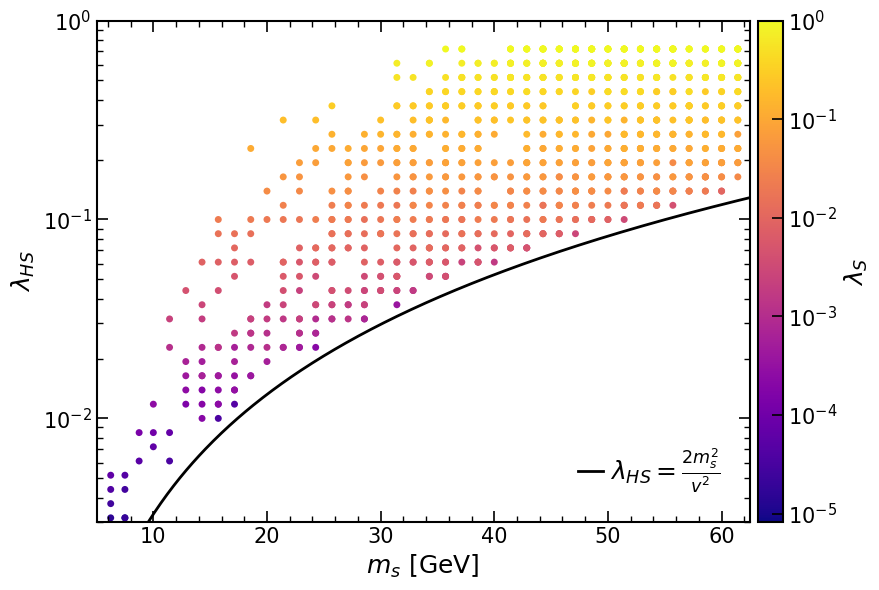

In [6]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

# lHS curve
mS = np.linspace(0,70, 500)
a2 = 2*mS**2/246.22**2

cmap = plt.cm.plasma
norm = LogNorm(vmin=df['lS'].min(), vmax=df['lS'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))

ax.scatter(df['m2'], df['lHS'], c=df['lS'], cmap=cmap, norm=norm,
                 s=25, alpha=1, edgecolors='None')
ax.plot(mS, a2, label=r'$\lambda_{HS}=\frac{2m_s^2}{v^2}$', ls='-', c='k', lw=2)

ax.set_xlabel(r'$m_s \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$\lambda_S$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

# Log-scale colorbar ticks
cbar.ax.yaxis.set_major_locator(LogLocator(base=10))
cbar.ax.yaxis.set_major_formatter(LogFormatterSciNotation())
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10, subs=np.arange(2, 10)*0.1))

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)
cbar.ax.minorticks_off()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_m2-lHS.pdf", format="pdf", bbox_inches="tight")
plt.show()

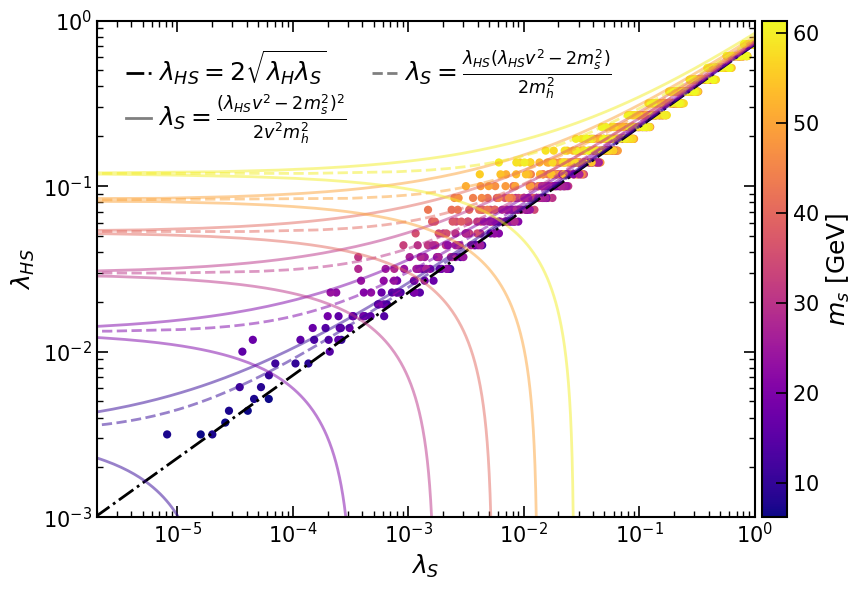

In [30]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

cmap = plt.cm.plasma
norm = Normalize(vmin=df['m2'].min(), vmax=df['m2'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))


# SM values (adjust if you're using different fixed values)
m1 = 125.20  # GeV
v0 = 246.22   # GeV
lH = 0.5*m1**2/v0**2

def lS_min(lHS, m2):
    return (lHS * v0**2 - 2 * m2**2)**2 / (2 * v0**2 * m1**2)

def lS_JM(lHS, m2):
    return (lHS * (lHS*v0**2 - 2 * m2**2)) / (2 * m1**2)

lHS_vals = np.geomspace(1e-3, 1e0, 300)
LSCrit   = lHS_vals**2/(4*lH)
ax.plot(LSCrit, lHS_vals, c='k', lw=2, ls='-.')

m2_lines = [10, 20, 30, 40, 50, 60]

for m2_i in m2_lines:
    lS_curve = lS_min(lHS_vals, m2_i)
    lSJM_curve = lS_JM(lHS_vals, m2_i)
    ax.plot(lS_curve, lHS_vals, color=cmap(norm(m2_i)), alpha=0.5, linewidth=2)
    ax.plot(lSJM_curve, lHS_vals, color=cmap(norm(m2_i)), alpha=0.5, linewidth=2, ls='--')

sc = ax.scatter(df['lS'], df['lHS'], c=df['m2'], cmap=cmap, norm=norm,
                 s=35, alpha=1, edgecolors='None')

ax.set_xlabel(r'$\lambda_S$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_xlim(2e-6, 1e0)
ax.set_ylim(1e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$m_s\ [\mathrm{GeV}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((-2, 3))
cbar.ax.yaxis.set_major_formatter(fmt)
cbar.ax.yaxis.get_offset_text().set_fontsize(15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

handles_list = [mlines.Line2D([], [], color='k', linestyle='-.', linewidth=2, alpha=1, label=r"$\lambda_{HS}=2\sqrt{\lambda_H \lambda_S}$"),
                mlines.Line2D([], [], color='k', linestyle='-', linewidth=2, alpha=0.5, label=r"$\lambda_S=\frac{(\lambda_{HS}v^2 - 2m_s^2)^2}{2v^2m_h^2}$"),
                mlines.Line2D([], [], color='k', linestyle='--', linewidth=2, alpha=0.5, label=r"$\lambda_S=\frac{\lambda_{HS}(\lambda_{HS}v^2 - 2m_s^2)}{2m_h^2}$")]

plt.legend(handles=handles_list, fontsize=18, frameon=True, fancybox=False, loc = "upper left", bbox_to_anchor=(0.01, 0.99),
               ncol = 2, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_lS-lHS.pdf", format="pdf", bbox_inches="tight")
plt.show()

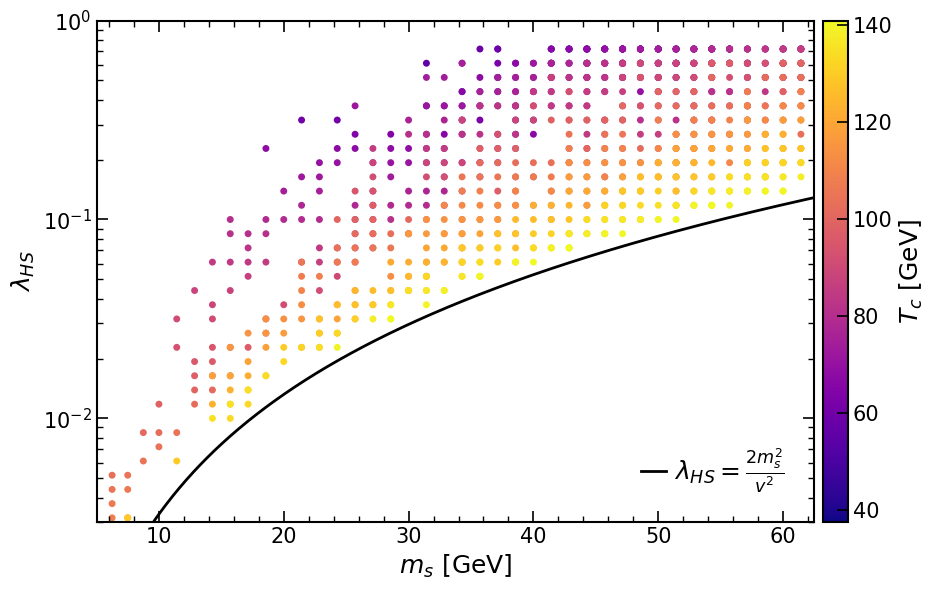

In [122]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

# lHS curve
mS = np.linspace(0,70, 500)
a2 = 2*mS**2/246.22**2

cmap = plt.cm.plasma
norm = Normalize(vmin=df['Tc'].min(), vmax=df['Tc'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9.71, 6))

ax.scatter(df['m2'], df['lHS'], c=df['Tc'], cmap=cmap, norm=norm,
                 s=25, alpha=1, edgecolors='None')
ax.plot(mS, a2, label=r'$\lambda_{HS}=\frac{2m_s^2}{v^2}$', ls='-', c='k', lw=2)

ax.set_xlabel(r'$m_s \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$T_c \ [\mathrm{GeV}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)
cbar.ax.minorticks_off()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_m2-lHS_Tc.pdf", format="pdf", bbox_inches="tight")
plt.show()

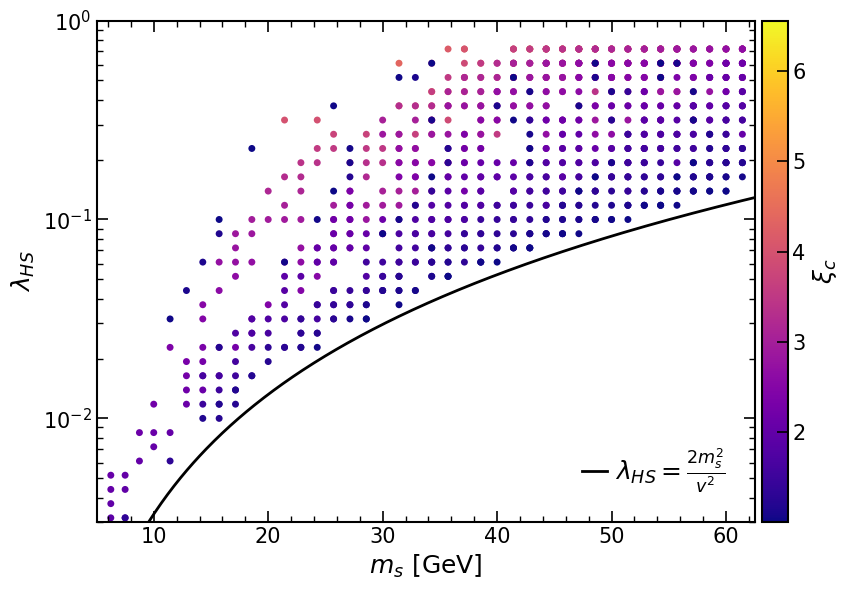

In [12]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

# lHS curve
mS = np.linspace(0,70, 500)
a2 = 2*mS**2/246.22**2

cmap = plt.cm.plasma
norm = Normalize(vmin=df['xic'].min(), vmax=df['xic'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))

ax.scatter(df['m2'], df['lHS'], c=df['xic'], cmap=cmap, norm=norm,
                 s=25, alpha=1, edgecolors='None')
ax.plot(mS, a2, label=r'$\lambda_{HS}=\frac{2m_s^2}{v^2}$', ls='-', c='k', lw=2)

ax.set_xlabel(r'$m_s \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$\xi_c$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)
cbar.ax.minorticks_off()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_m2-lHS_xic.pdf", format="pdf", bbox_inches="tight")
plt.show()

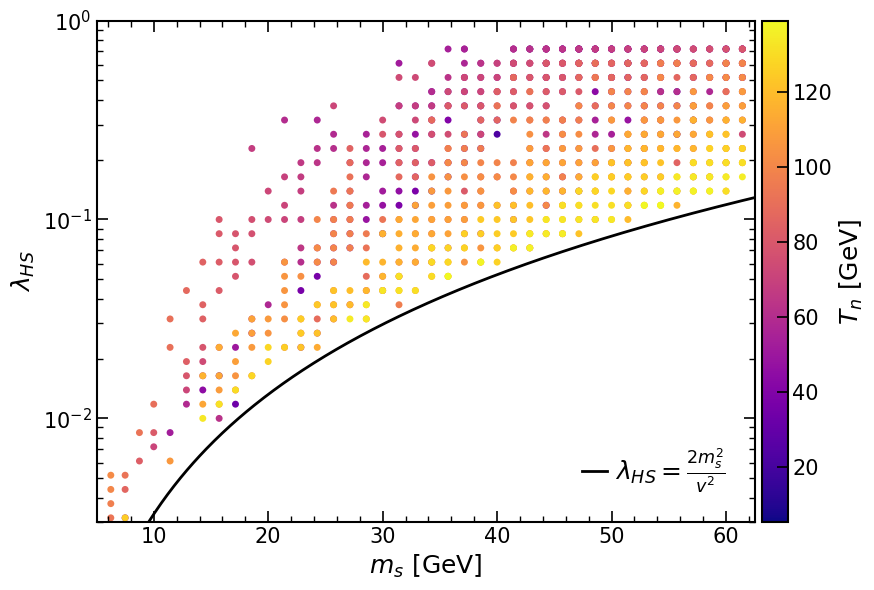

In [10]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

# lHS curve
mS = np.linspace(0,70, 500)
a2 = 2*mS**2/246.22**2

cmap = plt.cm.plasma
norm = Normalize(vmin=df['Tn'].min(), vmax=df['Tn'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))

ax.scatter(df['m2'], df['lHS'], c=df['Tn'], cmap=cmap, norm=norm,
                 s=25, alpha=1, edgecolors='None')
ax.plot(mS, a2, label=r'$\lambda_{HS}=\frac{2m_s^2}{v^2}$', ls='-', c='k', lw=2)

ax.set_xlabel(r'$m_s \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$T_n \ [\mathrm{GeV}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)
cbar.ax.minorticks_off()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_m2-lHS_Tn.pdf", format="pdf", bbox_inches="tight")
plt.show()

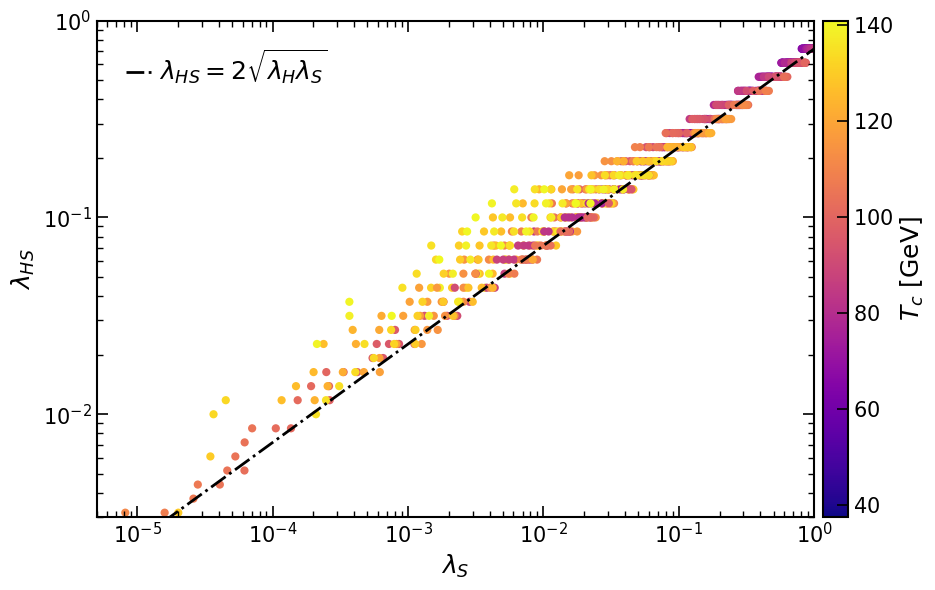

In [126]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

cmap = plt.cm.plasma
norm = Normalize(vmin=df['Tc'].min(), vmax=df['Tc'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9.71, 6))


# SM values (adjust if you're using different fixed values)
m1 = 125.20  # GeV
v0 = 246.22   # GeV
lH = 0.5*m1**2/v0**2

def lS_min(lHS, m2):
    return (lHS * v0**2 - 2 * m2**2)**2 / (2 * v0**2 * m1**2)

def lS_JM(lHS, m2):
    return (lHS * (lHS*v0**2 - 2 * m2**2)) / (2 * m1**2)

lHS_vals = np.geomspace(1e-3, 1e0, 300)
LSCrit   = lHS_vals**2/(4*lH)
ax.plot(LSCrit, lHS_vals, c='k', lw=2, ls='-.')

sc = ax.scatter(df['lS'], df['lHS'], c=df['Tc'], cmap=cmap, norm=norm,
                 s=35, alpha=1, edgecolors='None')

ax.set_xlabel(r'$\lambda_S$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_xlim(5e-6, 1e0)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$T_c\ [\mathrm{GeV}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((-2, 3))
cbar.ax.yaxis.set_major_formatter(fmt)
cbar.ax.yaxis.get_offset_text().set_fontsize(15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

handles_list = [mlines.Line2D([], [], color='k', linestyle='-.', linewidth=2, alpha=1, label=r"$\lambda_{HS}=2\sqrt{\lambda_H \lambda_S}$")]

plt.legend(handles=handles_list, fontsize=18, frameon=True, fancybox=False, loc = "upper left", bbox_to_anchor=(0.01, 0.99),
               ncol = 2, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_lS-lHS_Tc.pdf", format="pdf", bbox_inches="tight")
plt.show()

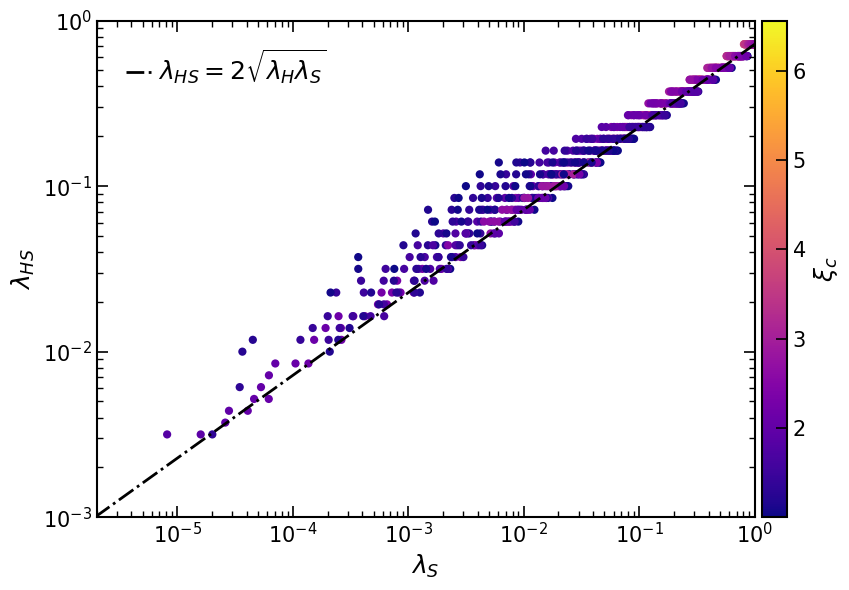

In [13]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

cmap = plt.cm.plasma
norm = Normalize(vmin=df['xic'].min(), vmax=df['xic'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))


# SM values (adjust if you're using different fixed values)
m1 = 125.20  # GeV
v0 = 246.22   # GeV
lH = 0.5*m1**2/v0**2

def lS_min(lHS, m2):
    return (lHS * v0**2 - 2 * m2**2)**2 / (2 * v0**2 * m1**2)

def lS_JM(lHS, m2):
    return (lHS * (lHS*v0**2 - 2 * m2**2)) / (2 * m1**2)

lHS_vals = np.geomspace(1e-3, 1e0, 300)
LSCrit   = lHS_vals**2/(4*lH)
ax.plot(LSCrit, lHS_vals, c='k', lw=2, ls='-.')

sc = ax.scatter(df['lS'], df['lHS'], c=df['xic'], cmap=cmap, norm=norm,
                 s=35, alpha=1, edgecolors='None')

ax.set_xlabel(r'$\lambda_S$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_xlim(2e-6, 1e0)
ax.set_ylim(1e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$\xi_c$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((-2, 3))
cbar.ax.yaxis.set_major_formatter(fmt)
cbar.ax.yaxis.get_offset_text().set_fontsize(15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

handles_list = [mlines.Line2D([], [], color='k', linestyle='-.', linewidth=2, alpha=1, label=r"$\lambda_{HS}=2\sqrt{\lambda_H \lambda_S}$")]

plt.legend(handles=handles_list, fontsize=18, frameon=True, fancybox=False, loc = "upper left", bbox_to_anchor=(0.01, 0.99),
               ncol = 2, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_lS-lHS_xic.pdf", format="pdf", bbox_inches="tight")
plt.show()

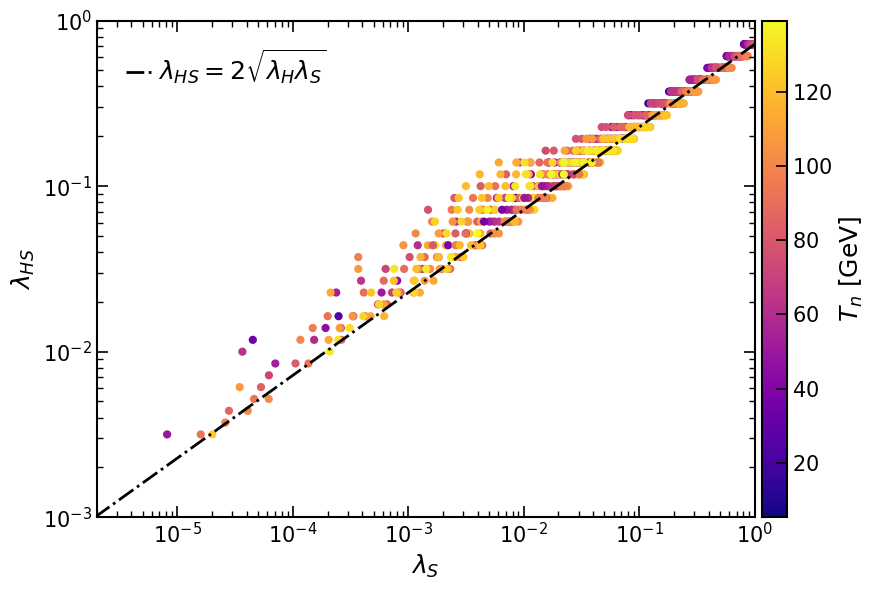

In [11]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

cmap = plt.cm.plasma
norm = Normalize(vmin=df['Tn'].min(), vmax=df['Tn'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(9, 6))


# SM values (adjust if you're using different fixed values)
m1 = 125.20  # GeV
v0 = 246.22   # GeV
lH = 0.5*m1**2/v0**2

def lS_min(lHS, m2):
    return (lHS * v0**2 - 2 * m2**2)**2 / (2 * v0**2 * m1**2)

def lS_JM(lHS, m2):
    return (lHS * (lHS*v0**2 - 2 * m2**2)) / (2 * m1**2)

lHS_vals = np.geomspace(1e-3, 1e0, 300)
LSCrit   = lHS_vals**2/(4*lH)
ax.plot(LSCrit, lHS_vals, c='k', lw=2, ls='-.')

sc = ax.scatter(df['lS'], df['lHS'], c=df['Tn'], cmap=cmap, norm=norm,
                 s=35, alpha=1, edgecolors='None')

ax.set_xlabel(r'$\lambda_S$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')
ax.set_xscale('log')

ax.set_xlim(2e-6, 1e0)
ax.set_ylim(1e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$T_n\ [\mathrm{GeV}]$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((-2, 3))
cbar.ax.yaxis.set_major_formatter(fmt)
cbar.ax.yaxis.get_offset_text().set_fontsize(15)

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)

handles_list = [mlines.Line2D([], [], color='k', linestyle='-.', linewidth=2, alpha=1, label=r"$\lambda_{HS}=2\sqrt{\lambda_H \lambda_S}$")]

plt.legend(handles=handles_list, fontsize=18, frameon=True, fancybox=False, loc = "upper left", bbox_to_anchor=(0.01, 0.99),
               ncol = 2, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)

plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_lS-lHS_Tn.pdf", format="pdf", bbox_inches="tight")
plt.show()

## Experimental Bounds

In [20]:
def diagnose_point(lHS, mS):
    pred, h = build_predictions(lHS, mS)

    br_inv = h.br("inv")
    hb_res = bounds(pred)

    print(f"lambda_HS = {lHS:.4e},  m_S = {mS:.1f} GeV")
    print(f"BR(h->inv) = {br_inv:.4f}")
    print(f"Verdict: {'ALLOWED' if hb_res.allowed else 'EXCLUDED'} at 95% CL\n")

    # the single most sensitive limit HiggsBounds picked out for "h"
    for pid, lim in hb_res.selectedLimits.items():
        L = lim.limit()
        print(f"Selected limit for particle '{pid}':")
        print(f"  process:     {L.processDesc()}")
        print(f"  reference:   {L.reference()}   (cite key: {L.citeKey()})")
        print(f"  experiment:  {L.experiment()} @ {L.collider()}, "
              f"{L.luminosity():.1f} fb^-1")
        print(f"  obsRatio:    {lim.obsRatio():.3f}  "
              f"({'>1 -> excludes the point' if lim.obsRatio() > 1 else '<1 -> does not exclude'})")
        print(f"  expRatio:    {lim.expRatio():.3f}")

    # optionally: every limit that was even checked, not just the
    # single most sensitive one HiggsBounds selected
    print(f"\nAll {len(hb_res.appliedLimits)} applied limits (sorted by sensitivity):")
    for lim in hb_res.appliedLimits[:5]:   # top 5 most sensitive
        L = lim.limit()
        print(f"  {L.reference():15s}  obsRatio={lim.obsRatio():.3f}  "
              f"expRatio={lim.expRatio():.3f}  ({L.processDesc()})")

diagnose_point(lHS=2e-2, mS=40.0)

lambda_HS = 2.0000e-02,  m_S = 40.0 GeV
BR(h->inv) = 0.2669
Verdict: EXCLUDED at 95% CL

Selected limit for particle 'h':
  process:     LHC13 [HW,Htt,H,HZ]>[inv]
  reference:   2301.10731   (cite key: ATLAS:2023tkt)
  experiment:  Experiment.ATLAS @ Collider.LHC13, 164.0 fb^-1
  obsRatio:    2.494  (>1 -> excludes the point)
  expRatio:    3.466

All 48 applied limits (sorted by sensitivity):
  2301.10731       obsRatio=2.494  expRatio=3.466  (LHC13 [HW,Htt,H,HZ]>[inv])
  CMS-PAS-HIG-12-045  obsRatio=0.579  expRatio=2.971  (LHC8 [vbfH,HW,Htt,H,HZ]>[bb,tautau,WW,ZZ,gamgam])
  1312.5353        obsRatio=0.462  expRatio=2.698  (LHC8 [vbfH,HW,Htt,H,HZ]>[ZZ])
  1312.1129        obsRatio=0.609  expRatio=1.823  (LHC8 [ggH,vbfH,HW,HZ]>[WW])
  CMS-PAS-HIG-13-003  obsRatio=0.640  expRatio=1.812  (LHC8 [H>WW])


In [6]:
import numpy as np
import Higgs.predictions as HP
import Higgs.bounds as HB
import Higgs.signals as HS

# -----------------------------------------------------------------
# Physics: partial width Gamma(h -> SS) in the Z2-preserving limit
# -----------------------------------------------------------------
v  = 246.22   # GeV
mh = 125   # GeV

def gamma_hss(lHS, mS):
    """Gamma(h1->h2h2) with h1->h, h2->S, lambda_{h1h2h2} -> lHS."""
    if mS >= mh / 2:
        return 0.0
    beta = np.sqrt(1.0 - 4.0 * mS**2 / mh**2)
    return (v**2 * lHS**2) / (32.0 * np.pi * mh) * beta

# -----------------------------------------------------------------
# HiggsTools setup (load datasets once, reuse for every point)
# -----------------------------------------------------------------
bounds  = HB.Bounds('/home/diegogt/hbdataset/')
signals = HS.Signals('/home/diegogt/hsdataset')

def build_predictions(lHS, mS):
    pred = HP.Predictions()
    h = pred.addParticle(HP.BsmParticle("h", charge="neutral", cp="even"))
    h.setMass(mh)

    # Z2-preserving case: kappa = 1 for everything, i.e. h is exactly
    # SM-like at tree level. This sets all SM cxns/BRs/total width.
    HP.effectiveCouplingInput(h, HP.smLikeEffCouplings)

    # Add the extra invisible partial width on top. setDecayWidth
    # automatically renormalizes the total width and dilutes every
    # other (SM) BR consistently -- this is exactly the "signal
    # strength" dilution effect from before.
    Gamma_inv = gamma_hss(lHS, mS)
    if Gamma_inv > 0:
        h.setDecayWidth("directInv", Gamma_inv)

    return pred, h

def check_point(lHS, mS, verbose=False):
    pred, h = build_predictions(lHS, mS)

    br_inv  = h.br("inv")     # full invisible BR as HiggsTools computes it
    hb_res  = bounds(pred)    # HiggsBounds: exclusion check
    hs_chi2 = signals(pred)   # HiggsSignals: chi^2 vs. measured signal strengths

    if verbose:
        print(f"lambda_HS={lHS:.3e}  m_S={mS:.1f} GeV  BR_inv={br_inv:.4f}")
        print(f"  HiggsBounds allowed: {hb_res.allowed}")
        for pid, lim in hb_res.selectedLimits.items():
            print(f"    {pid}: obsRatio={lim.obsRatio():.3f} "
                  f"({lim.limit().reference()})")
        print(f"  HiggsSignals chi2: {hs_chi2:.2f}")

    return hb_res.allowed, br_inv, hs_chi2

# -----------------------------------------------------------------
# Example: scan the (lambda_HS, m_S) plane and compare to your
# analytic bound from last time as a sanity check
# -----------------------------------------------------------------
lHS_grid = np.geomspace(9e-3, 5e-2, 100)
mS_grid  = np.linspace(1, 125/2, 100)   # GeV, up to just below m_h/2

rows = []
for mS in mS_grid:
    for lHS in lHS_grid:
        allowed, br_inv, chi2 = check_point(lHS, mS)
        rows.append((lHS, mS, br_inv, allowed, chi2))

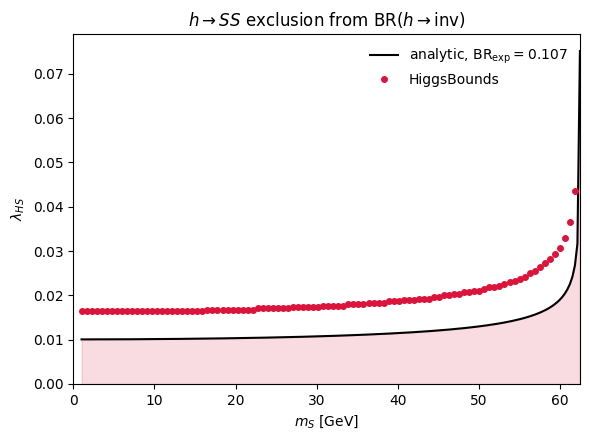

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# -----------------------------------------------------------------
# 1. Rows -> DataFrame (and save, same pattern as your other scans)
# -----------------------------------------------------------------
df = pd.DataFrame(rows, columns=["lHS", "mS", "BR_inv", "HB_allowed", "HS_chi2"])
df.to_csv("hss_invisible_scan.csv", index=False)

# -----------------------------------------------------------------
# 2. Extract the HiggsBounds exclusion boundary: for each m_S, the
#    smallest lambda_HS that gets excluded (HB_allowed == False)
# -----------------------------------------------------------------
def hb_boundary(df):
    boundary = []
    for mS, group in df.groupby("mS"):
        excluded = group[~group["HB_allowed"]]
        if len(excluded) > 0:
            boundary.append((mS, excluded["lHS"].min()))
    return pd.DataFrame(boundary, columns=["mS", "lHS_bound"])

hb_curve = hb_boundary(df)

# -----------------------------------------------------------------
# 3. Your analytic curve, Eq. (lHSbound), for the same m_S grid
# -----------------------------------------------------------------
def lHS_bound_analytic(mS, BR_exp=0.107, Gamma_SM=4.07e-3):
    beta = np.sqrt(1 - 4 * mS**2 / mh**2)
    return np.sqrt((32 * np.pi * mh) / (v**2 * beta) * (BR_exp / (1 - BR_exp)) * Gamma_SM)

mS_fine = np.linspace(1, 62.49, 200)
lHS_analytic = [lHS_bound_analytic(m) for m in mS_fine]

# -----------------------------------------------------------------
# 4. Plot: analytic curve vs. HiggsTools exclusion boundary
# -----------------------------------------------------------------
fig, ax = plt.subplots(figsize=(6, 4.5))
ax.plot(mS_fine, lHS_analytic, color="k", lw=1.5, label=r"analytic, BR$_{\rm exp}=0.107$")
ax.plot(hb_curve["mS"], hb_curve["lHS_bound"], "o", ms=4,
        color="crimson", label="HiggsBounds")

ax.fill_between(mS_fine, 0, lHS_analytic, color="crimson", alpha=0.15)
ax.set_xlabel(r"$m_S$ [GeV]")
ax.set_ylabel(r"$\lambda_{HS}$")
ax.set_xlim(0, mh/2)
ax.set_ylim(bottom=0)
ax.legend(frameon=False)
ax.set_title(r"$h\to SS$ exclusion from BR$(h\to\mathrm{inv})$")
fig.tight_layout()
fig.savefig("BRinv_exclusion.pdf")

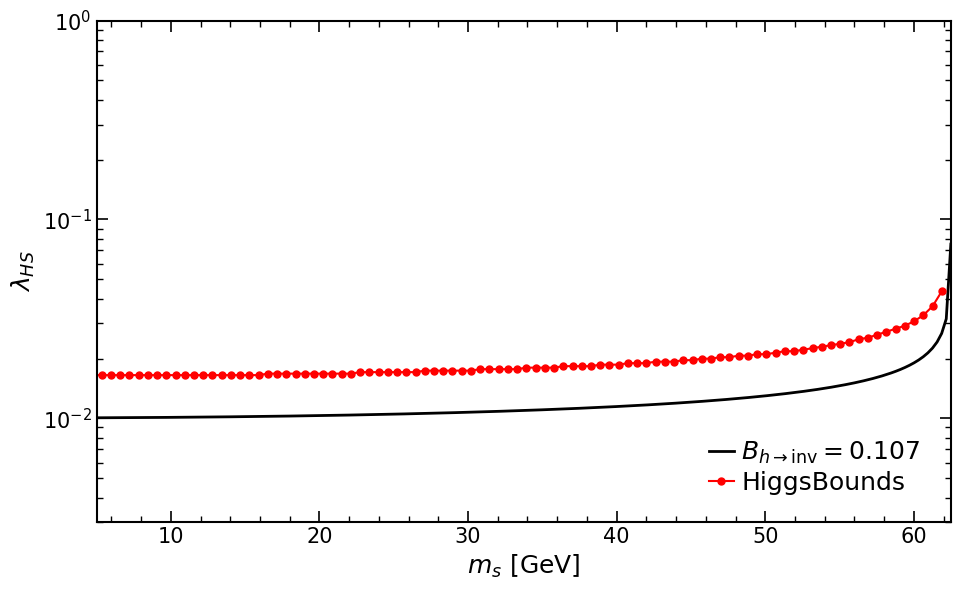

In [17]:
fig, ax = plt.subplots(figsize=(9.71, 6))
ax.plot(mS_fine, lHS_analytic, color="k", ls='-', lw=2, label=r"$B_{h\to\mathrm{inv}}=0.107$")
ax.plot(hb_curve["mS"], hb_curve["lHS_bound"], "-o", ms=5, color="r", label="HiggsBounds")

ax.set_xlabel(r'$m_s \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("BRinv_exclusion.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [22]:
def lHS_bound(ms, BR_exp=0.107, Gamma_SM=4.1e-3, mh=125):
    radicand = 1 - 4 * ms**2/mh**2
    radicand = np.where(radicand>=0, radicand, np.nan)

    return np.sqrt((32 * np.pi * mh) / (v**2 * np.sqrt(radicand)) * (BR_exp / (1 - BR_exp)) * Gamma_SM)

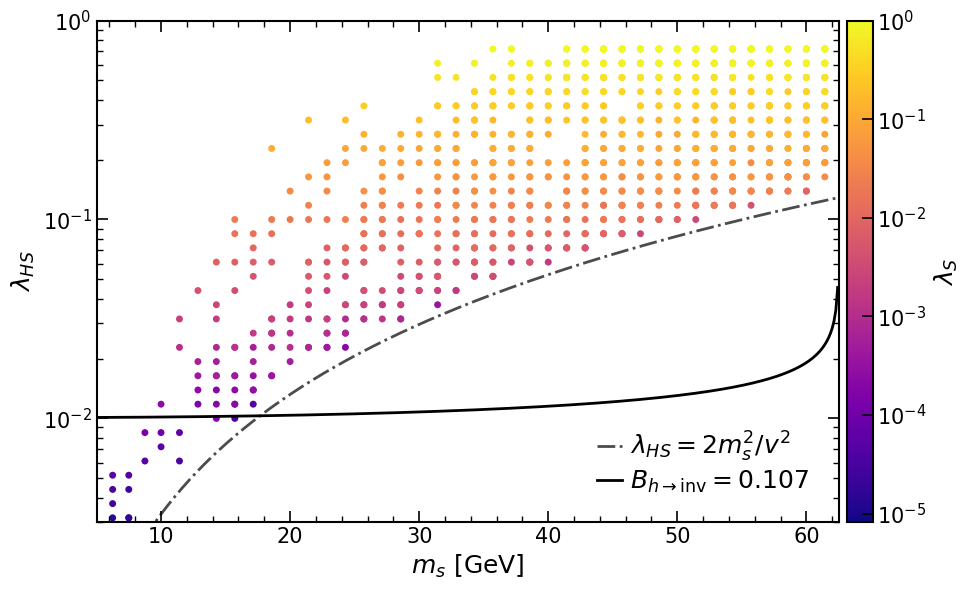

In [29]:
df = Df[(Df.status=='Nucleation_FOPT')&(Df.xic>1)&(Df.m2<125/2)]

# lHS curve
mS = np.linspace(0,70, 500)
a2 = 2*mS**2/246.22**2
lHS_Bound = lHS_bound(mS)

cmap = plt.cm.plasma
norm = LogNorm(vmin=df['lS'].min(), vmax=df['lS'].max())
sm   = ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(df['m2'], df['lHS'], c=df['lS'], cmap=cmap, norm=norm, s=25, alpha=1, edgecolors='None')
ax.plot(mS, a2, label=r'$\lambda_{HS}={2m_s^2}/{v^2}$', ls='-.', c='k', lw=2, alpha=0.7)
ax.plot(mS, lHS_Bound, color="k", ls='-', lw=2, label=r"$B_{h\to\mathrm{inv}}=0.107$")

ax.set_xlabel(r'$m_s \ [\mathrm{GeV}]$', fontsize=18)
ax.set_ylabel(r'$\lambda_{HS}$', fontsize=18)
ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax.ticklabel_format(style='sci', axis='y', scilimits=(-2, 2))
ax.yaxis.get_offset_text().set_fontsize(15)
ax.set_yscale('log')


ax.set_xlim(5, 125/2)
ax.set_ylim(3e-3, 1e0)

for spine in ax.spines.values():
    spine.set_linewidth(1.5)

ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15, top=True, right=True)
ax.tick_params(axis='both', which='minor', direction='in',
               length=4, width=1, labelsize=15, top=True, right=True)
ax.minorticks_on()

cbar = fig.colorbar(sm, ax=ax, pad=0.01)
cbar.set_label(r'$\lambda_S$', fontsize=18)
cbar.ax.tick_params(labelsize=15)

# Log-scale colorbar ticks
cbar.ax.yaxis.set_major_locator(LogLocator(base=10))
cbar.ax.yaxis.set_major_formatter(LogFormatterSciNotation())
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10, subs=np.arange(2, 10)*0.1))

for spine in cbar.ax.spines.values():
    spine.set_linewidth(1.5)
cbar.ax.tick_params(axis='both', which='major', direction='in',
               length=8, width=1.2, labelsize=15)
cbar.ax.minorticks_off()

plt.legend(fontsize=18, frameon=True, fancybox=False, loc = "lower right", bbox_to_anchor=(0.99, 0.01),
               ncol = 1, edgecolor="black", framealpha=0, labelspacing=0.2, handletextpad=0.3, handlelength=1, columnspacing=1)


plt.tight_layout()
plt.savefig("Figures/Scan/Z2_Nucleation_Scan_m2-lHS_Bounds.pdf", format="pdf", bbox_inches="tight")
plt.show()